In [23]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc,roc_auc_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import ShuffleSplit


#col_Names=["Class", "AGE", "SEX", "STEROID","ANTIVIRALS", "FATIGUE", "MALAISE", "ANOREXIA","LIVER BIG", "LIVER FIRM", "SPLEEN PALPABLE", "SPIDERS","ASCITES", "VARICES", "ALK PHOSPHATE","BILIRUBIN", "SGOT","ALBUMIN", "PROTIME", "HISTOLOGY"]
data = pd.read_csv('D:/IBA MSCS/Semester1/MachineLearning/RWork & Assignment/Assignment8_SVM/hepititis/hepatitis.csv')


In [24]:
#data.head()
hepatitis_df = data
hepatitis_df.dtypes

age                  int64
sex                 object
steroid             object
antivirals            bool
fatigue             object
malaise             object
anorexia            object
liver_big           object
liver_firm          object
spleen_palpable     object
spiders             object
ascites             object
varices             object
bilirubin          float64
alk_phosphate      float64
sgot               float64
albumin            float64
protime            float64
histology             bool
class               object
dtype: object

In [25]:
hepatitis_df.isnull().sum()

age                 0
sex                 0
steroid             1
antivirals          0
fatigue             1
malaise             1
anorexia            1
liver_big          10
liver_firm         11
spleen_palpable     5
spiders             5
ascites             5
varices             5
bilirubin           6
alk_phosphate      29
sgot                4
albumin            16
protime            67
histology           0
class               0
dtype: int64

In [26]:
hepatitis_df['steroid'].fillna(hepatitis_df['steroid'].mode()[0], inplace = True)
hepatitis_df['fatigue'].fillna(hepatitis_df['fatigue'].mode()[0], inplace = True)
hepatitis_df['malaise'].fillna(hepatitis_df['malaise'].mode()[0], inplace = True)
hepatitis_df['anorexia'].fillna(hepatitis_df['anorexia'].mode()[0], inplace = True)
hepatitis_df['liver_big'].fillna(hepatitis_df['liver_big'].mode()[0], inplace = True)
hepatitis_df['liver_firm'].fillna(hepatitis_df['liver_firm'].mode()[0], inplace = True)
hepatitis_df['spleen_palpable'].fillna(hepatitis_df['spleen_palpable'].mode()[0], inplace = True)
hepatitis_df['spiders'].fillna(hepatitis_df['spiders'].mode()[0], inplace = True)
hepatitis_df['ascites'].fillna(hepatitis_df['ascites'].mode()[0], inplace = True)
hepatitis_df['varices'].fillna(hepatitis_df['varices'].mode()[0], inplace = True)

hepatitis_df['bilirubin'].fillna(hepatitis_df['bilirubin'].mean(), inplace = True)
hepatitis_df['alk_phosphate'].fillna(hepatitis_df['alk_phosphate'].mean(), inplace = True)
hepatitis_df['sgot'].fillna(hepatitis_df['sgot'].mean(), inplace = True)
hepatitis_df['protime'].fillna(hepatitis_df['protime'].mean(), inplace = True)
hepatitis_df['histology'].fillna(hepatitis_df['histology'].mode()[0], inplace = True)

hepatitis_df['albumin'].fillna(hepatitis_df['albumin'].mean(), inplace = True)

In [27]:
le = preprocessing.LabelEncoder()
hepatitis_df['sex'] = le.fit_transform(hepatitis_df['sex'])
hepatitis_df['steroid'] = le.fit_transform(hepatitis_df['steroid'])
hepatitis_df['antivirals'] = le.fit_transform(hepatitis_df['antivirals'])
hepatitis_df['fatigue'] = le.fit_transform(hepatitis_df['fatigue'])
hepatitis_df['malaise'] = le.fit_transform(hepatitis_df['malaise'])
hepatitis_df['anorexia'] = le.fit_transform(hepatitis_df['anorexia'])
hepatitis_df['liver_big'] = le.fit_transform(hepatitis_df['liver_big'])
hepatitis_df['liver_firm'] = le.fit_transform(hepatitis_df['liver_firm'])
hepatitis_df['spleen_palpable'] = le.fit_transform(hepatitis_df['spleen_palpable'])
hepatitis_df['spiders'] = le.fit_transform(hepatitis_df['spiders'])
hepatitis_df['varices'] = le.fit_transform(hepatitis_df['varices'])
hepatitis_df['ascites'] = le.fit_transform(hepatitis_df['ascites'])
hepatitis_df['histology'] = le.fit_transform(hepatitis_df['histology'])
hepatitis_df['class'] = le.fit_transform(hepatitis_df['class'])

In [28]:
hepatitis_df.head()

,age,sex,steroid,antivirals,fatigue,malaise,anorexia,liver_big,liver_firm,spleen_palpable,spiders,ascites,varices,bilirubin,alk_phosphate,sgot,albumin,protime,histology,class
0,30,1,0,0,0,0,0,0,0,0,0,0,0,1.0,85.000000,18.0,4.0,61.852273,0,1
1,50,0,0,0,1,0,0,0,0,0,0,0,0,0.9,135.000000,42.0,3.5,61.852273,0,1
2,78,0,1,0,1,0,0,1,0,0,0,0,0,0.7,96.000000,32.0,4.0,61.852273,0,1
3,31,0,1,1,0,0,0,1,0,0,0,0,0,0.7,46.000000,52.0,4.0,80.000000,0,1
4,34,0,1,0,0,0,0,1,0,0,0,0,0,1.0,105.325397,200.0,4.0,61.852273,0,1


In [29]:
hepatitis_df.corr()['class']

age               -0.219647
sex                0.173051
steroid            0.137413
antivirals         0.130196
fatigue           -0.306049
malaise           -0.339530
anorexia          -0.133638
liver_big         -0.093665
liver_firm        -0.020057
spleen_palpable   -0.234261
spiders           -0.389137
ascites           -0.469334
varices           -0.362385
bilirubin         -0.450470
alk_phosphate     -0.141005
sgot              -0.075579
albumin            0.465827
protime            0.307238
histology         -0.337856
class              1.000000
Name: class, dtype: float64

In [30]:
test_data = pd.DataFrame(hepatitis_df['class'])
train_data = hepatitis_df.drop(['class'], axis=1)

hp_xtrain, hp_xtest, hp_ytrain, hp_ytest = train_test_split(train_data, test_data, test_size=0.2)



# Running KNN Model

In [81]:
for i in range(1,10):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(hp_xtrain, hp_ytrain)
    hp_ypred = knn.predict(hp_xtest)
    print(i)
    print("Accuracy:",metrics.accuracy_score(hp_ytest, hp_ypred))

1
Accuracy: 0.774193548387
2
Accuracy: 0.612903225806
3
Accuracy: 0.838709677419
4
Accuracy: 0.806451612903
5
Accuracy: 0.838709677419
6
Accuracy: 0.774193548387
7
Accuracy: 0.870967741935
8
Accuracy: 0.806451612903
9
Accuracy: 0.870967741935


In [80]:
pp = [1,2,3] #power parameter
w= np.array(['uniform','distance']) #weight
alg = np.array(['auto','brute','ball_tree','kd_tree']) #algo
for i in range(1,10):
    for j in alg:
        for k in w:
            for power_param in pp:
                knn = KNeighborsClassifier(n_neighbors=i, algorithm=j, weights = k,p = power_param)
                knn.fit(hp_xtrain, hp_ytrain)
                hp_ypred = knn.predict(hp_xtest)
                print("N_Neighbours:  ", i , ', Algo: ', j , ', weight: ', k, ', PowerParameter: ', power_param)
                print("Accuracy:",metrics.accuracy_score(hp_ytest, hp_ypred))            
                print(classification_report(hp_ytest, hp_ypred))

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.20      0.50      0.29         2
          1       0.96      0.86      0.91        29

avg / total       0.91      0.84      0.87        31

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31

N_Neighbours:   1 , Algo:  auto , weight:  distance , PowerParam

Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31

N_Neighbours:   2 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31

N_Neighbours:   2 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.645161290323
             precision    recall  f1-score   support

          0       0.09      0.50      0.15         2
          1       0.95      0.66      0.78        29

avg / total       0.89      0.65      0.74        31

N_Neighbours:   2 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.612903225806
             precision    r

N_Neighbours:   4 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31

N_Neighbours:   4 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31

N_Neighbours:   4 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31

N_Neighbours:   4 , Algo:  kd_tree , weight:  

N_Neighbours:   6 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31

N_Neighbours:   6 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.92      0.83      0.87        29

avg / total       0.86      0.77      0.82        31

N_Neighbours:   6 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.92      0.79      0.85        29

avg / total       0.86      0.74      0.80        31

N_Neighbours:   6 , Algo:  ball_tree , weight:  d

N_Neighbours:   8 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31

N_Neighbours:   8 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31

N_Neighbours:   8 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31

N_Neighbours:   8 , Algo:  brute , weight:  distance , Powe

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 1  1]
 [ 4 25]]


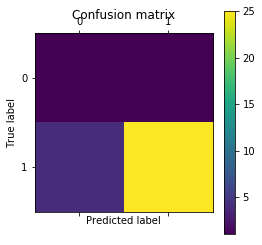



             precision    recall  f1-score   support

          0       0.20      0.50      0.29         2
          1       0.96      0.86      0.91        29

avg / total       0.91      0.84      0.87        31



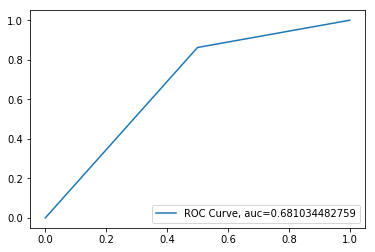

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


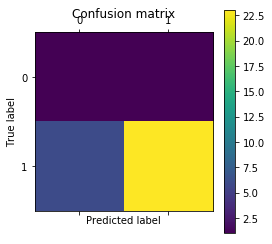



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



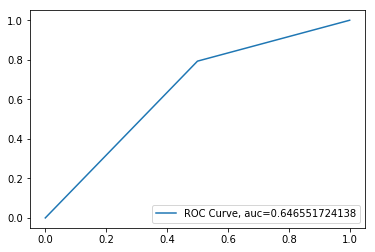

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


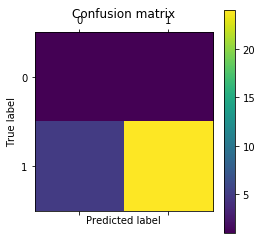



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



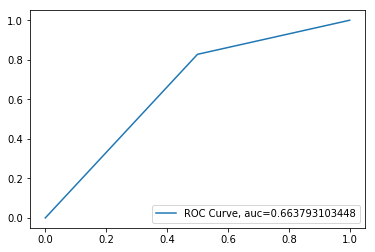

N_Neighbours:   1 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 1  1]
 [ 4 25]]


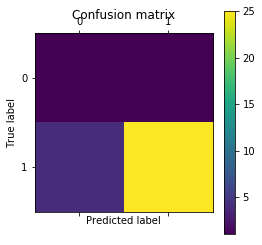



             precision    recall  f1-score   support

          0       0.20      0.50      0.29         2
          1       0.96      0.86      0.91        29

avg / total       0.91      0.84      0.87        31



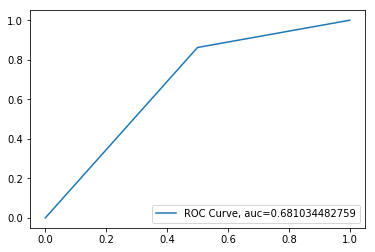

N_Neighbours:   1 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


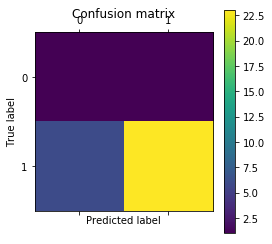



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



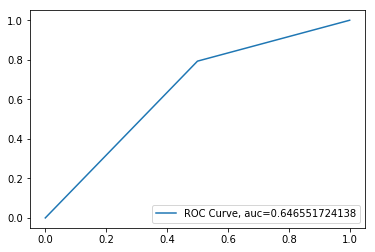

N_Neighbours:   1 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


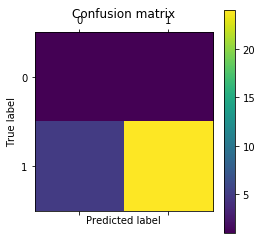



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



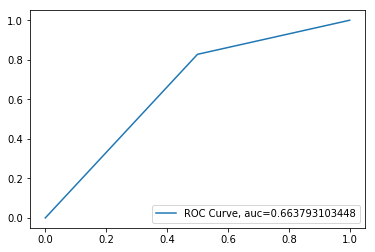

N_Neighbours:   1 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 1  1]
 [ 4 25]]


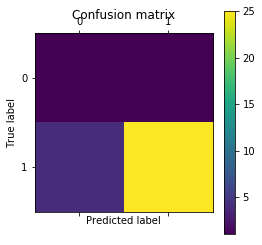



             precision    recall  f1-score   support

          0       0.20      0.50      0.29         2
          1       0.96      0.86      0.91        29

avg / total       0.91      0.84      0.87        31



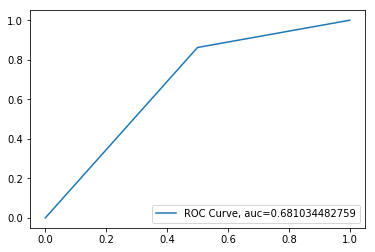

N_Neighbours:   1 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


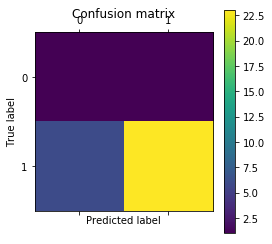



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



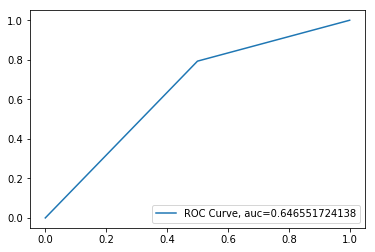

N_Neighbours:   1 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


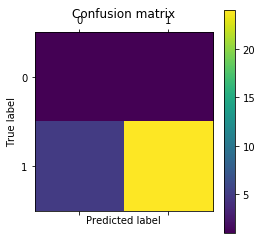



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



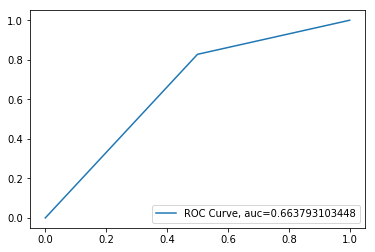

N_Neighbours:   1 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 1  1]
 [ 4 25]]


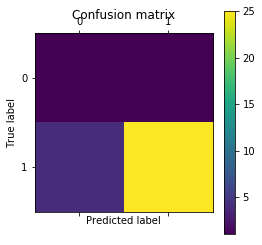



             precision    recall  f1-score   support

          0       0.20      0.50      0.29         2
          1       0.96      0.86      0.91        29

avg / total       0.91      0.84      0.87        31



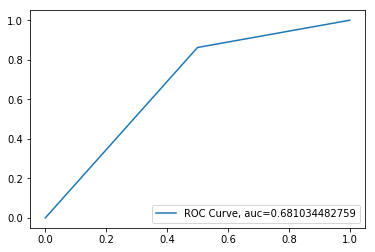

N_Neighbours:   1 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


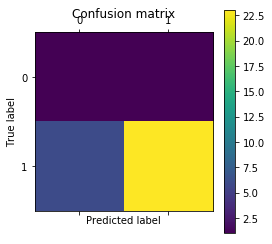



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



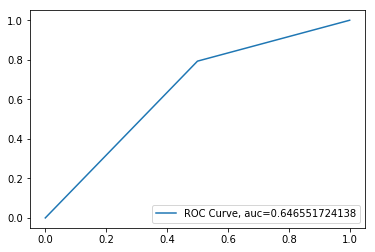

N_Neighbours:   1 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


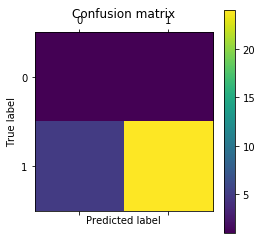



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



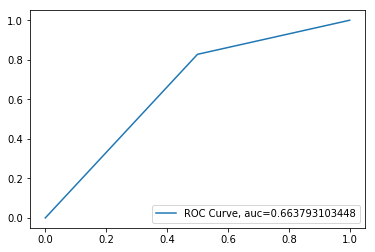

N_Neighbours:   1 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 1  1]
 [ 4 25]]


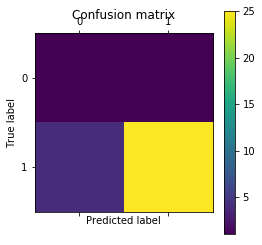



             precision    recall  f1-score   support

          0       0.20      0.50      0.29         2
          1       0.96      0.86      0.91        29

avg / total       0.91      0.84      0.87        31



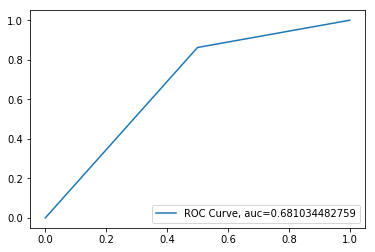

N_Neighbours:   1 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


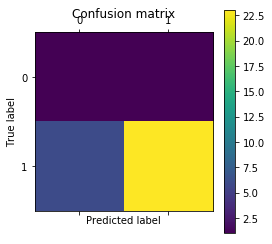



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



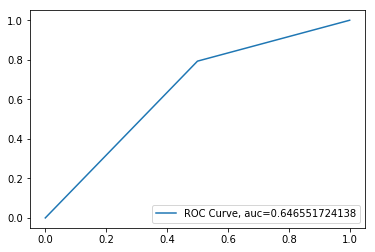

N_Neighbours:   1 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


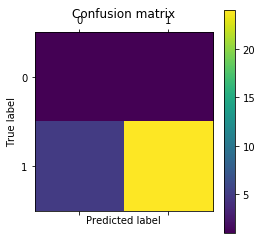



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



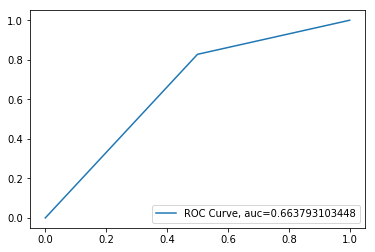

N_Neighbours:   1 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 1  1]
 [ 4 25]]


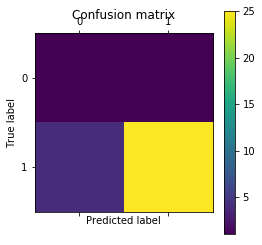



             precision    recall  f1-score   support

          0       0.20      0.50      0.29         2
          1       0.96      0.86      0.91        29

avg / total       0.91      0.84      0.87        31



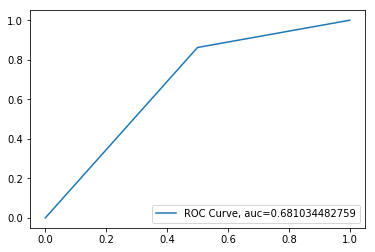

N_Neighbours:   1 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


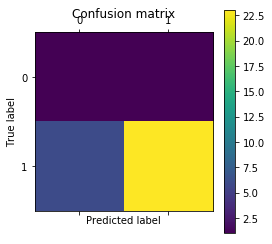



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



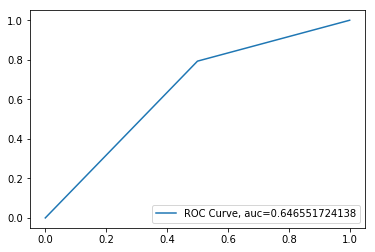

N_Neighbours:   1 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


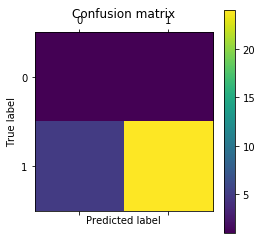



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



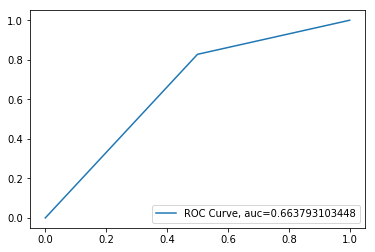

N_Neighbours:   1 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 1  1]
 [ 4 25]]


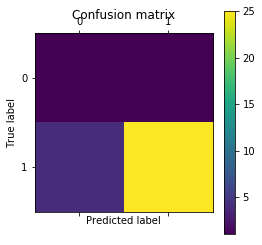



             precision    recall  f1-score   support

          0       0.20      0.50      0.29         2
          1       0.96      0.86      0.91        29

avg / total       0.91      0.84      0.87        31



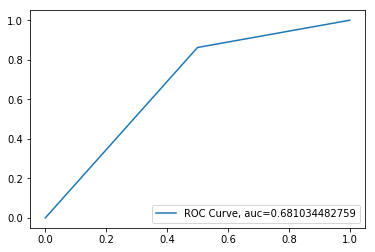

N_Neighbours:   1 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


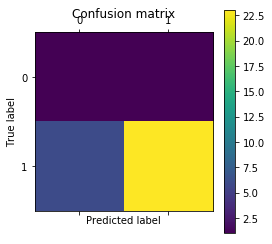



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



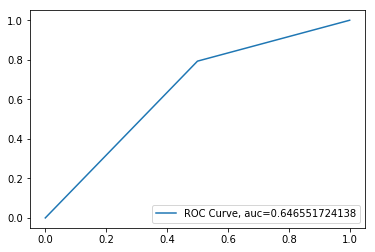

N_Neighbours:   1 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


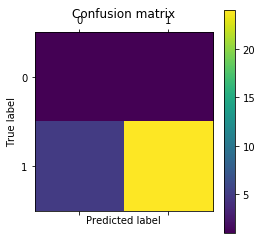



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



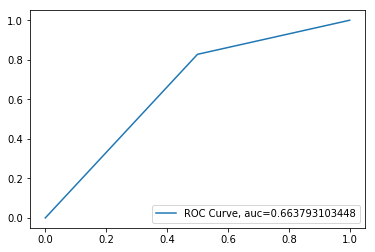

N_Neighbours:   1 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 1  1]
 [ 4 25]]


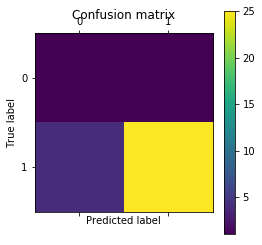



             precision    recall  f1-score   support

          0       0.20      0.50      0.29         2
          1       0.96      0.86      0.91        29

avg / total       0.91      0.84      0.87        31



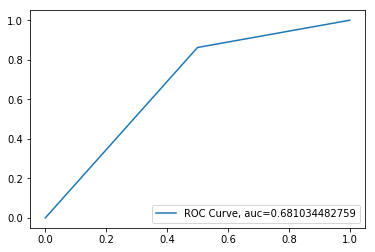

N_Neighbours:   1 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


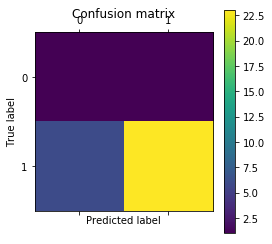



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



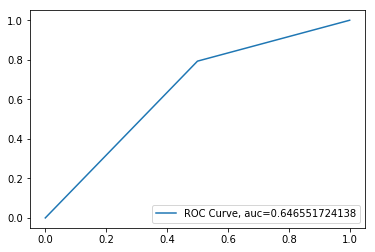

N_Neighbours:   1 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


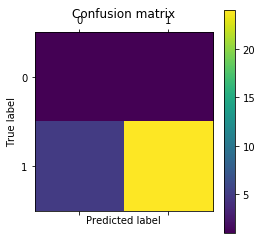



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



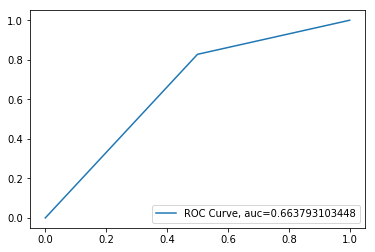

N_Neighbours:   2 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.645161290323
[[ 1  1]
 [10 19]]


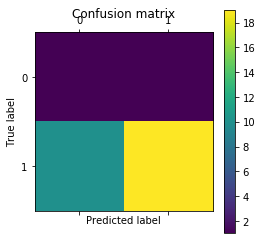



             precision    recall  f1-score   support

          0       0.09      0.50      0.15         2
          1       0.95      0.66      0.78        29

avg / total       0.89      0.65      0.74        31



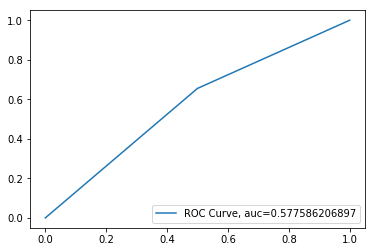

N_Neighbours:   2 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.612903225806
[[ 1  1]
 [11 18]]


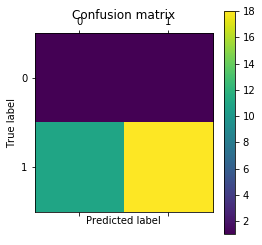



             precision    recall  f1-score   support

          0       0.08      0.50      0.14         2
          1       0.95      0.62      0.75        29

avg / total       0.89      0.61      0.71        31



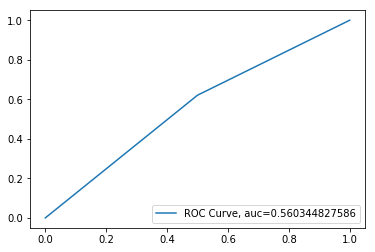

N_Neighbours:   2 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.645161290323
[[ 1  1]
 [10 19]]


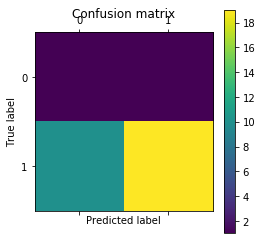



             precision    recall  f1-score   support

          0       0.09      0.50      0.15         2
          1       0.95      0.66      0.78        29

avg / total       0.89      0.65      0.74        31



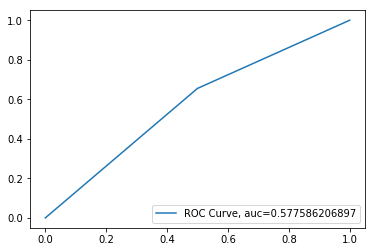

N_Neighbours:   2 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 1  1]
 [ 4 25]]


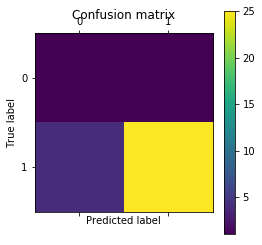



             precision    recall  f1-score   support

          0       0.20      0.50      0.29         2
          1       0.96      0.86      0.91        29

avg / total       0.91      0.84      0.87        31



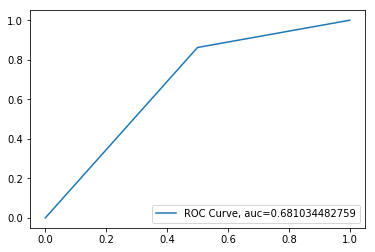

N_Neighbours:   2 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


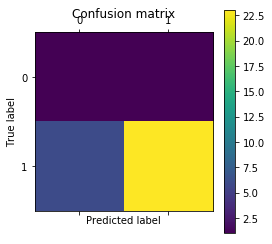



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



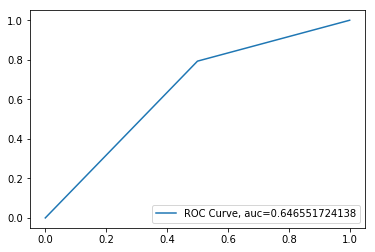

N_Neighbours:   2 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


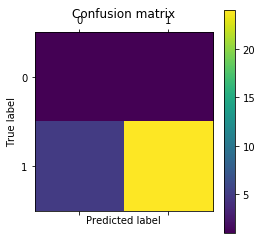



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



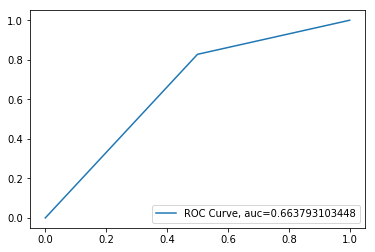

N_Neighbours:   2 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.645161290323
[[ 1  1]
 [10 19]]


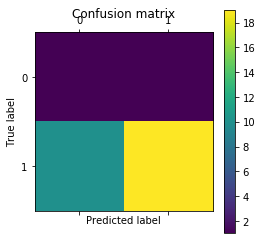



             precision    recall  f1-score   support

          0       0.09      0.50      0.15         2
          1       0.95      0.66      0.78        29

avg / total       0.89      0.65      0.74        31



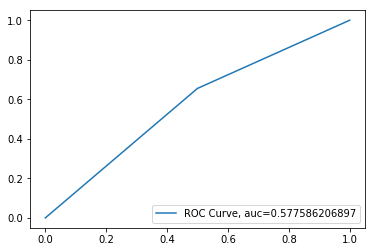

N_Neighbours:   2 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.612903225806
[[ 1  1]
 [11 18]]


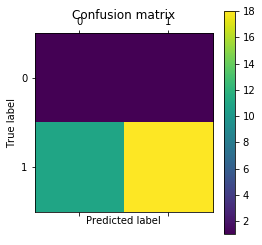



             precision    recall  f1-score   support

          0       0.08      0.50      0.14         2
          1       0.95      0.62      0.75        29

avg / total       0.89      0.61      0.71        31



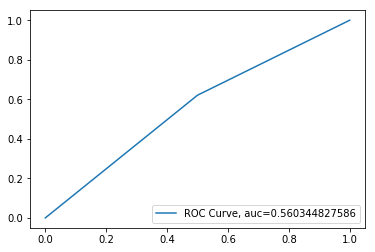

N_Neighbours:   2 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.645161290323
[[ 1  1]
 [10 19]]


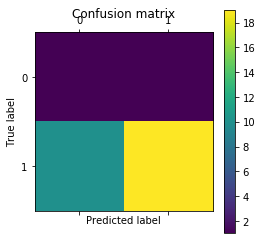



             precision    recall  f1-score   support

          0       0.09      0.50      0.15         2
          1       0.95      0.66      0.78        29

avg / total       0.89      0.65      0.74        31



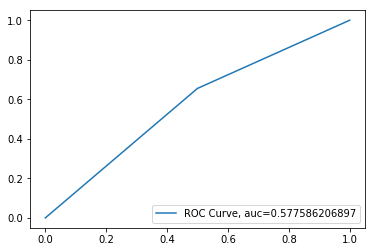

N_Neighbours:   2 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 1  1]
 [ 4 25]]


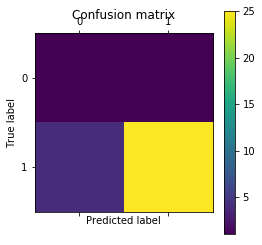



             precision    recall  f1-score   support

          0       0.20      0.50      0.29         2
          1       0.96      0.86      0.91        29

avg / total       0.91      0.84      0.87        31



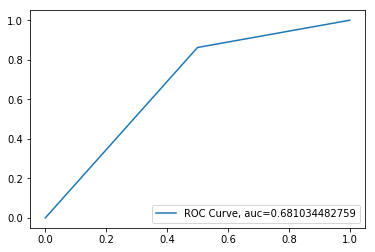

N_Neighbours:   2 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


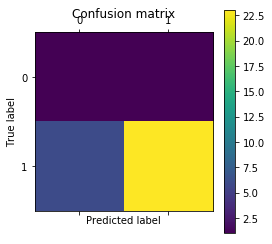



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



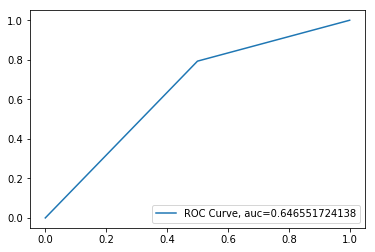

N_Neighbours:   2 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


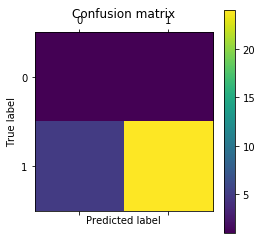



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



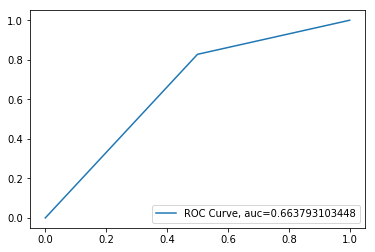

N_Neighbours:   2 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.645161290323
[[ 1  1]
 [10 19]]


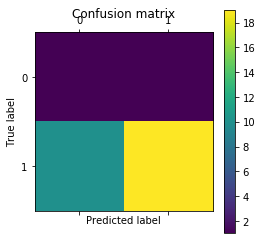



             precision    recall  f1-score   support

          0       0.09      0.50      0.15         2
          1       0.95      0.66      0.78        29

avg / total       0.89      0.65      0.74        31



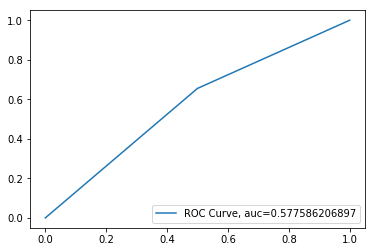

N_Neighbours:   2 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.612903225806
[[ 1  1]
 [11 18]]


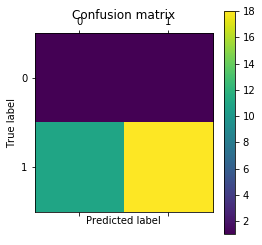



             precision    recall  f1-score   support

          0       0.08      0.50      0.14         2
          1       0.95      0.62      0.75        29

avg / total       0.89      0.61      0.71        31



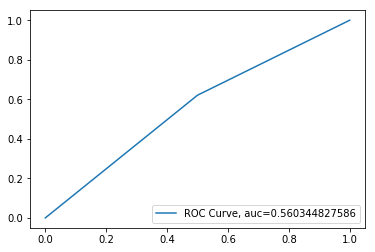

N_Neighbours:   2 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.645161290323
[[ 1  1]
 [10 19]]


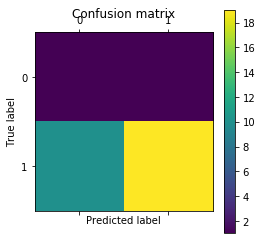



             precision    recall  f1-score   support

          0       0.09      0.50      0.15         2
          1       0.95      0.66      0.78        29

avg / total       0.89      0.65      0.74        31



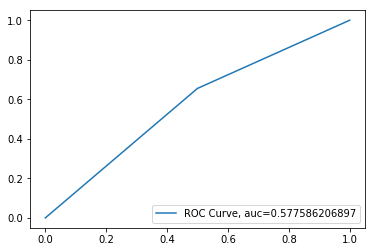

N_Neighbours:   2 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 1  1]
 [ 4 25]]


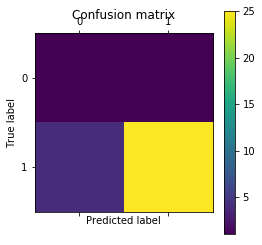



             precision    recall  f1-score   support

          0       0.20      0.50      0.29         2
          1       0.96      0.86      0.91        29

avg / total       0.91      0.84      0.87        31



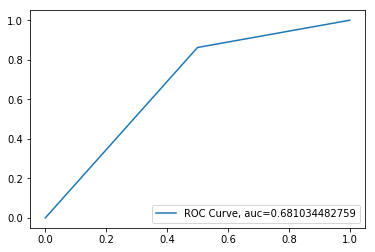

N_Neighbours:   2 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


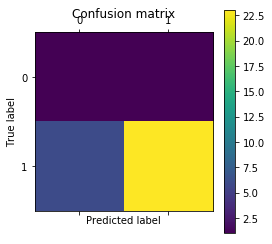



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



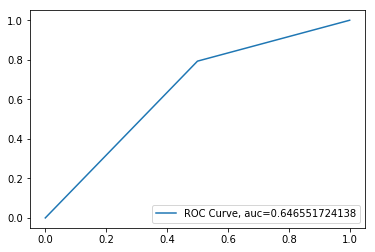

N_Neighbours:   2 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


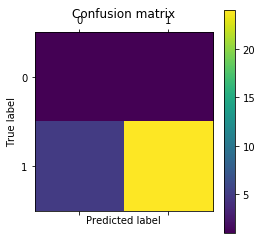



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



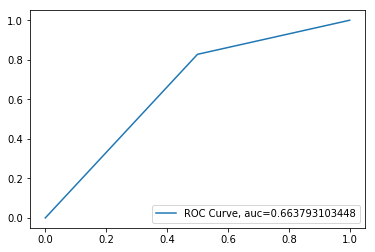

N_Neighbours:   2 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.645161290323
[[ 1  1]
 [10 19]]


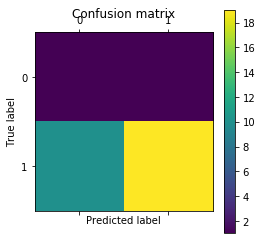



             precision    recall  f1-score   support

          0       0.09      0.50      0.15         2
          1       0.95      0.66      0.78        29

avg / total       0.89      0.65      0.74        31



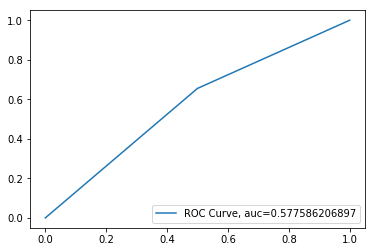

N_Neighbours:   2 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.612903225806
[[ 1  1]
 [11 18]]


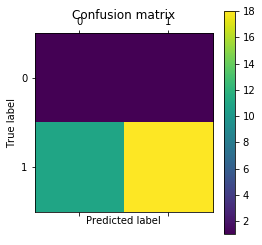



             precision    recall  f1-score   support

          0       0.08      0.50      0.14         2
          1       0.95      0.62      0.75        29

avg / total       0.89      0.61      0.71        31



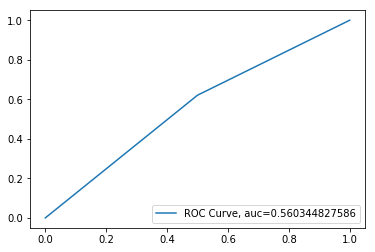

N_Neighbours:   2 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.645161290323
[[ 1  1]
 [10 19]]


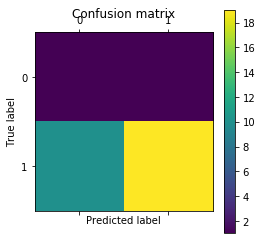



             precision    recall  f1-score   support

          0       0.09      0.50      0.15         2
          1       0.95      0.66      0.78        29

avg / total       0.89      0.65      0.74        31



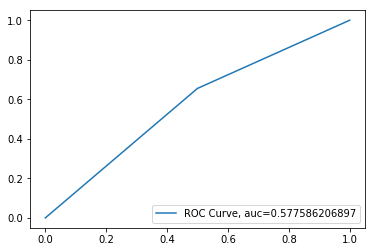

N_Neighbours:   2 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 1  1]
 [ 4 25]]


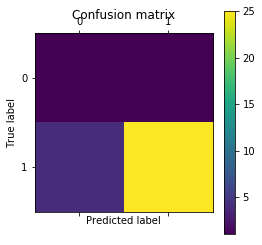



             precision    recall  f1-score   support

          0       0.20      0.50      0.29         2
          1       0.96      0.86      0.91        29

avg / total       0.91      0.84      0.87        31



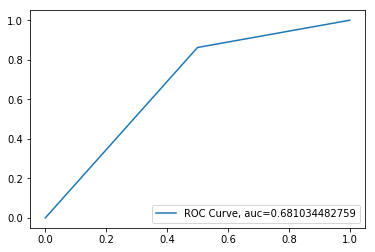

N_Neighbours:   2 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


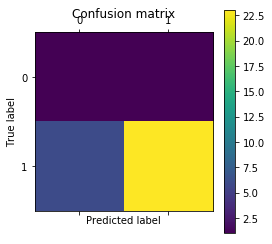



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



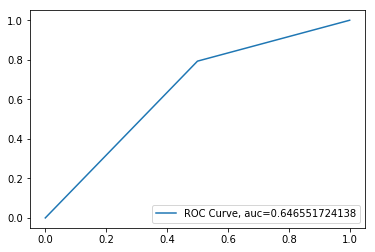

N_Neighbours:   2 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


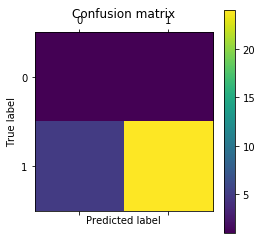



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



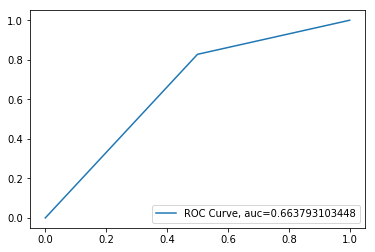

N_Neighbours:   3 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


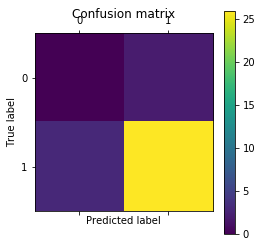



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



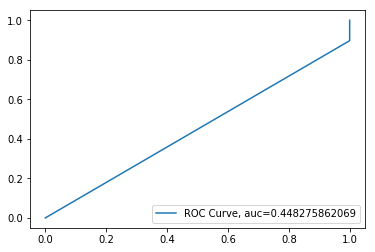

N_Neighbours:   3 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


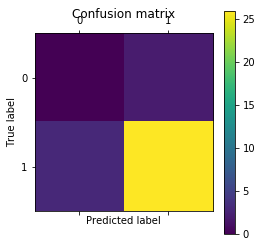



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



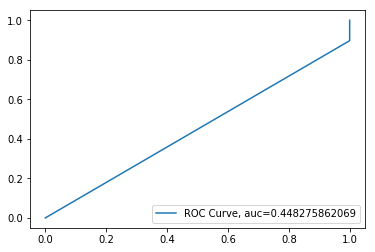

N_Neighbours:   3 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


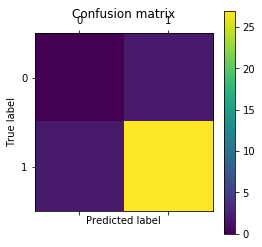



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



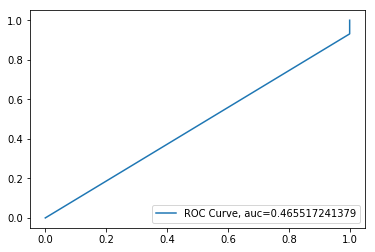

N_Neighbours:   3 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


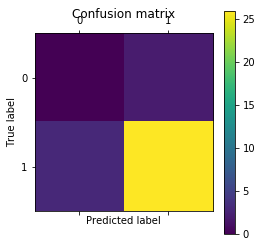



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



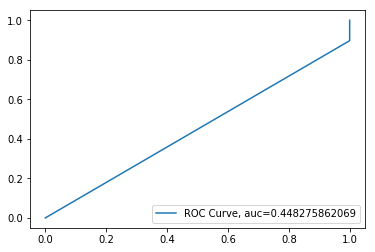

N_Neighbours:   3 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


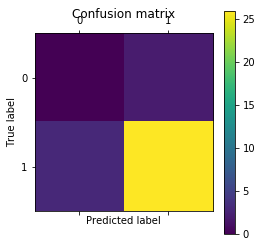



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



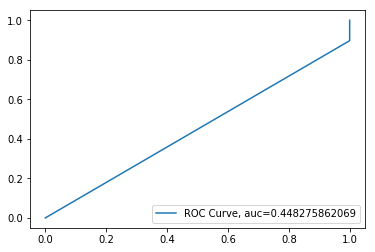

N_Neighbours:   3 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


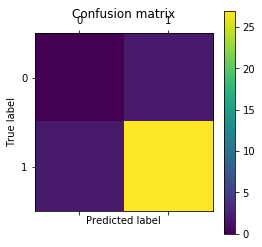



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



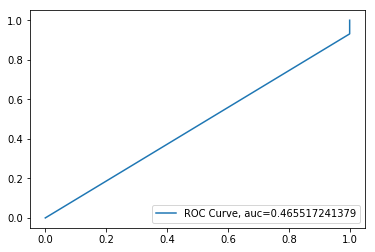

N_Neighbours:   3 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


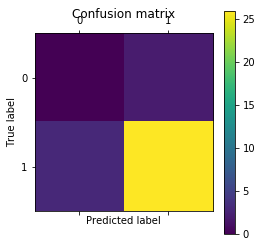



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



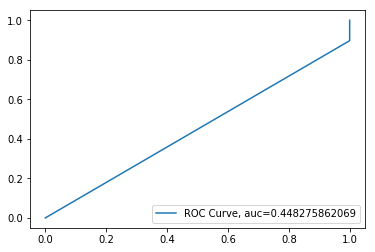

N_Neighbours:   3 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


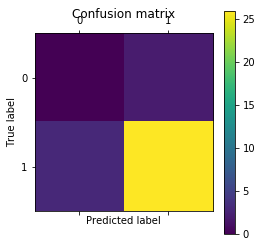



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



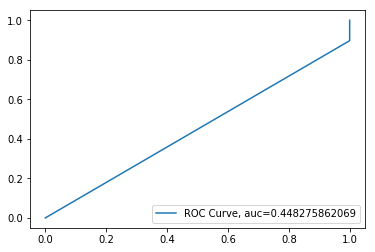

N_Neighbours:   3 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


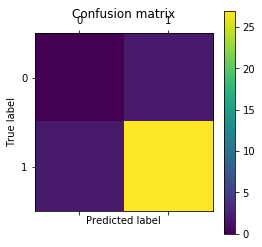



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



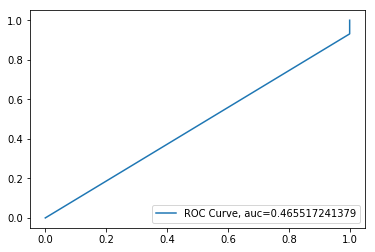

N_Neighbours:   3 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


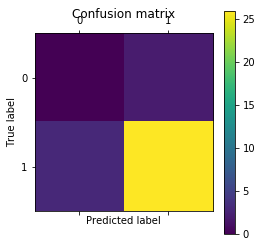



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



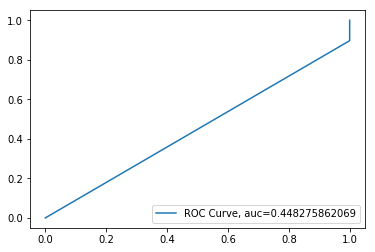

N_Neighbours:   3 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


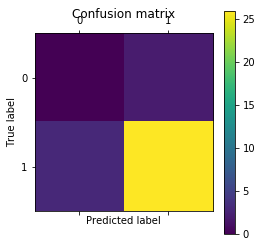



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



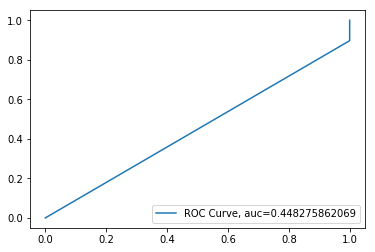

N_Neighbours:   3 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


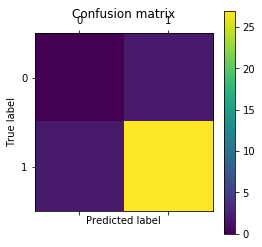



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



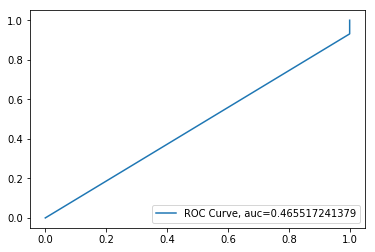

N_Neighbours:   3 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


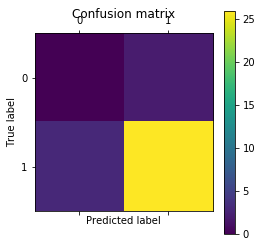



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



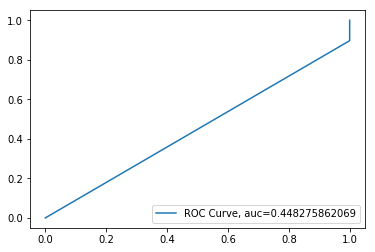

N_Neighbours:   3 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


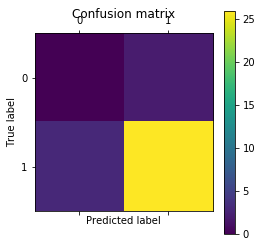



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



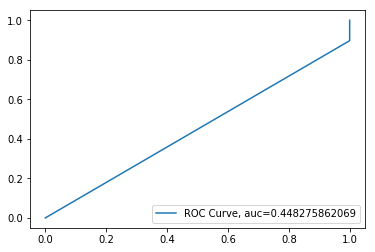

N_Neighbours:   3 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


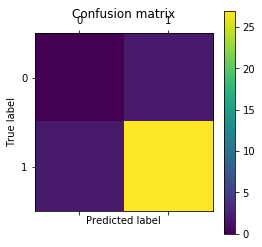



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



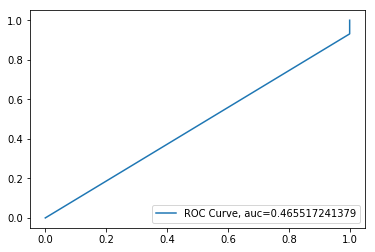

N_Neighbours:   3 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


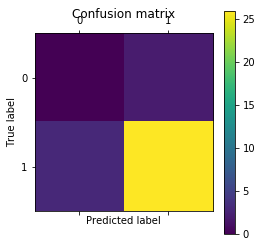



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



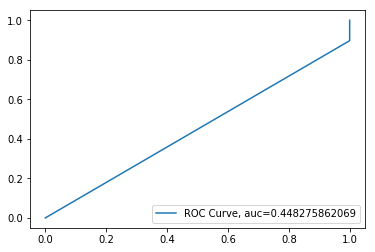

N_Neighbours:   3 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


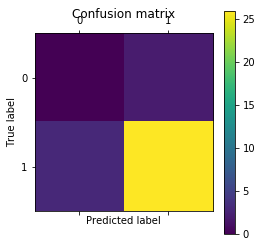



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



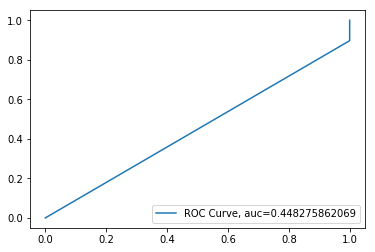

N_Neighbours:   3 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


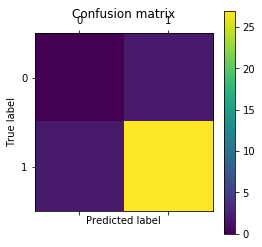



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



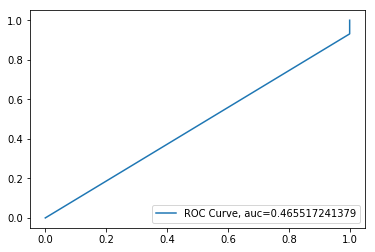

N_Neighbours:   3 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


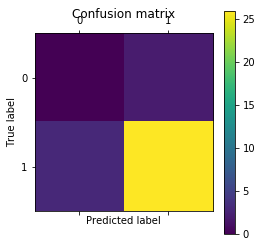



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



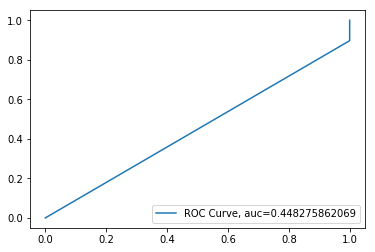

N_Neighbours:   3 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


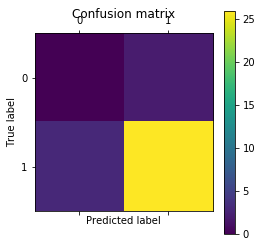



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



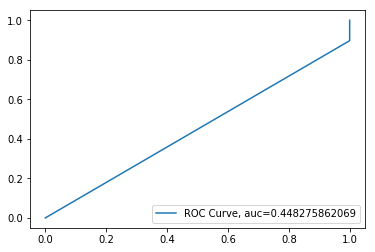

N_Neighbours:   3 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


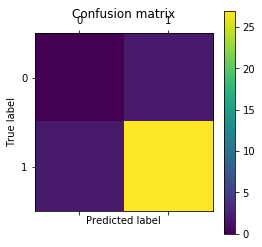



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



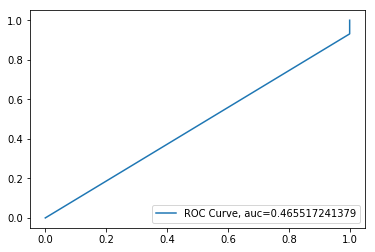

N_Neighbours:   3 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


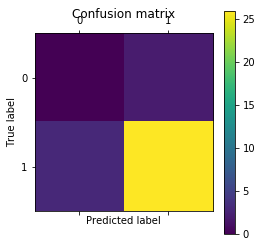



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



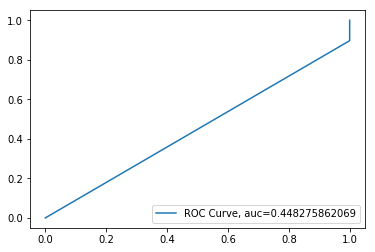

N_Neighbours:   3 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


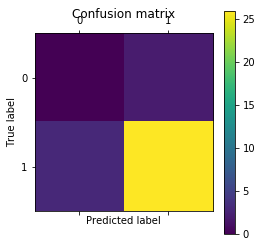



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



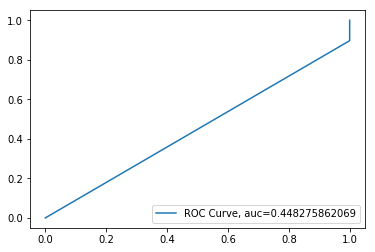

N_Neighbours:   3 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


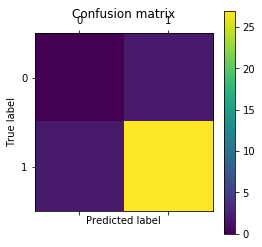



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



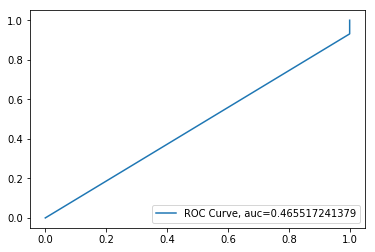

N_Neighbours:   4 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
[[ 1  1]
 [ 7 22]]


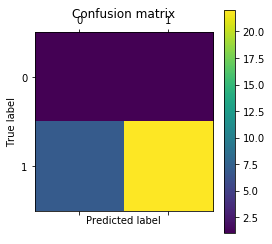



             precision    recall  f1-score   support

          0       0.12      0.50      0.20         2
          1       0.96      0.76      0.85        29

avg / total       0.90      0.74      0.80        31



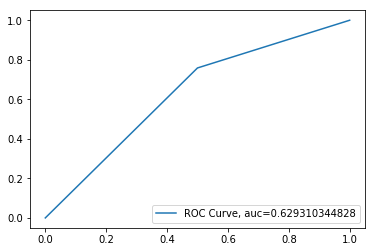

N_Neighbours:   4 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


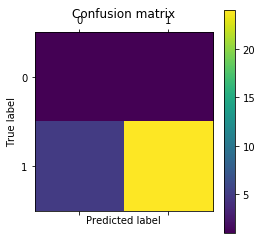



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



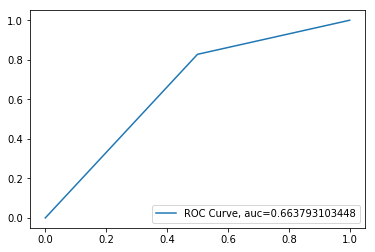

N_Neighbours:   4 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


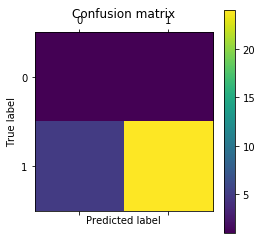



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



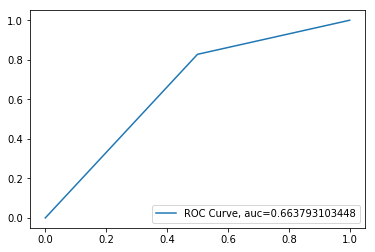

N_Neighbours:   4 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


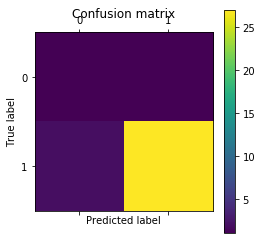



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



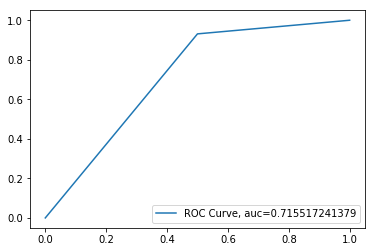

N_Neighbours:   4 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


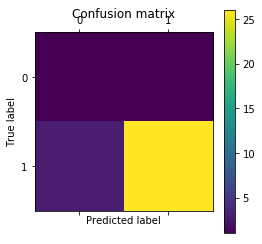



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



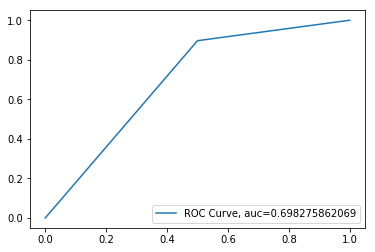

N_Neighbours:   4 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


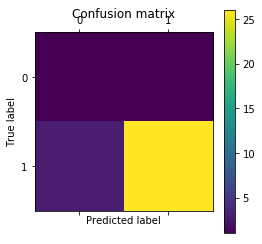



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



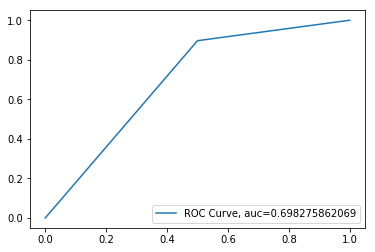

N_Neighbours:   4 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
[[ 1  1]
 [ 7 22]]


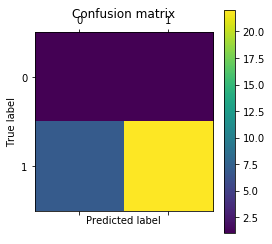



             precision    recall  f1-score   support

          0       0.12      0.50      0.20         2
          1       0.96      0.76      0.85        29

avg / total       0.90      0.74      0.80        31



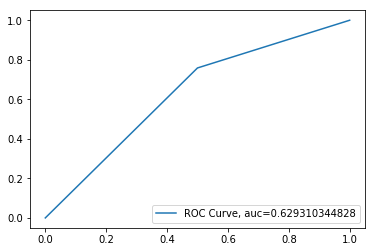

N_Neighbours:   4 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


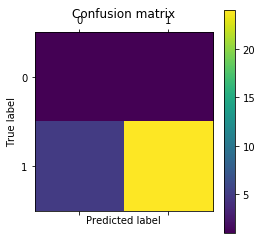



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



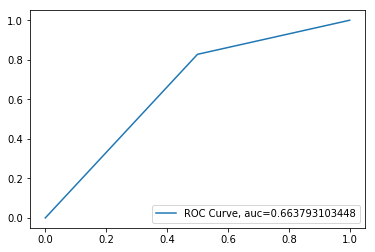

N_Neighbours:   4 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


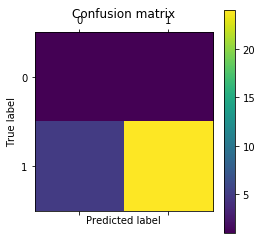



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



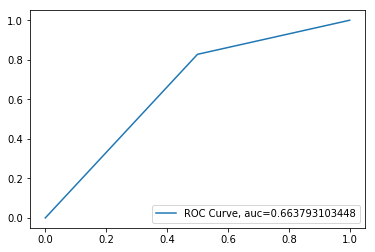

N_Neighbours:   4 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


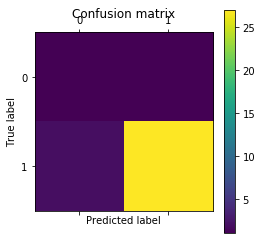



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



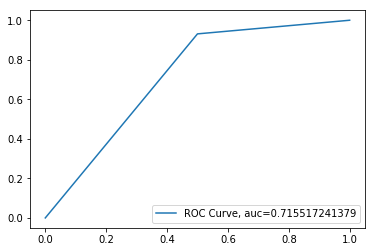

N_Neighbours:   4 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


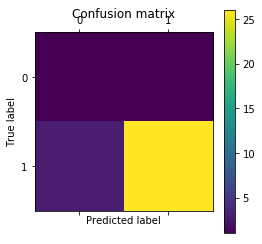



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



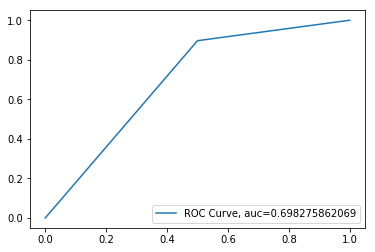

N_Neighbours:   4 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


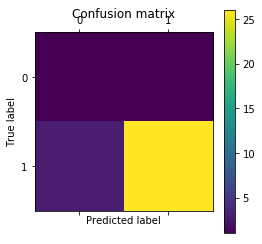



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



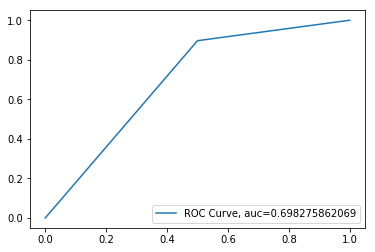

N_Neighbours:   4 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
[[ 1  1]
 [ 7 22]]


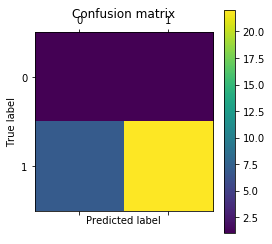



             precision    recall  f1-score   support

          0       0.12      0.50      0.20         2
          1       0.96      0.76      0.85        29

avg / total       0.90      0.74      0.80        31



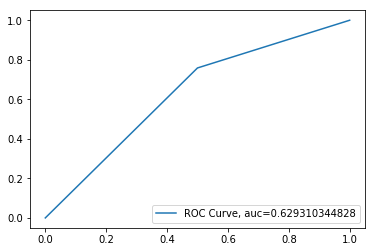

N_Neighbours:   4 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


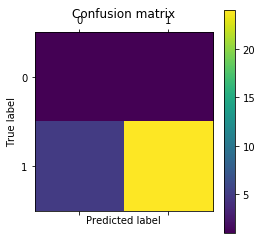



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



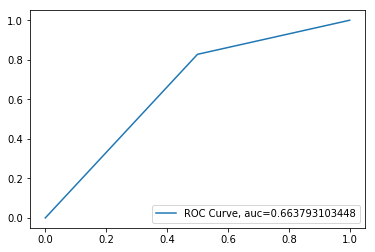

N_Neighbours:   4 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


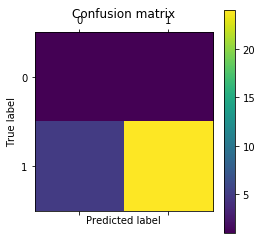



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



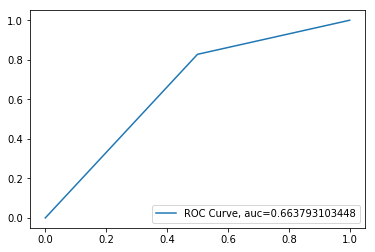

N_Neighbours:   4 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


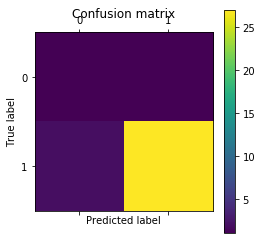



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



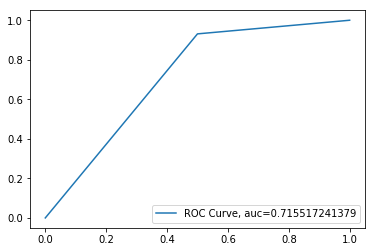

N_Neighbours:   4 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


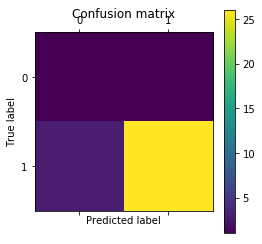



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



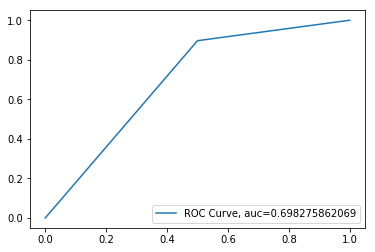

N_Neighbours:   4 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


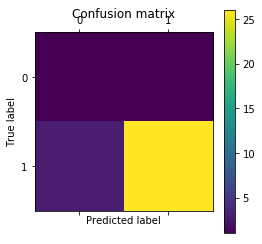



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



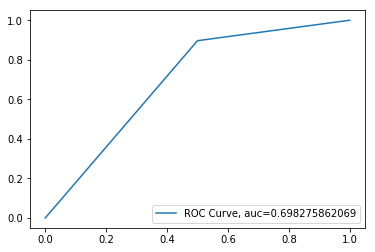

N_Neighbours:   4 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
[[ 1  1]
 [ 7 22]]


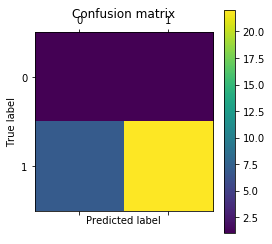



             precision    recall  f1-score   support

          0       0.12      0.50      0.20         2
          1       0.96      0.76      0.85        29

avg / total       0.90      0.74      0.80        31



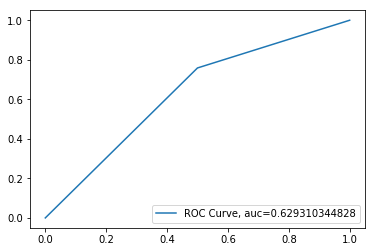

N_Neighbours:   4 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


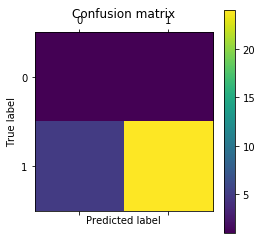



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



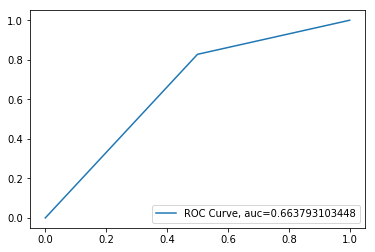

N_Neighbours:   4 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


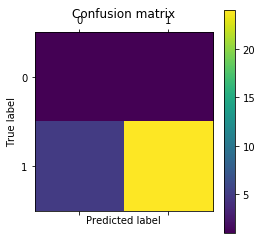



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



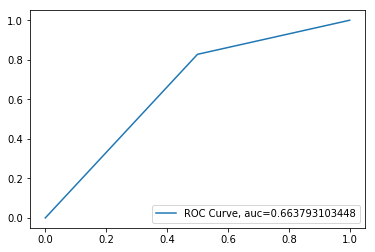

N_Neighbours:   4 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


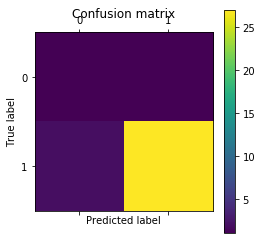



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



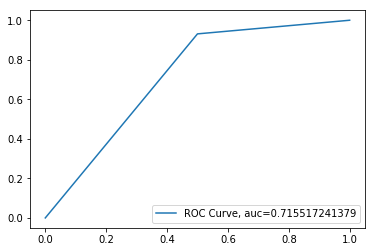

N_Neighbours:   4 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


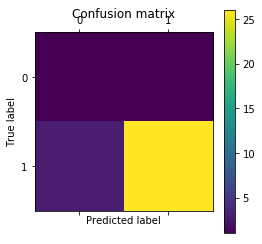



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



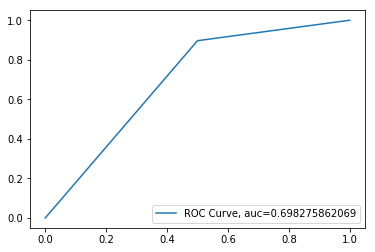

N_Neighbours:   4 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


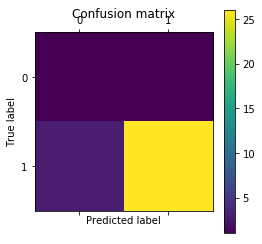



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



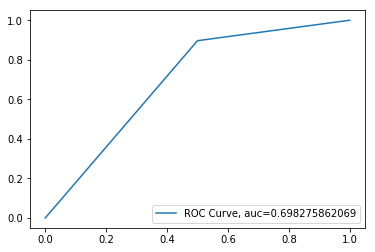

N_Neighbours:   5 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


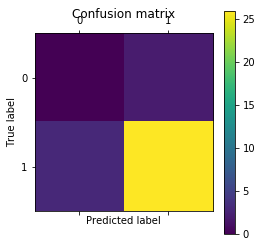



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



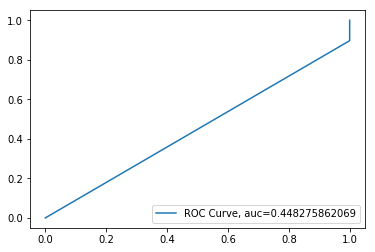

N_Neighbours:   5 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


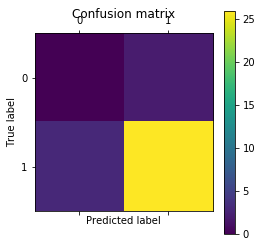



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



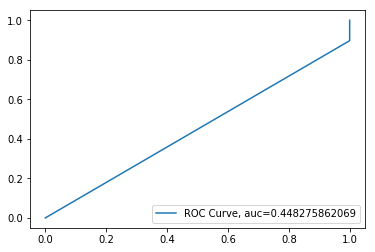

N_Neighbours:   5 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


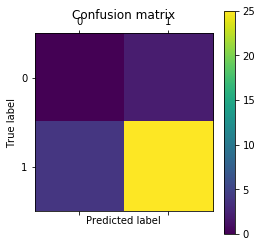



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



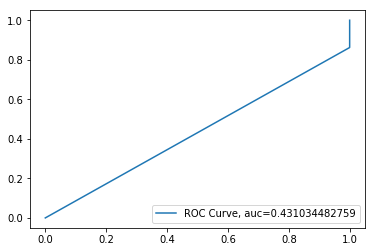

N_Neighbours:   5 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


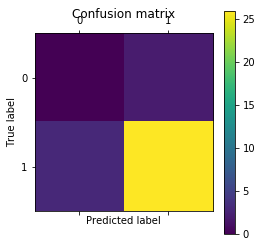



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



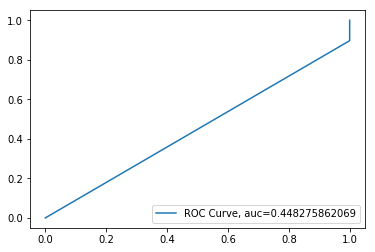

N_Neighbours:   5 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


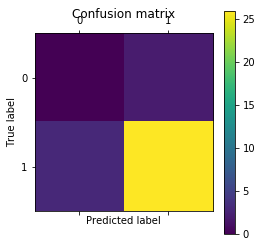



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



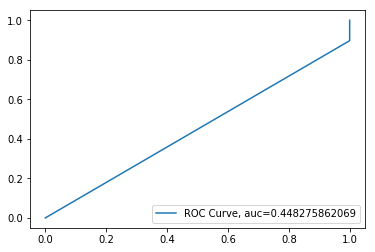

N_Neighbours:   5 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


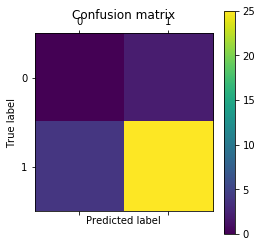



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



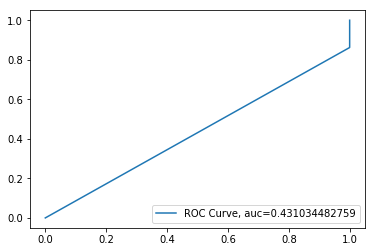

N_Neighbours:   5 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


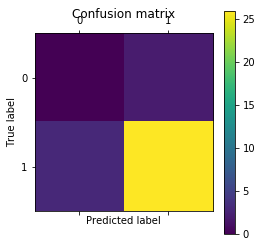



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



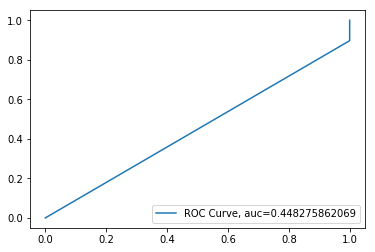

N_Neighbours:   5 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


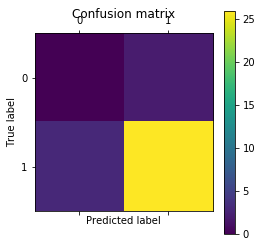



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



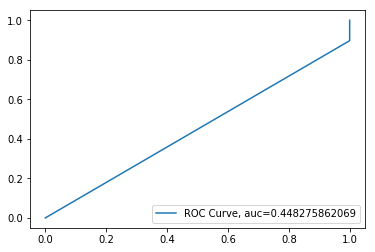

N_Neighbours:   5 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


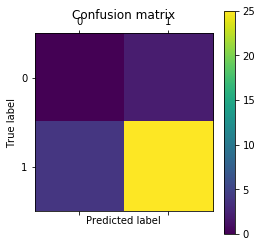



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



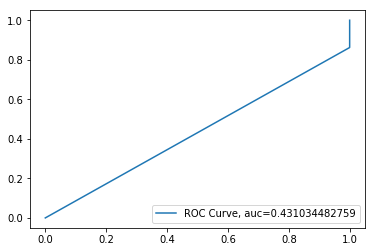

N_Neighbours:   5 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


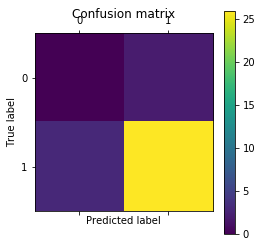



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



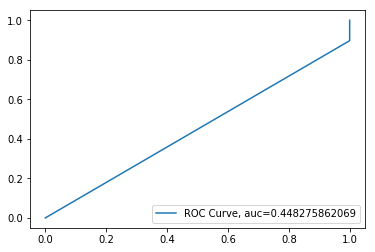

N_Neighbours:   5 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


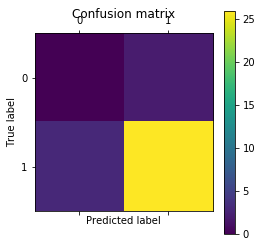



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



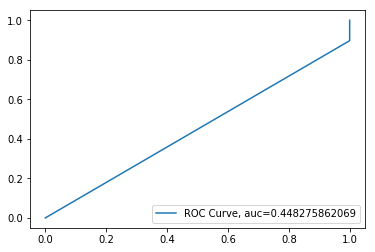

N_Neighbours:   5 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


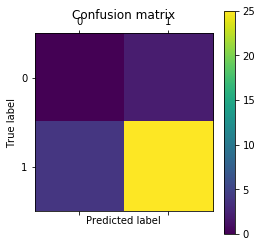



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



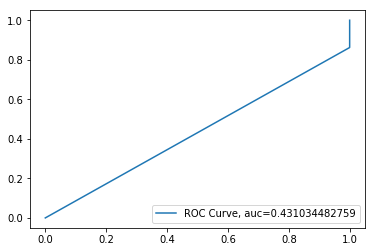

N_Neighbours:   5 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


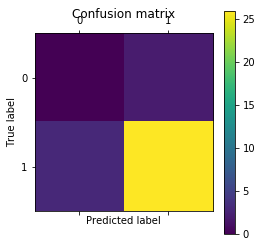



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



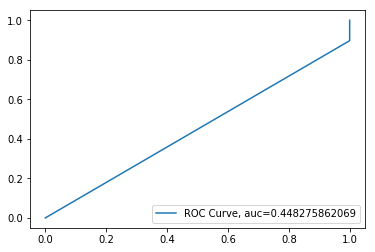

N_Neighbours:   5 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


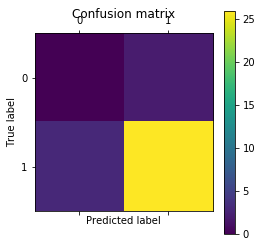



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



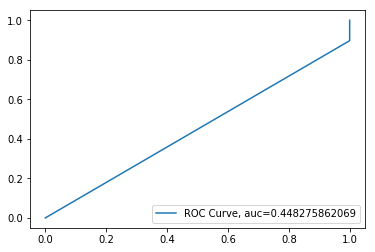

N_Neighbours:   5 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


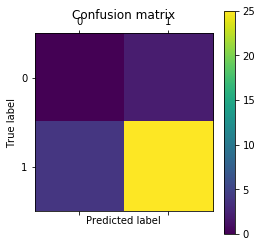



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



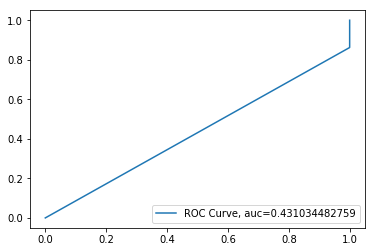

N_Neighbours:   5 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


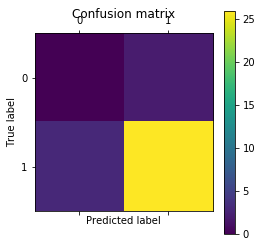



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



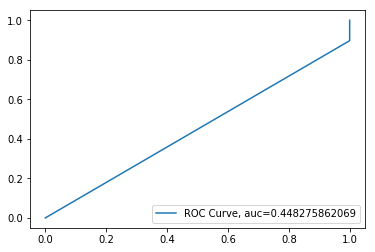

N_Neighbours:   5 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


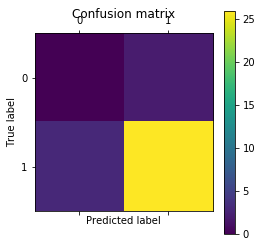



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



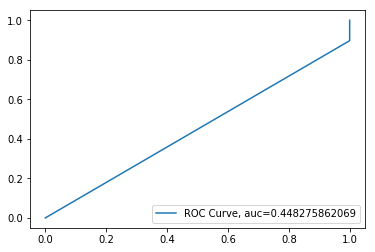

N_Neighbours:   5 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


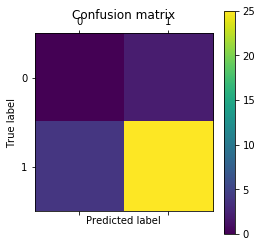



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



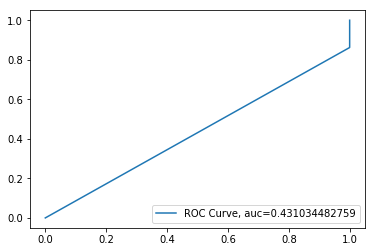

N_Neighbours:   5 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


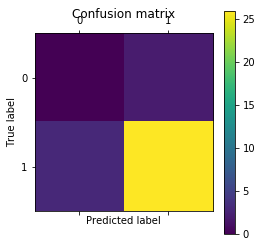



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



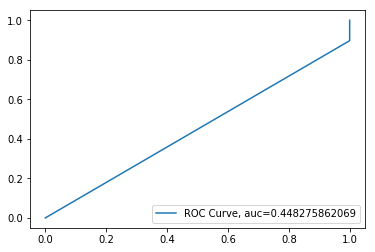

N_Neighbours:   5 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


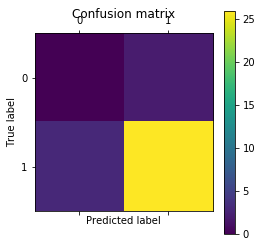



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



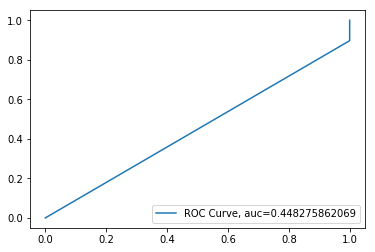

N_Neighbours:   5 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


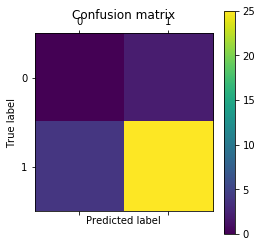



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



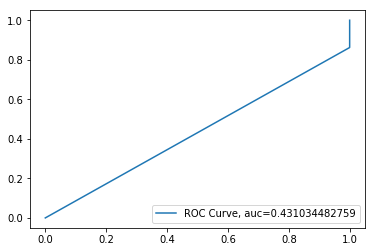

N_Neighbours:   5 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


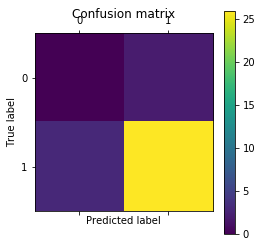



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



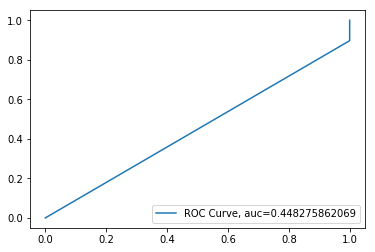

N_Neighbours:   5 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


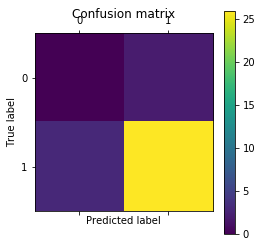



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



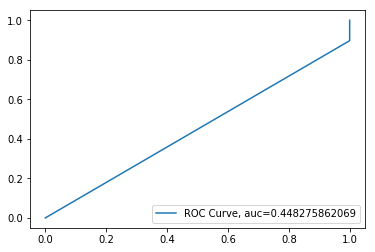

N_Neighbours:   5 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


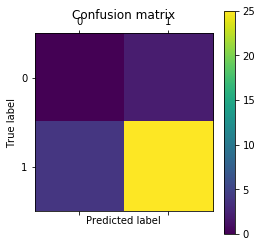



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



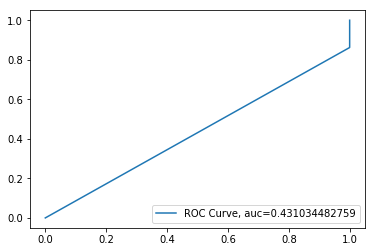

N_Neighbours:   6 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


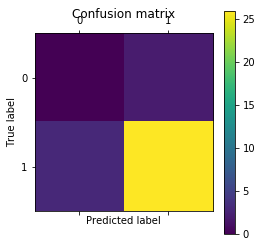



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



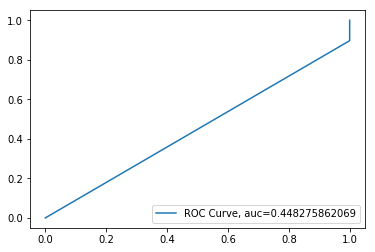

N_Neighbours:   6 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
[[ 0  2]
 [ 5 24]]


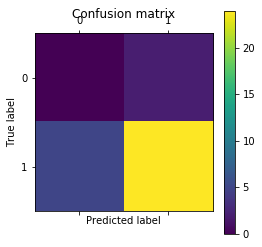



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.92      0.83      0.87        29

avg / total       0.86      0.77      0.82        31



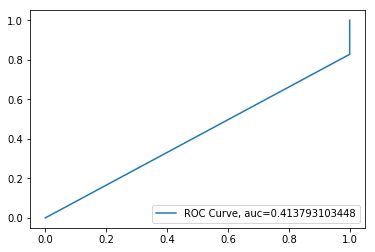

N_Neighbours:   6 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
[[ 0  2]
 [ 6 23]]


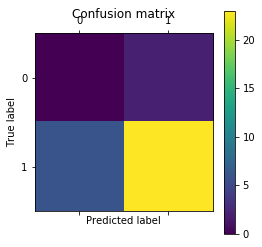



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.92      0.79      0.85        29

avg / total       0.86      0.74      0.80        31



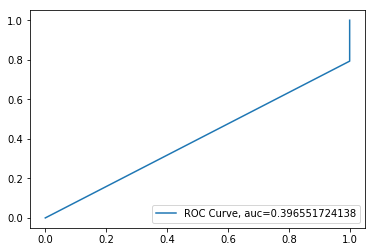

N_Neighbours:   6 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


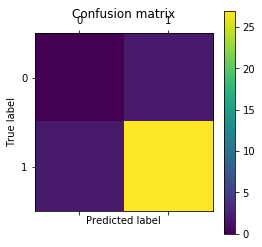



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



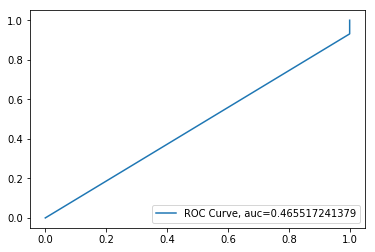

N_Neighbours:   6 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


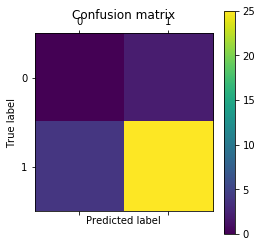



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



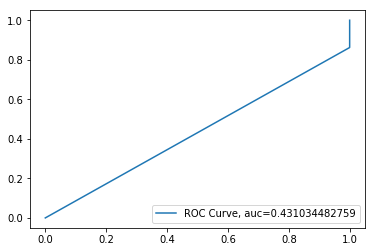

N_Neighbours:   6 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


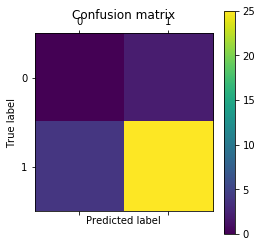



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



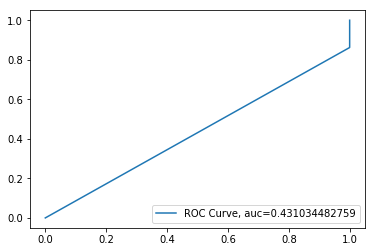

N_Neighbours:   6 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


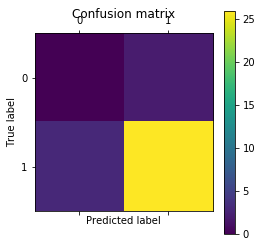



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



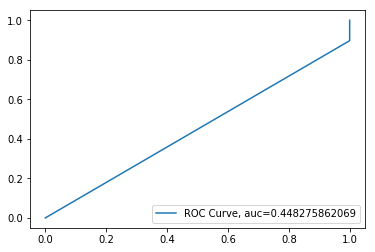

N_Neighbours:   6 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
[[ 0  2]
 [ 5 24]]


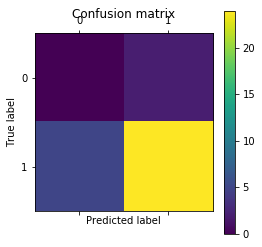



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.92      0.83      0.87        29

avg / total       0.86      0.77      0.82        31



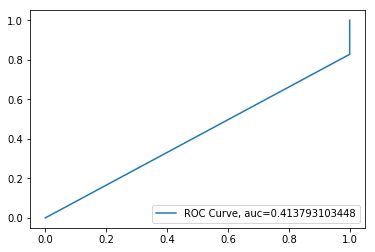

N_Neighbours:   6 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
[[ 0  2]
 [ 6 23]]


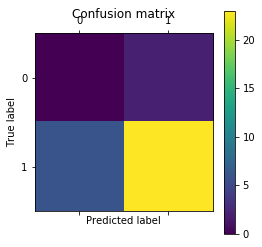



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.92      0.79      0.85        29

avg / total       0.86      0.74      0.80        31



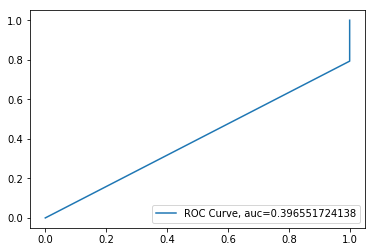

N_Neighbours:   6 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


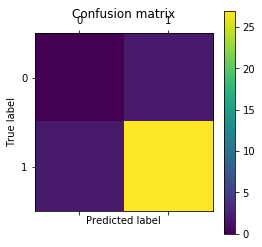



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



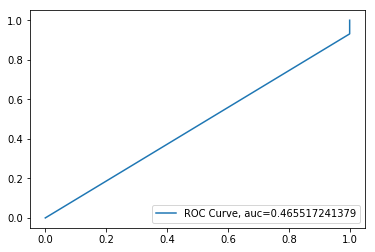

N_Neighbours:   6 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


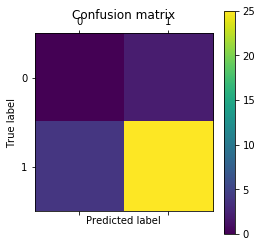



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



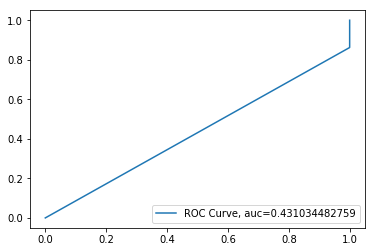

N_Neighbours:   6 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


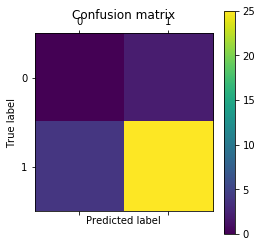



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



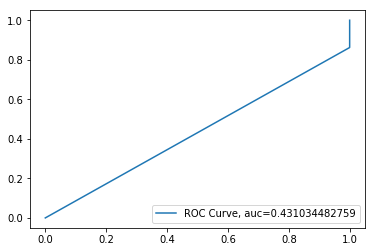

N_Neighbours:   6 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


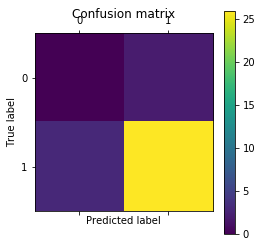



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



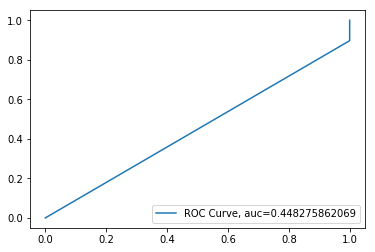

N_Neighbours:   6 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
[[ 0  2]
 [ 5 24]]


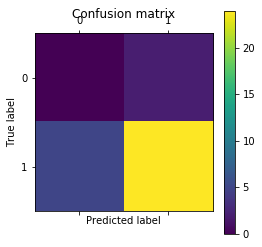



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.92      0.83      0.87        29

avg / total       0.86      0.77      0.82        31



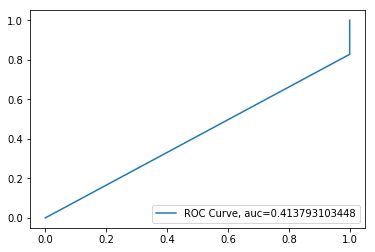

N_Neighbours:   6 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
[[ 0  2]
 [ 6 23]]


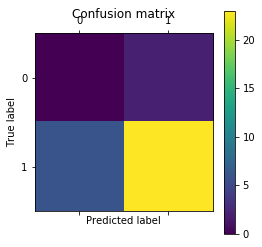



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.92      0.79      0.85        29

avg / total       0.86      0.74      0.80        31



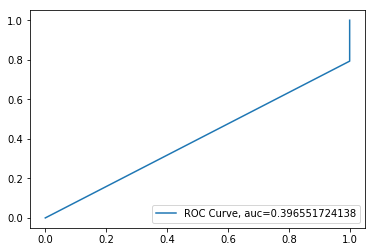

N_Neighbours:   6 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


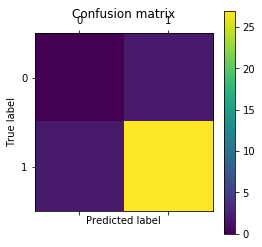



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



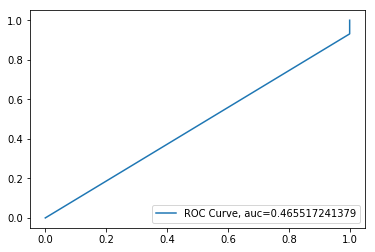

N_Neighbours:   6 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


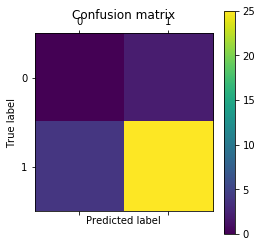



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



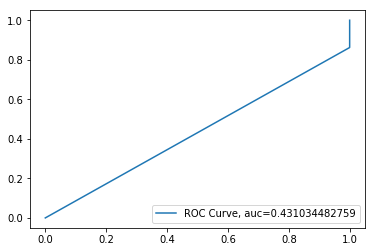

N_Neighbours:   6 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


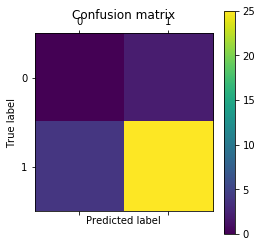



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



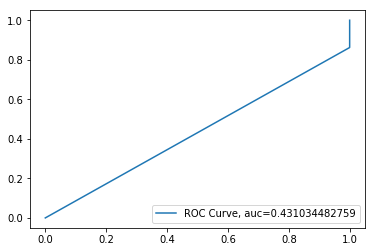

N_Neighbours:   6 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


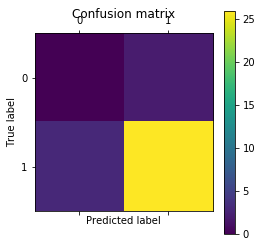



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



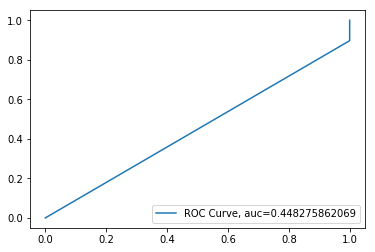

N_Neighbours:   6 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
[[ 0  2]
 [ 5 24]]


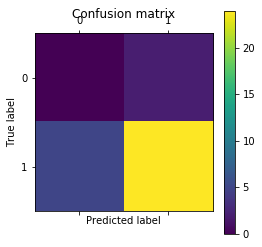



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.92      0.83      0.87        29

avg / total       0.86      0.77      0.82        31



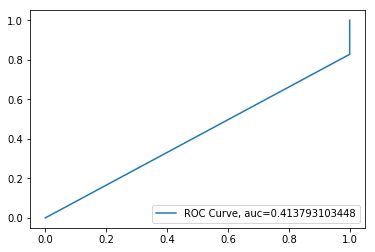

N_Neighbours:   6 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
[[ 0  2]
 [ 6 23]]


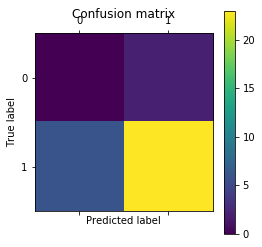



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.92      0.79      0.85        29

avg / total       0.86      0.74      0.80        31



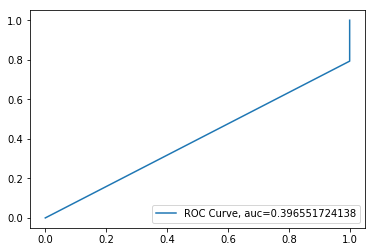

N_Neighbours:   6 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


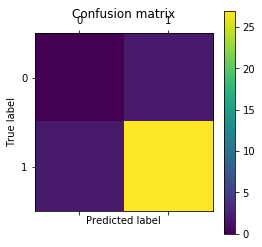



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



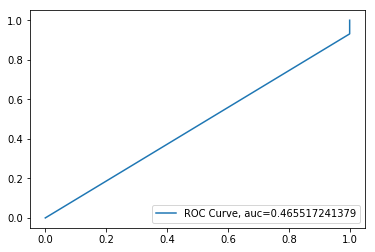

N_Neighbours:   6 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


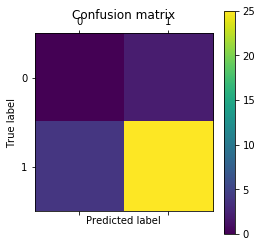



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



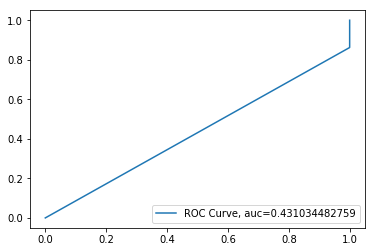

N_Neighbours:   6 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


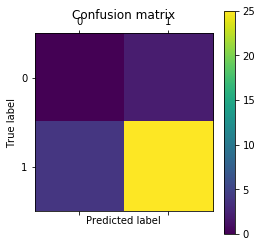



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



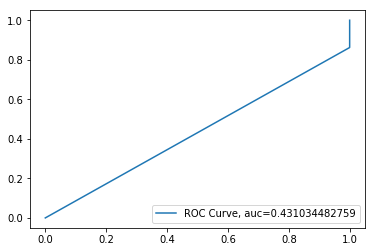

N_Neighbours:   7 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


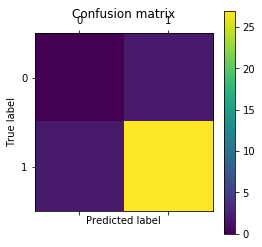



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



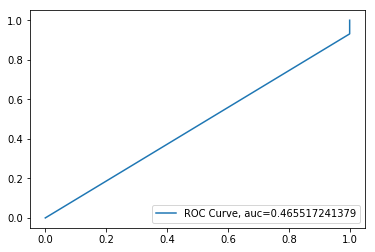

N_Neighbours:   7 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


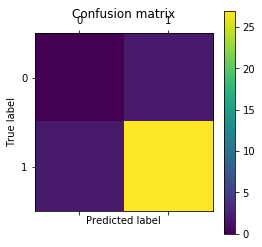



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



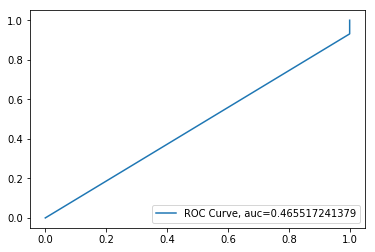

N_Neighbours:   7 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


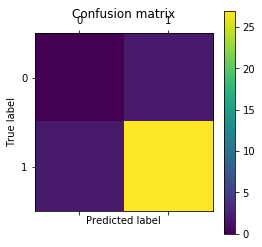



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



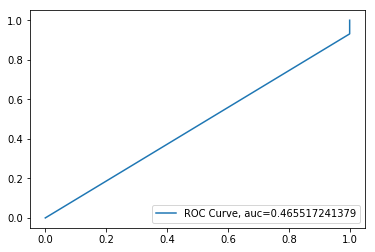

N_Neighbours:   7 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


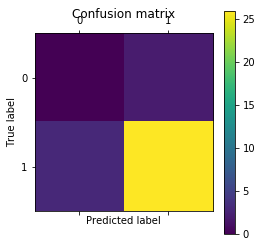



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



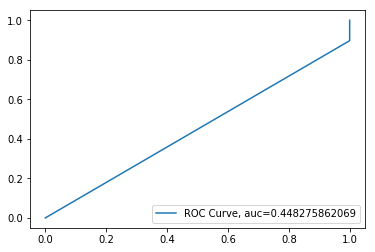

N_Neighbours:   7 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


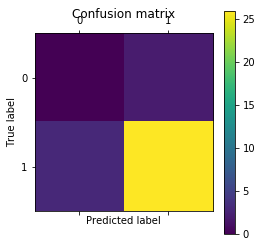



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



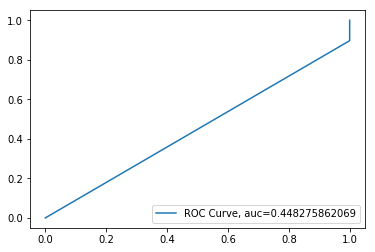

N_Neighbours:   7 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


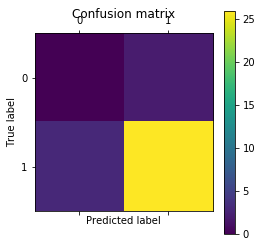



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



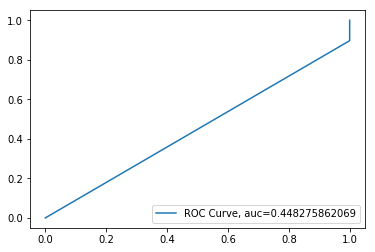

N_Neighbours:   7 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


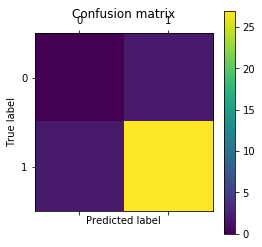



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



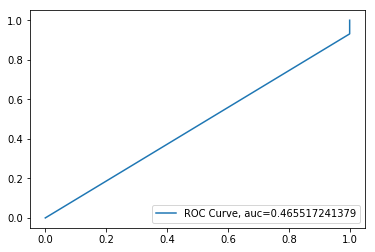

N_Neighbours:   7 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


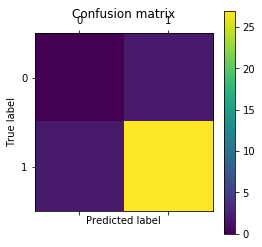



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



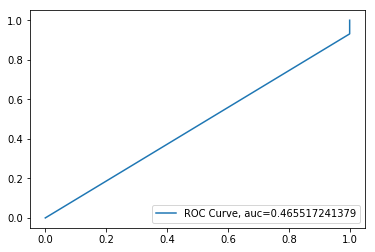

N_Neighbours:   7 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


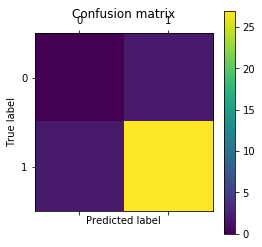



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



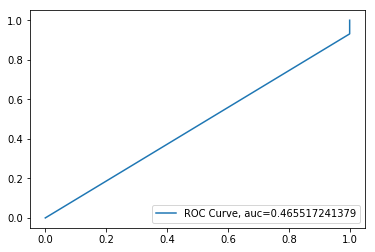

N_Neighbours:   7 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


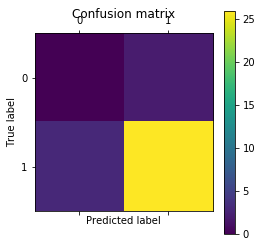



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



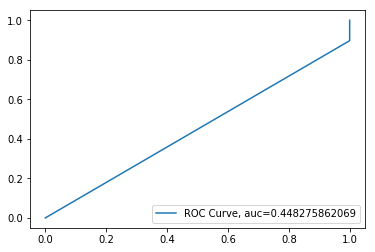

N_Neighbours:   7 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


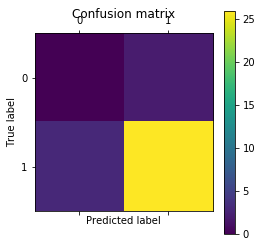



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



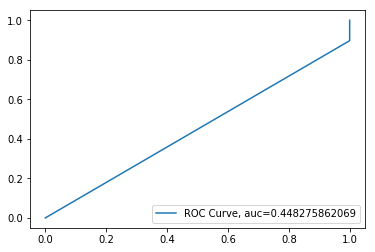

N_Neighbours:   7 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


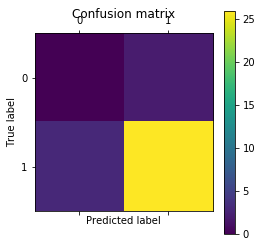



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



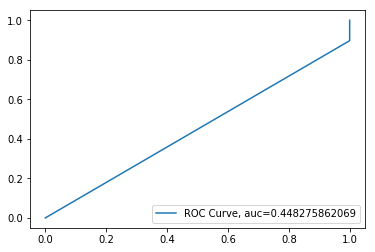

N_Neighbours:   7 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


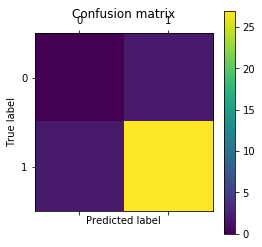



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



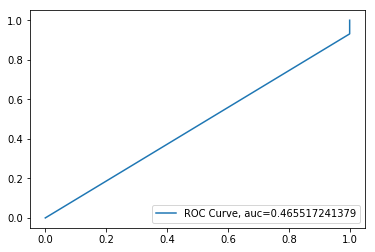

N_Neighbours:   7 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


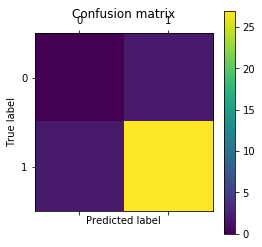



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



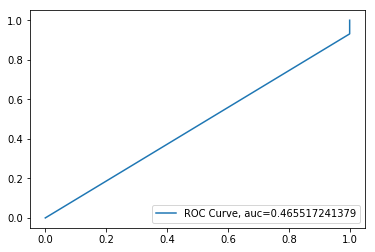

N_Neighbours:   7 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


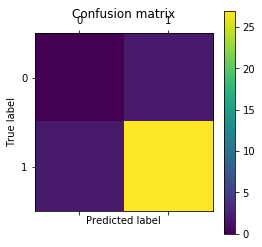



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



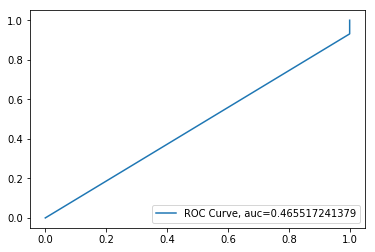

N_Neighbours:   7 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


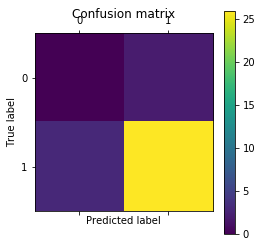



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



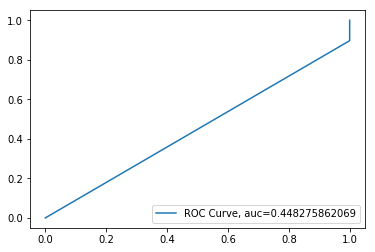

N_Neighbours:   7 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


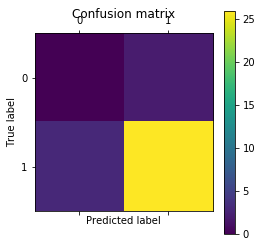



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



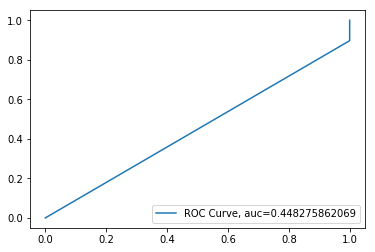

N_Neighbours:   7 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


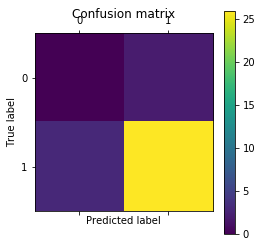



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



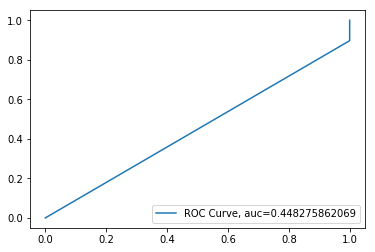

N_Neighbours:   7 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


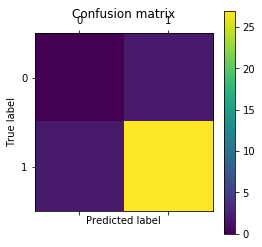



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



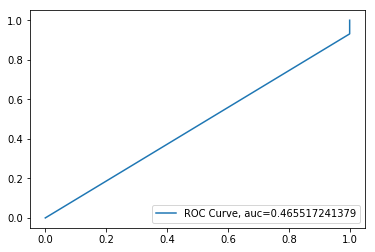

N_Neighbours:   7 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


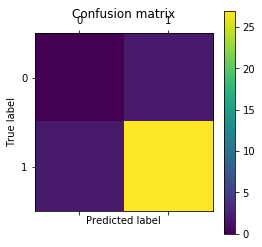



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



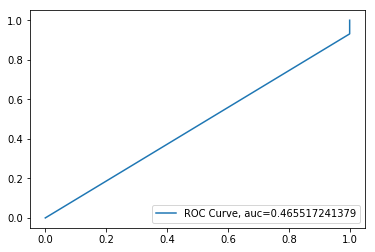

N_Neighbours:   7 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


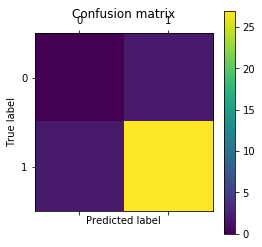



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



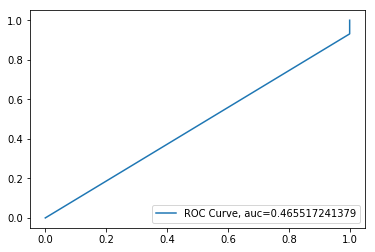

N_Neighbours:   7 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


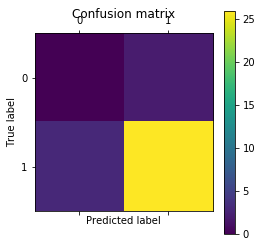



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



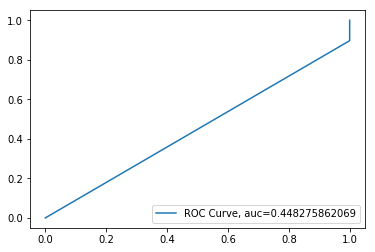

N_Neighbours:   7 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


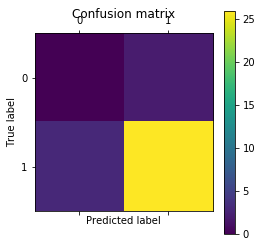



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



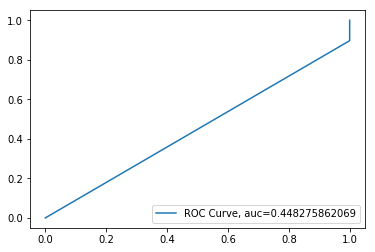

N_Neighbours:   7 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


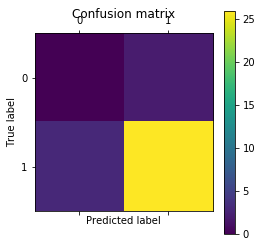



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



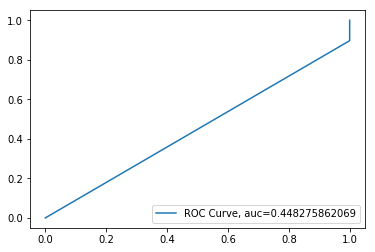

N_Neighbours:   8 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


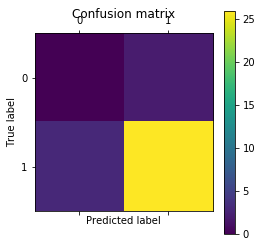



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



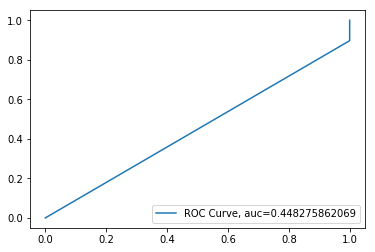

N_Neighbours:   8 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


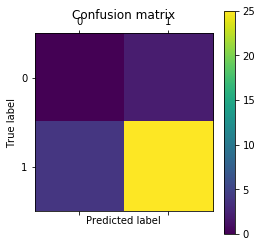



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



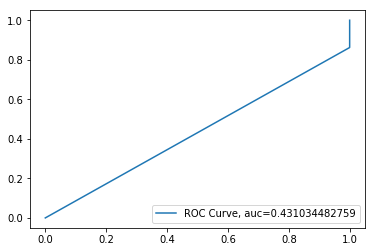

N_Neighbours:   8 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


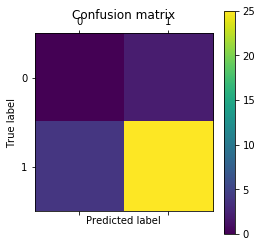



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



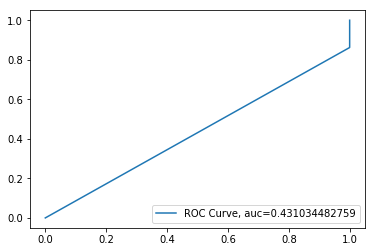

N_Neighbours:   8 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


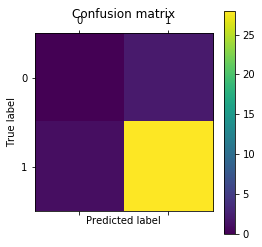



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



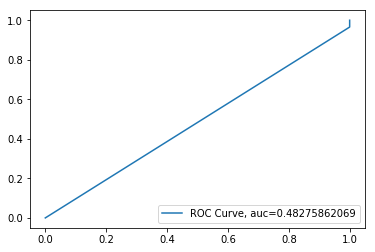

N_Neighbours:   8 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


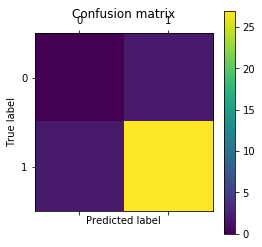



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



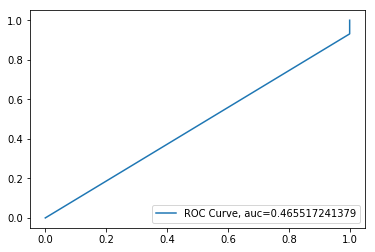

N_Neighbours:   8 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


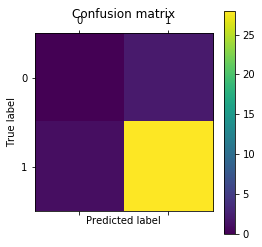



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



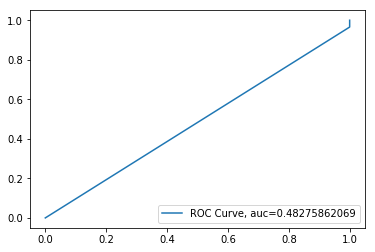

N_Neighbours:   8 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


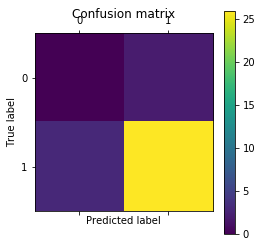



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



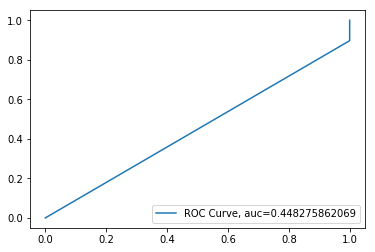

N_Neighbours:   8 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


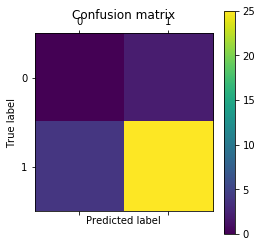



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



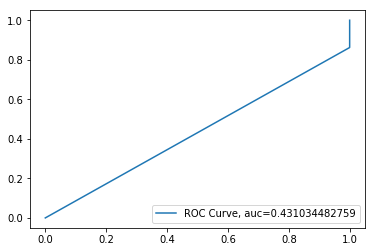

N_Neighbours:   8 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


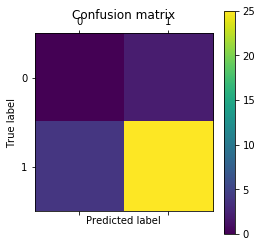



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



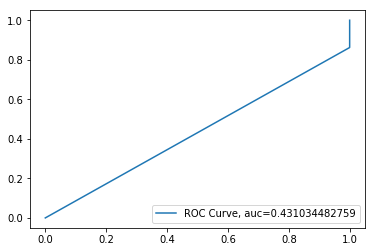

N_Neighbours:   8 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


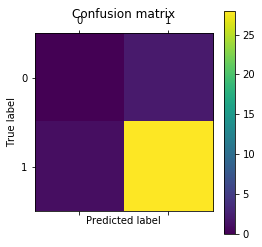



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



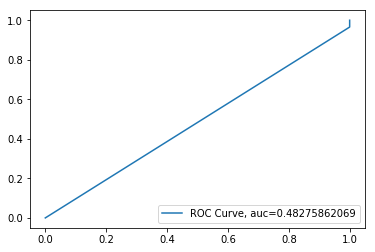

N_Neighbours:   8 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


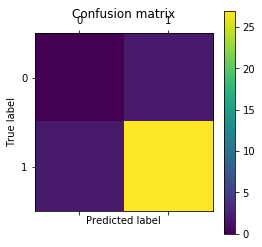



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



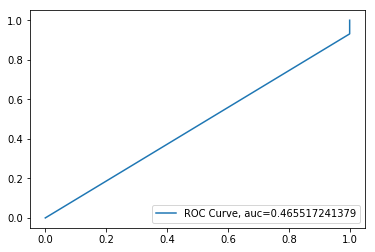

N_Neighbours:   8 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


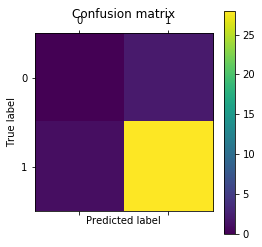



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



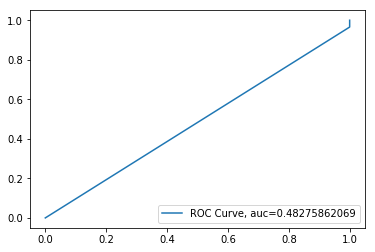

N_Neighbours:   8 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


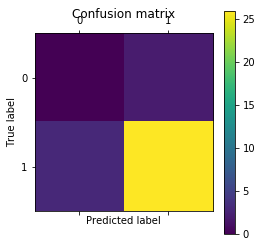



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



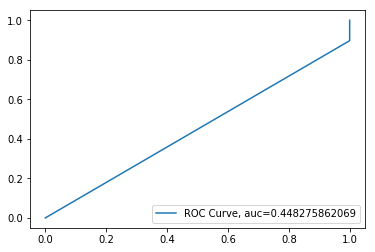

N_Neighbours:   8 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


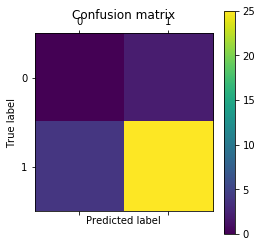



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



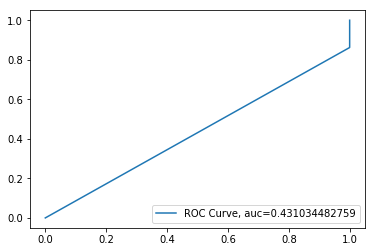

N_Neighbours:   8 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


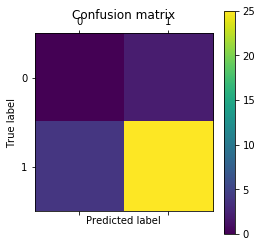



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



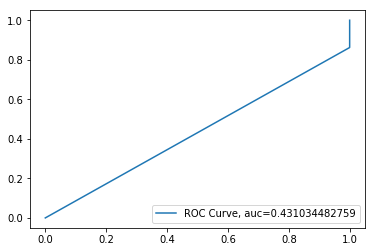

N_Neighbours:   8 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


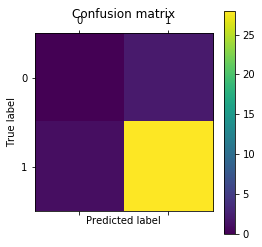



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



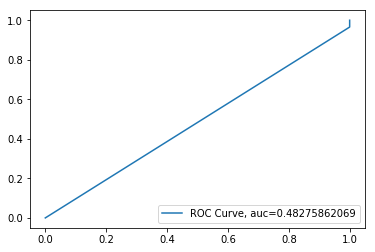

N_Neighbours:   8 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


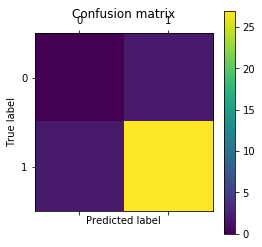



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



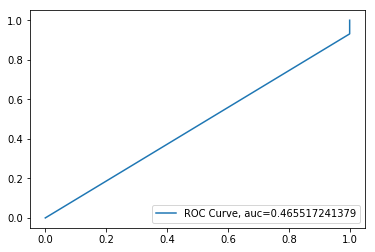

N_Neighbours:   8 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


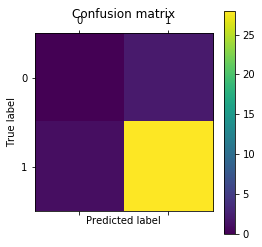



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



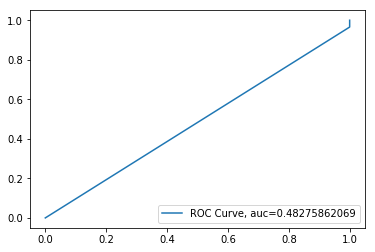

N_Neighbours:   8 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
[[ 0  2]
 [ 3 26]]


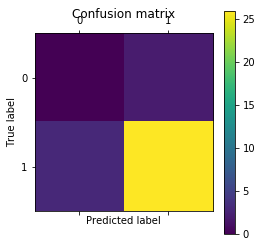



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.90      0.91        29

avg / total       0.87      0.84      0.85        31



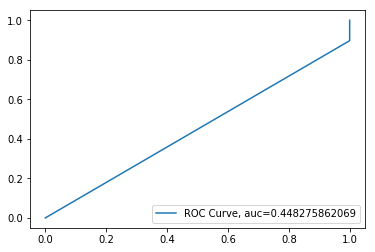

N_Neighbours:   8 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


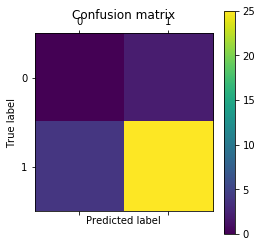



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



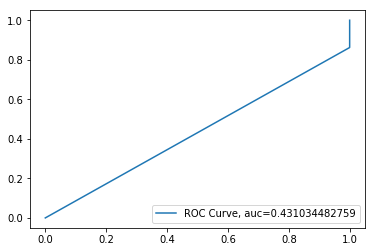

N_Neighbours:   8 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
[[ 0  2]
 [ 4 25]]


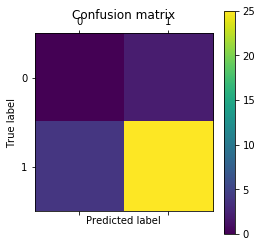



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.86      0.89        29

avg / total       0.87      0.81      0.84        31



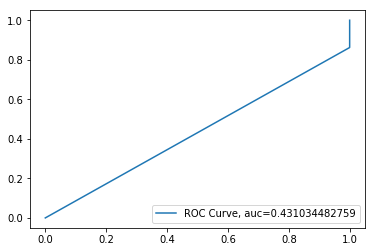

N_Neighbours:   8 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


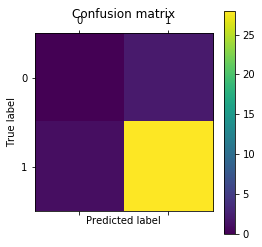



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



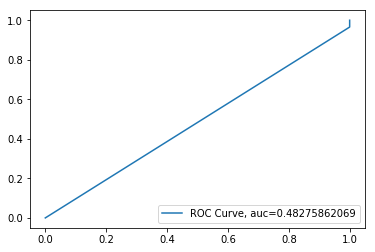

N_Neighbours:   8 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


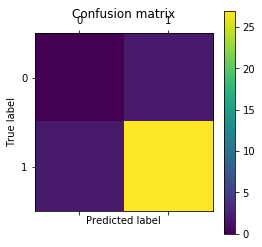



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



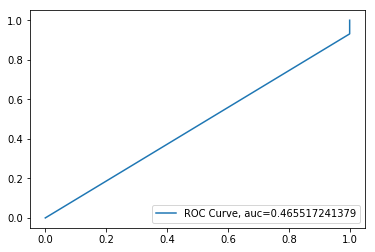

N_Neighbours:   8 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


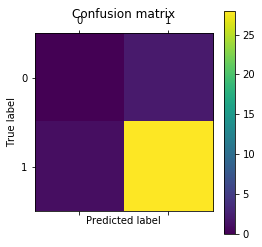



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



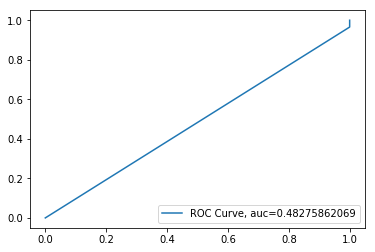

N_Neighbours:   9 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


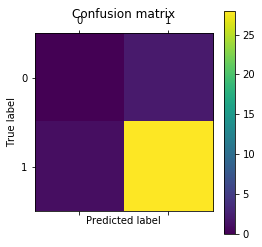



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



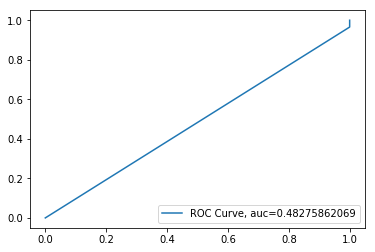

N_Neighbours:   9 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


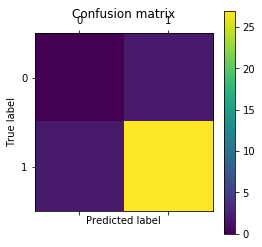



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



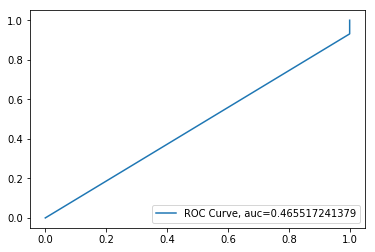

N_Neighbours:   9 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


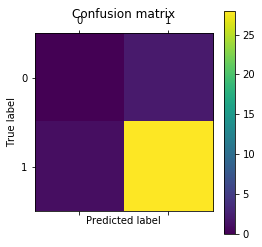



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



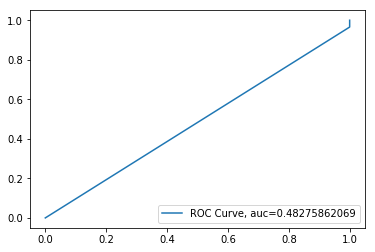

N_Neighbours:   9 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


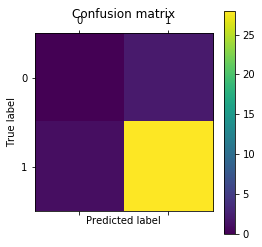



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



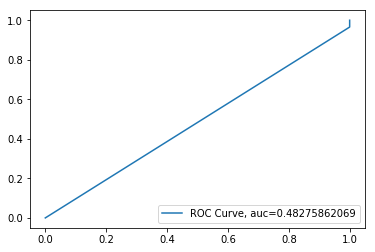

N_Neighbours:   9 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


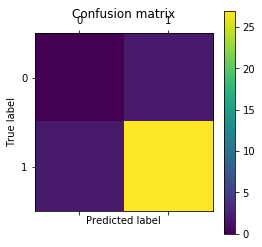



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



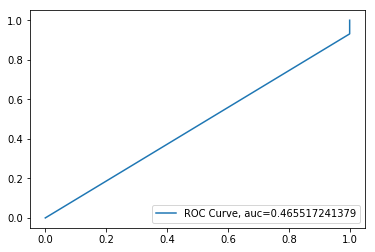

N_Neighbours:   9 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


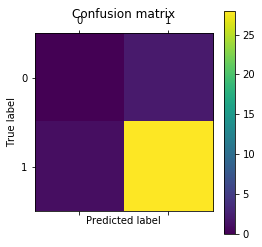



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



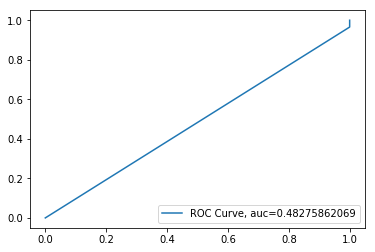

N_Neighbours:   9 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


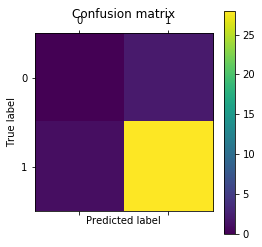



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



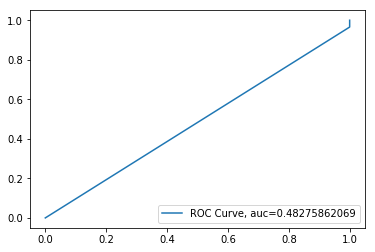

N_Neighbours:   9 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


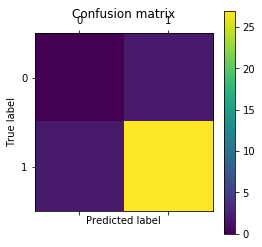



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



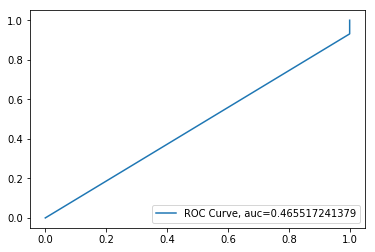

N_Neighbours:   9 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


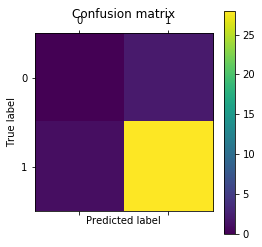



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



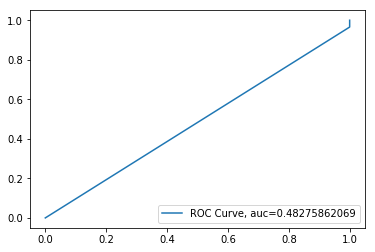

N_Neighbours:   9 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


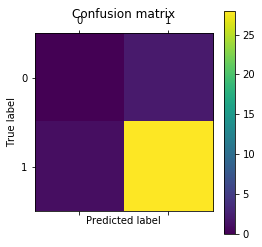



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



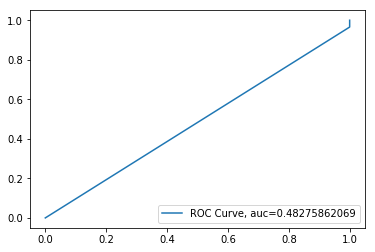

N_Neighbours:   9 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


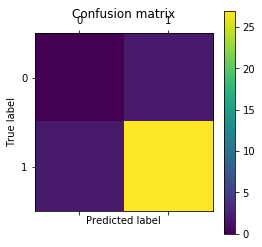



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



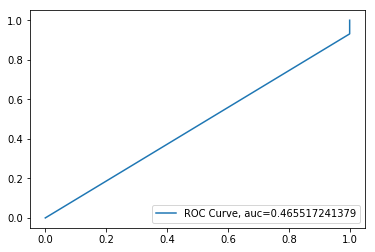

N_Neighbours:   9 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


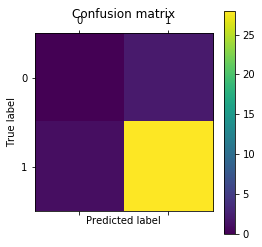



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



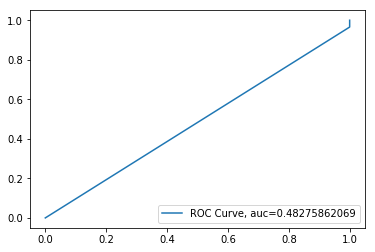

N_Neighbours:   9 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


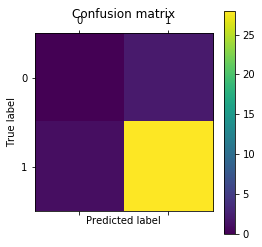



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



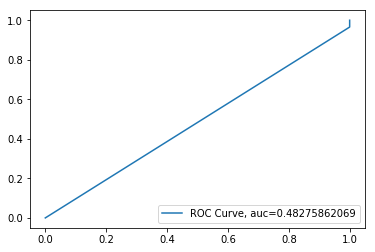

N_Neighbours:   9 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


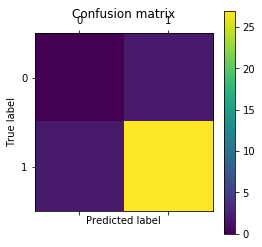



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



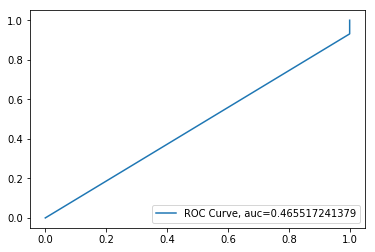

N_Neighbours:   9 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


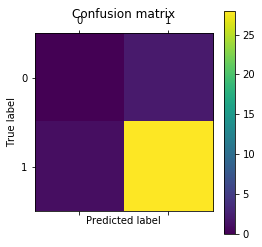



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



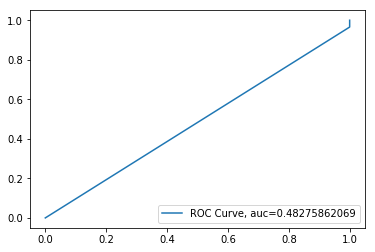

N_Neighbours:   9 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


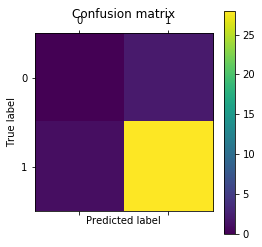



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



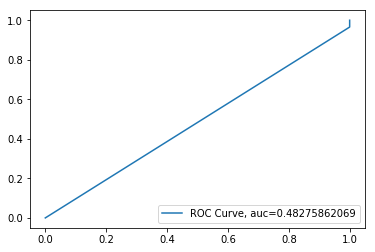

N_Neighbours:   9 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


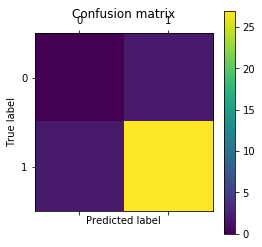



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



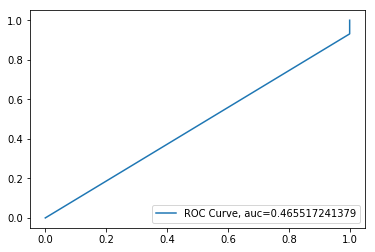

N_Neighbours:   9 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


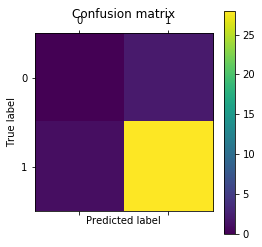



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



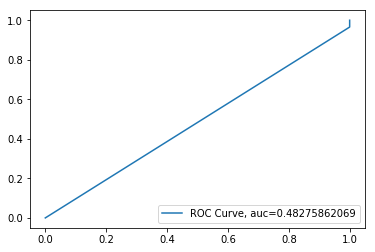

N_Neighbours:   9 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


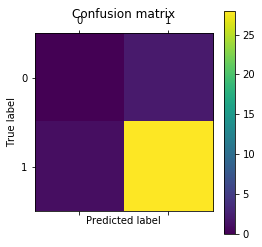



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



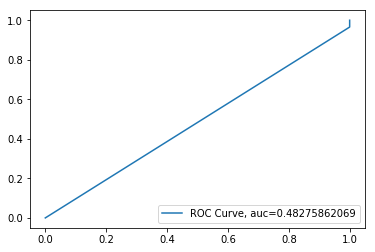

N_Neighbours:   9 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


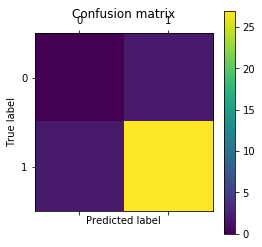



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



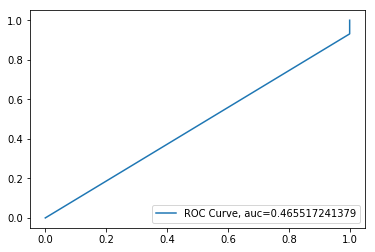

N_Neighbours:   9 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


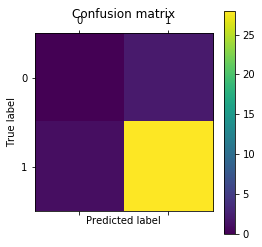



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



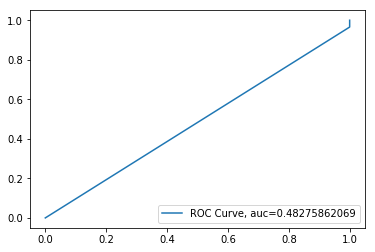

N_Neighbours:   9 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


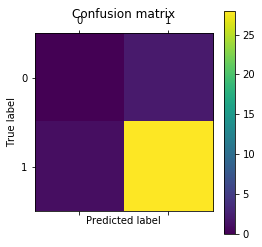



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



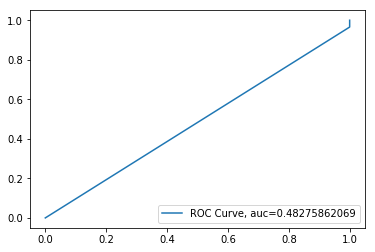

N_Neighbours:   9 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
[[ 0  2]
 [ 2 27]]


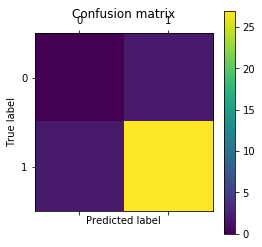



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.93      0.93        29

avg / total       0.87      0.87      0.87        31



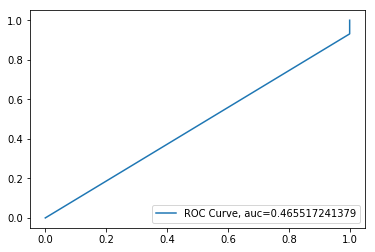

N_Neighbours:   9 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 0  2]
 [ 1 28]]


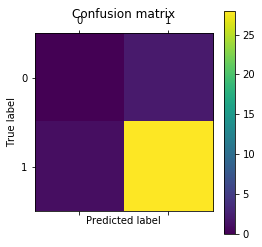



             precision    recall  f1-score   support

          0       0.00      0.00      0.00         2
          1       0.93      0.97      0.95        29

avg / total       0.87      0.90      0.89        31



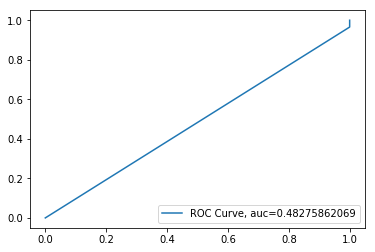

In [71]:
pp = [1,2,3] #power parameter
w= np.array(['uniform','distance']) #weight
alg = np.array(['auto','brute','ball_tree','kd_tree']) #algo
for i in  range(1,10):
    for j in alg:
        for k in w:
            for power_param in pp:
                knn = KNeighborsClassifier(n_neighbors=i, algorithm=j, weights = k,p = power_param)
                knn.fit(hp_xtrain, hp_ytrain)
                hp_ypred = knn.predict(hp_xtest)
                print("N_Neighbours:  ", i , ', Algo: ', j , ', weight: ', k, ', PowerParameter: ', power_param)

                print("Accuracy:",metrics.accuracy_score(hp_ytest, hp_ypred)) 
                cm = confusion_matrix(hp_ytest, hp_ypred)
                print(cm)
                plt.matshow(cm)
                plt.title('Confusion matrix')
                plt.colorbar()
                plt.ylabel('True label')
                plt.xlabel('Predicted label')
                plt.show()
                print('\n')
                print(classification_report(hp_ytest, hp_ypred))

                #fpr, tpr, thresholds = roc_curve(hp_ytest, hp_ypred)
                #plt.plot(fpr, tpr, lw=1, alpha=0.3,label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
                fpr, tpr, thresholds = roc_curve(hp_ytest, hp_ypred)
                auc = roc_auc_score(hp_ytest, hp_ypred)
                plt.plot(fpr,tpr,label="ROC Curve, auc="+str(auc))
                plt.legend(loc=4)
                plt.show()

In [104]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(hp_xtrain)
hp_xtrn=scaler.transform(hp_xtrain)
hp_xtst=scaler.transform(hp_xtest)

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


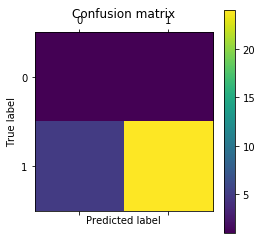



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



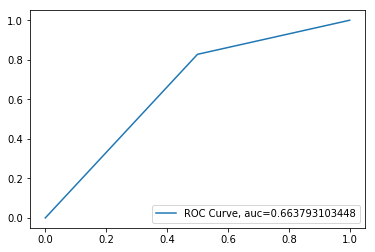

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


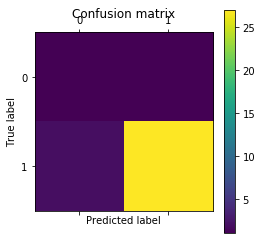



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



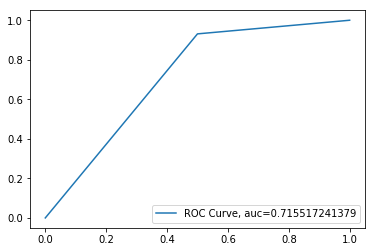

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


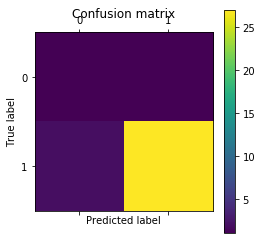



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



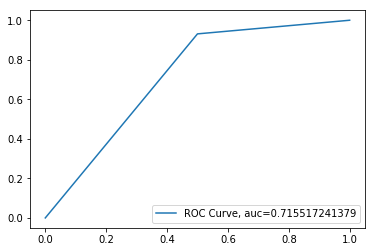

N_Neighbours:   1 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


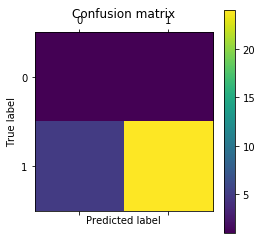



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



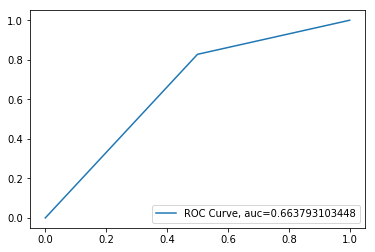

N_Neighbours:   1 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


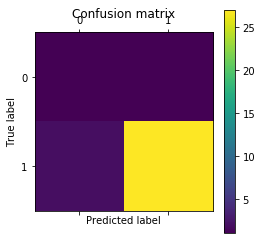



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



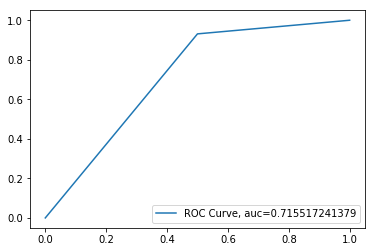

N_Neighbours:   1 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


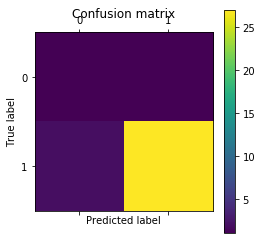



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



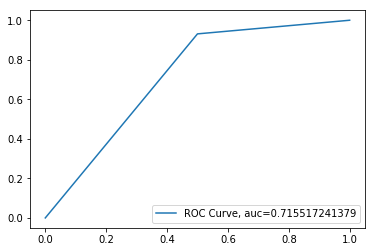

N_Neighbours:   1 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


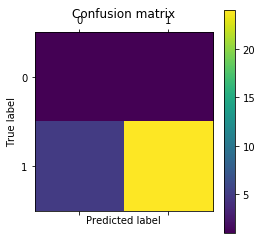



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



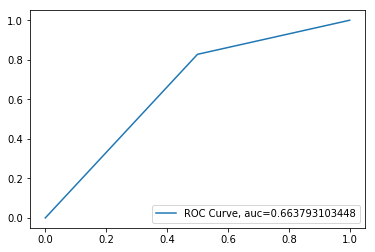

N_Neighbours:   1 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


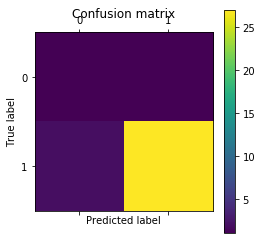



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



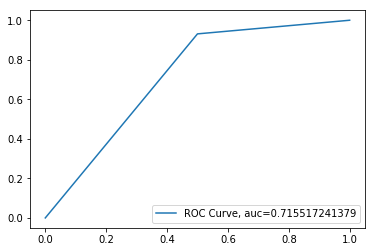

N_Neighbours:   1 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


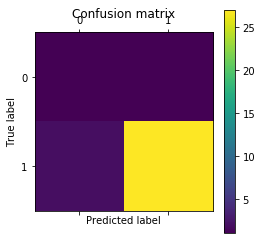



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



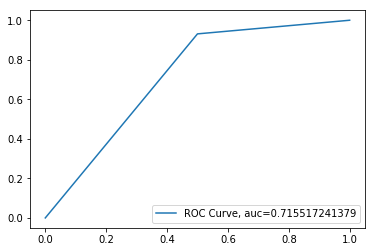

N_Neighbours:   1 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


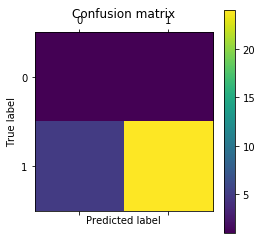



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



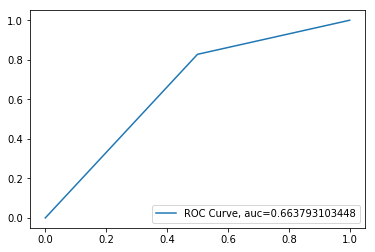

N_Neighbours:   1 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


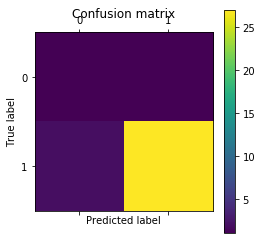



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



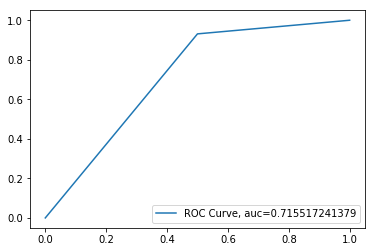

N_Neighbours:   1 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


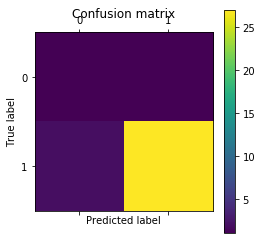



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



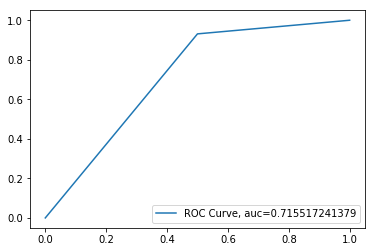

N_Neighbours:   1 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


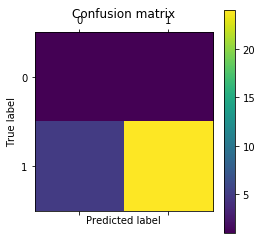



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



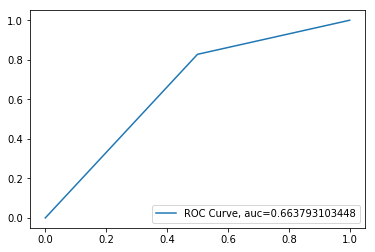

N_Neighbours:   1 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


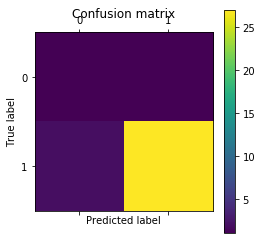



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



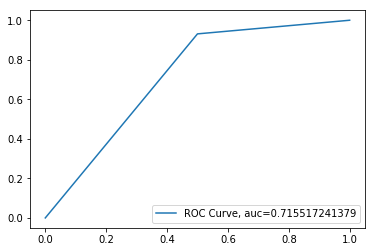

N_Neighbours:   1 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


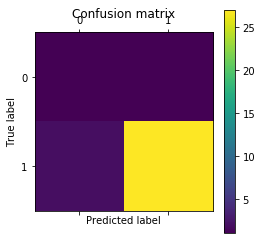



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



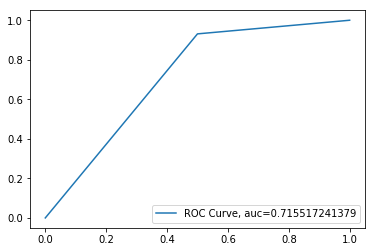

N_Neighbours:   1 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


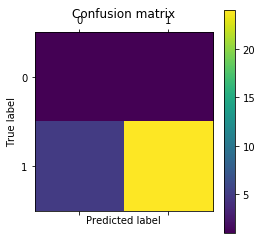



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



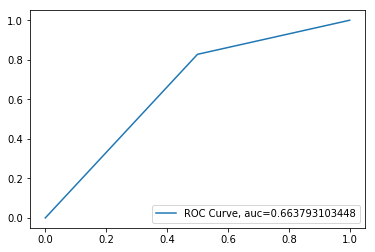

N_Neighbours:   1 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


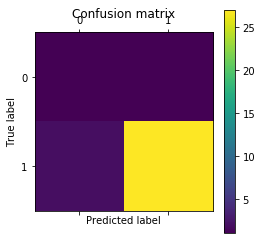



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



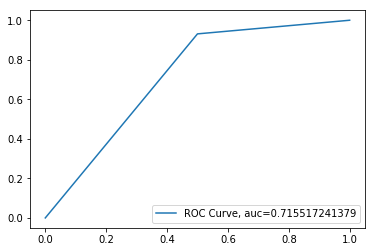

N_Neighbours:   1 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


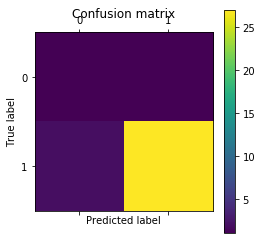



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



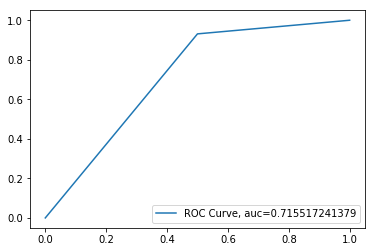

N_Neighbours:   1 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


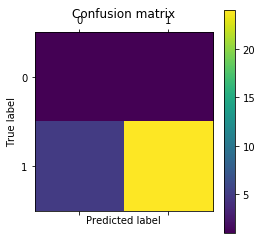



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



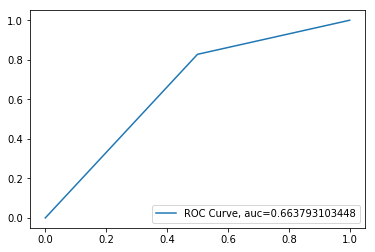

N_Neighbours:   1 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


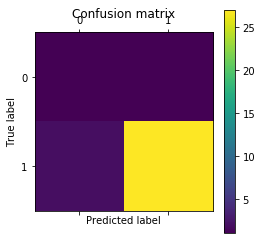



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



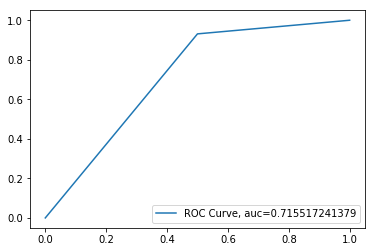

N_Neighbours:   1 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


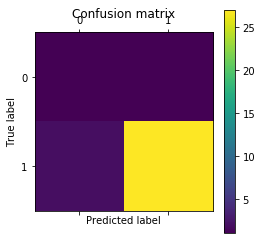



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



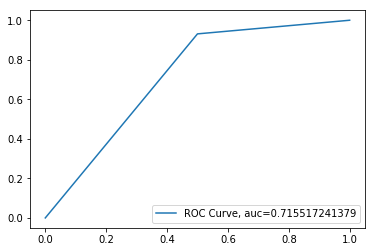

N_Neighbours:   1 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


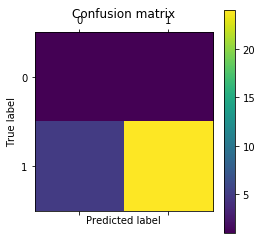



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



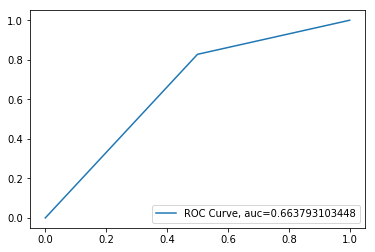

N_Neighbours:   1 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


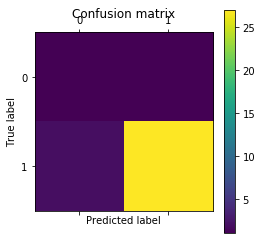



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



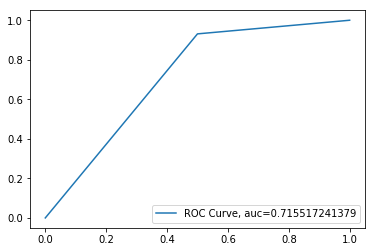

N_Neighbours:   1 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


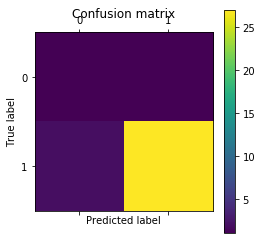



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



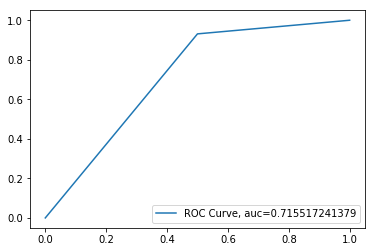

N_Neighbours:   2 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.709677419355
[[ 1  1]
 [ 8 21]]


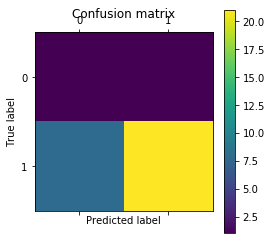



             precision    recall  f1-score   support

          0       0.11      0.50      0.18         2
          1       0.95      0.72      0.82        29

avg / total       0.90      0.71      0.78        31



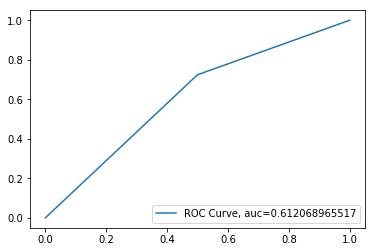

N_Neighbours:   2 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
[[ 1  1]
 [ 7 22]]


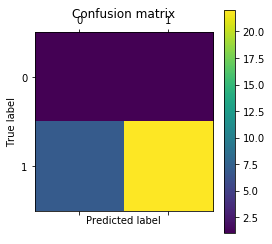



             precision    recall  f1-score   support

          0       0.12      0.50      0.20         2
          1       0.96      0.76      0.85        29

avg / total       0.90      0.74      0.80        31



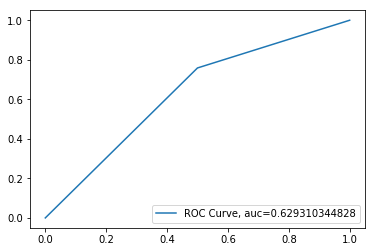

N_Neighbours:   2 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


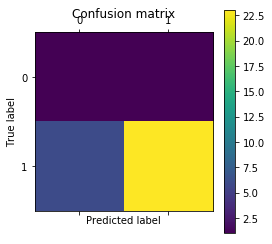



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



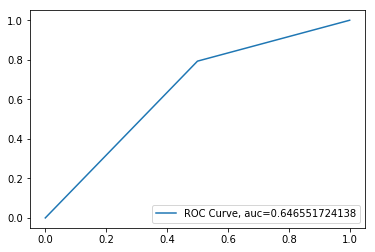

N_Neighbours:   2 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


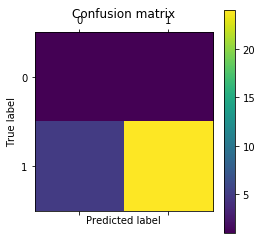



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



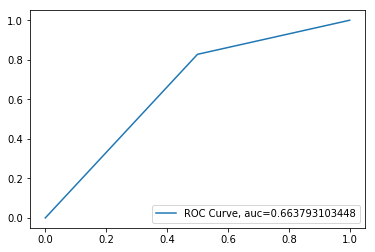

N_Neighbours:   2 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


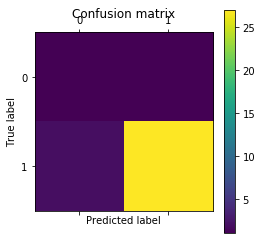



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



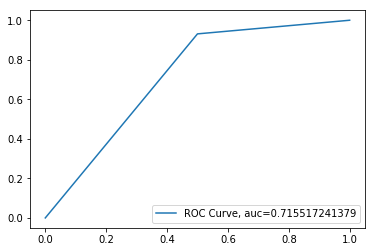

N_Neighbours:   2 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


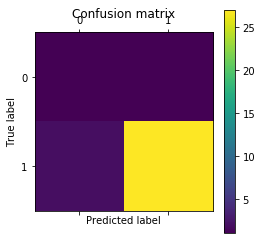



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



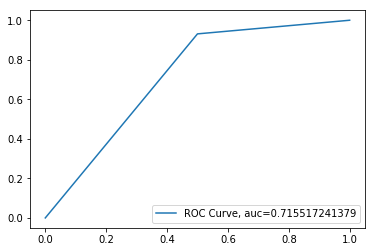

N_Neighbours:   2 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.709677419355
[[ 1  1]
 [ 8 21]]


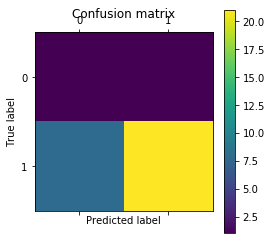



             precision    recall  f1-score   support

          0       0.11      0.50      0.18         2
          1       0.95      0.72      0.82        29

avg / total       0.90      0.71      0.78        31



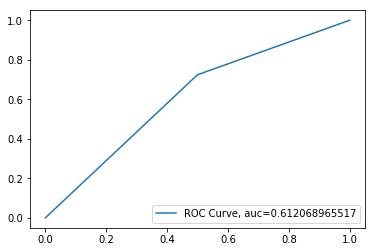

N_Neighbours:   2 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
[[ 1  1]
 [ 7 22]]


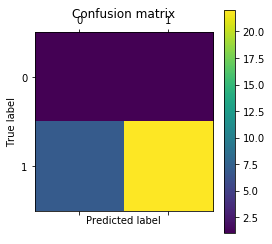



             precision    recall  f1-score   support

          0       0.12      0.50      0.20         2
          1       0.96      0.76      0.85        29

avg / total       0.90      0.74      0.80        31



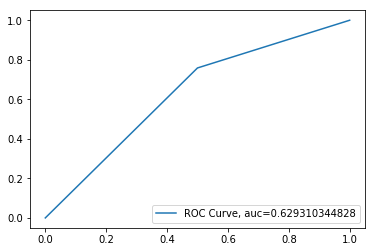

N_Neighbours:   2 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


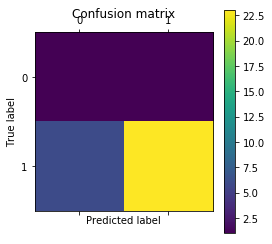



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



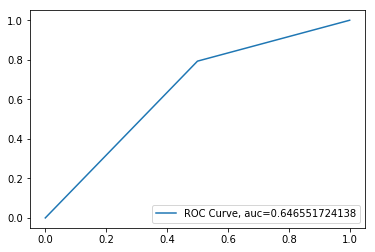

N_Neighbours:   2 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


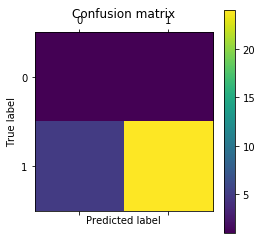



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



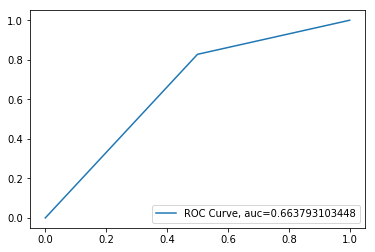

N_Neighbours:   2 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


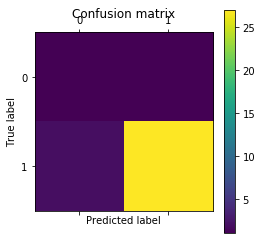



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



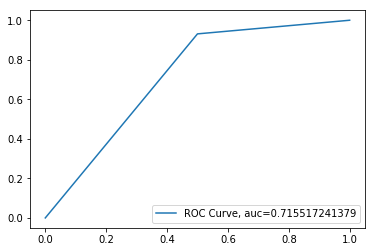

N_Neighbours:   2 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


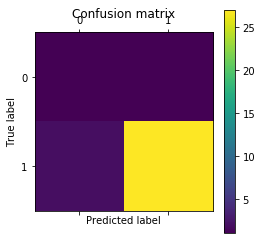



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



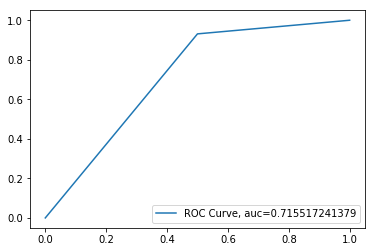

N_Neighbours:   2 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.709677419355
[[ 1  1]
 [ 8 21]]


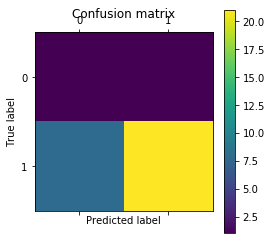



             precision    recall  f1-score   support

          0       0.11      0.50      0.18         2
          1       0.95      0.72      0.82        29

avg / total       0.90      0.71      0.78        31



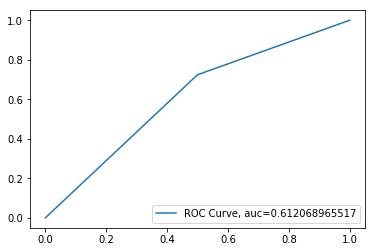

N_Neighbours:   2 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
[[ 1  1]
 [ 7 22]]


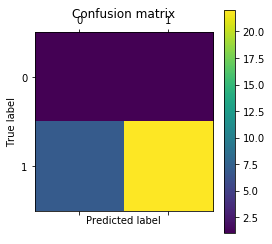



             precision    recall  f1-score   support

          0       0.12      0.50      0.20         2
          1       0.96      0.76      0.85        29

avg / total       0.90      0.74      0.80        31



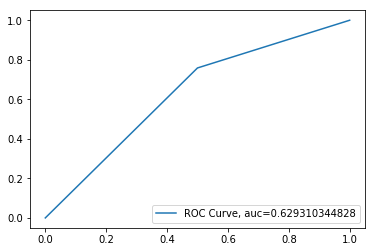

N_Neighbours:   2 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


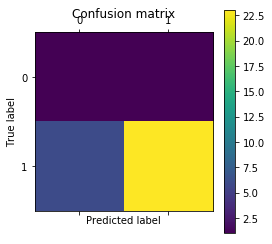



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



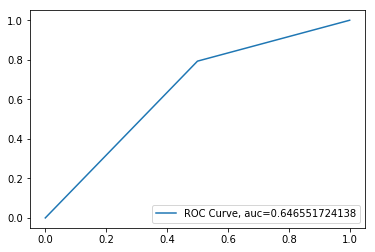

N_Neighbours:   2 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


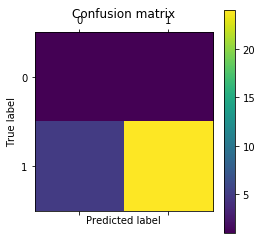



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



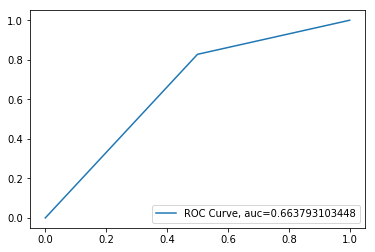

N_Neighbours:   2 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


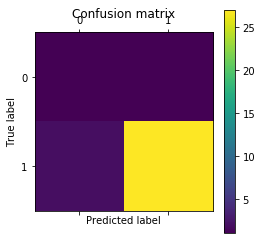



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



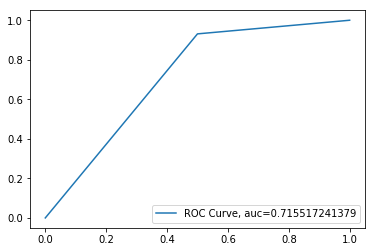

N_Neighbours:   2 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


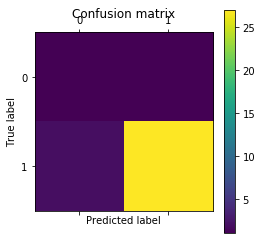



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



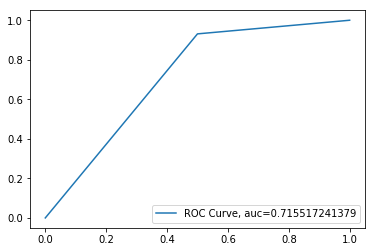

N_Neighbours:   2 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.709677419355
[[ 1  1]
 [ 8 21]]


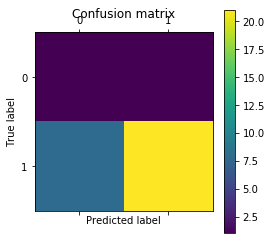



             precision    recall  f1-score   support

          0       0.11      0.50      0.18         2
          1       0.95      0.72      0.82        29

avg / total       0.90      0.71      0.78        31



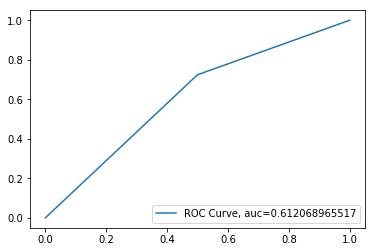

N_Neighbours:   2 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
[[ 1  1]
 [ 7 22]]


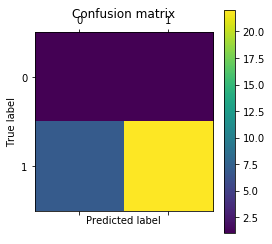



             precision    recall  f1-score   support

          0       0.12      0.50      0.20         2
          1       0.96      0.76      0.85        29

avg / total       0.90      0.74      0.80        31



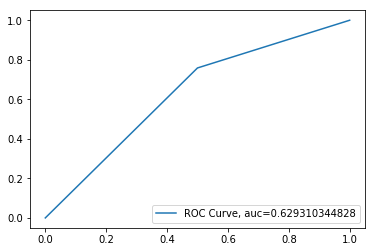

N_Neighbours:   2 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.774193548387
[[ 1  1]
 [ 6 23]]


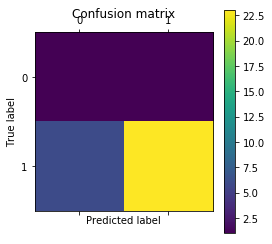



             precision    recall  f1-score   support

          0       0.14      0.50      0.22         2
          1       0.96      0.79      0.87        29

avg / total       0.91      0.77      0.83        31



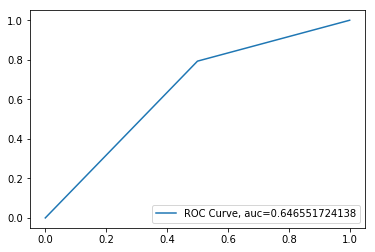

N_Neighbours:   2 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
[[ 1  1]
 [ 5 24]]


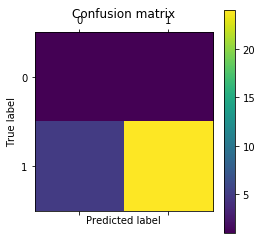



             precision    recall  f1-score   support

          0       0.17      0.50      0.25         2
          1       0.96      0.83      0.89        29

avg / total       0.91      0.81      0.85        31



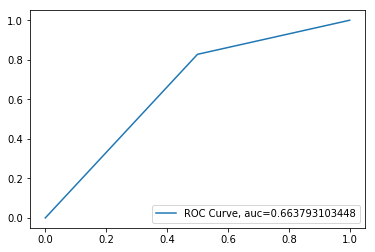

N_Neighbours:   2 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


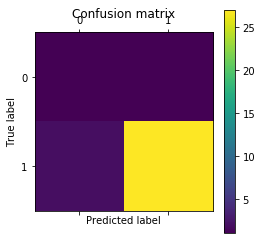



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



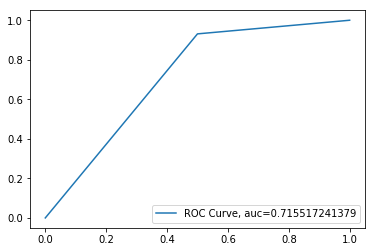

N_Neighbours:   2 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


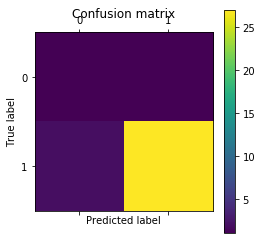



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



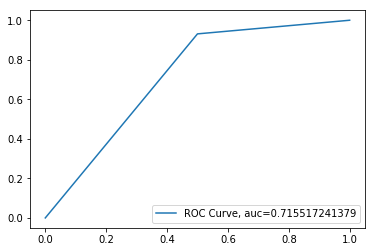

N_Neighbours:   3 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


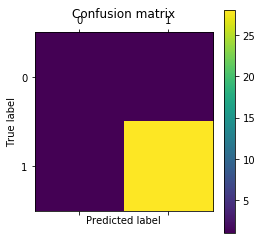



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



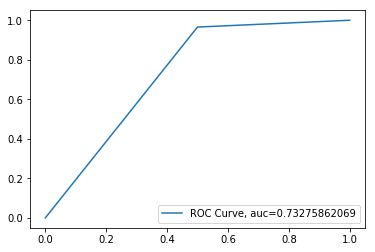

N_Neighbours:   3 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


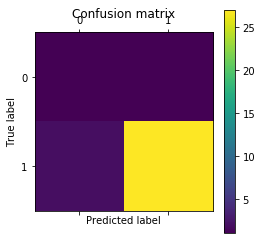



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



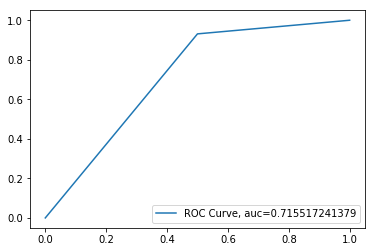

N_Neighbours:   3 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


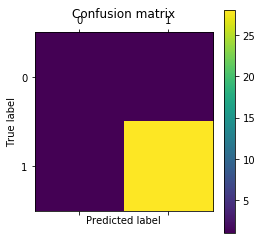



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



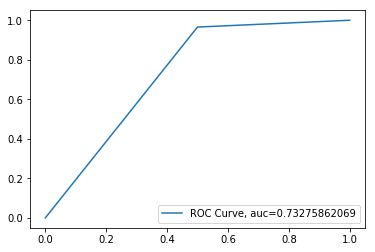

N_Neighbours:   3 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


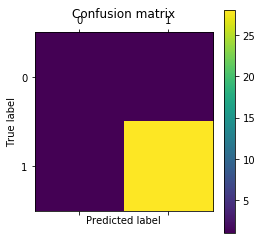



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



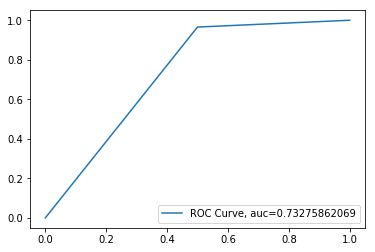

N_Neighbours:   3 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


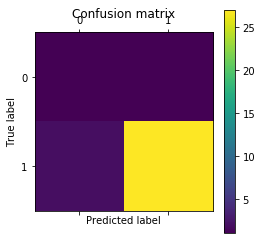



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



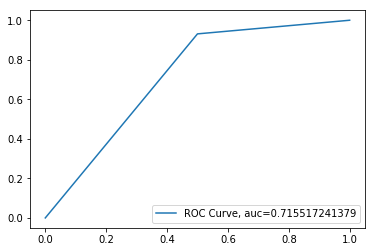

N_Neighbours:   3 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


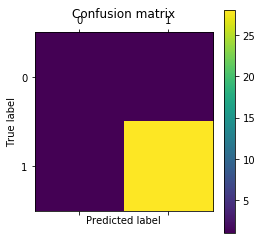



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



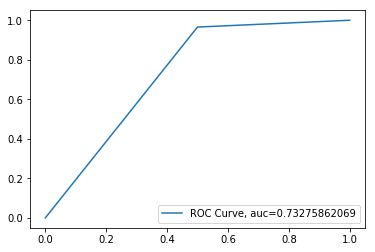

N_Neighbours:   3 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


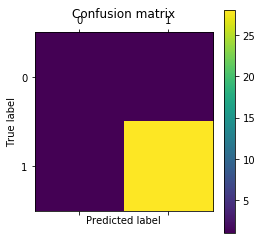



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



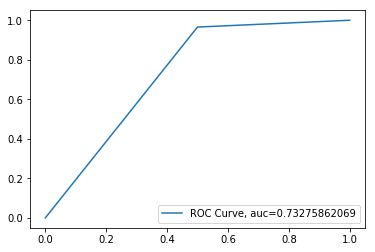

N_Neighbours:   3 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


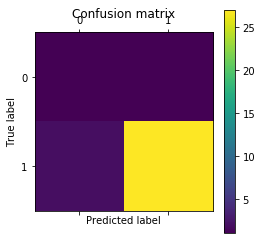



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



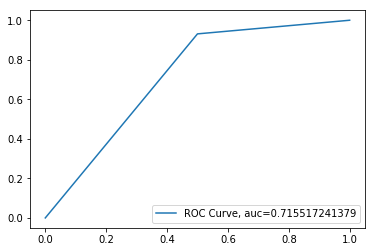

N_Neighbours:   3 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


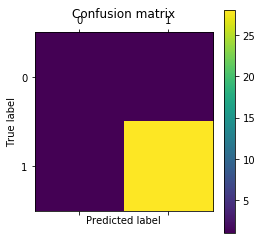



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



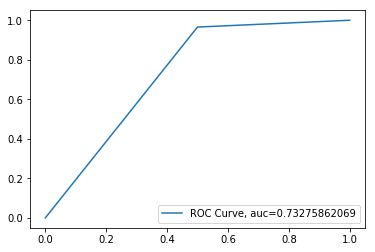

N_Neighbours:   3 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


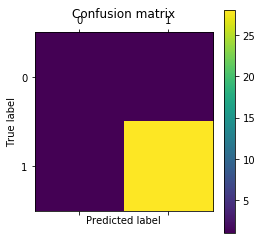



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



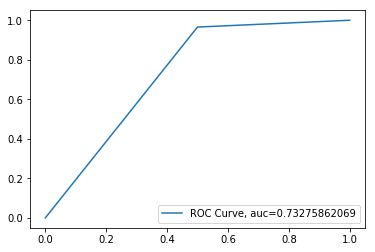

N_Neighbours:   3 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


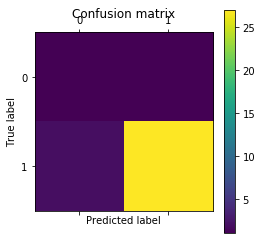



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



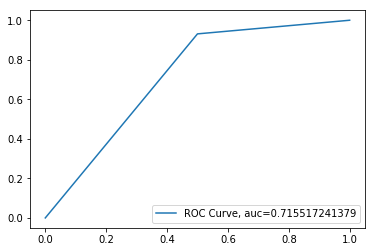

N_Neighbours:   3 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


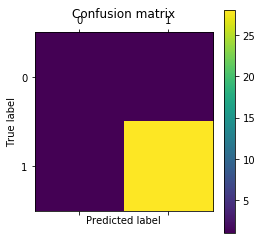



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



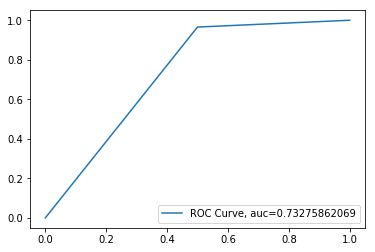

N_Neighbours:   3 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


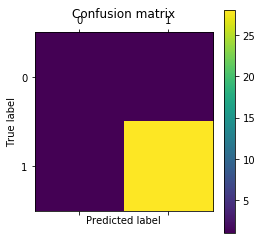



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



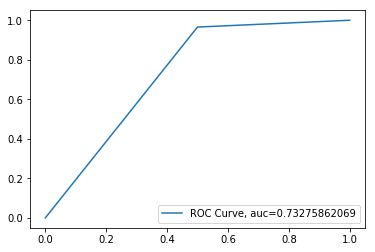

N_Neighbours:   3 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


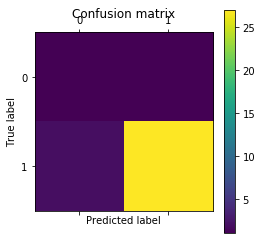



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



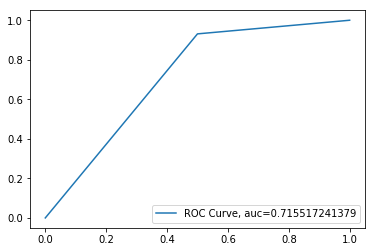

N_Neighbours:   3 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


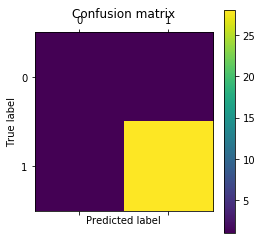



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



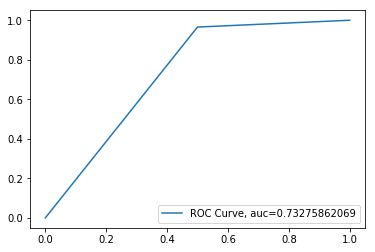

N_Neighbours:   3 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


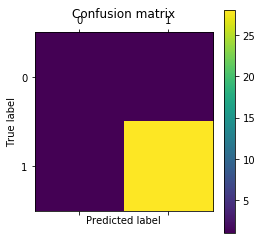



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



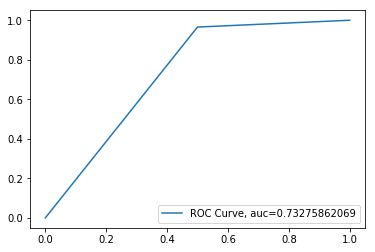

N_Neighbours:   3 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


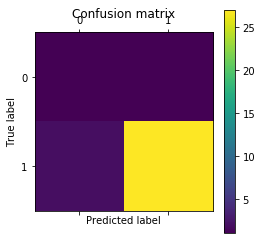



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



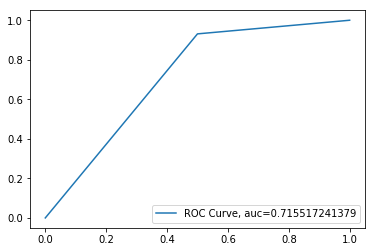

N_Neighbours:   3 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


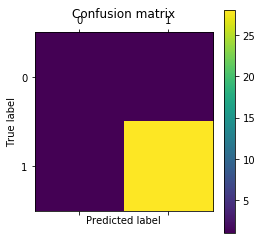



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



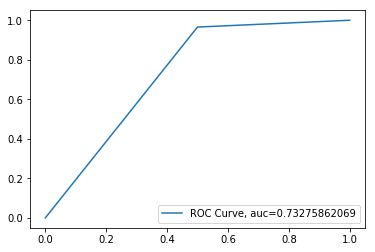

N_Neighbours:   3 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


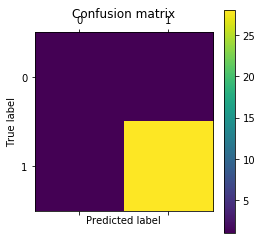



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



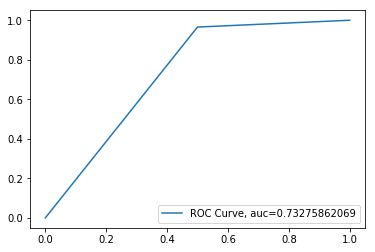

N_Neighbours:   3 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


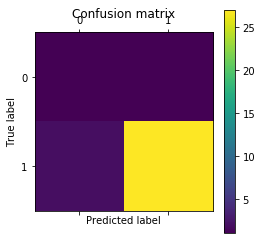



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



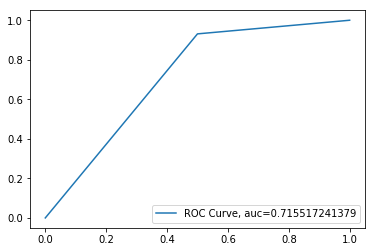

N_Neighbours:   3 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


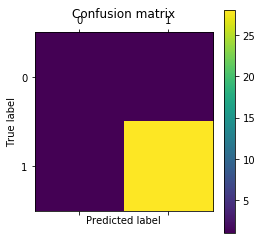



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



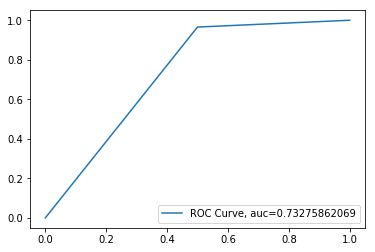

N_Neighbours:   3 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


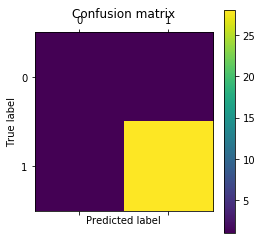



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



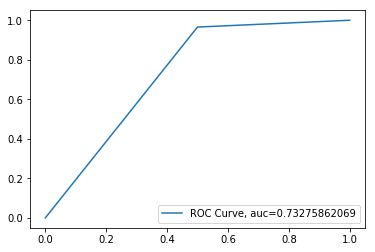

N_Neighbours:   3 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


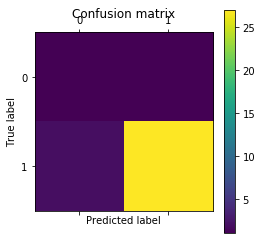



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



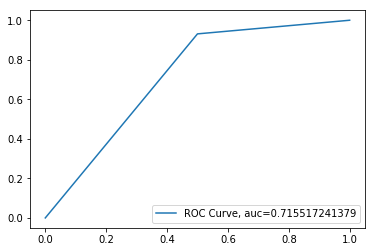

N_Neighbours:   3 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


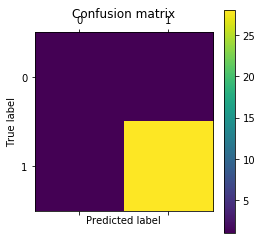



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



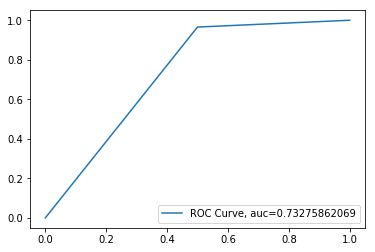

N_Neighbours:   4 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


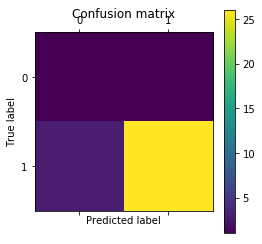



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



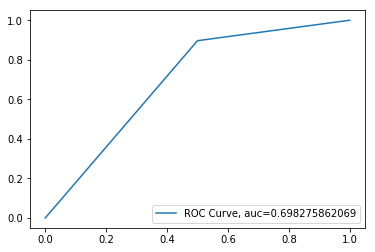

N_Neighbours:   4 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


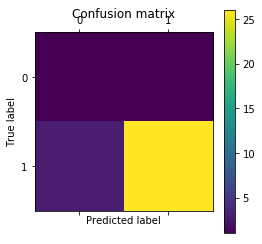



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



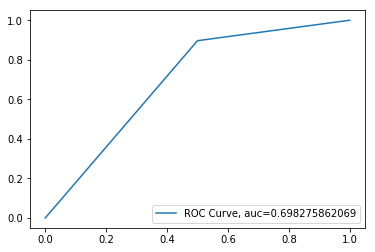

N_Neighbours:   4 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


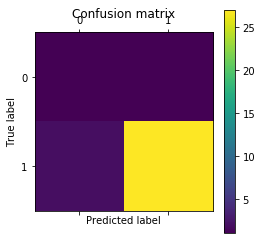



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



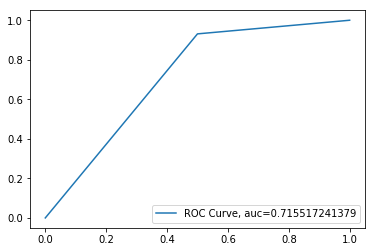

N_Neighbours:   4 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


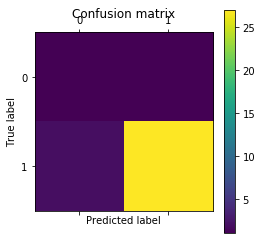



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



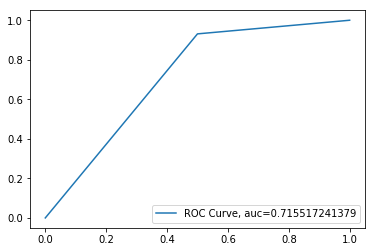

N_Neighbours:   4 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


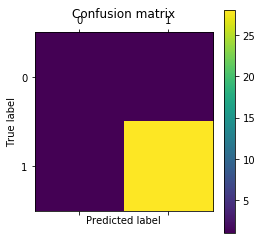



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



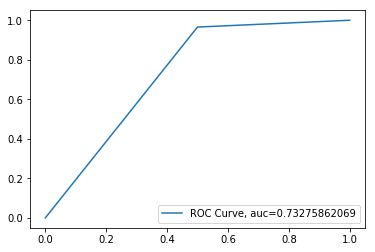

N_Neighbours:   4 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


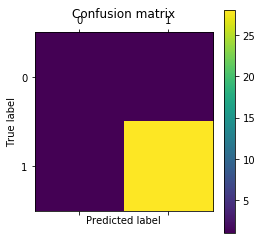



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



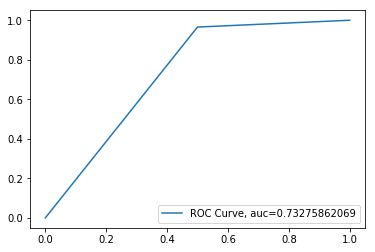

N_Neighbours:   4 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


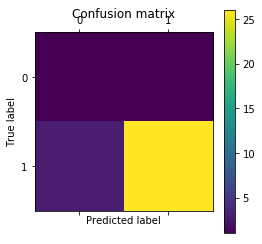



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



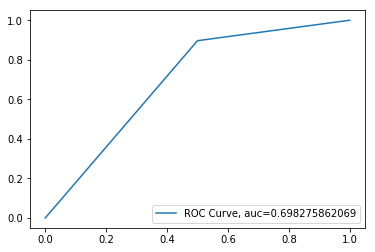

N_Neighbours:   4 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


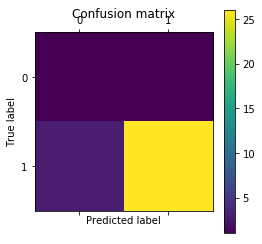



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



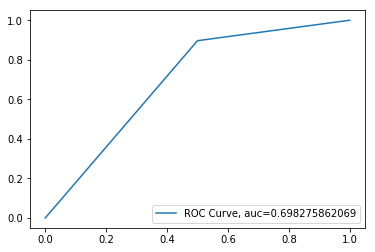

N_Neighbours:   4 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


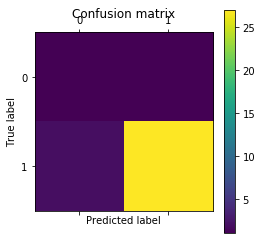



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



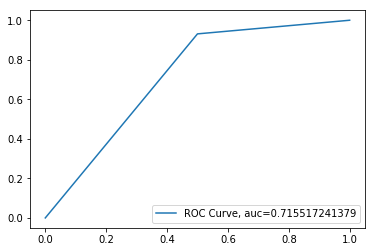

N_Neighbours:   4 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


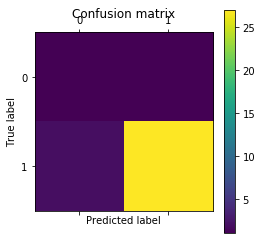



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



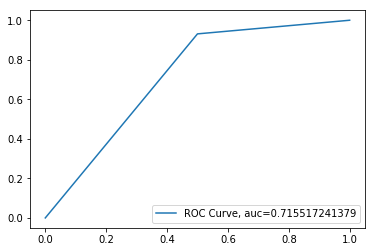

N_Neighbours:   4 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


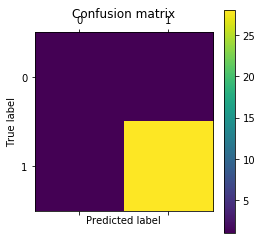



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



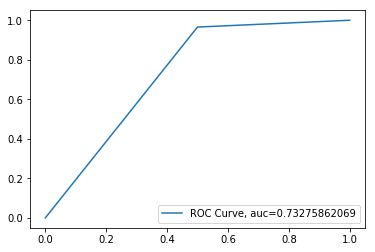

N_Neighbours:   4 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


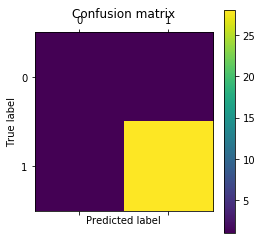



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



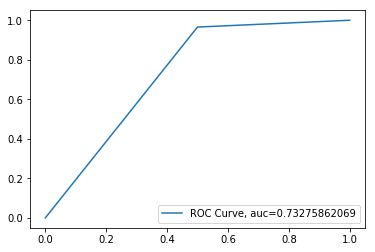

N_Neighbours:   4 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


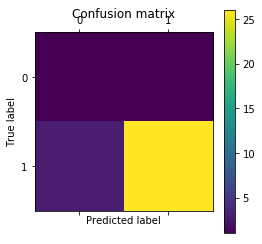



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



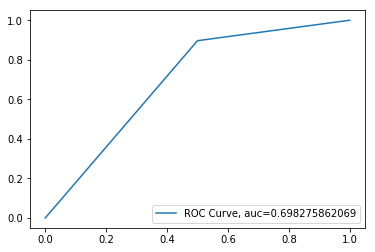

N_Neighbours:   4 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


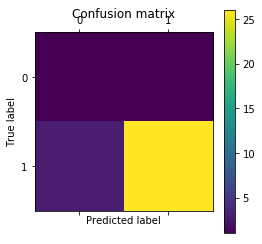



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



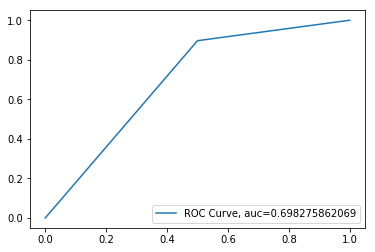

N_Neighbours:   4 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


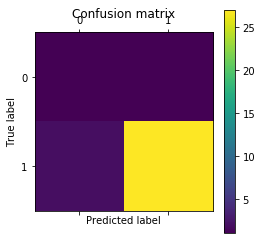



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



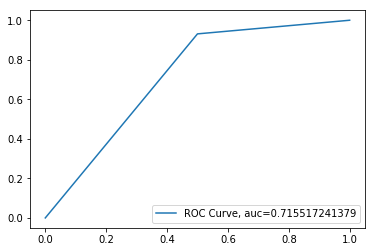

N_Neighbours:   4 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


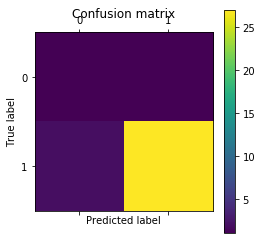



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



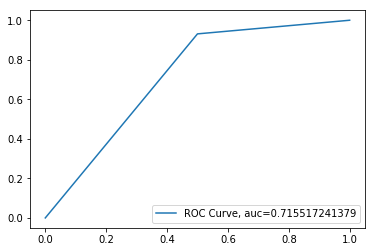

N_Neighbours:   4 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


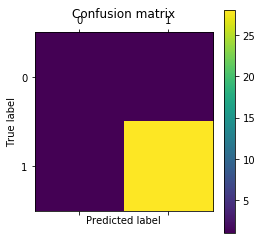



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



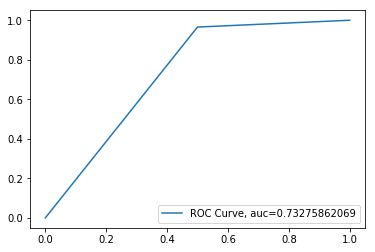

N_Neighbours:   4 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


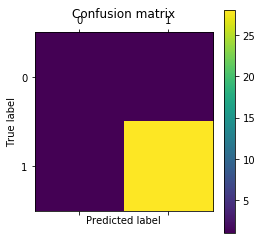



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



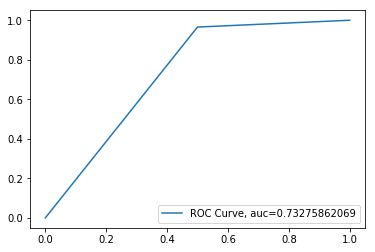

N_Neighbours:   4 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


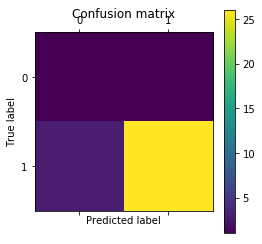



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



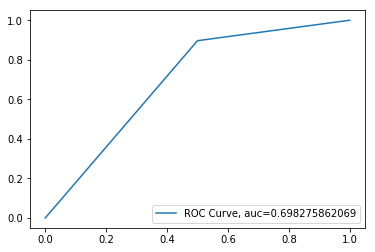

N_Neighbours:   4 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


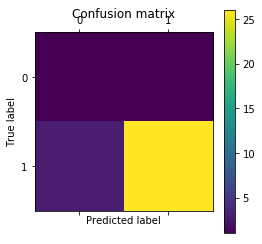



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



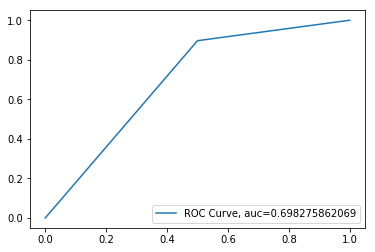

N_Neighbours:   4 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


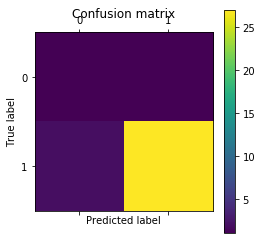



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



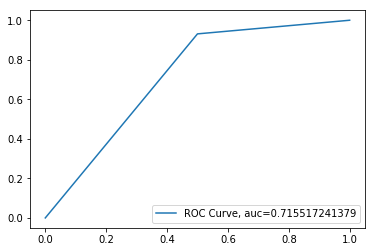

N_Neighbours:   4 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


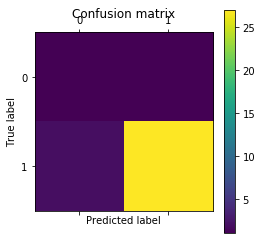



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



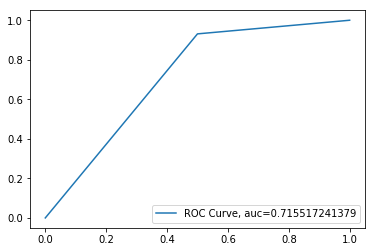

N_Neighbours:   4 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


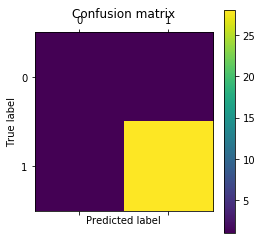



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



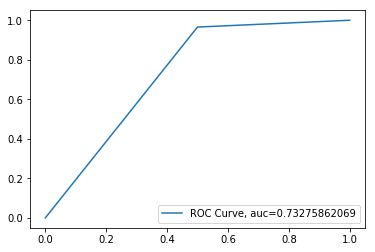

N_Neighbours:   4 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


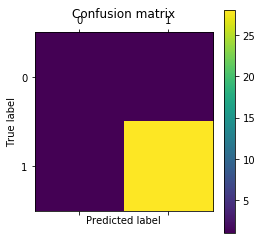



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



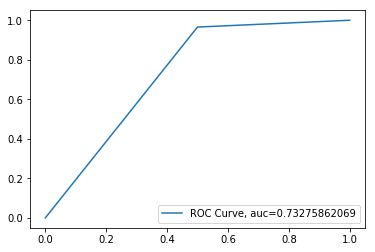

N_Neighbours:   5 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


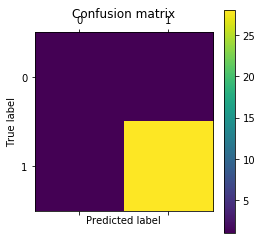



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



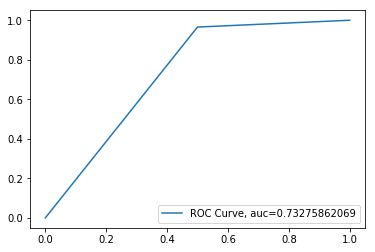

N_Neighbours:   5 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


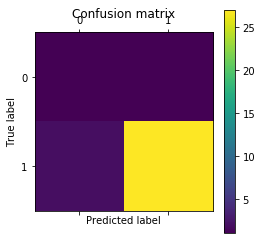



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



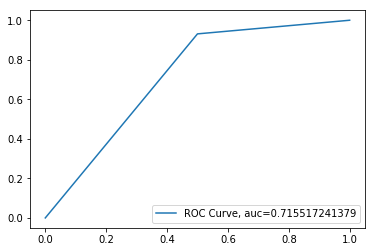

N_Neighbours:   5 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


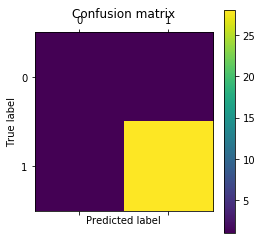



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



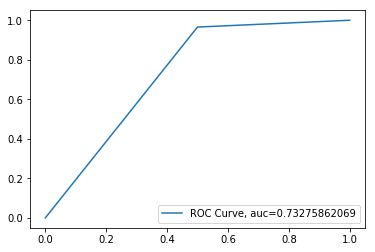

N_Neighbours:   5 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


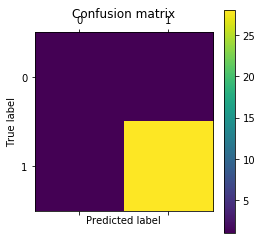



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



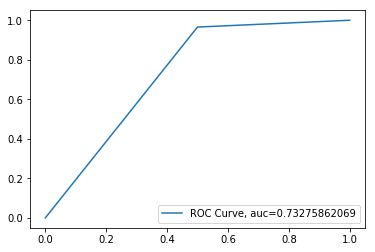

N_Neighbours:   5 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


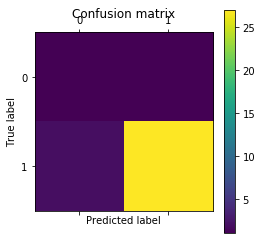



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



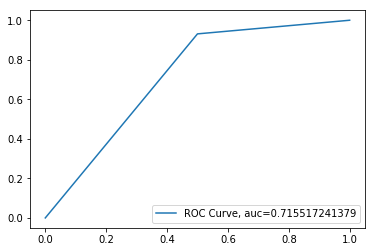

N_Neighbours:   5 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


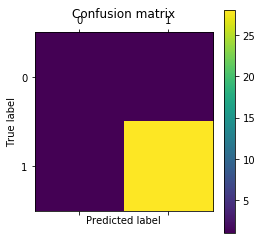



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



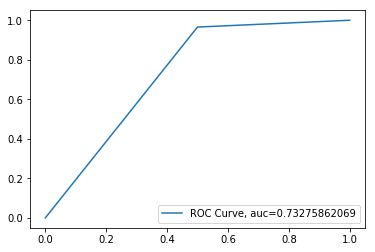

N_Neighbours:   5 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


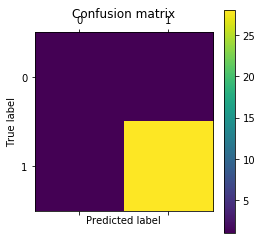



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



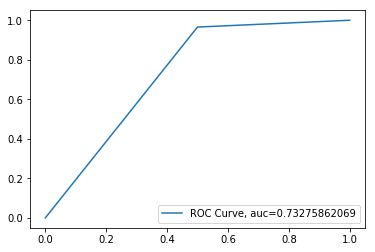

N_Neighbours:   5 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


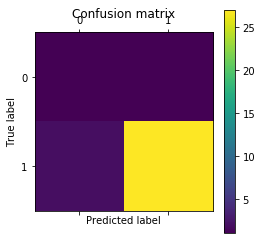



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



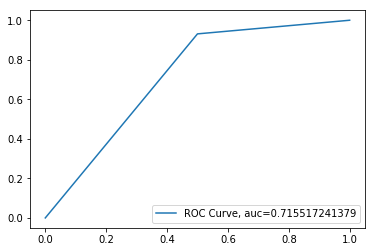

N_Neighbours:   5 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


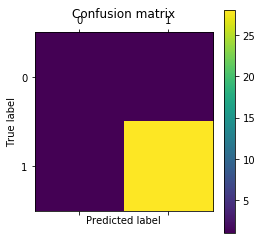



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



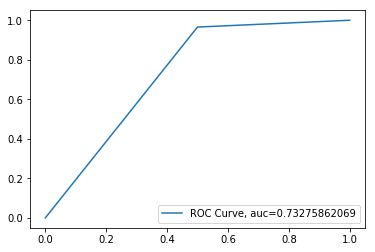

N_Neighbours:   5 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


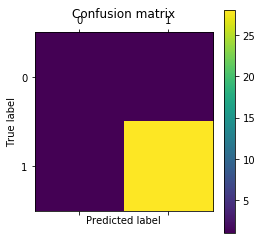



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



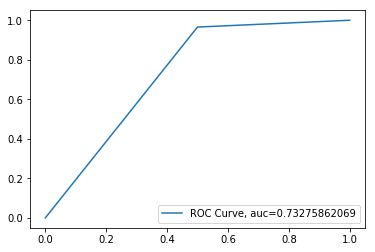

N_Neighbours:   5 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


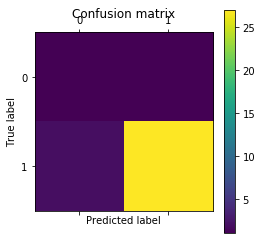



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



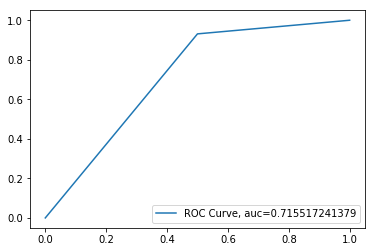

N_Neighbours:   5 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


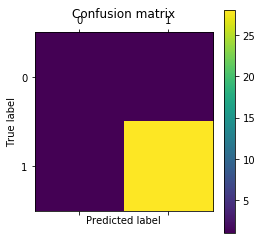



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



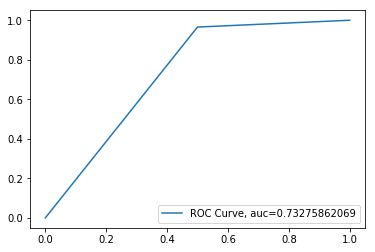

N_Neighbours:   5 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


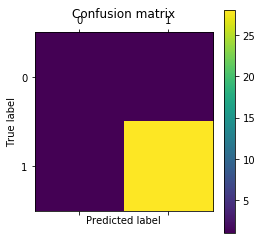



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



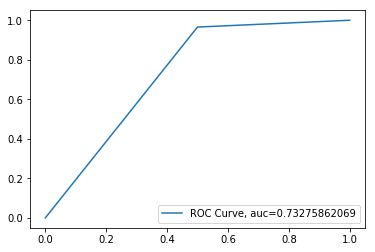

N_Neighbours:   5 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


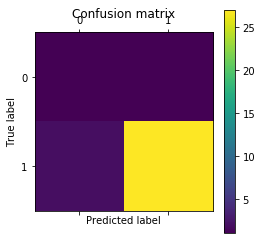



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



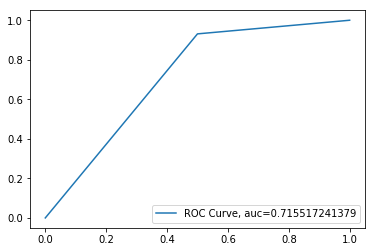

N_Neighbours:   5 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


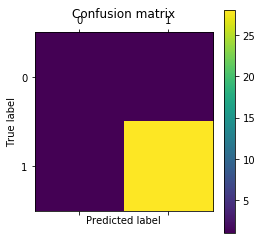



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



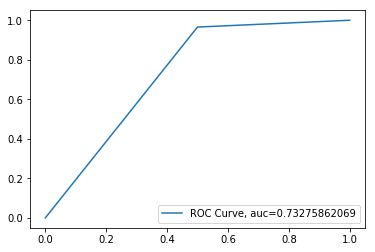

N_Neighbours:   5 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


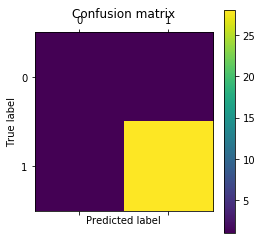



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



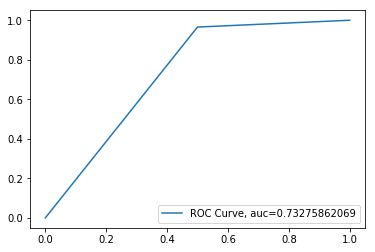

N_Neighbours:   5 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


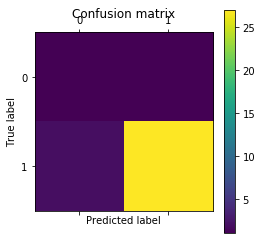



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



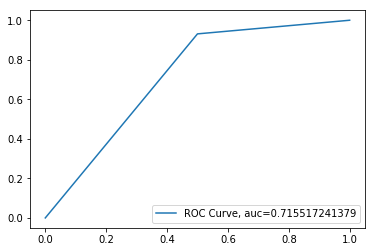

N_Neighbours:   5 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


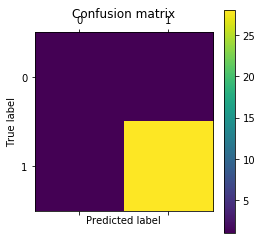



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



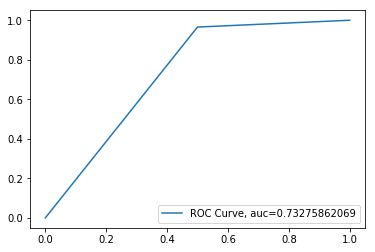

N_Neighbours:   5 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


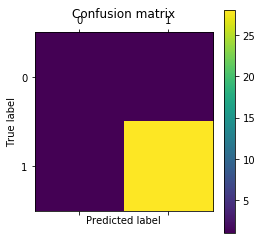



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



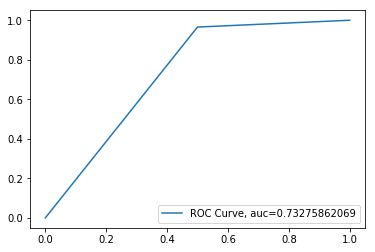

N_Neighbours:   5 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


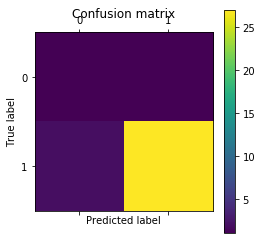



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



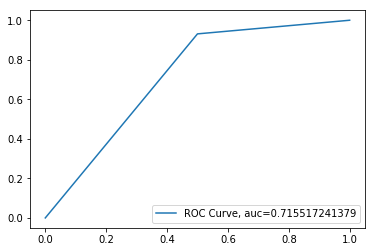

N_Neighbours:   5 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


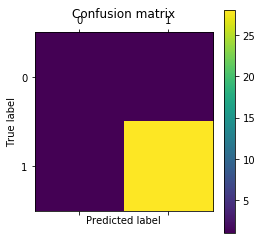



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



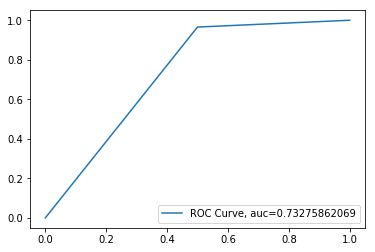

N_Neighbours:   5 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


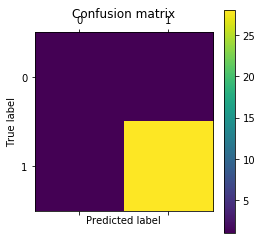



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



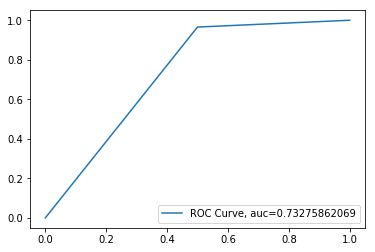

N_Neighbours:   5 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


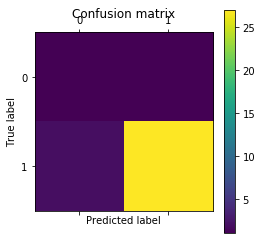



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



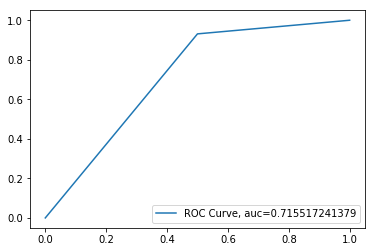

N_Neighbours:   5 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


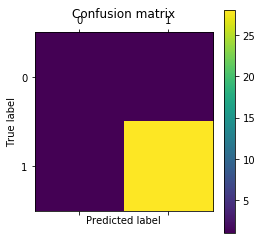



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



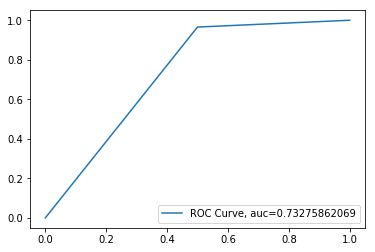

N_Neighbours:   6 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


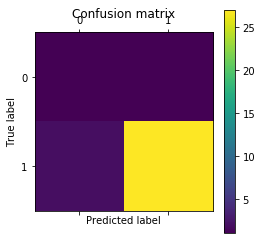



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



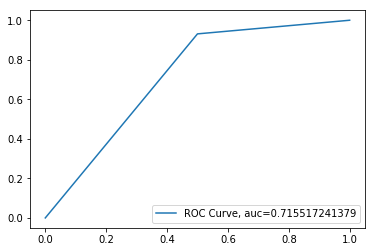

N_Neighbours:   6 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


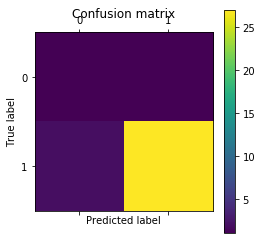



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



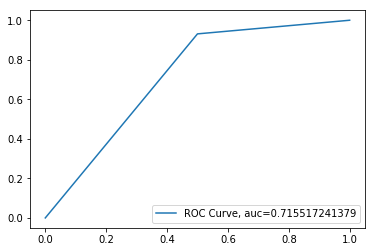

N_Neighbours:   6 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 2  0]
 [ 2 27]]


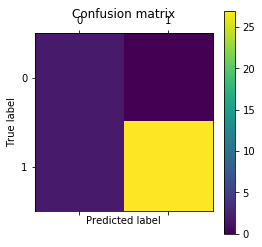



             precision    recall  f1-score   support

          0       0.50      1.00      0.67         2
          1       1.00      0.93      0.96        29

avg / total       0.97      0.94      0.95        31



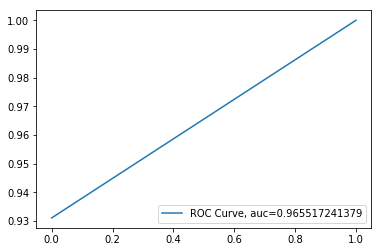

N_Neighbours:   6 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


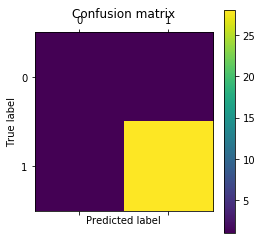



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



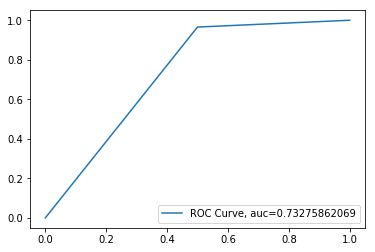

N_Neighbours:   6 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


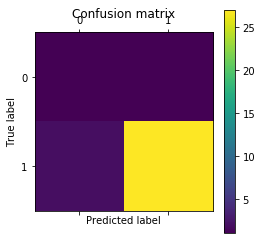



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



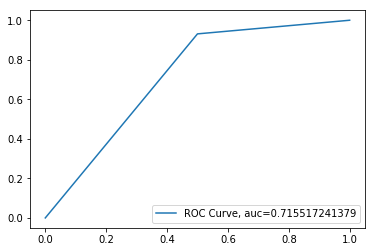

N_Neighbours:   6 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


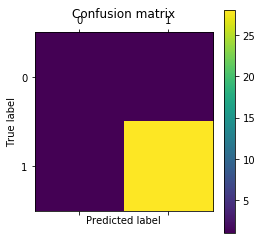



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



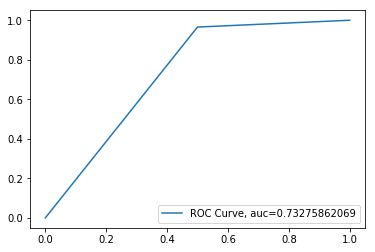

N_Neighbours:   6 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


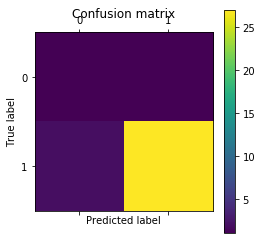



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



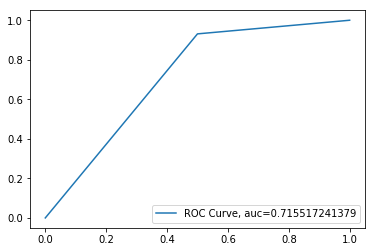

N_Neighbours:   6 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


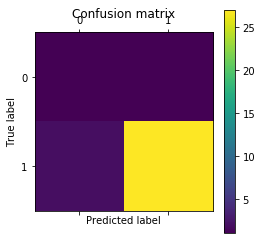



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



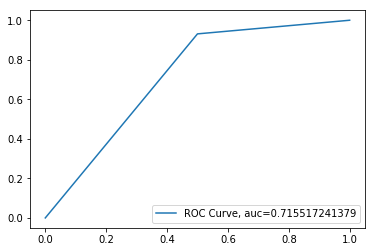

N_Neighbours:   6 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 2  0]
 [ 2 27]]


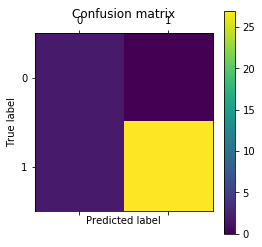



             precision    recall  f1-score   support

          0       0.50      1.00      0.67         2
          1       1.00      0.93      0.96        29

avg / total       0.97      0.94      0.95        31



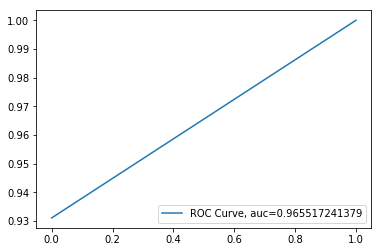

N_Neighbours:   6 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


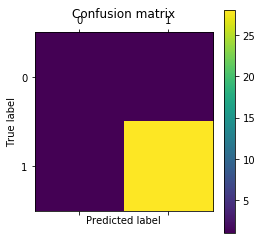



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



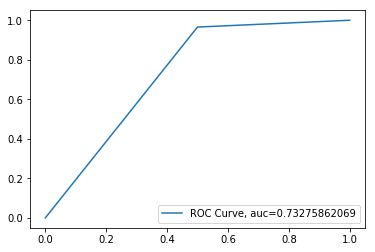

N_Neighbours:   6 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


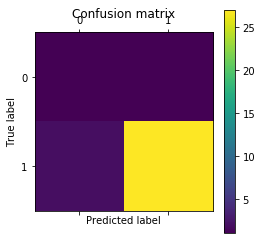



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



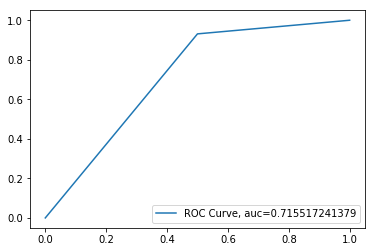

N_Neighbours:   6 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


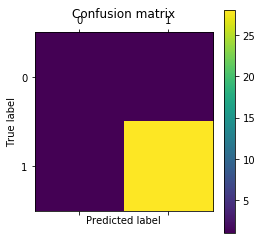



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



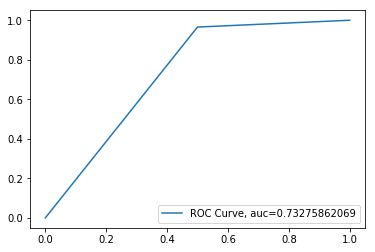

N_Neighbours:   6 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


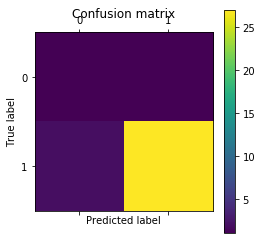



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



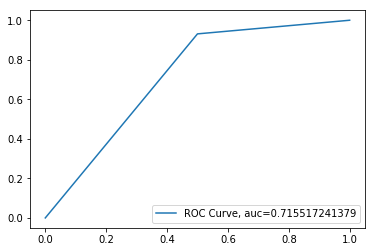

N_Neighbours:   6 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


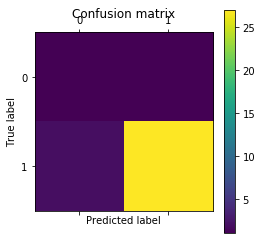



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



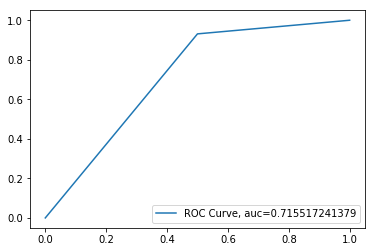

N_Neighbours:   6 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 2  0]
 [ 2 27]]


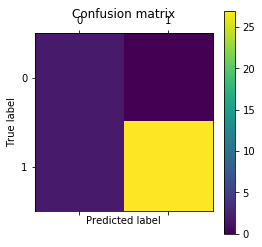



             precision    recall  f1-score   support

          0       0.50      1.00      0.67         2
          1       1.00      0.93      0.96        29

avg / total       0.97      0.94      0.95        31



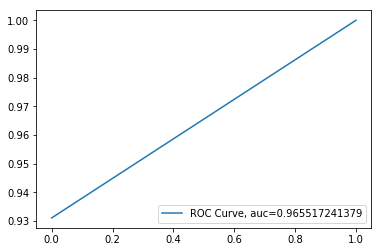

N_Neighbours:   6 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


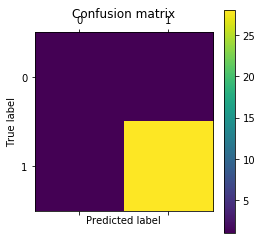



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



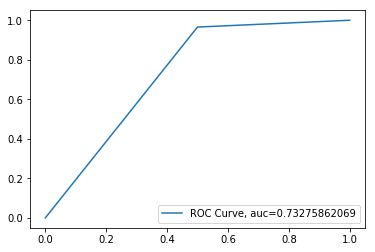

N_Neighbours:   6 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


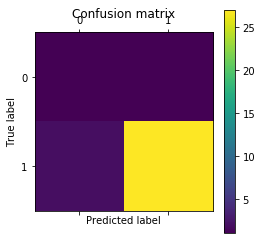



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



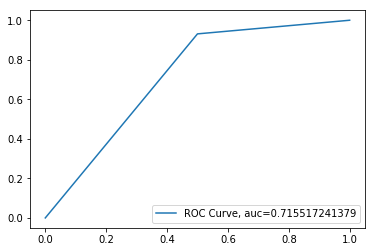

N_Neighbours:   6 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


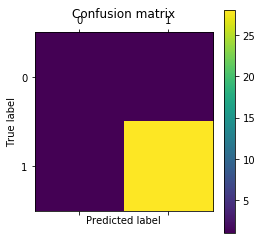



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



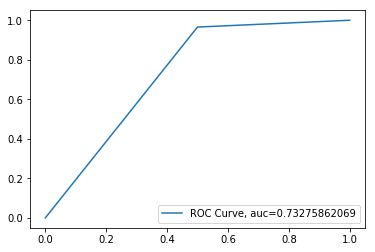

N_Neighbours:   6 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


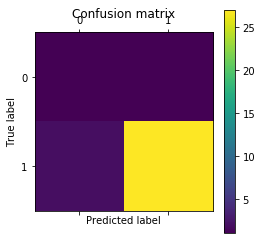



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



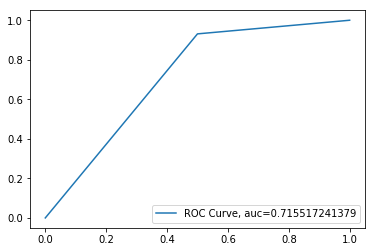

N_Neighbours:   6 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


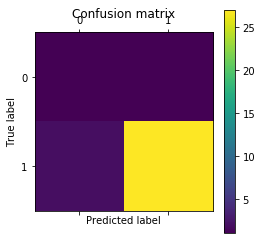



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



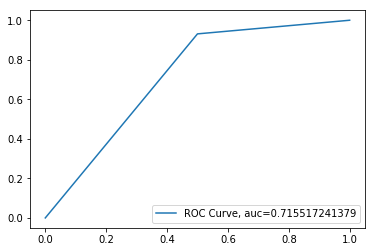

N_Neighbours:   6 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 2  0]
 [ 2 27]]


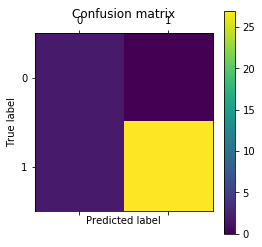



             precision    recall  f1-score   support

          0       0.50      1.00      0.67         2
          1       1.00      0.93      0.96        29

avg / total       0.97      0.94      0.95        31



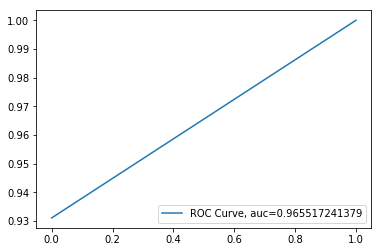

N_Neighbours:   6 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


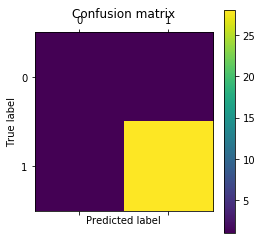



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



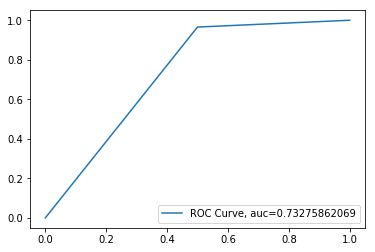

N_Neighbours:   6 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


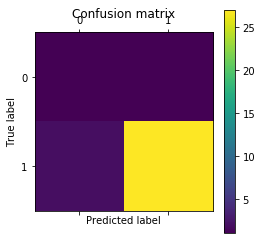



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



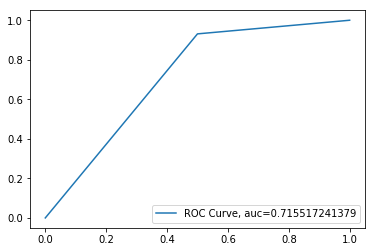

N_Neighbours:   6 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


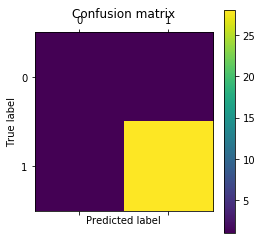



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



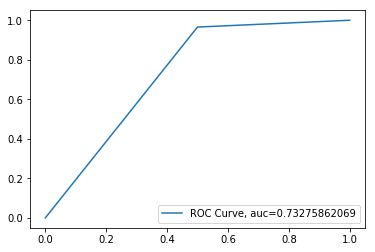

N_Neighbours:   7 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


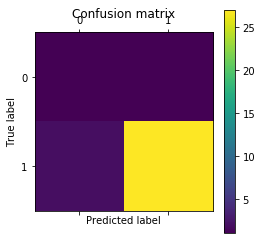



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



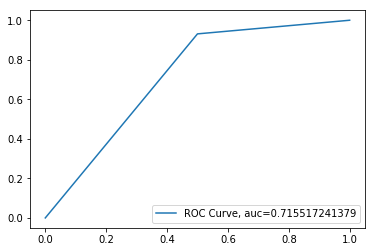

N_Neighbours:   7 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


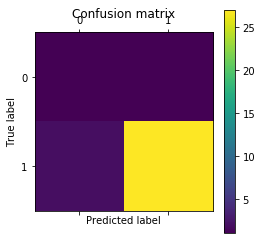



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



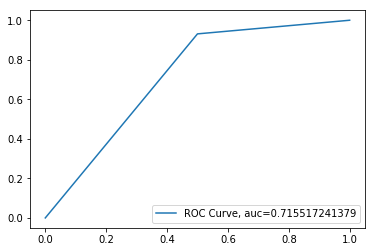

N_Neighbours:   7 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


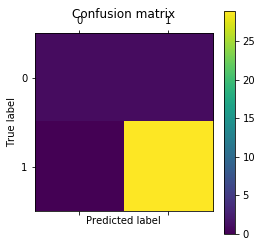



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



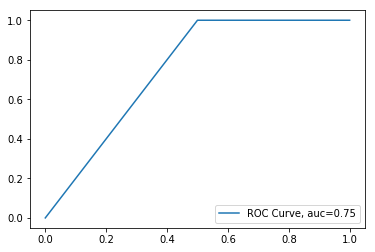

N_Neighbours:   7 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


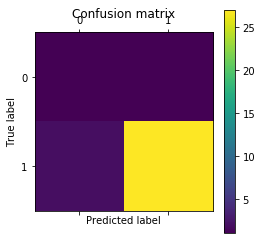



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



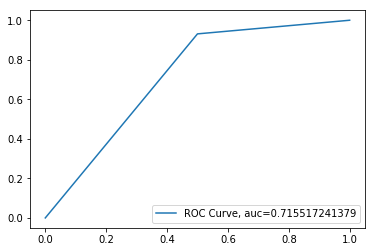

N_Neighbours:   7 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


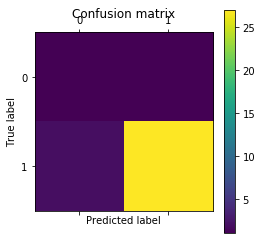



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



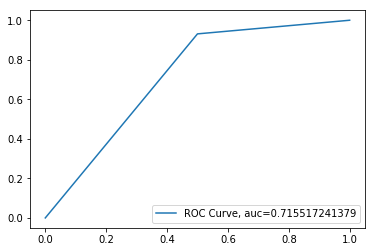

N_Neighbours:   7 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


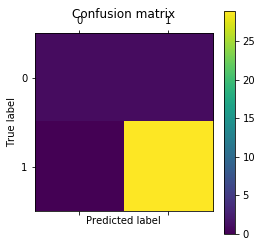



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



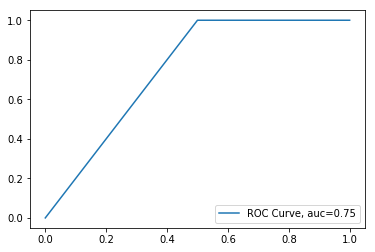

N_Neighbours:   7 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


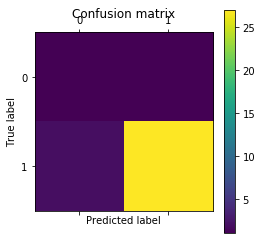



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



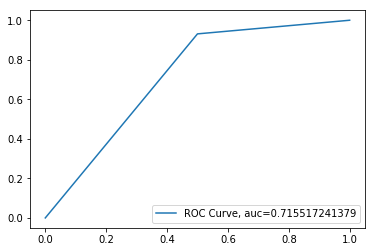

N_Neighbours:   7 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


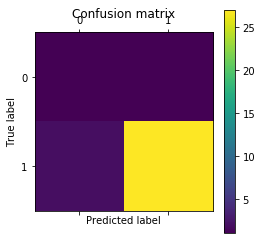



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



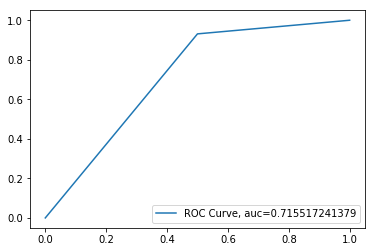

N_Neighbours:   7 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


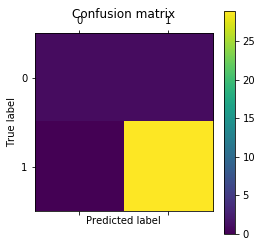



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



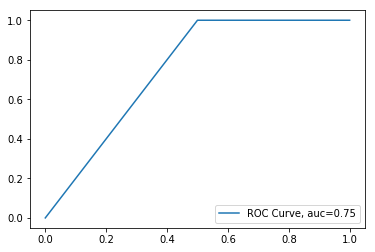

N_Neighbours:   7 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


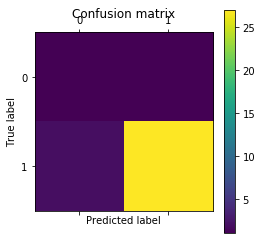



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



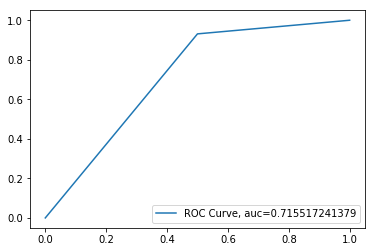

N_Neighbours:   7 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


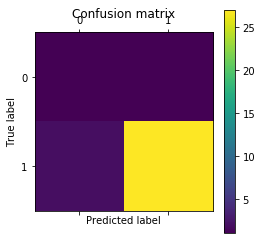



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



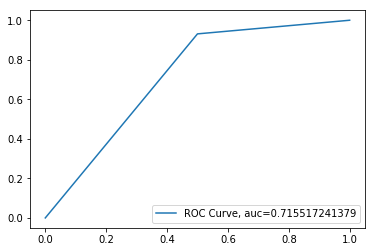

N_Neighbours:   7 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


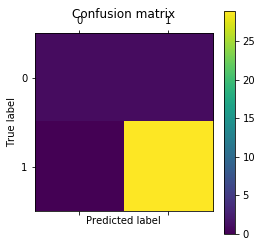



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



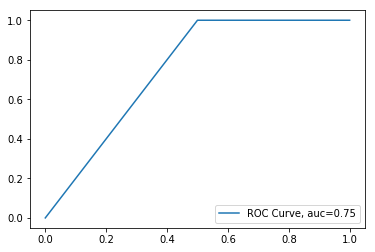

N_Neighbours:   7 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


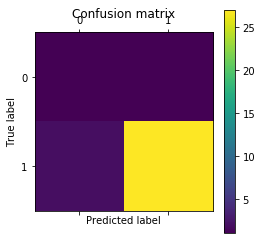



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



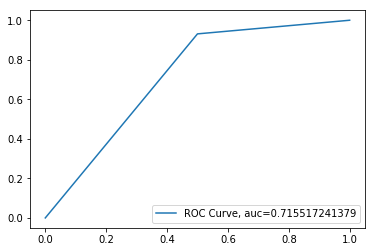

N_Neighbours:   7 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


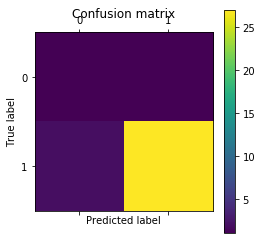



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



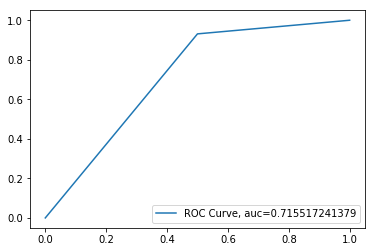

N_Neighbours:   7 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


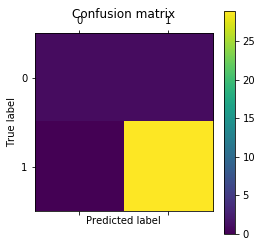



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



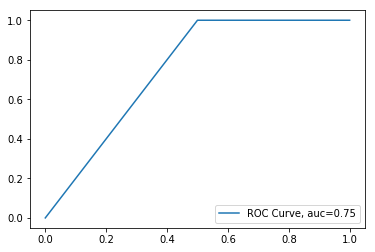

N_Neighbours:   7 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


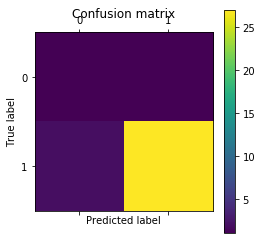



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



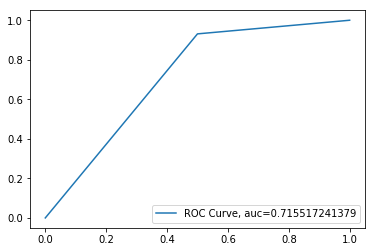

N_Neighbours:   7 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


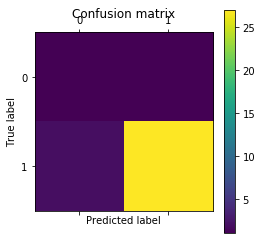



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



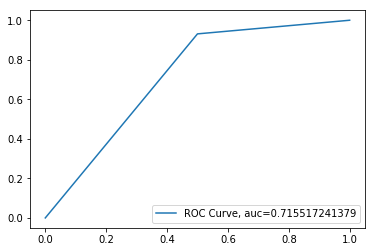

N_Neighbours:   7 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


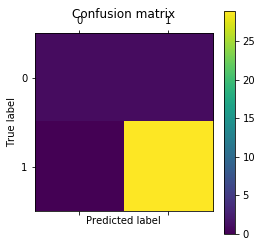



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



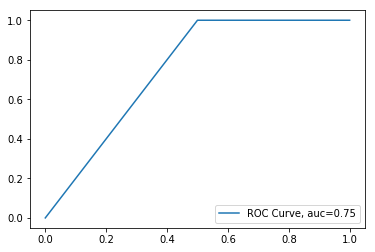

N_Neighbours:   7 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


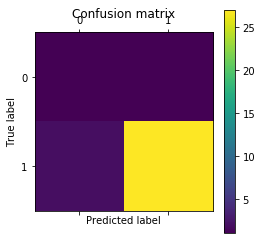



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



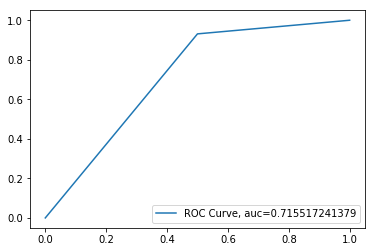

N_Neighbours:   7 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


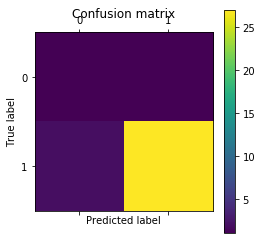



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



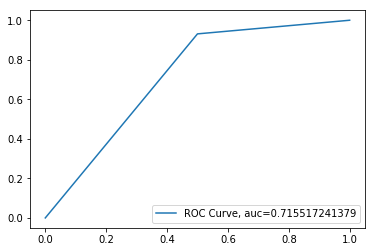

N_Neighbours:   7 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


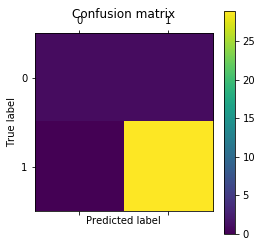



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



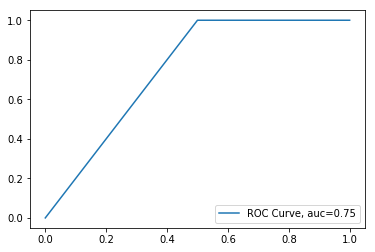

N_Neighbours:   7 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


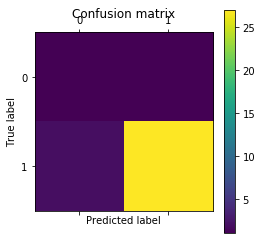



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



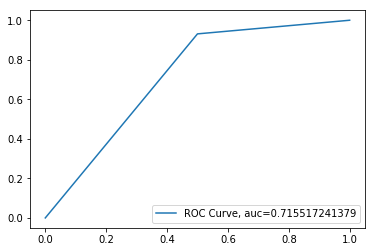

N_Neighbours:   7 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


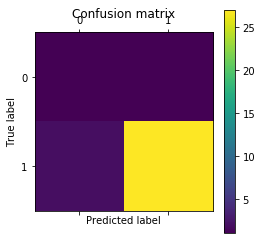



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



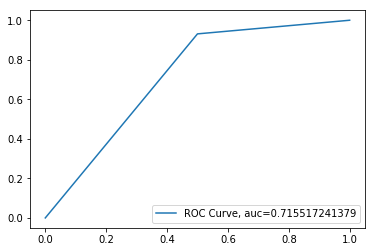

N_Neighbours:   7 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


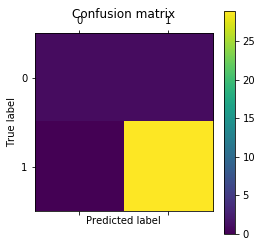



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



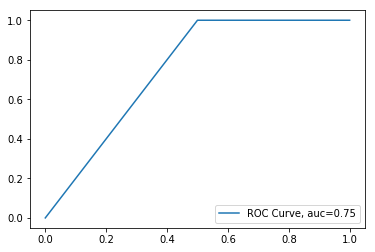

N_Neighbours:   8 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


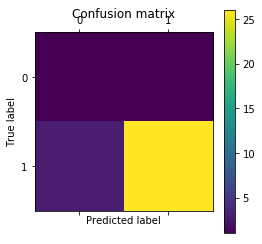



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



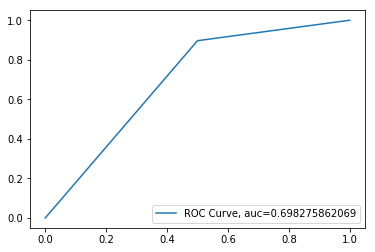

N_Neighbours:   8 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


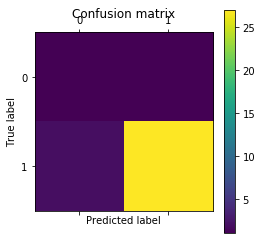



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



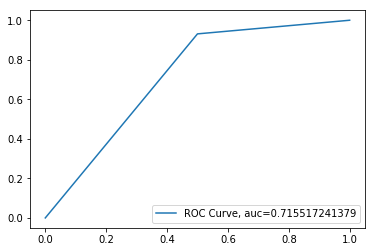

N_Neighbours:   8 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 2  0]
 [ 2 27]]


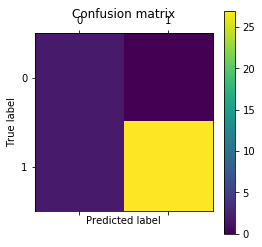



             precision    recall  f1-score   support

          0       0.50      1.00      0.67         2
          1       1.00      0.93      0.96        29

avg / total       0.97      0.94      0.95        31



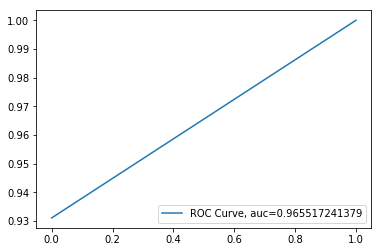

N_Neighbours:   8 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


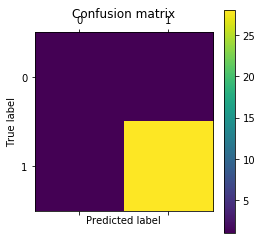



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



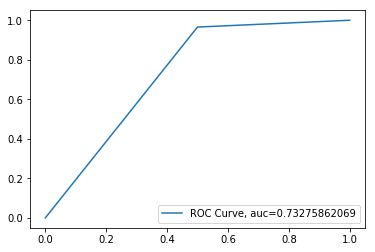

N_Neighbours:   8 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


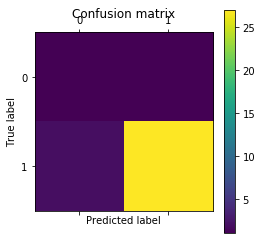



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



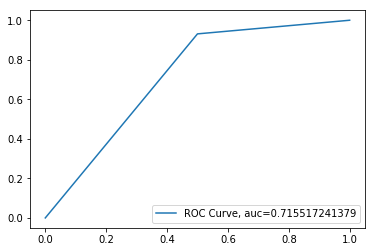

N_Neighbours:   8 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


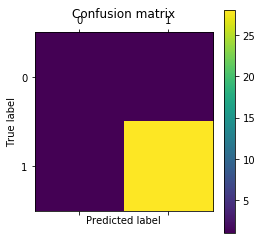



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



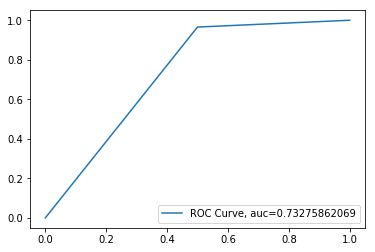

N_Neighbours:   8 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


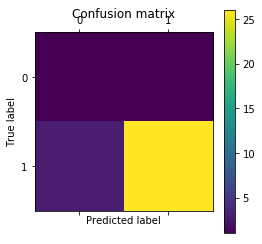



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



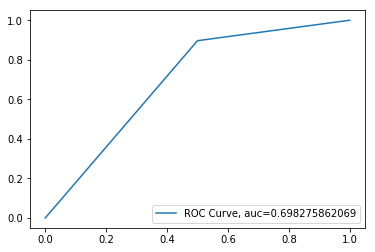

N_Neighbours:   8 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


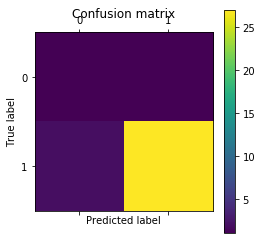



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



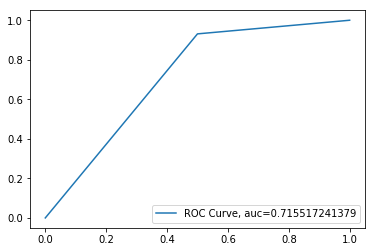

N_Neighbours:   8 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 2  0]
 [ 2 27]]


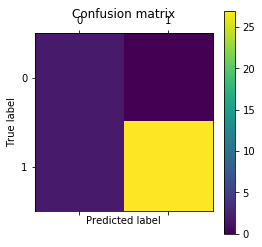



             precision    recall  f1-score   support

          0       0.50      1.00      0.67         2
          1       1.00      0.93      0.96        29

avg / total       0.97      0.94      0.95        31



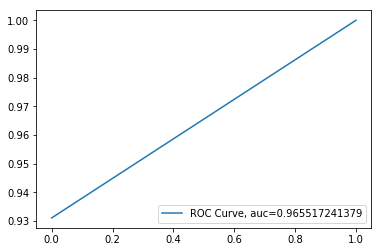

N_Neighbours:   8 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


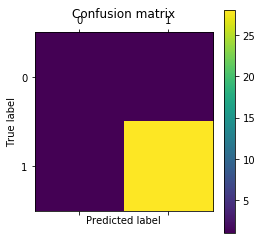



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



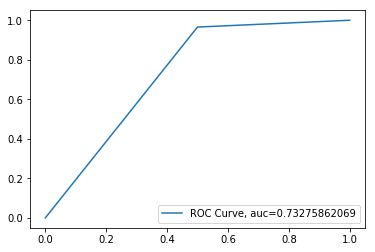

N_Neighbours:   8 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


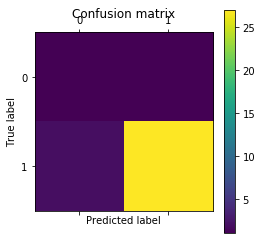



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



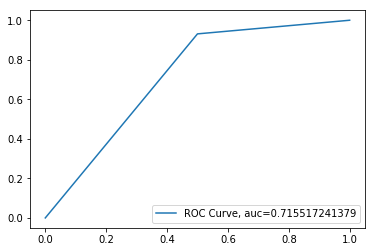

N_Neighbours:   8 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


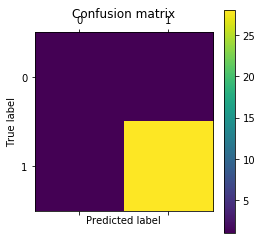



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



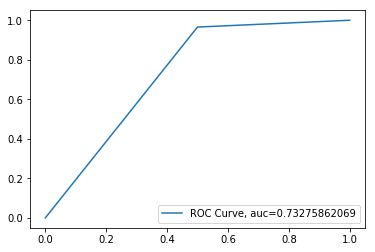

N_Neighbours:   8 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


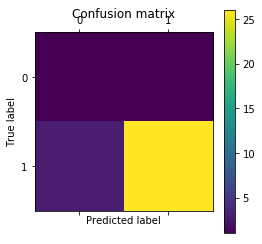



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



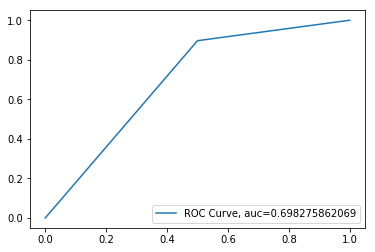

N_Neighbours:   8 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


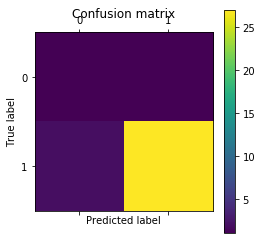



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



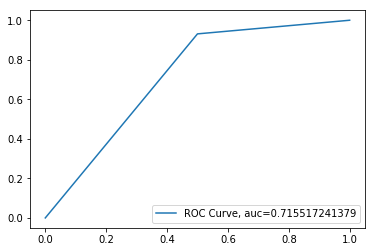

N_Neighbours:   8 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 2  0]
 [ 2 27]]


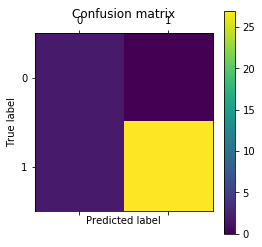



             precision    recall  f1-score   support

          0       0.50      1.00      0.67         2
          1       1.00      0.93      0.96        29

avg / total       0.97      0.94      0.95        31



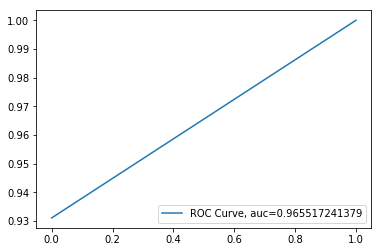

N_Neighbours:   8 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


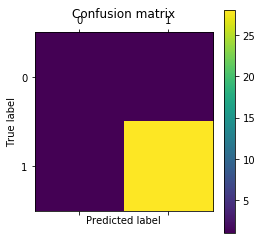



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



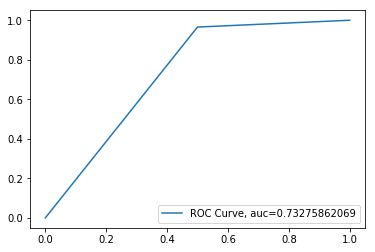

N_Neighbours:   8 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


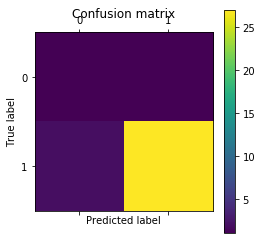



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



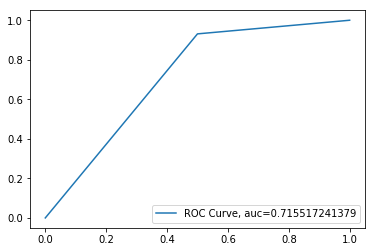

N_Neighbours:   8 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


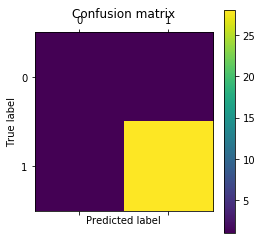



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



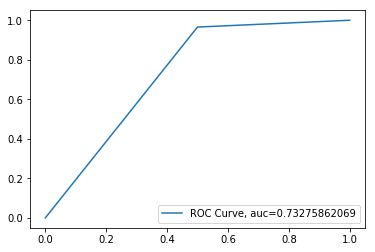

N_Neighbours:   8 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
[[ 1  1]
 [ 3 26]]


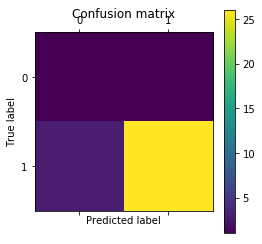



             precision    recall  f1-score   support

          0       0.25      0.50      0.33         2
          1       0.96      0.90      0.93        29

avg / total       0.92      0.87      0.89        31



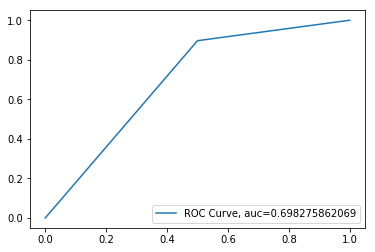

N_Neighbours:   8 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


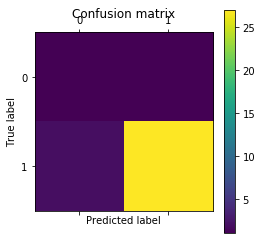



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



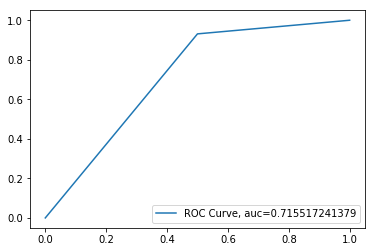

N_Neighbours:   8 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.935483870968
[[ 2  0]
 [ 2 27]]


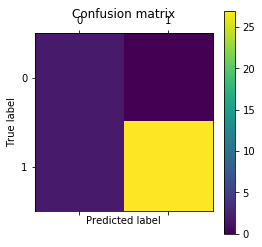



             precision    recall  f1-score   support

          0       0.50      1.00      0.67         2
          1       1.00      0.93      0.96        29

avg / total       0.97      0.94      0.95        31



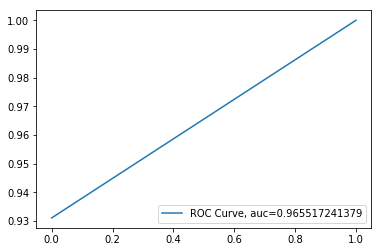

N_Neighbours:   8 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


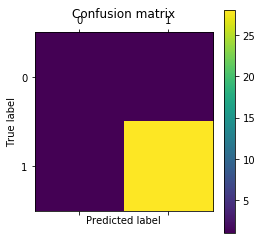



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



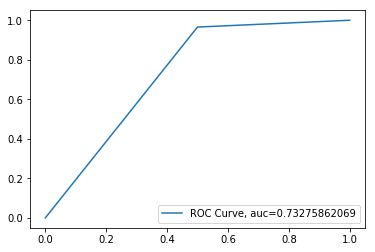

N_Neighbours:   8 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
[[ 1  1]
 [ 2 27]]


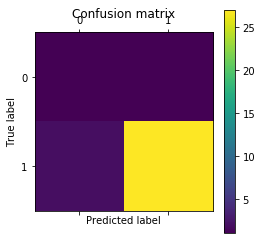



             precision    recall  f1-score   support

          0       0.33      0.50      0.40         2
          1       0.96      0.93      0.95        29

avg / total       0.92      0.90      0.91        31



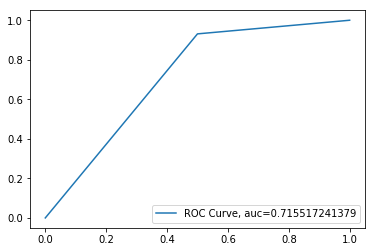

N_Neighbours:   8 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


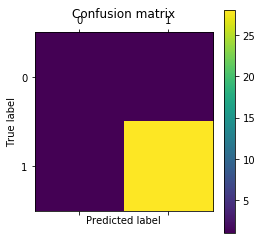



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



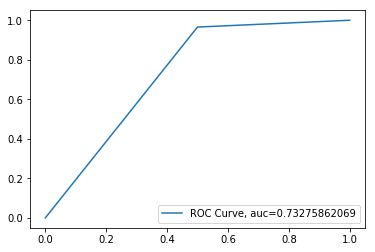

N_Neighbours:   9 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


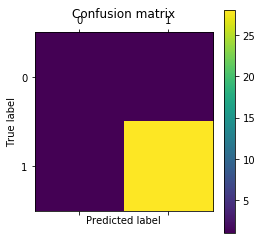



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



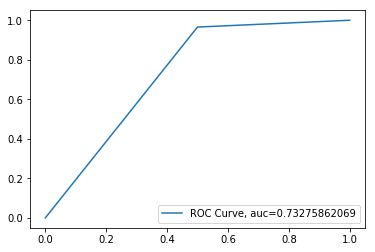

N_Neighbours:   9 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


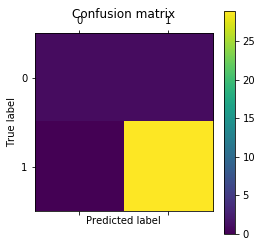



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



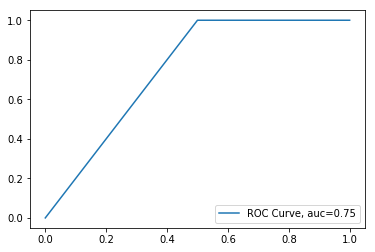

N_Neighbours:   9 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


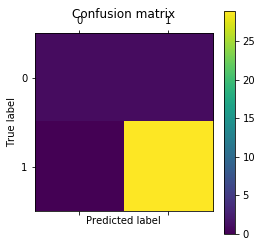



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



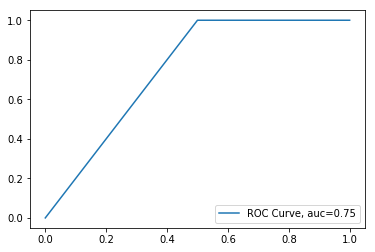

N_Neighbours:   9 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


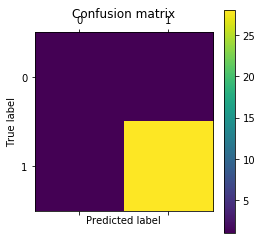



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



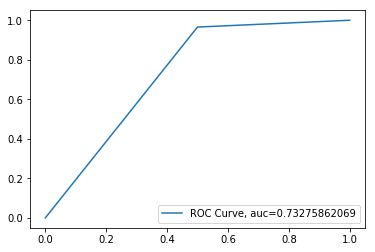

N_Neighbours:   9 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


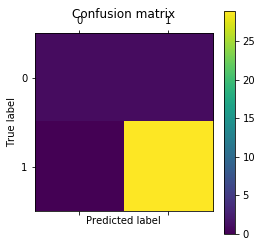



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



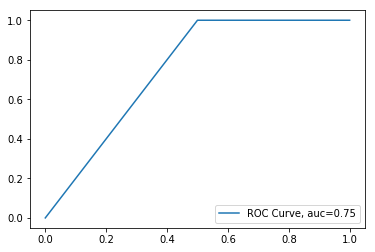

N_Neighbours:   9 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


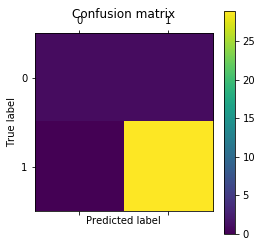



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



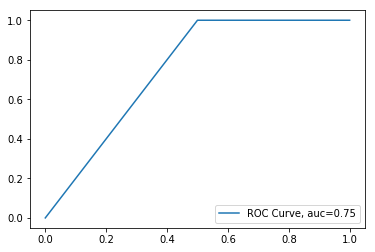

N_Neighbours:   9 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


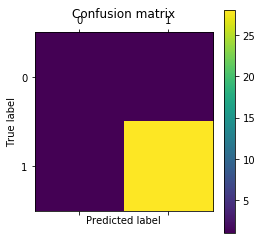



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



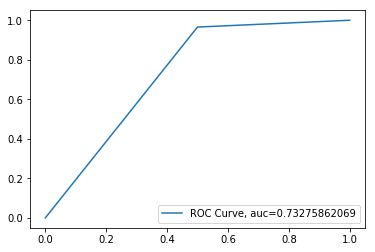

N_Neighbours:   9 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


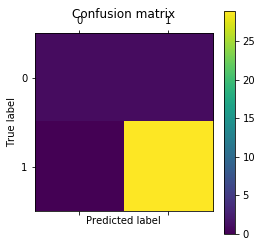



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



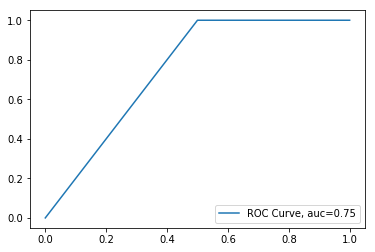

N_Neighbours:   9 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


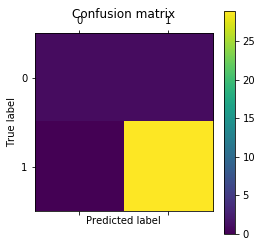



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



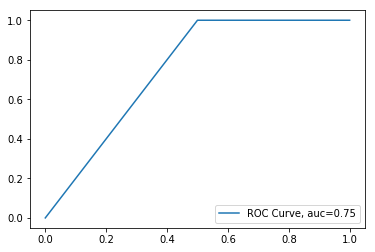

N_Neighbours:   9 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


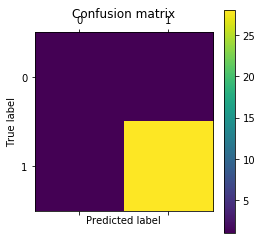



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



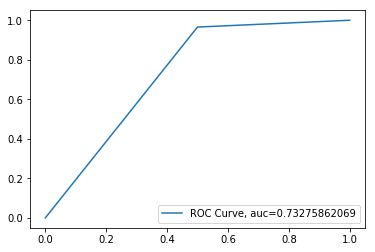

N_Neighbours:   9 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


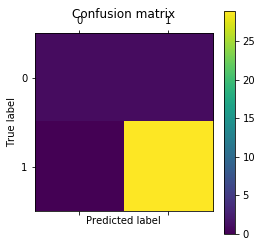



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



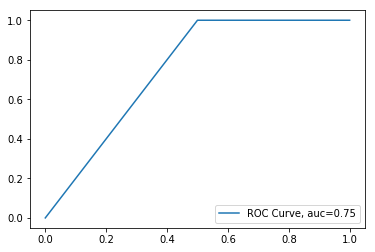

N_Neighbours:   9 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


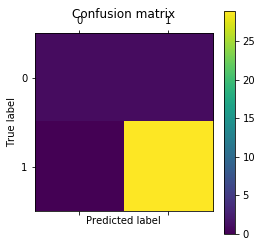



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



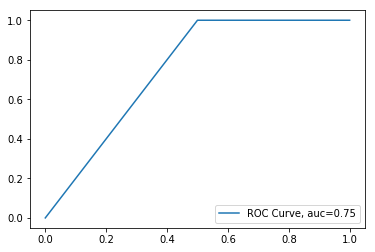

N_Neighbours:   9 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


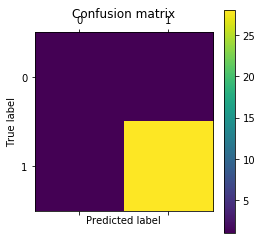



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



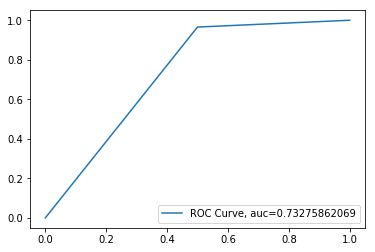

N_Neighbours:   9 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


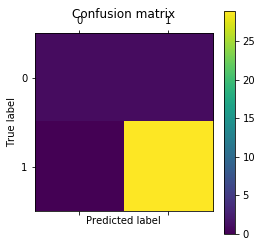



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



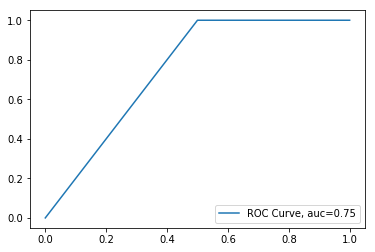

N_Neighbours:   9 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


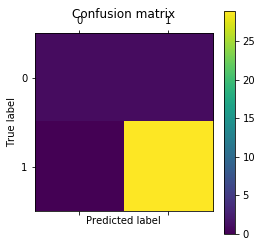



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



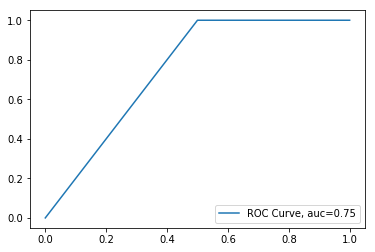

N_Neighbours:   9 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


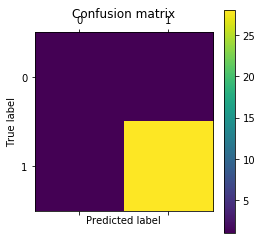



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



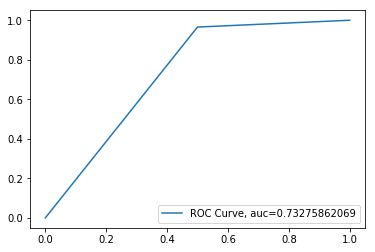

N_Neighbours:   9 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


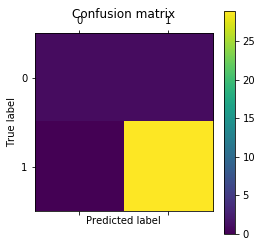



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



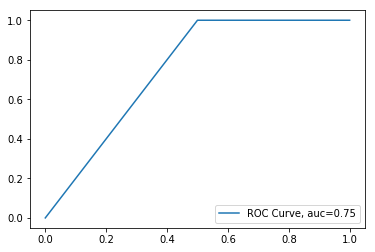

N_Neighbours:   9 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


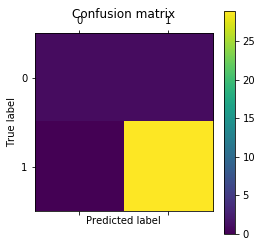



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



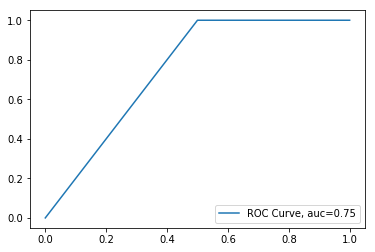

N_Neighbours:   9 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


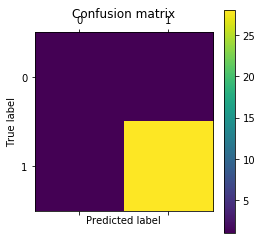



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



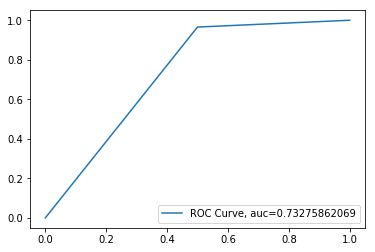

N_Neighbours:   9 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


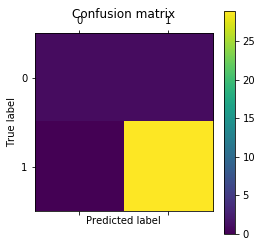



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



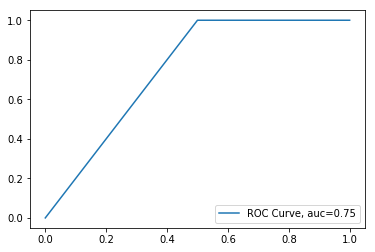

N_Neighbours:   9 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


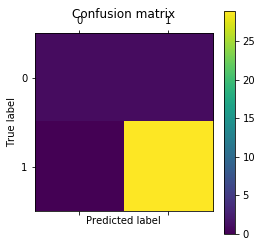



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



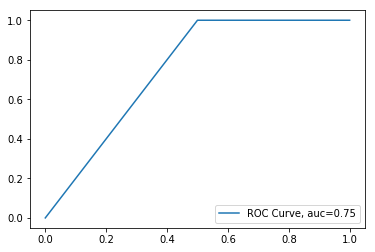

N_Neighbours:   9 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.935483870968
[[ 1  1]
 [ 1 28]]


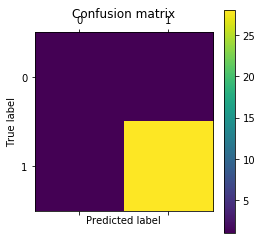



             precision    recall  f1-score   support

          0       0.50      0.50      0.50         2
          1       0.97      0.97      0.97        29

avg / total       0.94      0.94      0.94        31



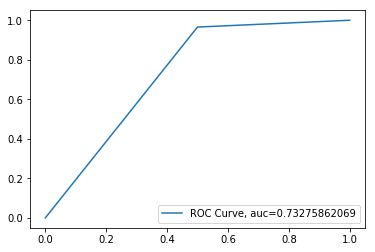

N_Neighbours:   9 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


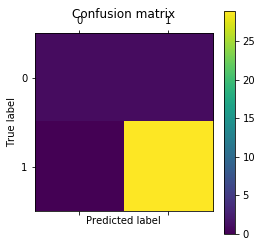



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



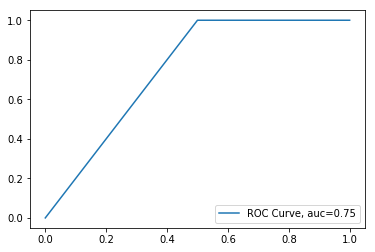

N_Neighbours:   9 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.967741935484
[[ 1  1]
 [ 0 29]]


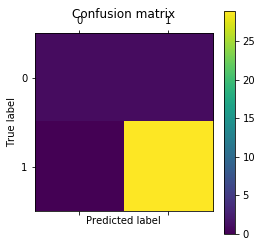



             precision    recall  f1-score   support

          0       1.00      0.50      0.67         2
          1       0.97      1.00      0.98        29

avg / total       0.97      0.97      0.96        31



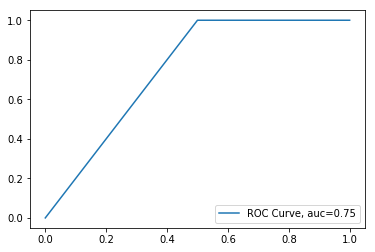

In [105]:
pp = [1,2,3] #power parameter
w= np.array(['uniform','distance']) #weight
alg = np.array(['auto','brute','ball_tree','kd_tree']) #algo
for i in  range(1,10):
    for j in alg:
        for k in w:
            for power_param in pp:
                knn = KNeighborsClassifier(n_neighbors=i, algorithm=j, weights = k,p = power_param)
                knn.fit(hp_xtrn, hp_ytrain)
                hp_ypred = knn.predict(hp_xtst)
                print("N_Neighbours:  ", i , ', Algo: ', j , ', weight: ', k, ', PowerParameter: ', power_param)

                print("Accuracy:",metrics.accuracy_score(hp_ytest, hp_ypred)) 
                cm = confusion_matrix(hp_ytest, hp_ypred)
                print(cm)
                plt.matshow(cm)
                plt.title('Confusion matrix')
                plt.colorbar()
                plt.ylabel('True label')
                plt.xlabel('Predicted label')
                plt.show()
                print('\n')
                print(classification_report(hp_ytest, hp_ypred))

                #fpr, tpr, thresholds = roc_curve(hp_ytest, hp_ypred)
                #plt.plot(fpr, tpr, lw=1, alpha=0.3,label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
                fpr, tpr, thresholds = roc_curve(hp_ytest, hp_ypred)
                auc = roc_auc_score(hp_ytest, hp_ypred)
                plt.plot(fpr,tpr,label="ROC Curve, auc="+str(auc))
                plt.legend(loc=4)
                plt.show()

# Applying KNN after StratifiedShuffleSplit

In [33]:
classifiers = {'KNN = 3':KNeighborsClassifier(3),'KNN = 5':KNeighborsClassifier(5),'KNN = 7':KNeighborsClassifier(7),'KNN = 9':KNeighborsClassifier(9)}

In [46]:
log_cols = ["Classifier", "Accuracy","Precision","Recall","ROC Score","F1-Score", "CV Score"]
log = pd.DataFrame(columns=log_cols)
sss = StratifiedShuffleSplit(n_splits = 2, test_size = 0.2, random_state = 0)
sss.get_n_splits(train_data, test_data)
for Name,classify in classifiers.items():
    for train_index, test_index in sss.split(train_data, test_data):
        #print("TRAIN:", train_index, "TEST:", test_index)
        X,X_test = train_data.iloc[train_index], train_data.iloc[test_index]
        y,y_test = test_data.iloc[train_index], test_data.iloc[test_index]
               
        cls = classify
        cls.fit(X, y)
        scores = cross_val_score(cls,X, y, cv=10)
        print(scores)
        cv_score = max(scores)
        y_out = cls.predict(X_test)
        accuracy = metrics.accuracy_score(y_test,y_out)
        precision = metrics.precision_score(y_test,y_out,average='weighted')
        recall = metrics.recall_score(y_test,y_out,average='weighted')
        roc_auc = roc_auc_score(y_test,y_out)
        f1_score = metrics.f1_score(y_test,y_out,average='weighted')
        log_entry = pd.DataFrame([[Name,accuracy,precision,recall,roc_auc,f1_score,cv_score]], columns=log_cols)
        log = log.append(log_entry)

[ 0.61538462  0.69230769  0.76923077  0.53846154  0.76923077  0.76923077
  0.83333333  0.83333333  0.90909091  0.72727273]
[ 0.76923077  0.69230769  0.69230769  0.69230769  0.53846154  0.69230769
  0.75        0.58333333  0.81818182  0.81818182]
[ 0.46153846  0.76923077  0.76923077  0.61538462  0.76923077  0.69230769
  0.83333333  0.83333333  0.63636364  0.72727273]
[ 0.76923077  0.76923077  0.76923077  0.69230769  0.69230769  0.76923077
  0.75        0.58333333  0.81818182  0.81818182]
[ 0.61538462  0.76923077  0.76923077  0.61538462  0.69230769  0.76923077
  0.83333333  0.83333333  0.72727273  0.72727273]
[ 0.76923077  0.76923077  0.76923077  0.69230769  0.69230769  0.76923077
  0.83333333  0.66666667  0.81818182  0.90909091]
[ 0.69230769  0.76923077  0.76923077  0.61538462  0.76923077  0.76923077
  0.83333333  0.83333333  0.81818182  0.81818182]
[ 0.76923077  0.76923077  0.76923077  0.76923077  0.76923077  0.76923077
  0.83333333  0.66666667  0.81818182  0.90909091]


In [47]:
log

,Classifier,Accuracy,Precision,Recall,ROC Score,F1-Score,CV Score
0,KNN = 3,0.774194,0.726959,0.774194,0.543333,0.742950,0.909091
0,KNN = 3,0.774194,0.759801,0.774194,0.606667,0.766143,0.818182
0,KNN = 5,0.806452,0.650364,0.806452,0.500000,0.720046,0.833333
0,KNN = 5,0.774194,0.645161,0.774194,0.480000,0.703812,0.818182
0,KNN = 7,0.806452,0.650364,0.806452,0.500000,0.720046,0.833333
0,KNN = 7,0.741935,0.639600,0.741935,0.460000,0.686977,0.909091
0,KNN = 9,0.806452,0.650364,0.806452,0.500000,0.720046,0.833333
0,KNN = 9,0.774194,0.645161,0.774194,0.480000,0.703812,0.909091


# Applying KNN after ShuffleSplit

In [48]:
ss = ShuffleSplit(n_splits = 2, test_size = 0.2, random_state = 0)
ss.get_n_splits(train_data, test_data)
log_ss = pd.DataFrame(columns=log_cols)
for Name,classify in classifiers.items():
    for train_index, test_index in ss.split(train_data, test_data):
        #print("TRAIN:", train_index, "TEST:", test_index)
        X,X_test = train_data.iloc[train_index], train_data.iloc[test_index]
        y,y_test = test_data.iloc[train_index], test_data.iloc[test_index]
               
        cls = classify
        cls.fit(X, y)
        scores = cross_val_score(cls,X, y, cv=10)
        print(scores)
        cv_score = max(scores)
        y_out = cls.predict(X_test)
        accuracy = metrics.accuracy_score(y_test,y_out)
        precision = metrics.precision_score(y_test,y_out,average='weighted')
        recall = metrics.recall_score(y_test,y_out,average='weighted')
        roc_auc = roc_auc_score(y_test,y_out)
        f1_score = metrics.f1_score(y_test,y_out,average='weighted')
        log_entry = pd.DataFrame([[Name,accuracy,precision,recall,roc_auc,f1_score,cv_score]], columns=log_cols)
        log_ss = log_ss.append(log_entry)

[ 0.78571429  0.76923077  0.69230769  0.83333333  0.83333333  0.75
  0.83333333  0.75        0.83333333  0.58333333]
[ 0.76923077  0.69230769  0.53846154  0.69230769  0.69230769  0.76923077
  0.66666667  0.75        0.54545455  0.90909091]
[ 0.71428571  0.76923077  0.69230769  0.83333333  0.75        0.83333333
  0.75        0.75        0.83333333  0.66666667]
[ 0.76923077  0.69230769  0.69230769  0.76923077  0.76923077  0.69230769
  0.66666667  0.75        0.63636364  0.81818182]
[ 0.78571429  0.76923077  0.69230769  0.83333333  0.75        0.83333333
  0.75        0.83333333  0.75        0.75      ]
[ 0.76923077  0.76923077  0.69230769  0.61538462  0.76923077  0.76923077
  0.66666667  0.75        0.72727273  0.72727273]
[ 0.78571429  0.76923077  0.76923077  0.83333333  0.83333333  0.83333333
  0.83333333  0.83333333  0.83333333  0.83333333]
[ 0.76923077  0.69230769  0.69230769  0.61538462  0.76923077  0.76923077
  0.75        0.75        0.81818182  0.81818182]


In [49]:
log_ss

,Classifier,Accuracy,Precision,Recall,ROC Score,F1-Score,CV Score
0,KNN = 3,0.580645,0.530968,0.580645,0.441919,0.552093,0.833333
0,KNN = 3,0.774194,0.746544,0.774194,0.444444,0.760117,0.909091
0,KNN = 5,0.741935,0.810753,0.741935,0.555556,0.658561,0.833333
0,KNN = 5,0.774194,0.746544,0.774194,0.444444,0.760117,0.818182
0,KNN = 7,0.709677,0.503642,0.709677,0.500000,0.589166,0.833333
0,KNN = 7,0.838710,0.820661,0.838710,0.587963,0.828655,0.769231
0,KNN = 9,0.709677,0.503642,0.709677,0.500000,0.589166,0.833333
0,KNN = 9,0.870968,0.758585,0.870968,0.500000,0.810901,0.818182


# Applying KNN after KFold

In [50]:
from sklearn.model_selection import KFold

kfold = KFold(n_splits = 2)
kfold.get_n_splits(train_data, test_data)
log_kf = pd.DataFrame(columns=log_cols)
for Name,classify in classifiers.items():
    for train_index, test_index in kfold.split(train_data, test_data):
        #print("TRAIN:", train_index, "TEST:", test_index)
        X,X_test = train_data.iloc[train_index], train_data.iloc[test_index]
        y,y_test = test_data.iloc[train_index], test_data.iloc[test_index]
               
        cls = classify
        cls.fit(X, y)
        scores = cross_val_score(cls,X, y, cv=10)
        print(scores)
        cv_score = max(scores)
        y_out = cls.predict(X_test)
        accuracy = metrics.accuracy_score(y_test,y_out)
        precision = metrics.precision_score(y_test,y_out,average='weighted')
        recall = metrics.recall_score(y_test,y_out,average='weighted')
        roc_auc = roc_auc_score(y_test,y_out)
        f1_score = metrics.f1_score(y_test,y_out,average='weighted')
        log_entry = pd.DataFrame([[Name,accuracy,precision,recall,roc_auc,f1_score,cv_score]], columns=log_cols)
        log_kf = log_kf.append(log_entry)

[ 0.77777778  0.66666667  0.625       0.75        0.625       0.71428571
  0.85714286  0.85714286  0.57142857  0.71428571]
[ 0.88888889  0.875       0.875       0.875       0.875       0.875       0.875
  1.          1.          1.        ]
[ 0.77777778  0.66666667  0.625       0.625       0.5         0.57142857
  0.71428571  0.71428571  0.57142857  0.57142857]
[ 0.88888889  0.875       0.875       0.875       0.875       0.875       0.875
  1.          1.          1.        ]
[ 0.66666667  0.66666667  0.625       0.625       0.75        0.57142857
  0.71428571  0.57142857  0.42857143  0.42857143]
[ 0.88888889  0.875       0.875       0.875       0.875       0.875       0.875
  1.          1.          1.        ]
[ 0.66666667  0.55555556  0.625       0.625       0.25        0.42857143
  0.71428571  0.42857143  0.71428571  0.42857143]
[ 0.88888889  0.875       0.875       0.875       0.875       0.875       0.875
  1.          1.          1.        ]


In [51]:
log_kf

,Classifier,Accuracy,Precision,Recall,ROC Score,F1-Score,CV Score
0,KNN = 3,0.756410,0.813714,0.756410,0.415493,0.784016,0.857143
0,KNN = 3,0.610390,0.490167,0.610390,0.462308,0.529553,1.000000
0,KNN = 5,0.769231,0.815155,0.769231,0.422535,0.791527,0.777778
0,KNN = 5,0.675325,0.456063,0.675325,0.500000,0.544448,1.000000
0,KNN = 7,0.756410,0.813714,0.756410,0.415493,0.784016,0.750000
0,KNN = 7,0.675325,0.456063,0.675325,0.500000,0.544448,1.000000
0,KNN = 9,0.807692,0.819231,0.807692,0.443662,0.813421,0.714286
0,KNN = 9,0.675325,0.456063,0.675325,0.500000,0.544448,1.000000


In [63]:
df = data

In [64]:
data_new = pd.get_dummies(df, columns=['sex','steroid','antivirals','fatigue',
                                         'malaise','anorexia',
                                         'liver_big','liver_firm',
                                         'spleen_palpable','spiders',
                                         'ascites','varices','histology' ])

In [65]:
data_new.head()

,age,bilirubin,alk_phosphate,sgot,albumin,protime,class,sex_0,sex_1,steroid_0,...,spleen_palpable_0,spleen_palpable_1,spiders_0,spiders_1,ascites_0,ascites_1,varices_0,varices_1,histology_0,histology_1
0,30,1.0,85.000000,18.0,4.0,61.852273,1,0,1,1,...,1,0,1,0,1,0,1,0,1,0
1,50,0.9,135.000000,42.0,3.5,61.852273,1,1,0,1,...,1,0,1,0,1,0,1,0,1,0
2,78,0.7,96.000000,32.0,4.0,61.852273,1,1,0,0,...,1,0,1,0,1,0,1,0,1,0
3,31,0.7,46.000000,52.0,4.0,80.000000,1,1,0,0,...,1,0,1,0,1,0,1,0,1,0
4,34,1.0,105.325397,200.0,4.0,61.852273,1,1,0,0,...,1,0,1,0,1,0,1,0,1,0


In [77]:
data_y = pd.DataFrame(data_new['class'])
data_X = data_new.drop(['class'], axis=1)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data_X, data_y, test_size=0.2)



# GetDummies and KNN

In [82]:
pp = [1,2,3] #power parameter
w= np.array(['uniform','distance']) #weight
alg = np.array(['auto','brute','ball_tree','kd_tree']) #algo
for i in range(1,10):
    for j in alg:
        for k in w:
            for power_param in pp:
                knn = KNeighborsClassifier(n_neighbors=i, algorithm=j, weights = k,p = power_param)
                knn.fit(X_train, y_train)
                y_pred = knn.predict(X_test)
                print("N_Neighbours:  ", i , ', Algo: ', j , ', weight: ', k, ', PowerParameter: ', power_param)
                print("Accuracy:",metrics.accuracy_score(y_test, y_pred))            
                print(classification_report(y_test, y_pred))  
                

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

N_Neighbours:   1 , Algo:  auto , weight:  distance , PowerParam

N_Neighbours:   2 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.645161290323
             precision    recall  f1-score   support

          0       0.14      0.17      0.15         6
          1       0.79      0.76      0.78        25

avg / total       0.67      0.65      0.66        31

N_Neighbours:   2 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

N_Neighbours:   2 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

N_Neighbours:   2 , Algo:  kd_tree , weight:  distanc

N_Neighbours:   4 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.33      0.17      0.22         6
          1       0.82      0.92      0.87        25

avg / total       0.73      0.77      0.74        31

N_Neighbours:   4 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.20      0.17      0.18         6
          1       0.81      0.84      0.82        25

avg / total       0.69      0.71      0.70        31

N_Neighbours:   4 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.88      0.83        25

avg / total       0.63      0.71      0.67        31

N_Neighbours:   4 , Algo:  kd_tree , weight:  distance 

N_Neighbours:   6 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

N_Neighbours:   6 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

N_Neighbours:   6 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.50      0.17      0.25         6
          1       0.83      0.96      0.89        25

avg / total       0.76      0.81      0.77        31

N_Neighbours:   6 , Algo:  kd_tree , weight:  distance 

N_Neighbours:   8 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

N_Neighbours:   8 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

N_Neighbours:   8 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

N_Neighbours:   8 , Algo:  kd_tree , weight:  distance 

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


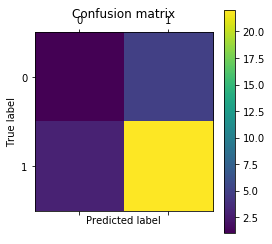

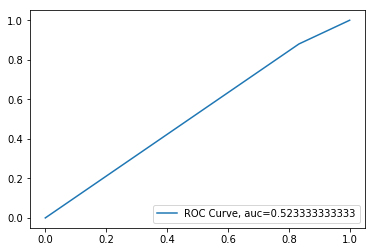

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


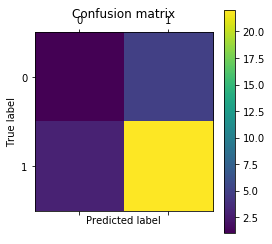

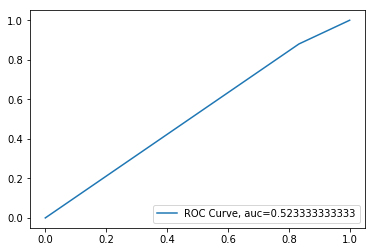

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


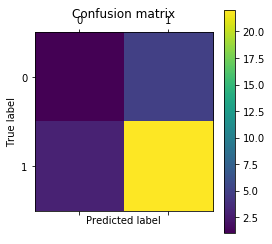

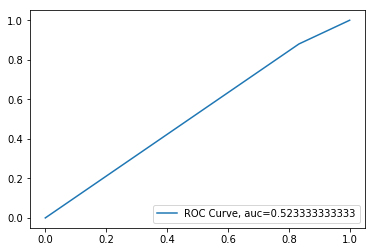

N_Neighbours:   1 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


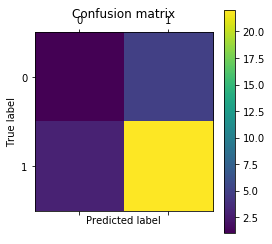

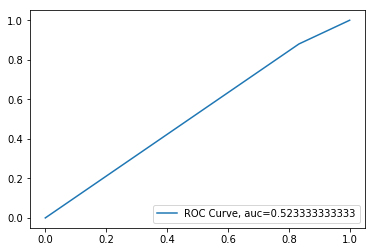

N_Neighbours:   1 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


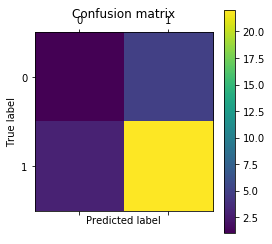

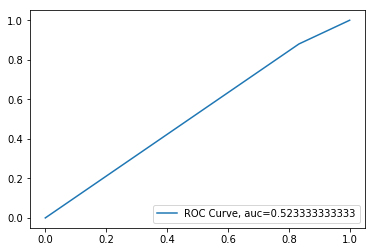

N_Neighbours:   1 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


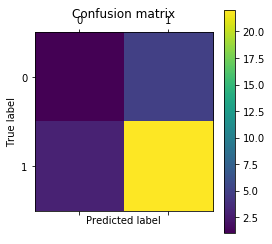

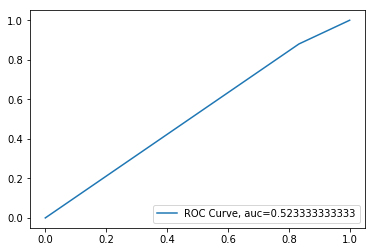

N_Neighbours:   1 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


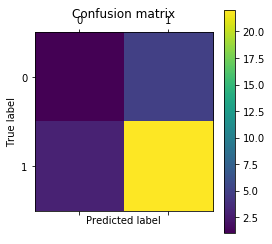

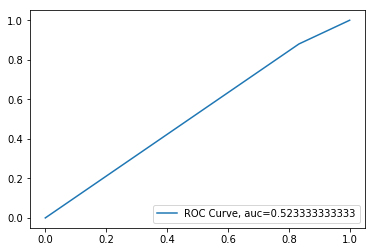

N_Neighbours:   1 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


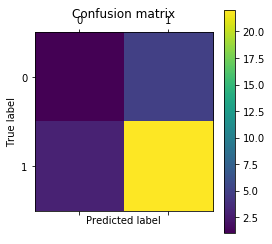

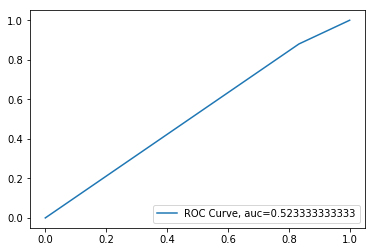

N_Neighbours:   1 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


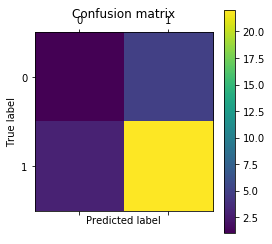

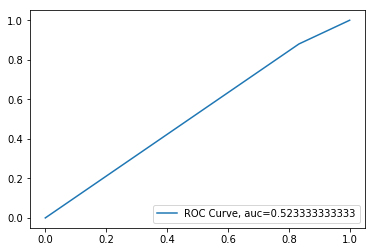

N_Neighbours:   1 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


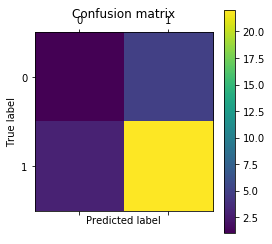

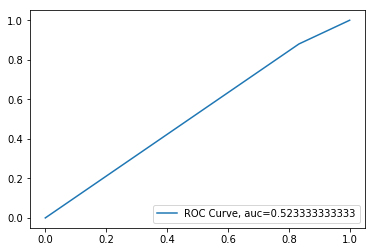

N_Neighbours:   1 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


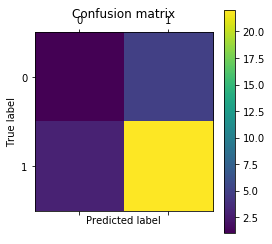

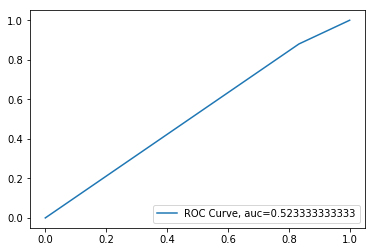

N_Neighbours:   1 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


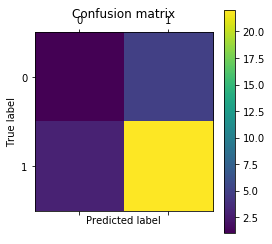

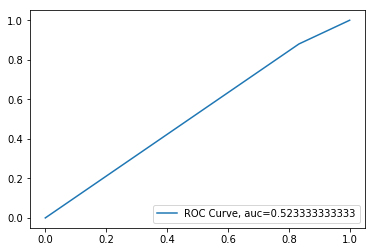

N_Neighbours:   1 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


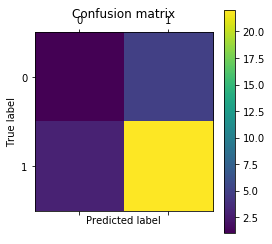

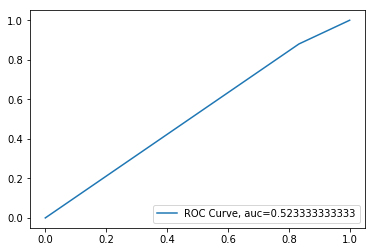

N_Neighbours:   1 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


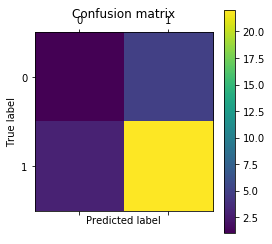

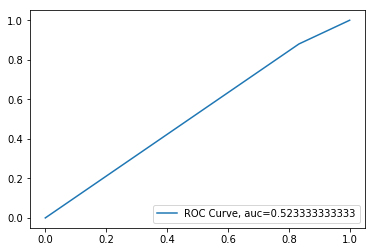

N_Neighbours:   1 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


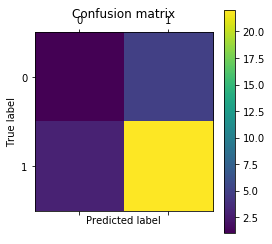

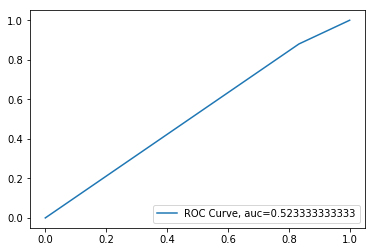

N_Neighbours:   1 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


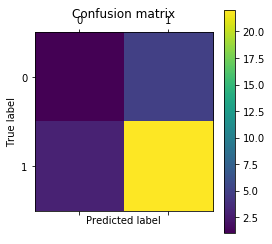

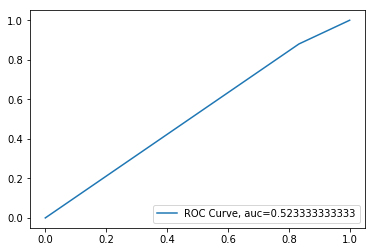

N_Neighbours:   1 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


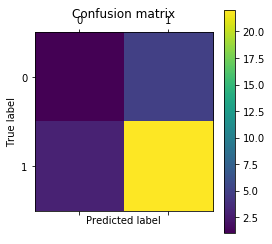

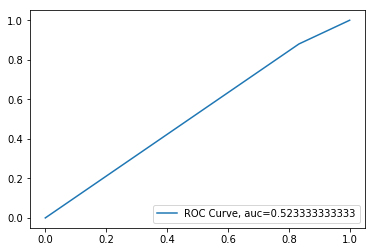

N_Neighbours:   1 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


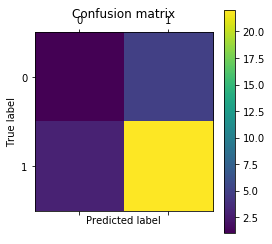

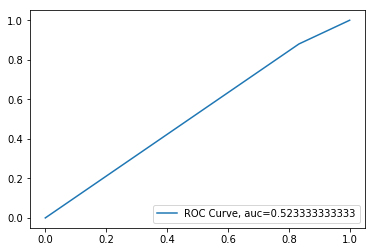

N_Neighbours:   1 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


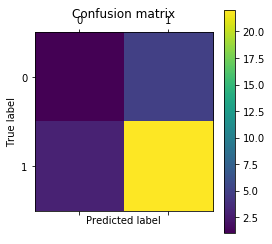

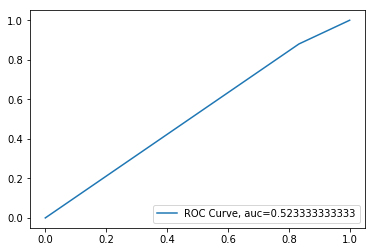

N_Neighbours:   1 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


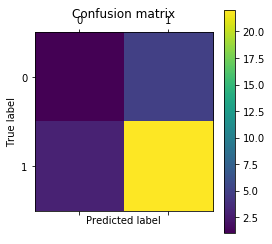

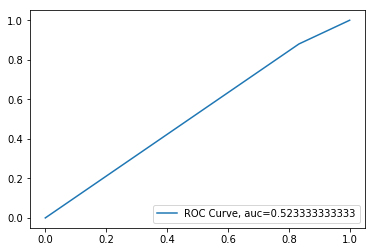

N_Neighbours:   1 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


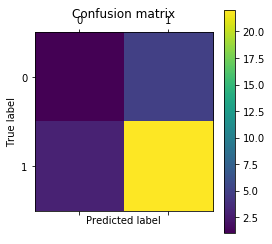

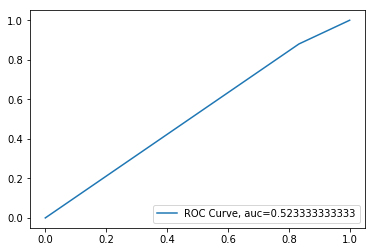

N_Neighbours:   1 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


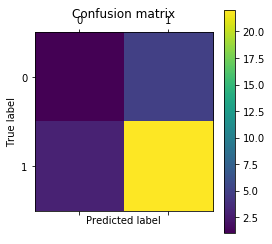

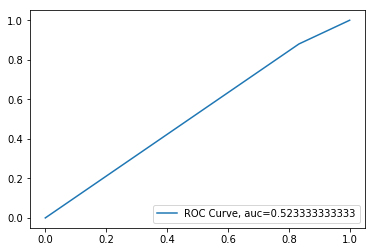

N_Neighbours:   1 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


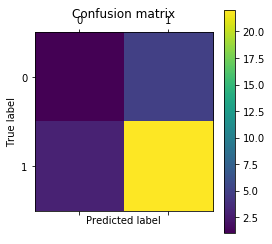

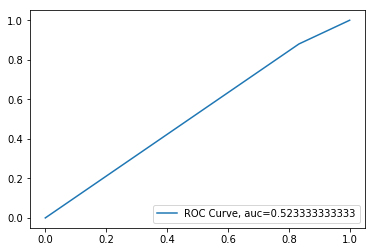

N_Neighbours:   1 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


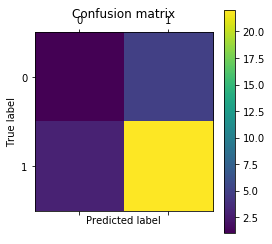

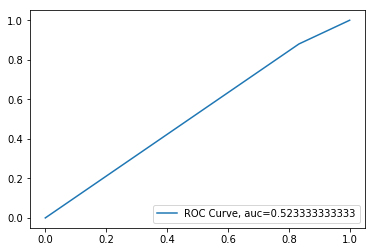

N_Neighbours:   2 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.43      0.50      0.46         6
          1       0.88      0.84      0.86        25

avg / total       0.79      0.77      0.78        31

[[ 3  3]
 [ 4 21]]


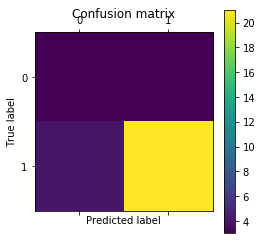

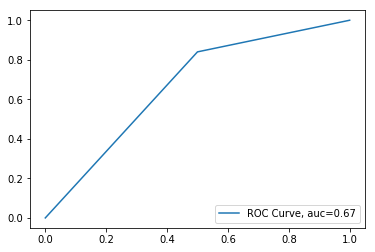

N_Neighbours:   2 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.645161290323
             precision    recall  f1-score   support

          0       0.14      0.17      0.15         6
          1       0.79      0.76      0.78        25

avg / total       0.67      0.65      0.66        31

[[ 1  5]
 [ 6 19]]


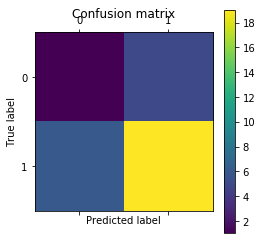

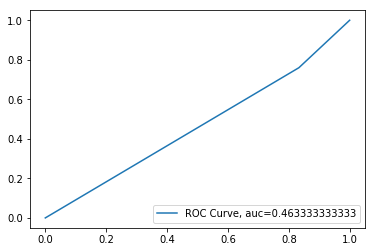

N_Neighbours:   2 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.645161290323
             precision    recall  f1-score   support

          0       0.14      0.17      0.15         6
          1       0.79      0.76      0.78        25

avg / total       0.67      0.65      0.66        31

[[ 1  5]
 [ 6 19]]


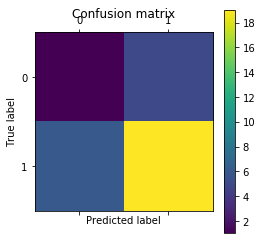

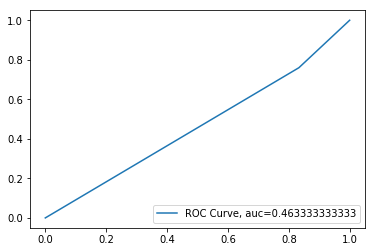

N_Neighbours:   2 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


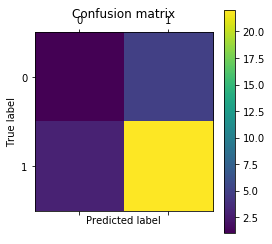

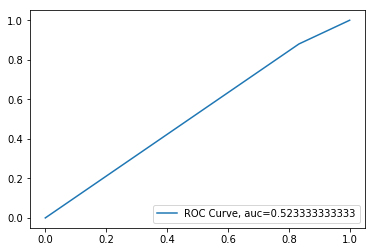

N_Neighbours:   2 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


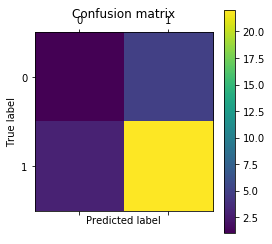

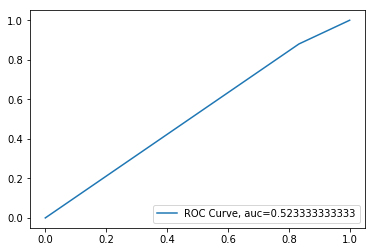

N_Neighbours:   2 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


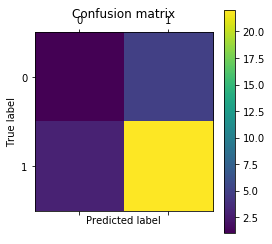

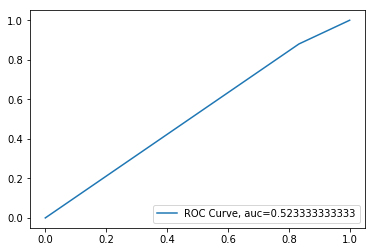

N_Neighbours:   2 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.43      0.50      0.46         6
          1       0.88      0.84      0.86        25

avg / total       0.79      0.77      0.78        31

[[ 3  3]
 [ 4 21]]


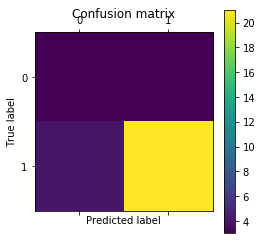

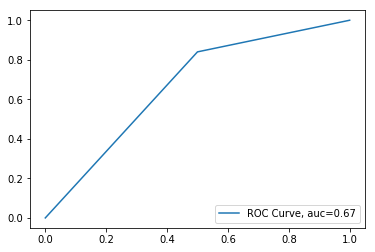

N_Neighbours:   2 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.645161290323
             precision    recall  f1-score   support

          0       0.14      0.17      0.15         6
          1       0.79      0.76      0.78        25

avg / total       0.67      0.65      0.66        31

[[ 1  5]
 [ 6 19]]


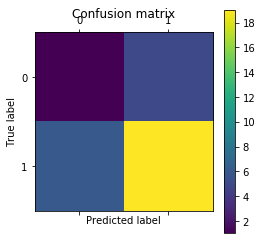

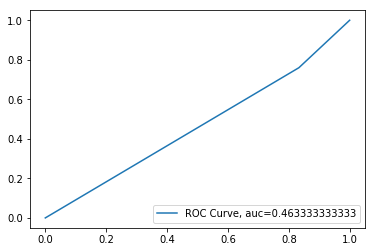

N_Neighbours:   2 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.645161290323
             precision    recall  f1-score   support

          0       0.14      0.17      0.15         6
          1       0.79      0.76      0.78        25

avg / total       0.67      0.65      0.66        31

[[ 1  5]
 [ 6 19]]


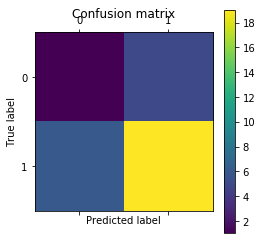

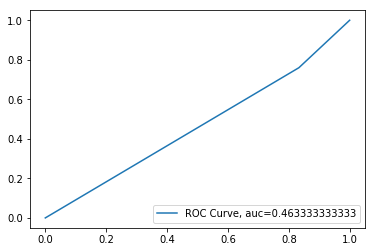

N_Neighbours:   2 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


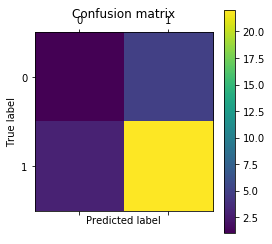

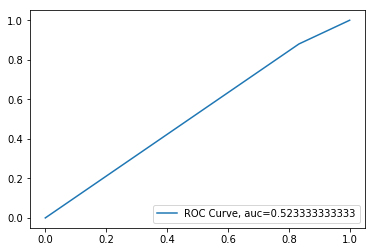

N_Neighbours:   2 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


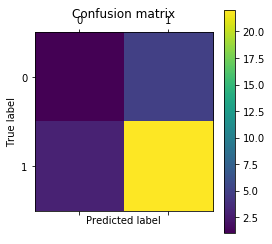

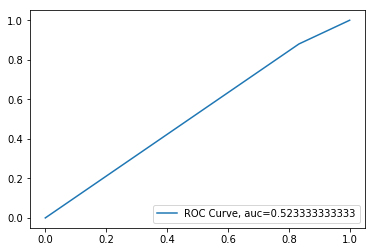

N_Neighbours:   2 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


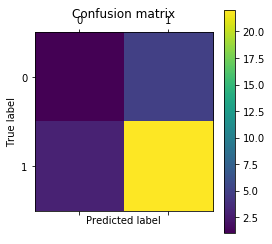

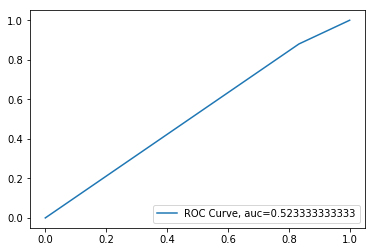

N_Neighbours:   2 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.43      0.50      0.46         6
          1       0.88      0.84      0.86        25

avg / total       0.79      0.77      0.78        31

[[ 3  3]
 [ 4 21]]


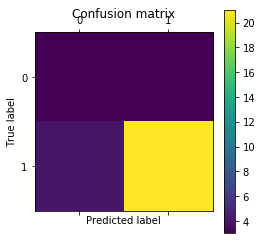

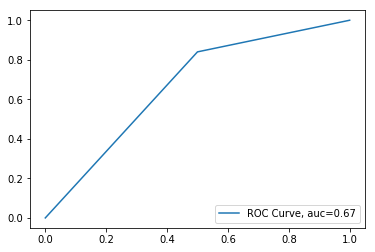

N_Neighbours:   2 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.645161290323
             precision    recall  f1-score   support

          0       0.14      0.17      0.15         6
          1       0.79      0.76      0.78        25

avg / total       0.67      0.65      0.66        31

[[ 1  5]
 [ 6 19]]


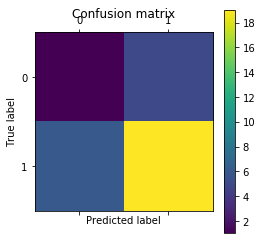

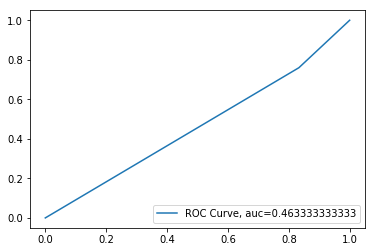

N_Neighbours:   2 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.645161290323
             precision    recall  f1-score   support

          0       0.14      0.17      0.15         6
          1       0.79      0.76      0.78        25

avg / total       0.67      0.65      0.66        31

[[ 1  5]
 [ 6 19]]


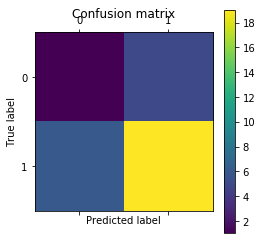

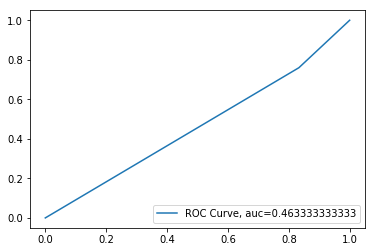

N_Neighbours:   2 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


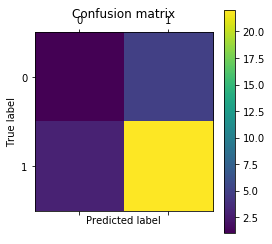

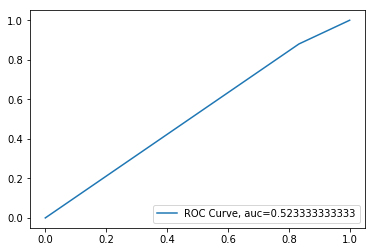

N_Neighbours:   2 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


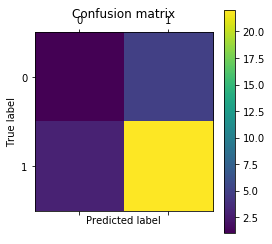

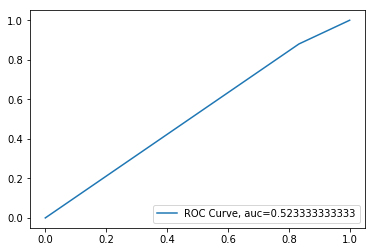

N_Neighbours:   2 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


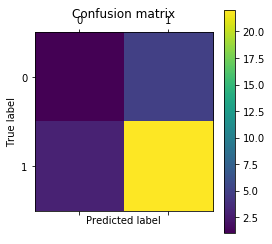

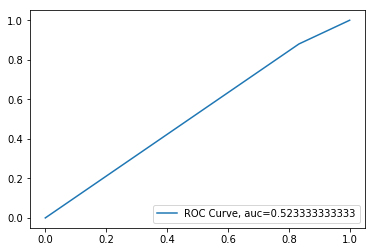

N_Neighbours:   2 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.43      0.50      0.46         6
          1       0.88      0.84      0.86        25

avg / total       0.79      0.77      0.78        31

[[ 3  3]
 [ 4 21]]


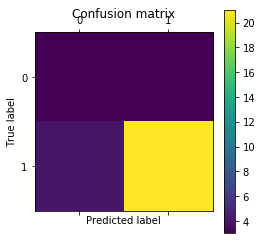

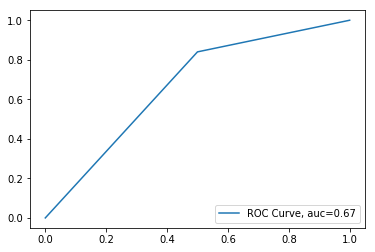

N_Neighbours:   2 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.645161290323
             precision    recall  f1-score   support

          0       0.14      0.17      0.15         6
          1       0.79      0.76      0.78        25

avg / total       0.67      0.65      0.66        31

[[ 1  5]
 [ 6 19]]


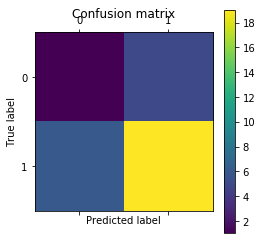

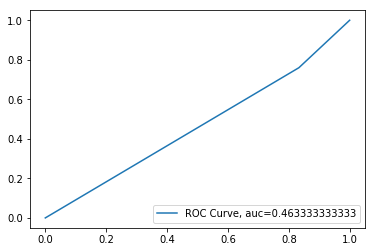

N_Neighbours:   2 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.645161290323
             precision    recall  f1-score   support

          0       0.14      0.17      0.15         6
          1       0.79      0.76      0.78        25

avg / total       0.67      0.65      0.66        31

[[ 1  5]
 [ 6 19]]


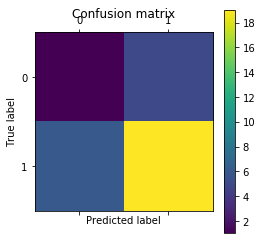

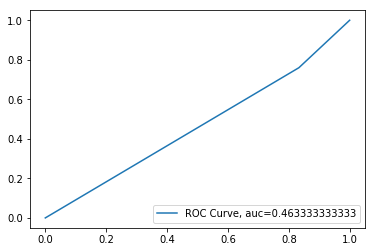

N_Neighbours:   2 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


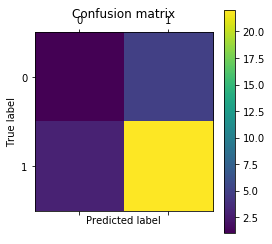

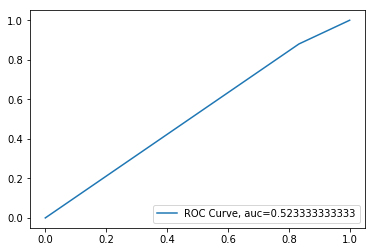

N_Neighbours:   2 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


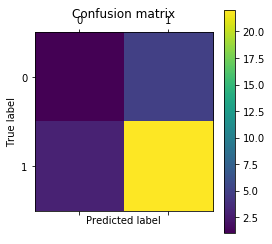

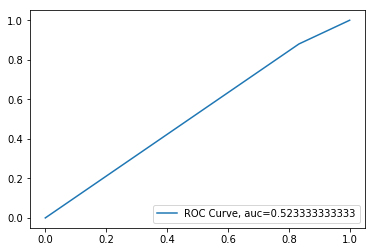

N_Neighbours:   2 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


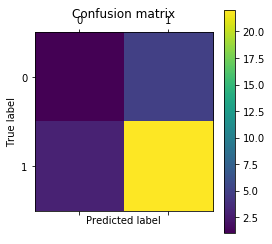

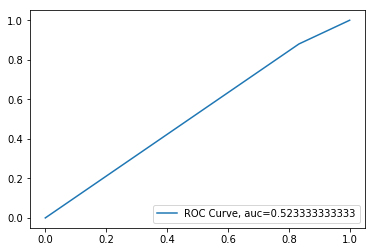

N_Neighbours:   3 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       1.00      0.17      0.29         6
          1       0.83      1.00      0.91        25

avg / total       0.87      0.84      0.79        31

[[ 1  5]
 [ 0 25]]


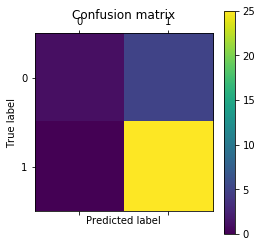

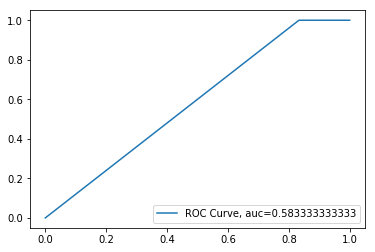

N_Neighbours:   3 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


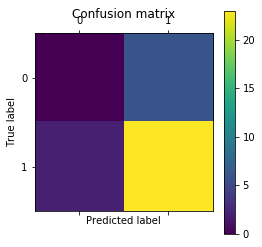

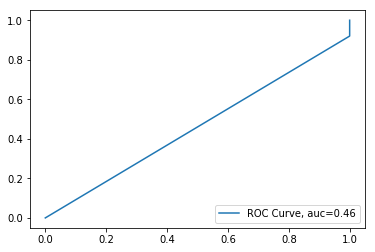

N_Neighbours:   3 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


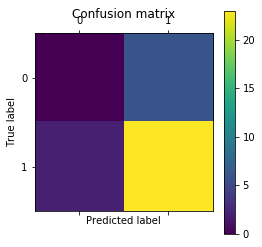

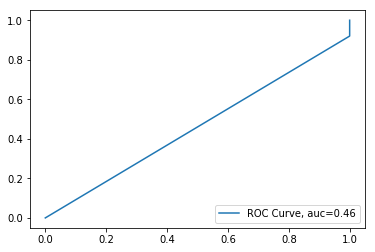

N_Neighbours:   3 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.50      0.17      0.25         6
          1       0.83      0.96      0.89        25

avg / total       0.76      0.81      0.77        31

[[ 1  5]
 [ 1 24]]


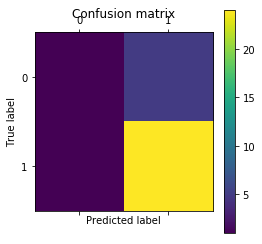

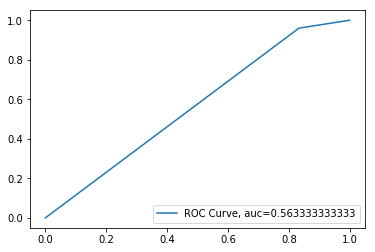

N_Neighbours:   3 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.88      0.83        25

avg / total       0.63      0.71      0.67        31

[[ 0  6]
 [ 3 22]]


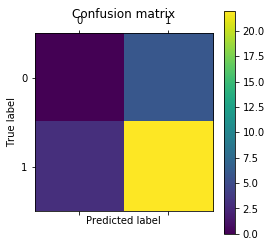

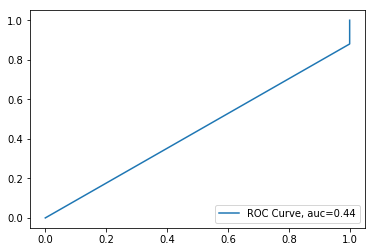

N_Neighbours:   3 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.88      0.83        25

avg / total       0.63      0.71      0.67        31

[[ 0  6]
 [ 3 22]]


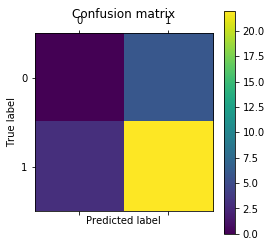

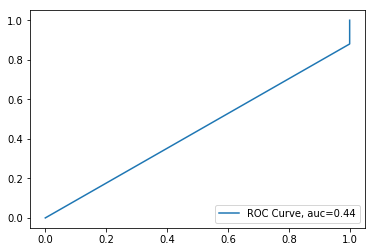

N_Neighbours:   3 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       1.00      0.17      0.29         6
          1       0.83      1.00      0.91        25

avg / total       0.87      0.84      0.79        31

[[ 1  5]
 [ 0 25]]


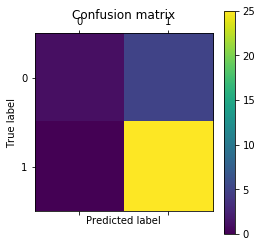

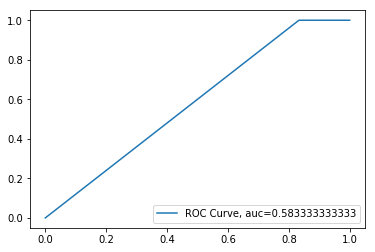

N_Neighbours:   3 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


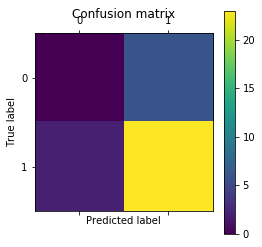

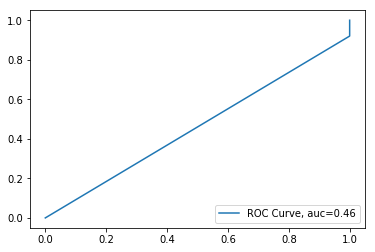

N_Neighbours:   3 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


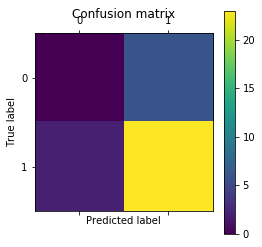

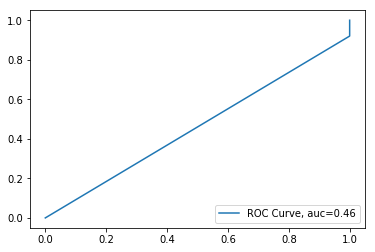

N_Neighbours:   3 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.50      0.17      0.25         6
          1       0.83      0.96      0.89        25

avg / total       0.76      0.81      0.77        31

[[ 1  5]
 [ 1 24]]


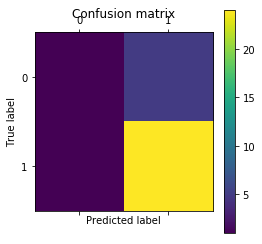

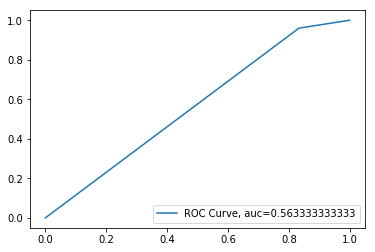

N_Neighbours:   3 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.88      0.83        25

avg / total       0.63      0.71      0.67        31

[[ 0  6]
 [ 3 22]]


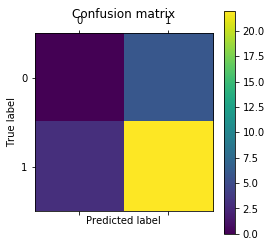

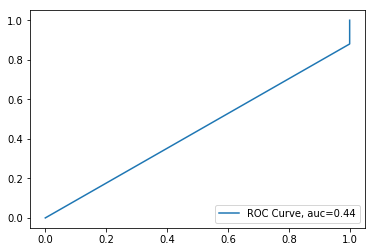

N_Neighbours:   3 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.88      0.83        25

avg / total       0.63      0.71      0.67        31

[[ 0  6]
 [ 3 22]]


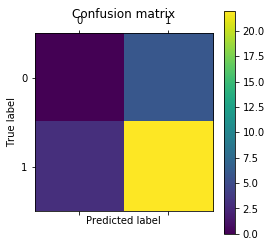

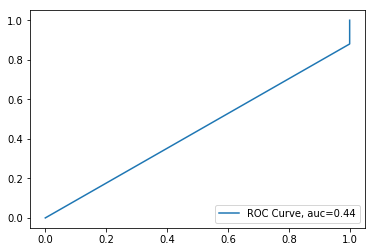

N_Neighbours:   3 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       1.00      0.17      0.29         6
          1       0.83      1.00      0.91        25

avg / total       0.87      0.84      0.79        31

[[ 1  5]
 [ 0 25]]


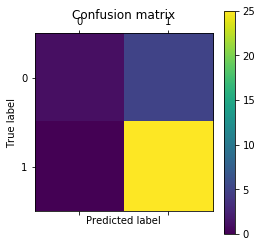

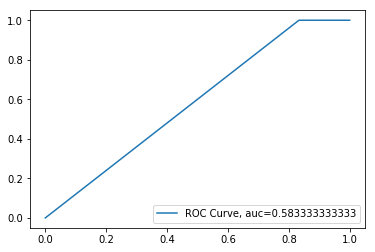

N_Neighbours:   3 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


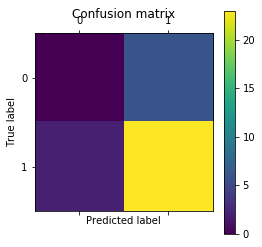

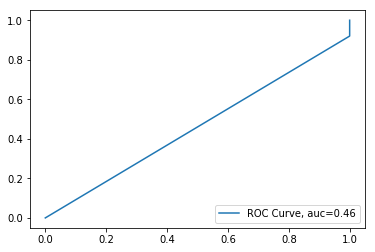

N_Neighbours:   3 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


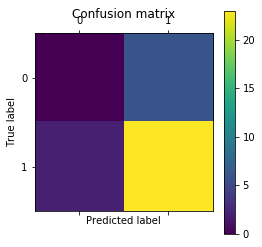

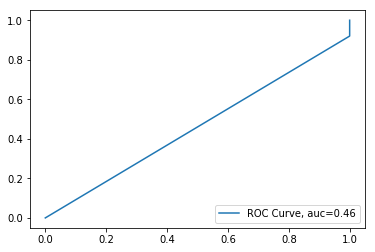

N_Neighbours:   3 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.50      0.17      0.25         6
          1       0.83      0.96      0.89        25

avg / total       0.76      0.81      0.77        31

[[ 1  5]
 [ 1 24]]


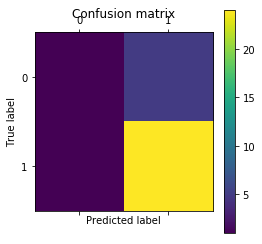

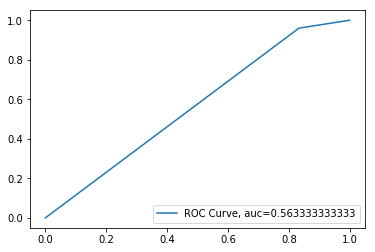

N_Neighbours:   3 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.88      0.83        25

avg / total       0.63      0.71      0.67        31

[[ 0  6]
 [ 3 22]]


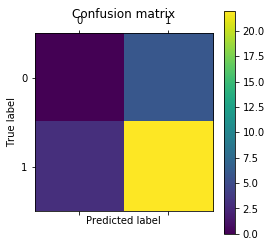

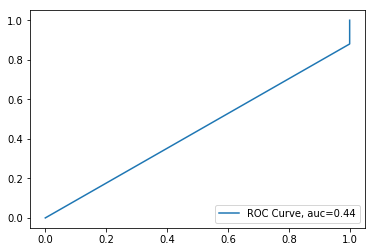

N_Neighbours:   3 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.88      0.83        25

avg / total       0.63      0.71      0.67        31

[[ 0  6]
 [ 3 22]]


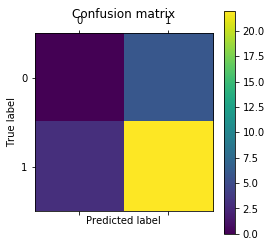

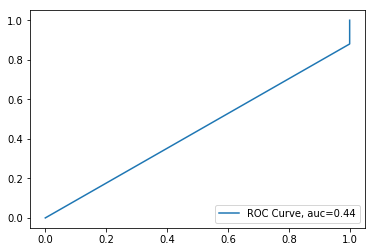

N_Neighbours:   3 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       1.00      0.17      0.29         6
          1       0.83      1.00      0.91        25

avg / total       0.87      0.84      0.79        31

[[ 1  5]
 [ 0 25]]


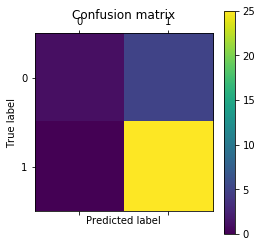

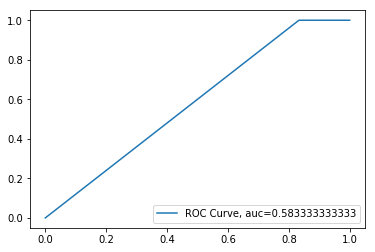

N_Neighbours:   3 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


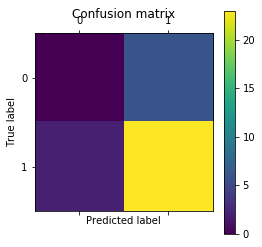

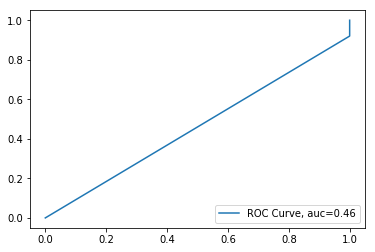

N_Neighbours:   3 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


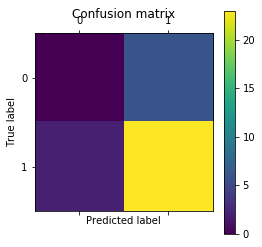

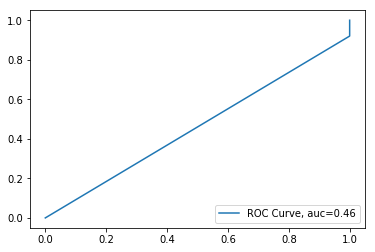

N_Neighbours:   3 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.50      0.17      0.25         6
          1       0.83      0.96      0.89        25

avg / total       0.76      0.81      0.77        31

[[ 1  5]
 [ 1 24]]


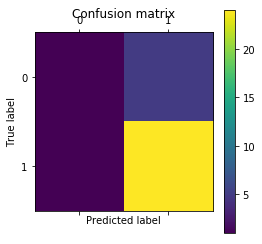

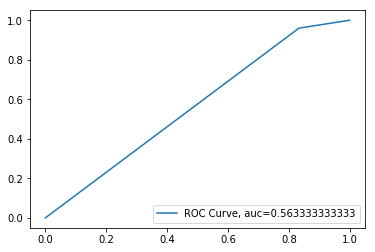

N_Neighbours:   3 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.88      0.83        25

avg / total       0.63      0.71      0.67        31

[[ 0  6]
 [ 3 22]]


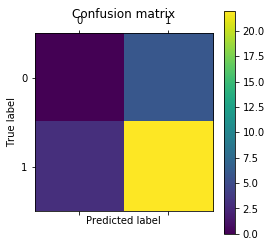

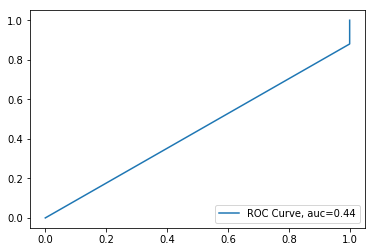

N_Neighbours:   3 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.88      0.83        25

avg / total       0.63      0.71      0.67        31

[[ 0  6]
 [ 3 22]]


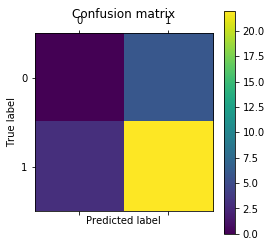

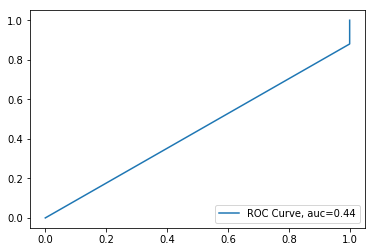

N_Neighbours:   4 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.33      0.17      0.22         6
          1       0.82      0.92      0.87        25

avg / total       0.73      0.77      0.74        31

[[ 1  5]
 [ 2 23]]


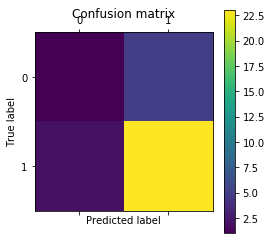

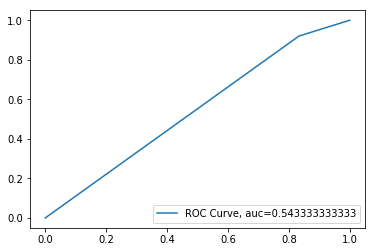

N_Neighbours:   4 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.20      0.17      0.18         6
          1       0.81      0.84      0.82        25

avg / total       0.69      0.71      0.70        31

[[ 1  5]
 [ 4 21]]


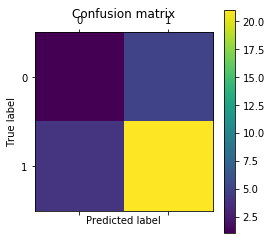

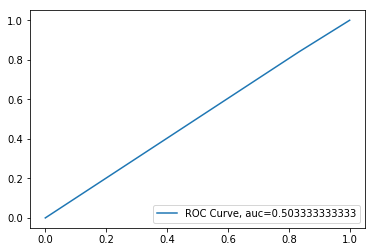

N_Neighbours:   4 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.88      0.83        25

avg / total       0.63      0.71      0.67        31

[[ 0  6]
 [ 3 22]]


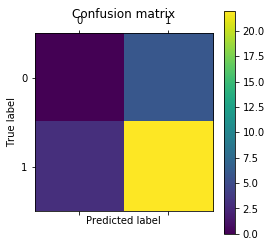

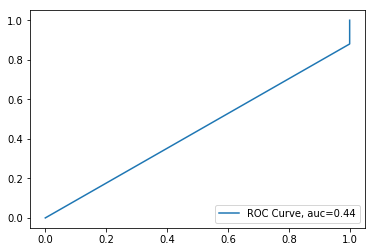

N_Neighbours:   4 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.50      0.17      0.25         6
          1       0.83      0.96      0.89        25

avg / total       0.76      0.81      0.77        31

[[ 1  5]
 [ 1 24]]


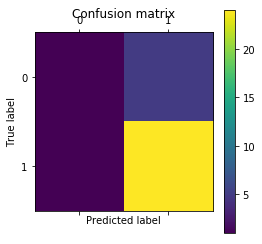

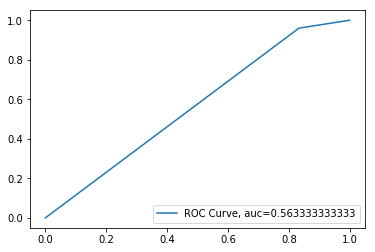

N_Neighbours:   4 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


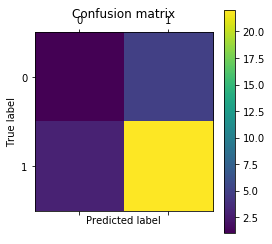

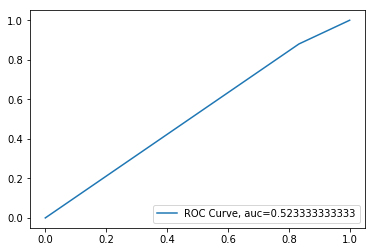

N_Neighbours:   4 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


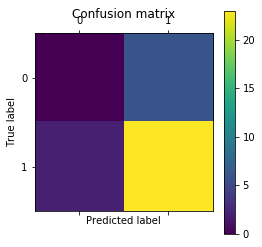

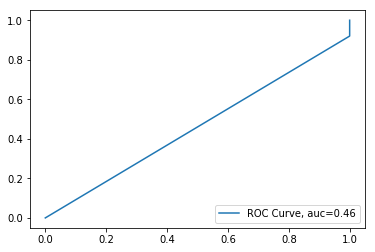

N_Neighbours:   4 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.33      0.17      0.22         6
          1       0.82      0.92      0.87        25

avg / total       0.73      0.77      0.74        31

[[ 1  5]
 [ 2 23]]


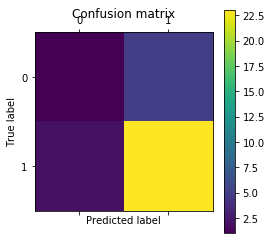

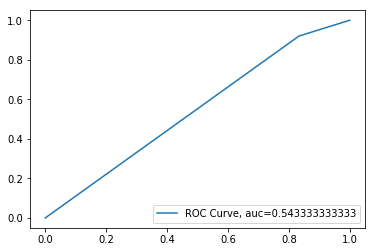

N_Neighbours:   4 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.20      0.17      0.18         6
          1       0.81      0.84      0.82        25

avg / total       0.69      0.71      0.70        31

[[ 1  5]
 [ 4 21]]


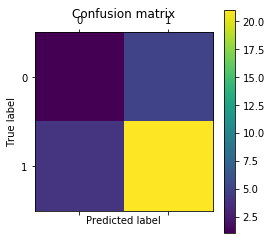

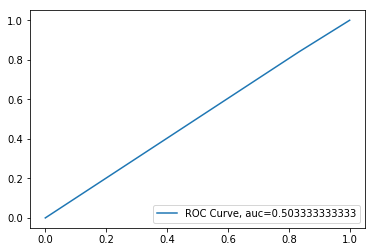

N_Neighbours:   4 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.88      0.83        25

avg / total       0.63      0.71      0.67        31

[[ 0  6]
 [ 3 22]]


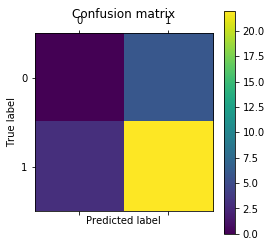

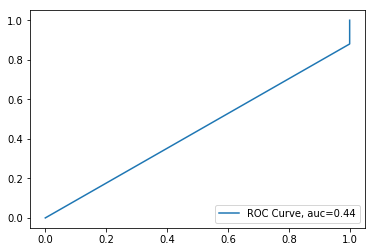

N_Neighbours:   4 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.50      0.17      0.25         6
          1       0.83      0.96      0.89        25

avg / total       0.76      0.81      0.77        31

[[ 1  5]
 [ 1 24]]


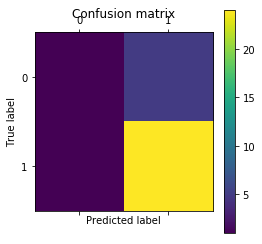

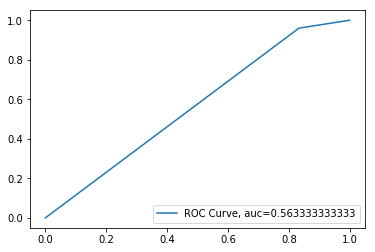

N_Neighbours:   4 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


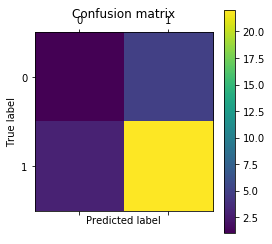

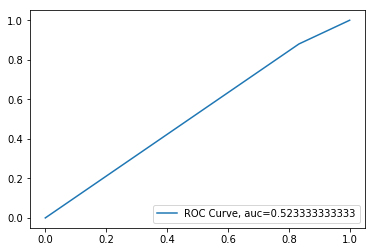

N_Neighbours:   4 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


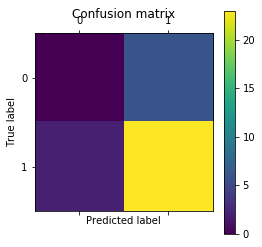

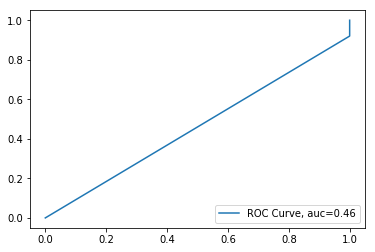

N_Neighbours:   4 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.33      0.17      0.22         6
          1       0.82      0.92      0.87        25

avg / total       0.73      0.77      0.74        31

[[ 1  5]
 [ 2 23]]


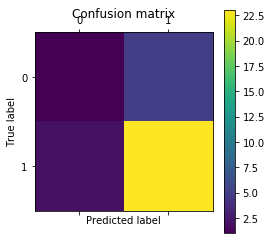

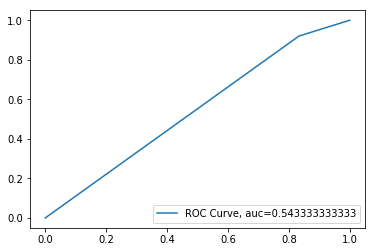

N_Neighbours:   4 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.20      0.17      0.18         6
          1       0.81      0.84      0.82        25

avg / total       0.69      0.71      0.70        31

[[ 1  5]
 [ 4 21]]


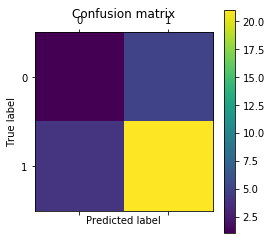

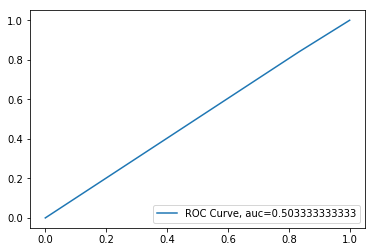

N_Neighbours:   4 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.88      0.83        25

avg / total       0.63      0.71      0.67        31

[[ 0  6]
 [ 3 22]]


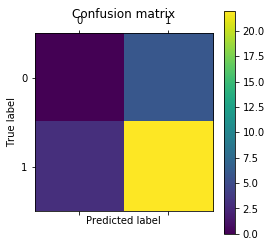

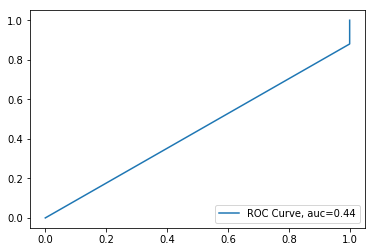

N_Neighbours:   4 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.50      0.17      0.25         6
          1       0.83      0.96      0.89        25

avg / total       0.76      0.81      0.77        31

[[ 1  5]
 [ 1 24]]


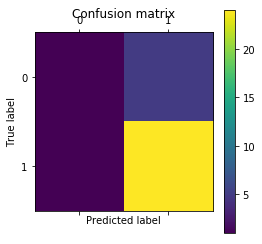

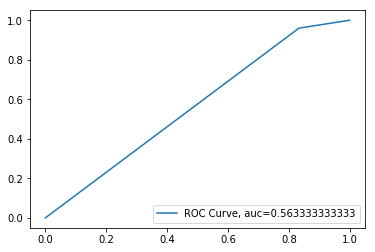

N_Neighbours:   4 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


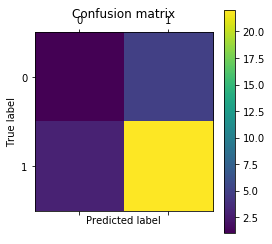

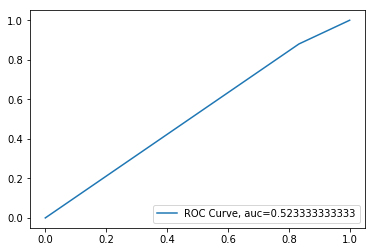

N_Neighbours:   4 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


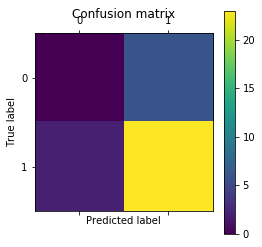

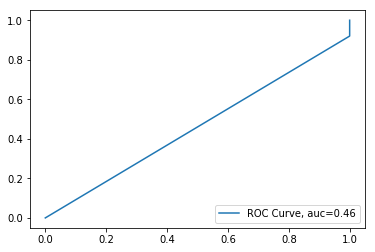

N_Neighbours:   4 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.33      0.17      0.22         6
          1       0.82      0.92      0.87        25

avg / total       0.73      0.77      0.74        31

[[ 1  5]
 [ 2 23]]


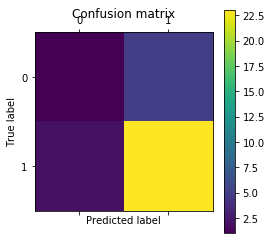

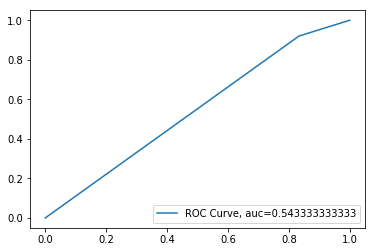

N_Neighbours:   4 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.20      0.17      0.18         6
          1       0.81      0.84      0.82        25

avg / total       0.69      0.71      0.70        31

[[ 1  5]
 [ 4 21]]


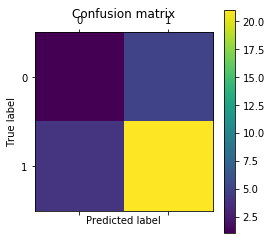

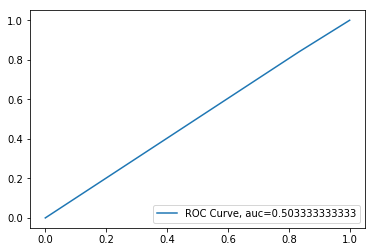

N_Neighbours:   4 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.709677419355
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.88      0.83        25

avg / total       0.63      0.71      0.67        31

[[ 0  6]
 [ 3 22]]


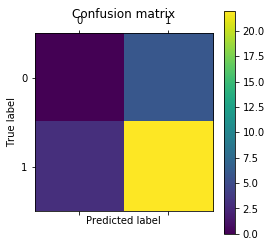

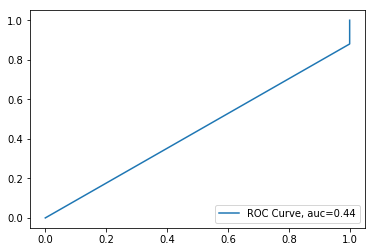

N_Neighbours:   4 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.50      0.17      0.25         6
          1       0.83      0.96      0.89        25

avg / total       0.76      0.81      0.77        31

[[ 1  5]
 [ 1 24]]


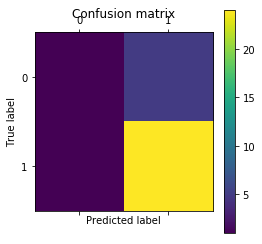

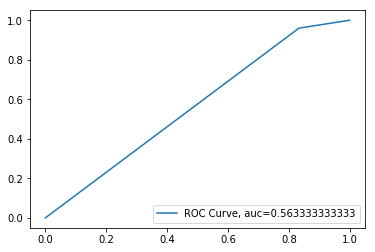

N_Neighbours:   4 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.25      0.17      0.20         6
          1       0.81      0.88      0.85        25

avg / total       0.71      0.74      0.72        31

[[ 1  5]
 [ 3 22]]


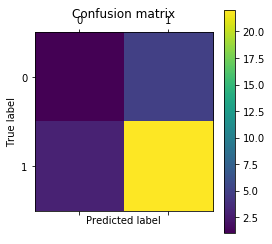

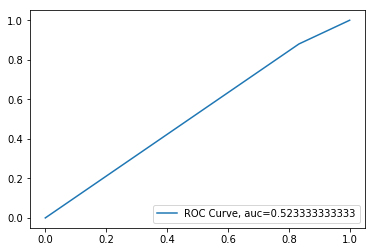

N_Neighbours:   4 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


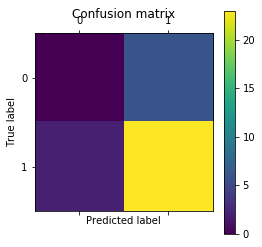

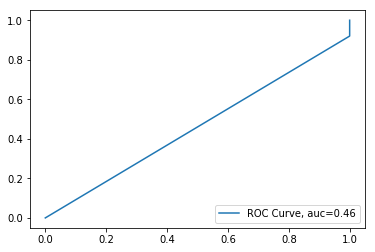

N_Neighbours:   5 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


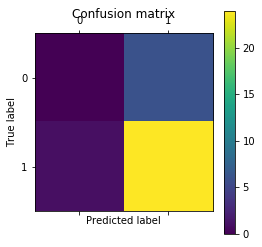

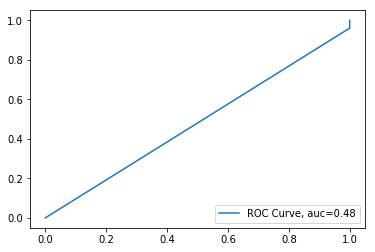

N_Neighbours:   5 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


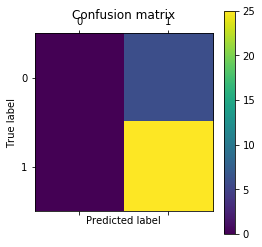

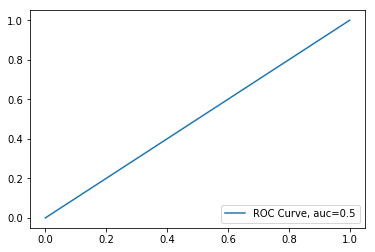

N_Neighbours:   5 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


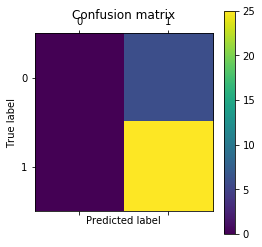

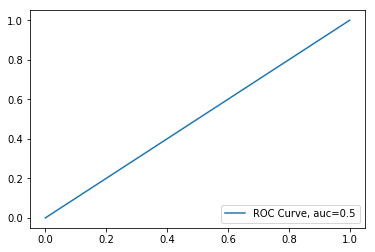

N_Neighbours:   5 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


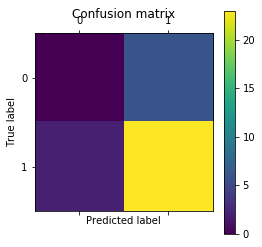

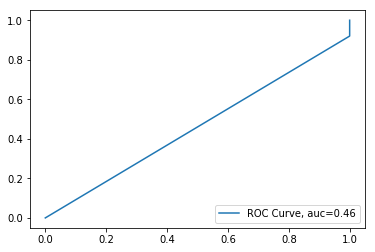

N_Neighbours:   5 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


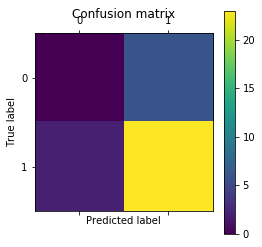

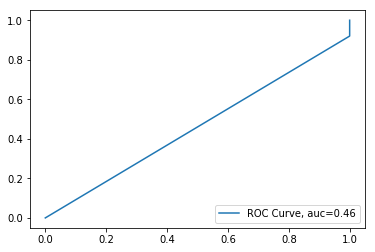

N_Neighbours:   5 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


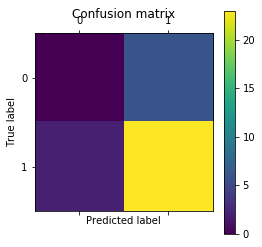

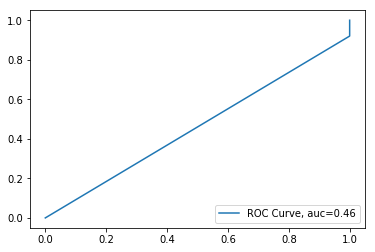

N_Neighbours:   5 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


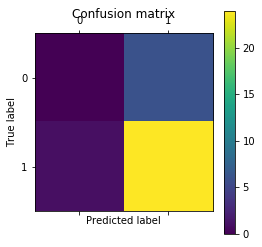

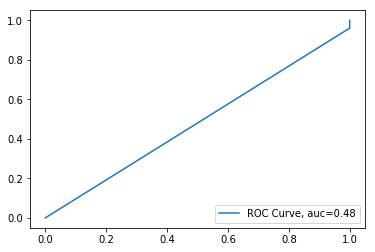

N_Neighbours:   5 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


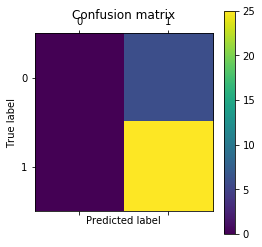

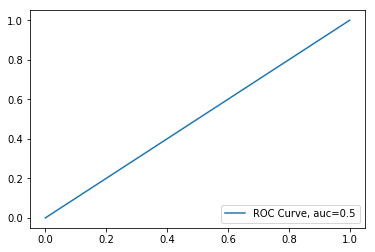

N_Neighbours:   5 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


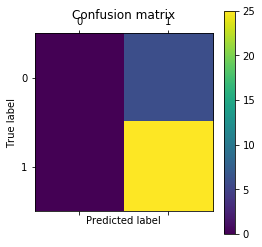

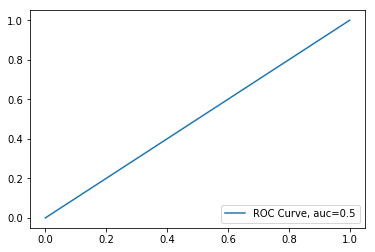

N_Neighbours:   5 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


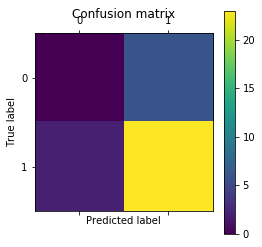

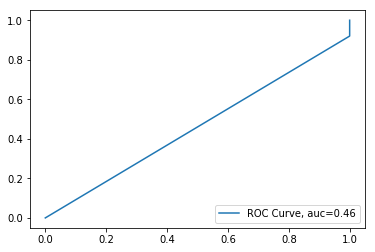

N_Neighbours:   5 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


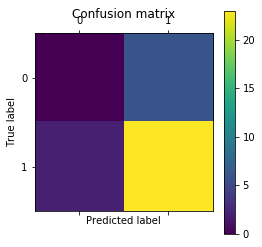

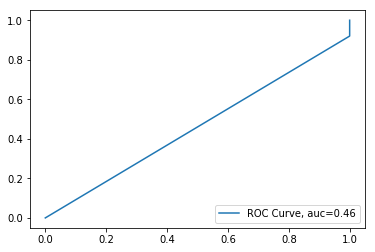

N_Neighbours:   5 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


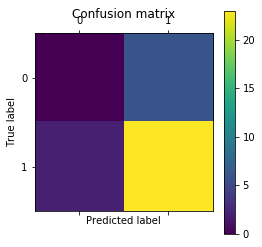

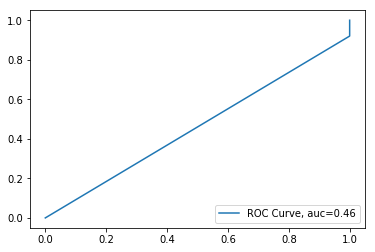

N_Neighbours:   5 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


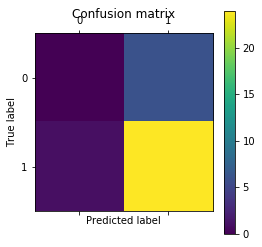

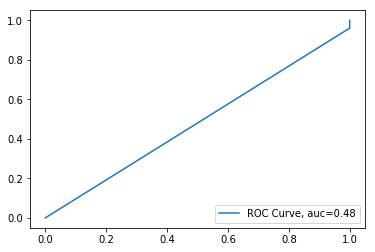

N_Neighbours:   5 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


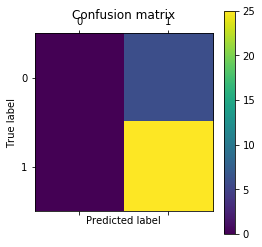

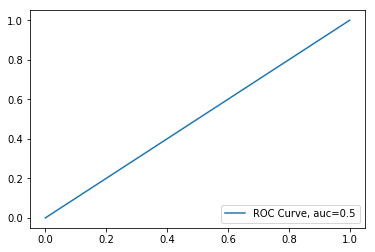

N_Neighbours:   5 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


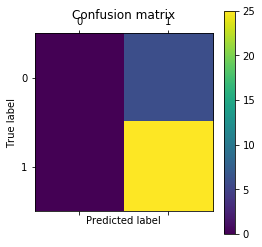

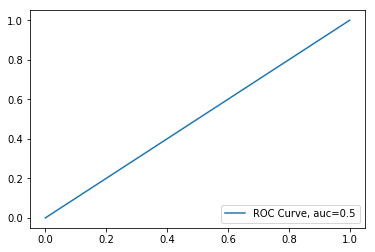

N_Neighbours:   5 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


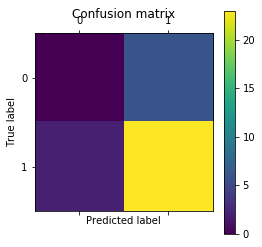

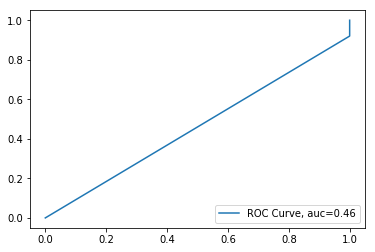

N_Neighbours:   5 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


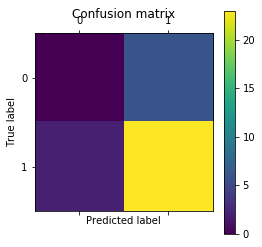

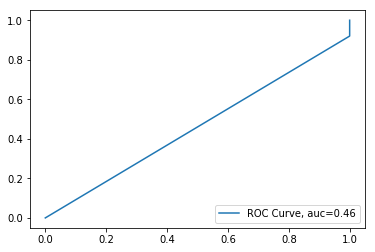

N_Neighbours:   5 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


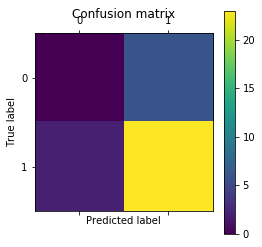

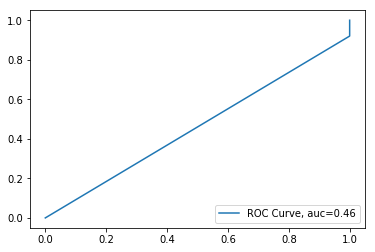

N_Neighbours:   5 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


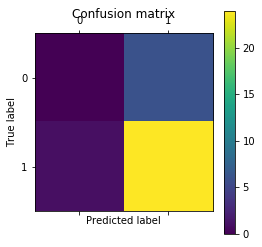

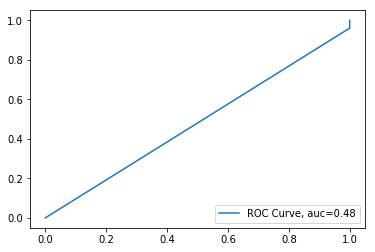

N_Neighbours:   5 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


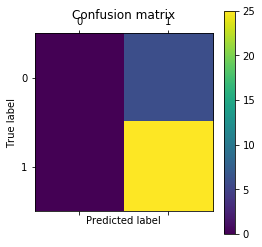

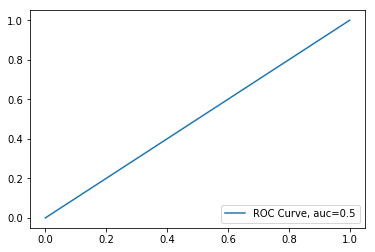

N_Neighbours:   5 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


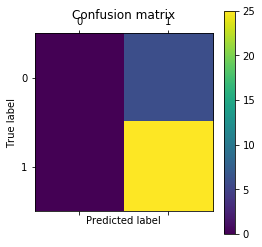

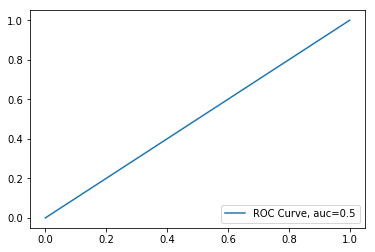

N_Neighbours:   5 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


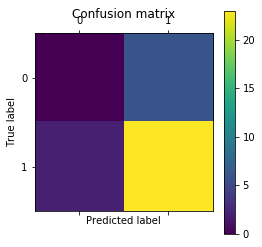

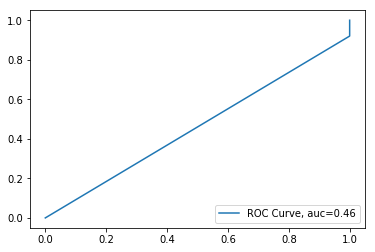

N_Neighbours:   5 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


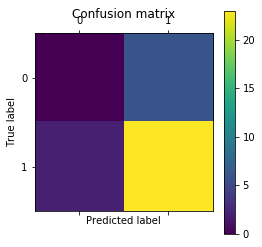

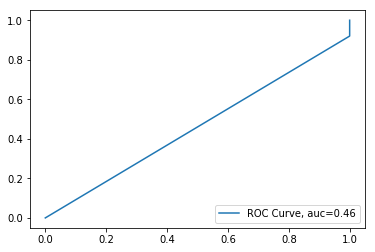

N_Neighbours:   5 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


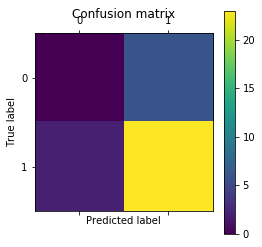

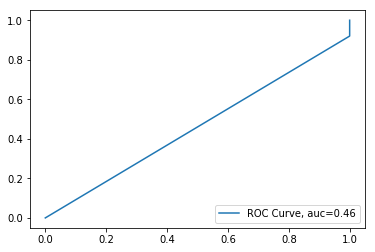

N_Neighbours:   6 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


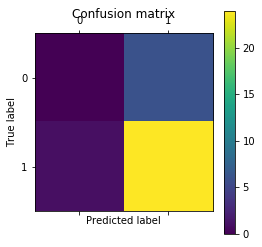

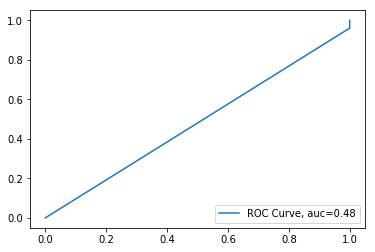

N_Neighbours:   6 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


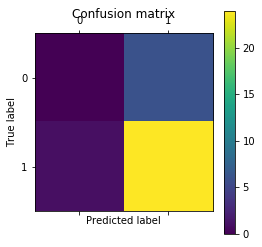

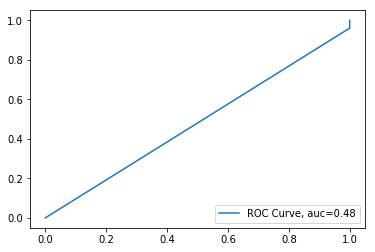

N_Neighbours:   6 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.50      0.17      0.25         6
          1       0.83      0.96      0.89        25

avg / total       0.76      0.81      0.77        31

[[ 1  5]
 [ 1 24]]


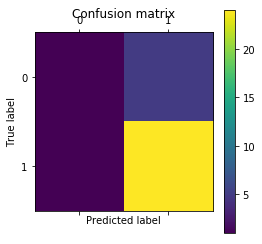

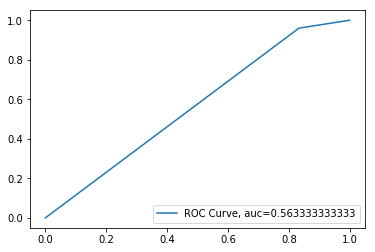

N_Neighbours:   6 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


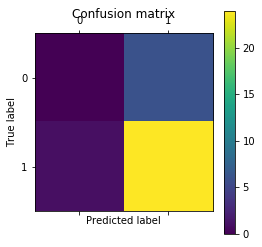

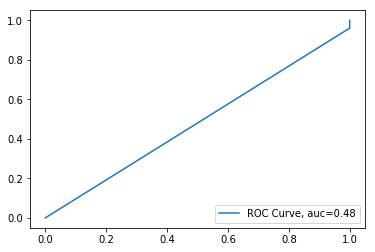

N_Neighbours:   6 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


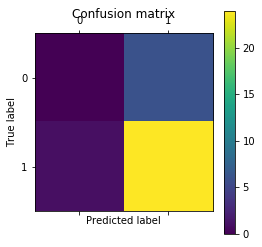

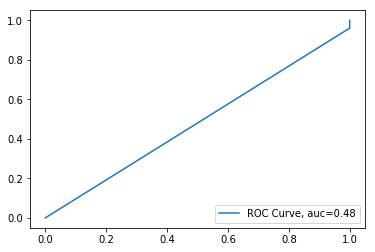

N_Neighbours:   6 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


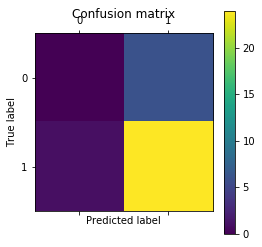

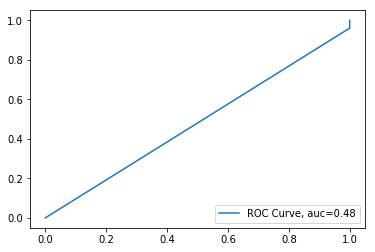

N_Neighbours:   6 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


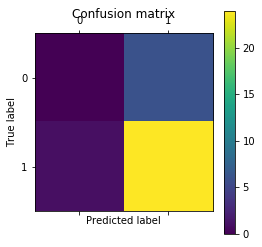

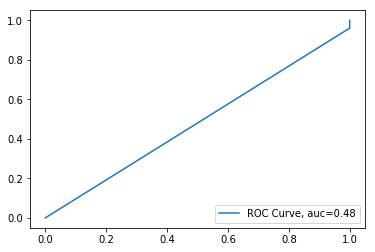

N_Neighbours:   6 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


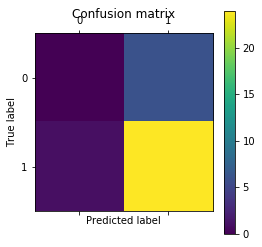

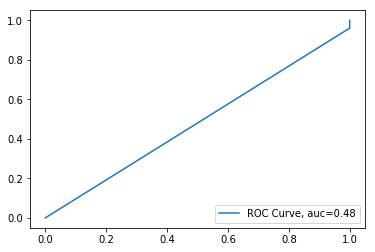

N_Neighbours:   6 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.50      0.17      0.25         6
          1       0.83      0.96      0.89        25

avg / total       0.76      0.81      0.77        31

[[ 1  5]
 [ 1 24]]


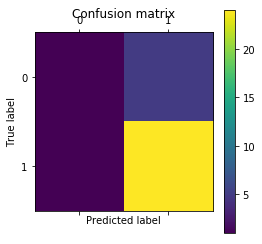

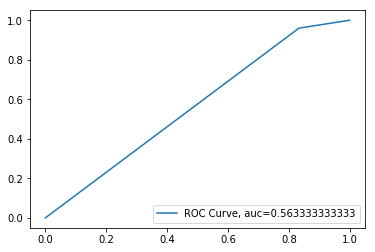

N_Neighbours:   6 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


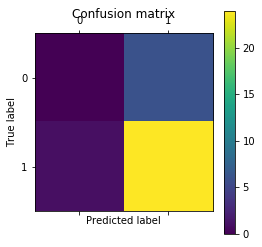

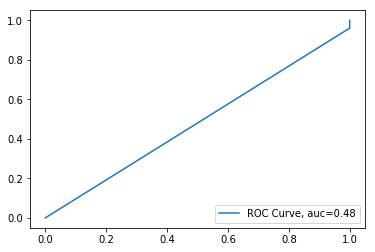

N_Neighbours:   6 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


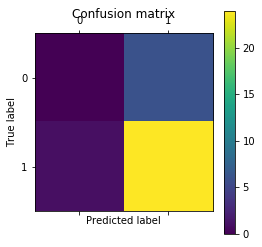

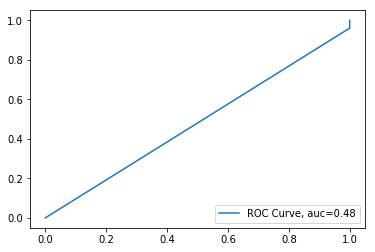

N_Neighbours:   6 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


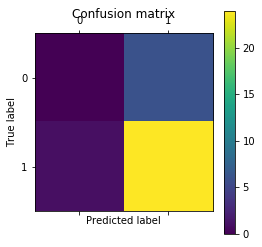

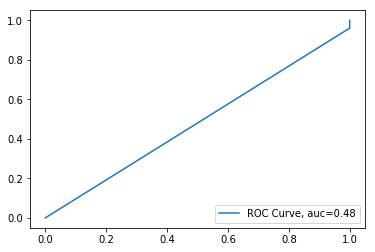

N_Neighbours:   6 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


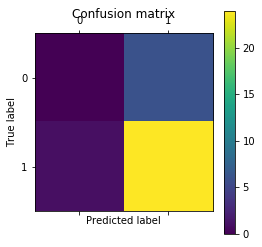

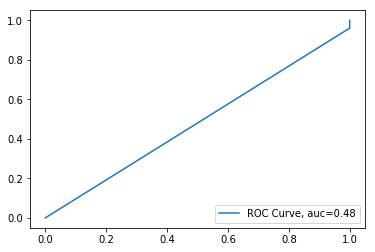

N_Neighbours:   6 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


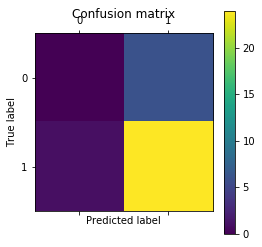

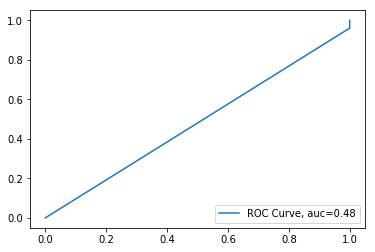

N_Neighbours:   6 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.50      0.17      0.25         6
          1       0.83      0.96      0.89        25

avg / total       0.76      0.81      0.77        31

[[ 1  5]
 [ 1 24]]


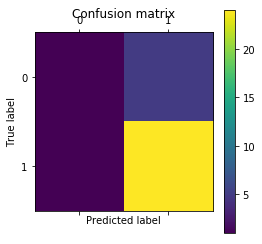

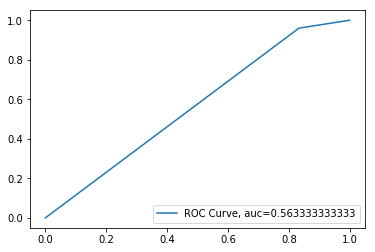

N_Neighbours:   6 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


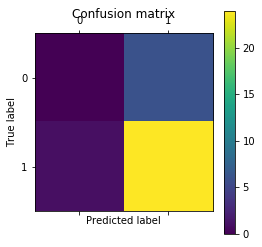

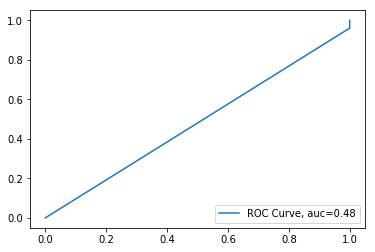

N_Neighbours:   6 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


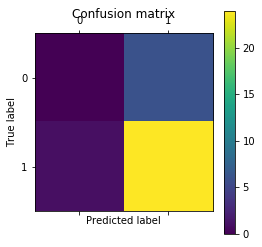

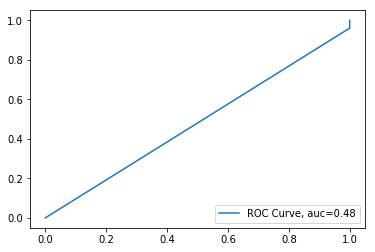

N_Neighbours:   6 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


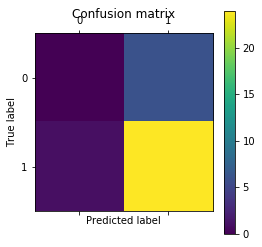

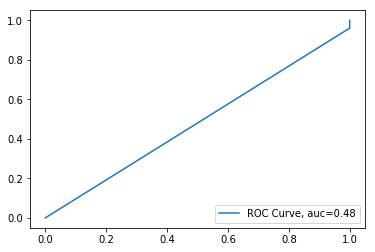

N_Neighbours:   6 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


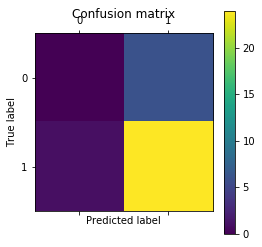

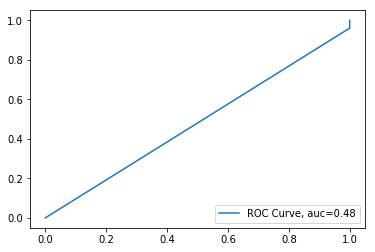

N_Neighbours:   6 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


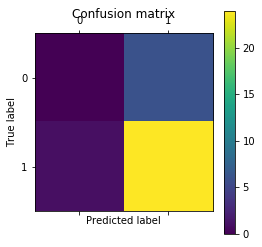

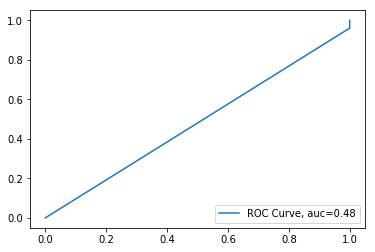

N_Neighbours:   6 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.50      0.17      0.25         6
          1       0.83      0.96      0.89        25

avg / total       0.76      0.81      0.77        31

[[ 1  5]
 [ 1 24]]


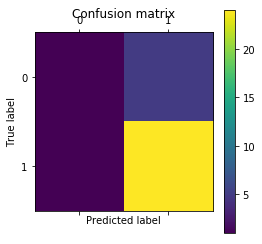

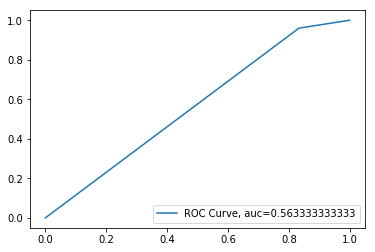

N_Neighbours:   6 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


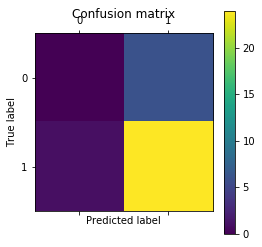

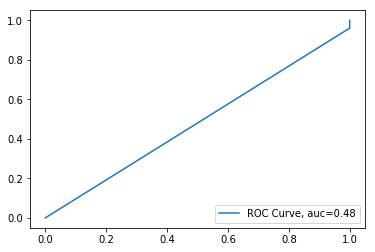

N_Neighbours:   6 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


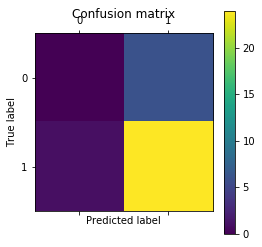

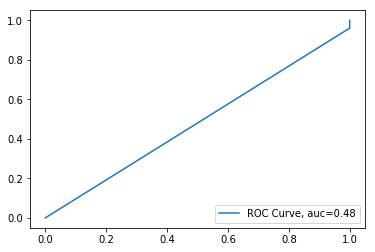

N_Neighbours:   6 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


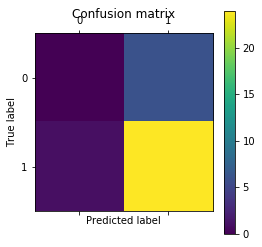

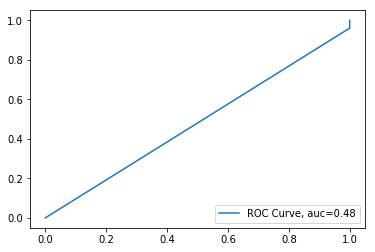

N_Neighbours:   7 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


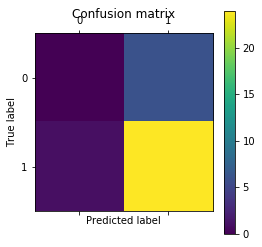

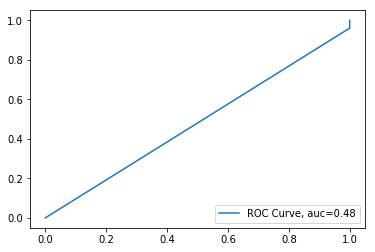

N_Neighbours:   7 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


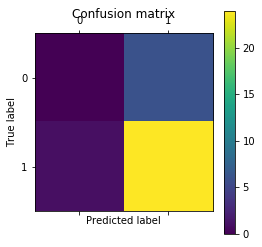

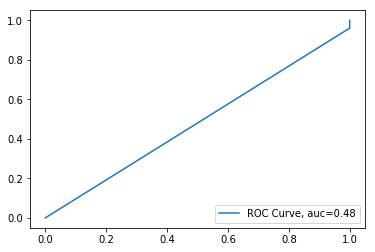

N_Neighbours:   7 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


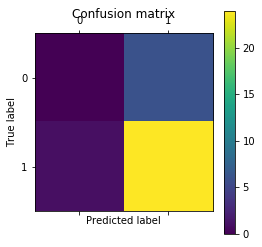

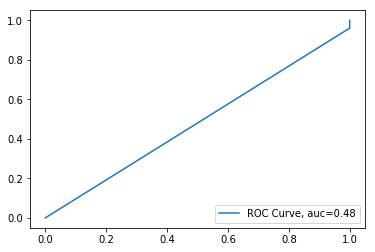

N_Neighbours:   7 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


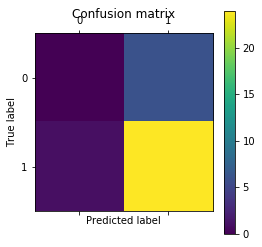

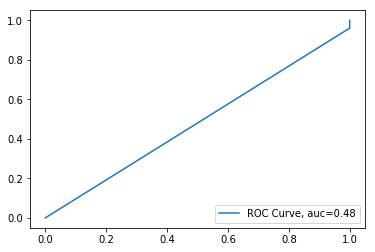

N_Neighbours:   7 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


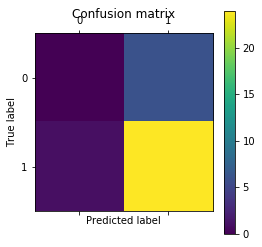

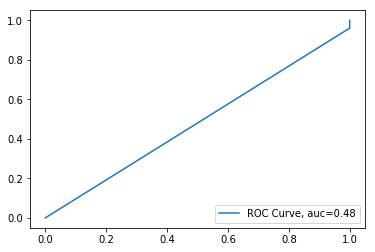

N_Neighbours:   7 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


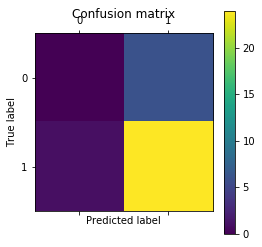

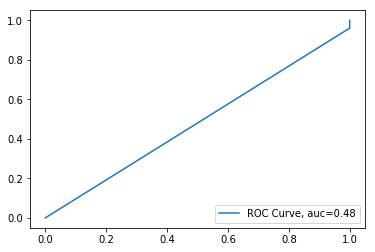

N_Neighbours:   7 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


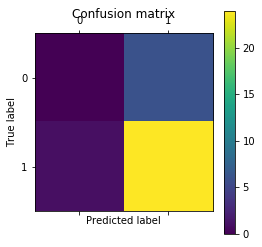

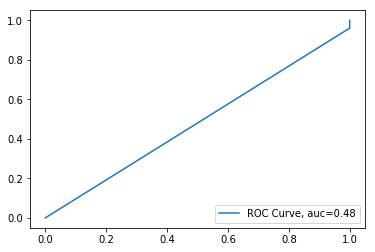

N_Neighbours:   7 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


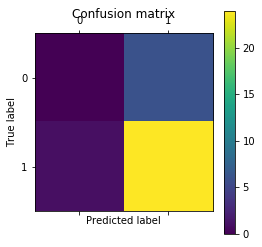

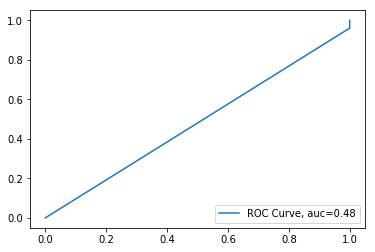

N_Neighbours:   7 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


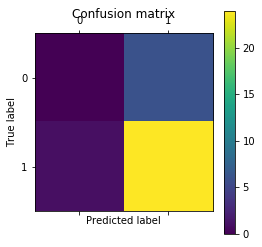

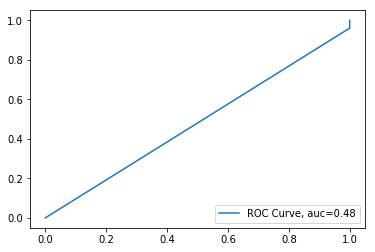

N_Neighbours:   7 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


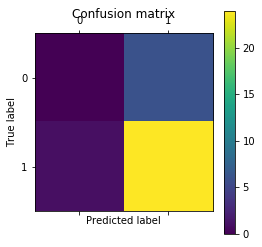

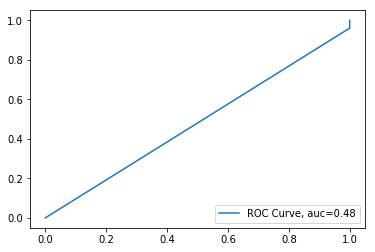

N_Neighbours:   7 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


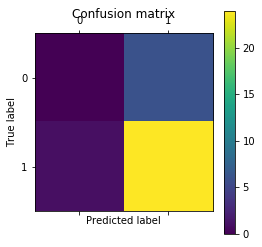

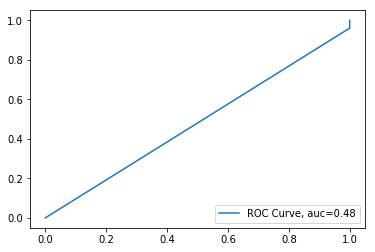

N_Neighbours:   7 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


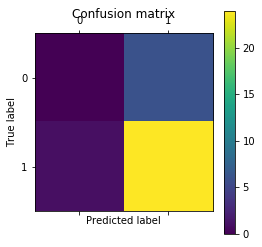

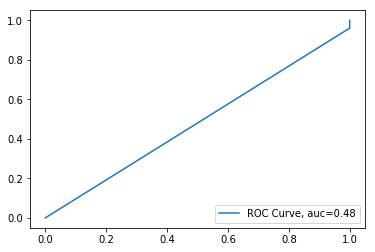

N_Neighbours:   7 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


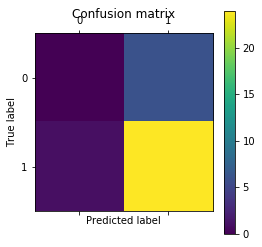

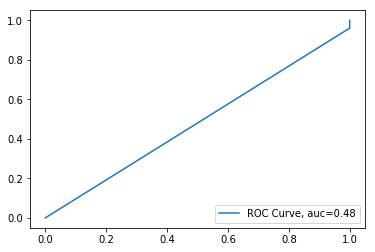

N_Neighbours:   7 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


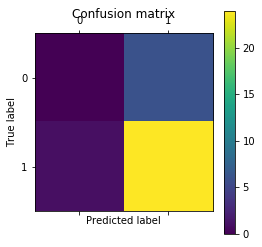

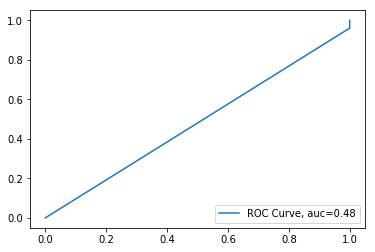

N_Neighbours:   7 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


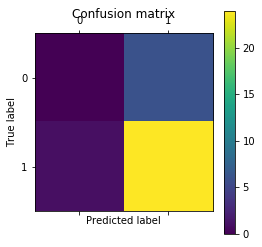

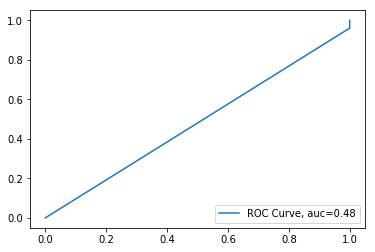

N_Neighbours:   7 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


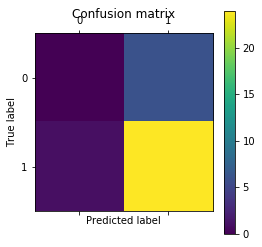

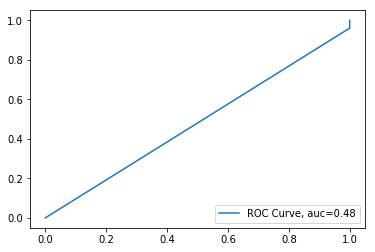

N_Neighbours:   7 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


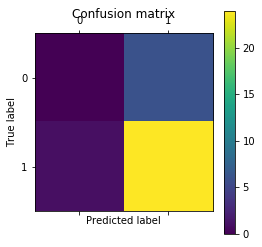

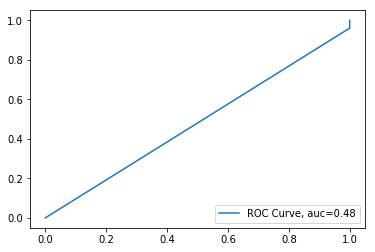

N_Neighbours:   7 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


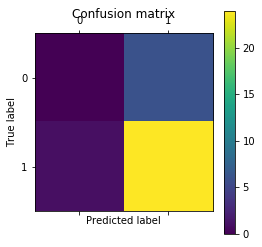

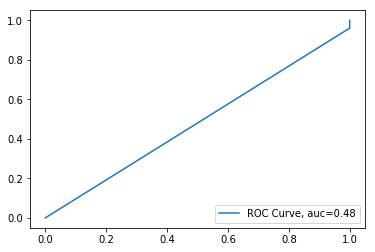

N_Neighbours:   7 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


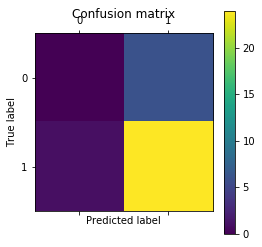

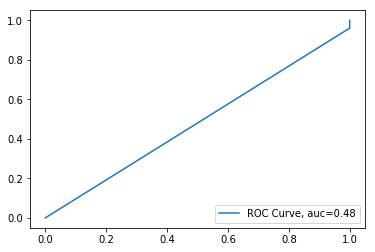

N_Neighbours:   7 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


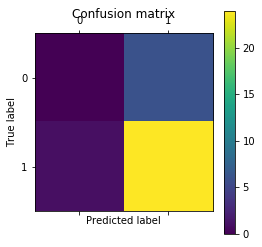

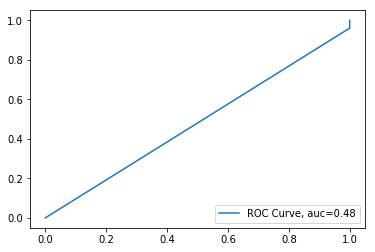

N_Neighbours:   7 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


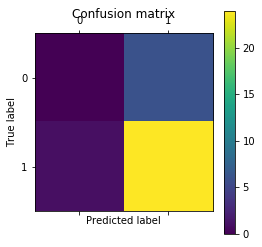

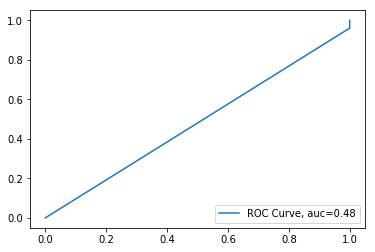

N_Neighbours:   7 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


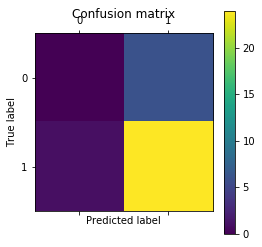

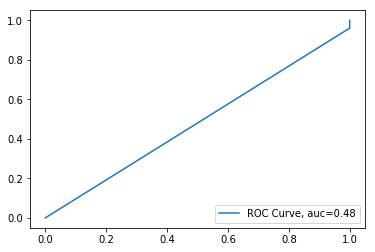

N_Neighbours:   7 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


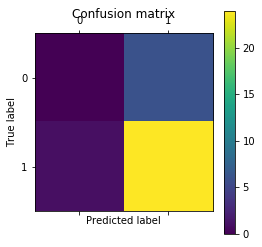

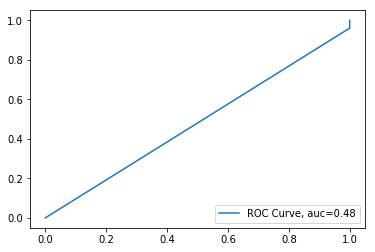

N_Neighbours:   7 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


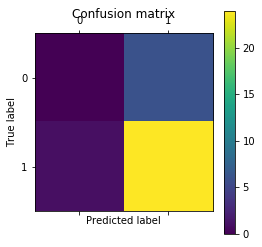

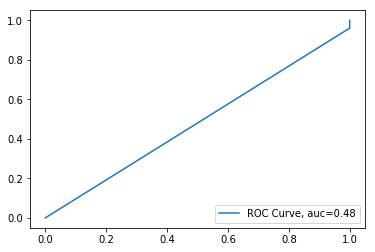

N_Neighbours:   8 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


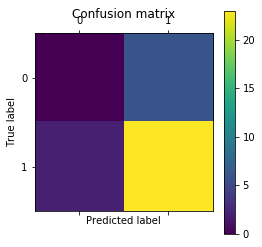

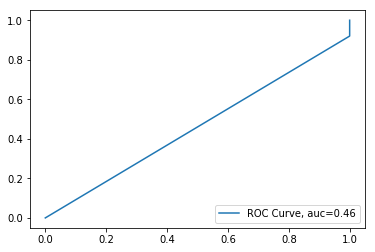

N_Neighbours:   8 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


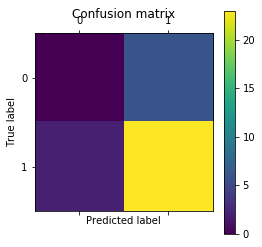

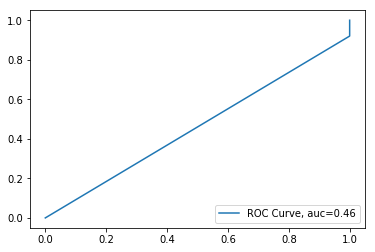

N_Neighbours:   8 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


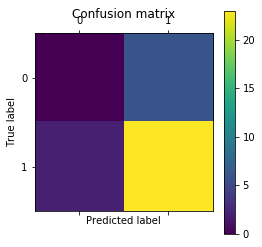

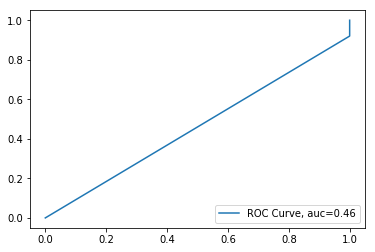

N_Neighbours:   8 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


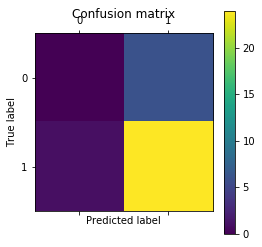

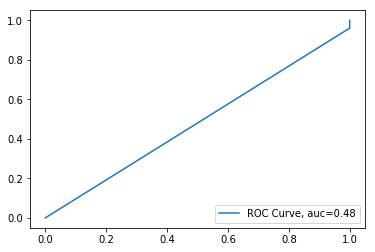

N_Neighbours:   8 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


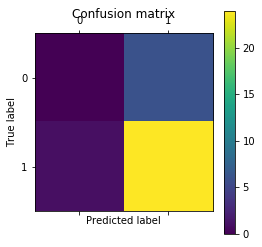

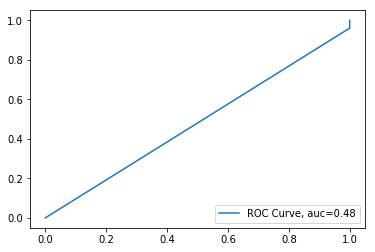

N_Neighbours:   8 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


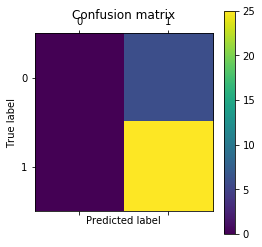

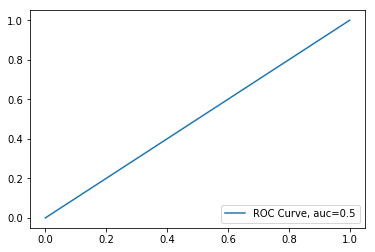

N_Neighbours:   8 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


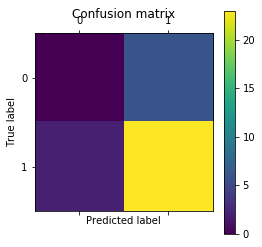

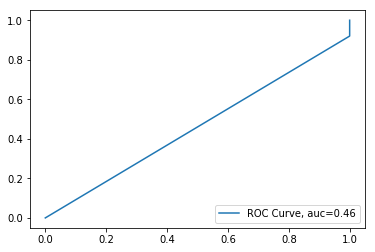

N_Neighbours:   8 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


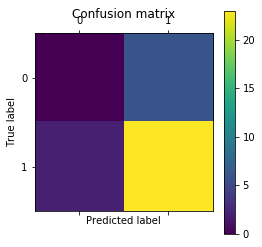

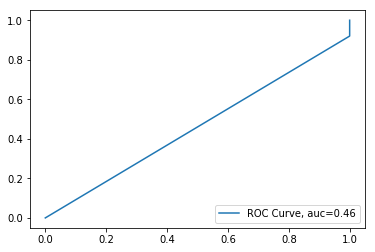

N_Neighbours:   8 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


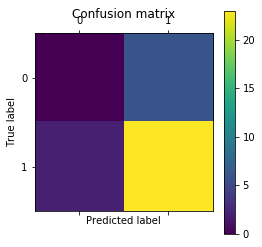

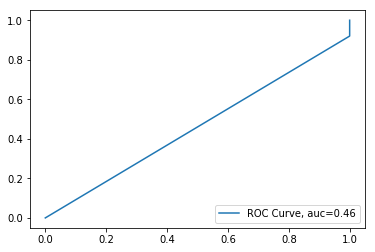

N_Neighbours:   8 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


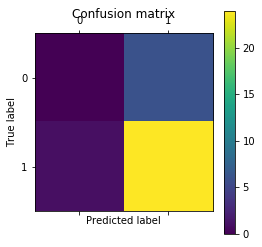

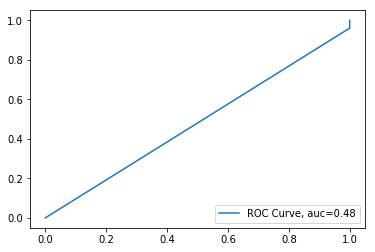

N_Neighbours:   8 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


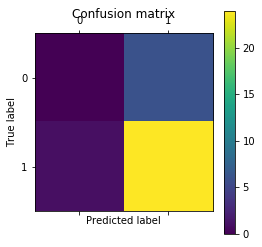

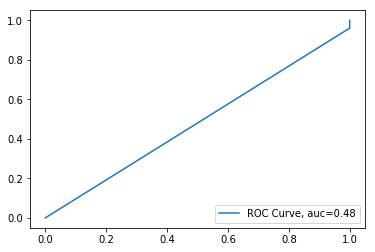

N_Neighbours:   8 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


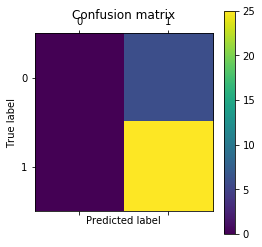

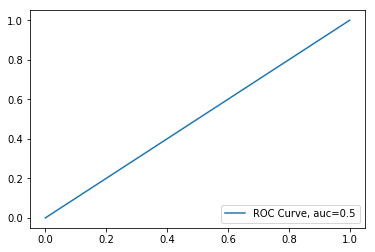

N_Neighbours:   8 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


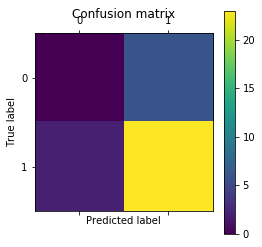

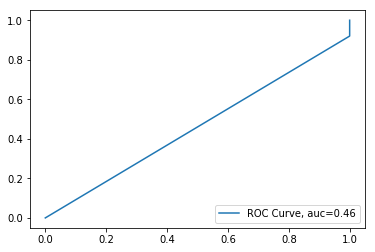

N_Neighbours:   8 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


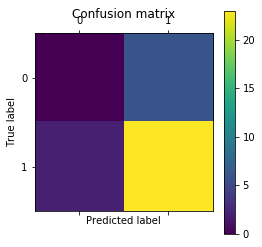

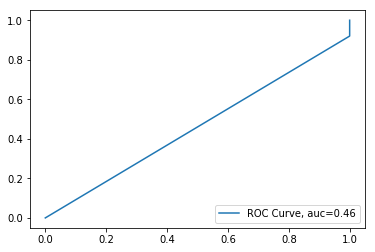

N_Neighbours:   8 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


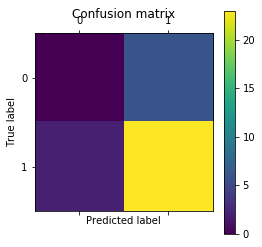

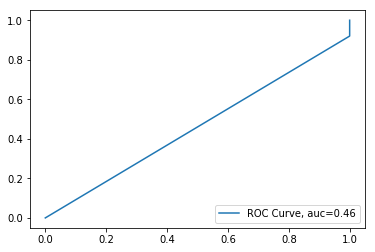

N_Neighbours:   8 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


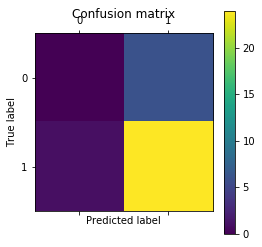

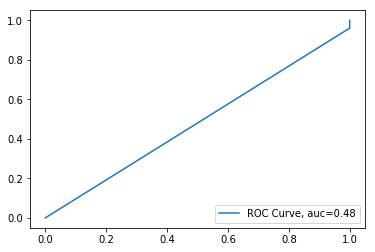

N_Neighbours:   8 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


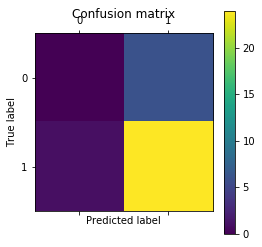

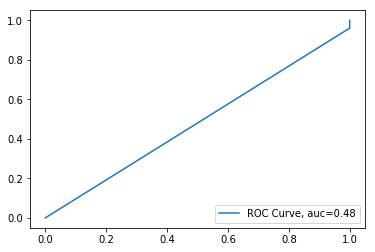

N_Neighbours:   8 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


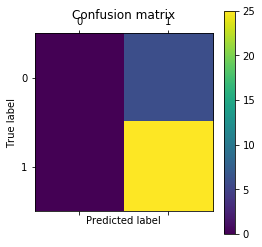

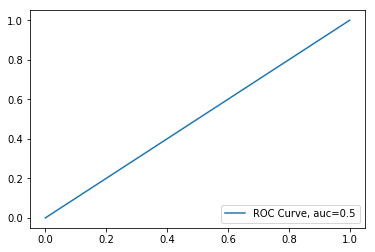

N_Neighbours:   8 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


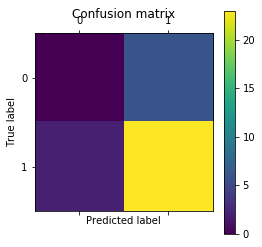

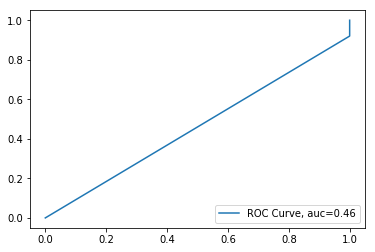

N_Neighbours:   8 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


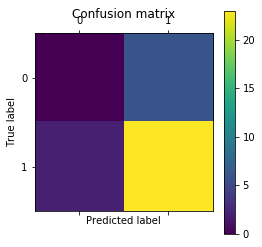

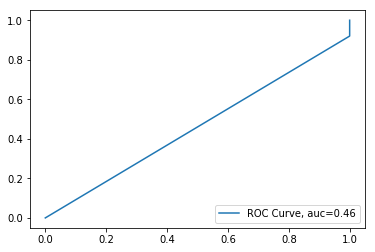

N_Neighbours:   8 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


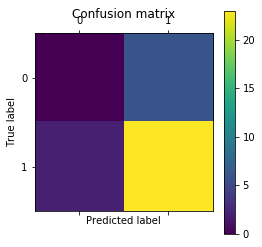

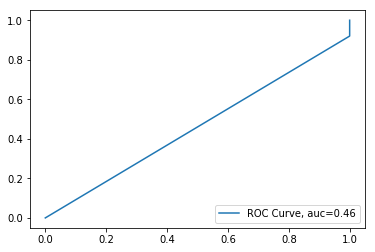

N_Neighbours:   8 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


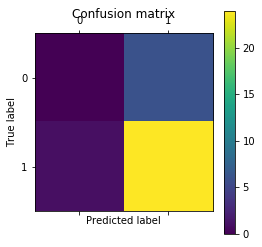

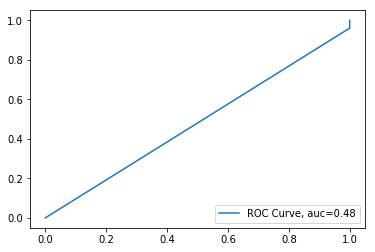

N_Neighbours:   8 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


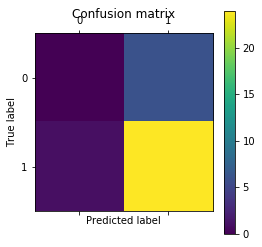

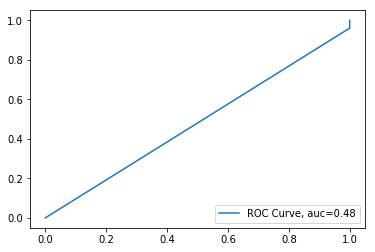

N_Neighbours:   8 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


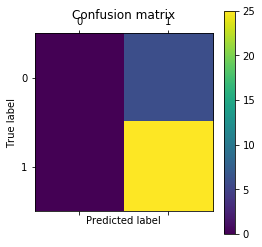

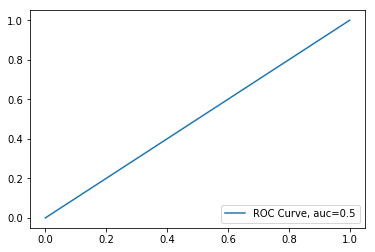

N_Neighbours:   9 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


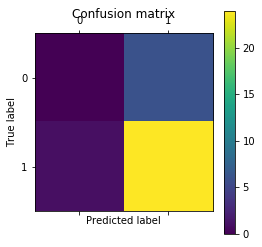

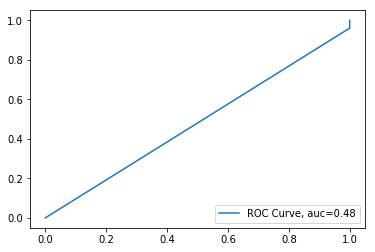

N_Neighbours:   9 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


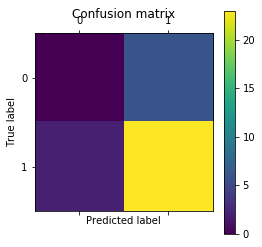

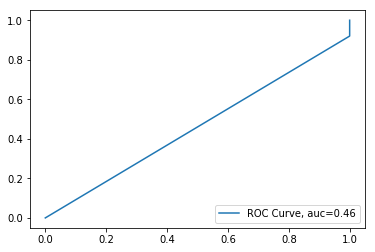

N_Neighbours:   9 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


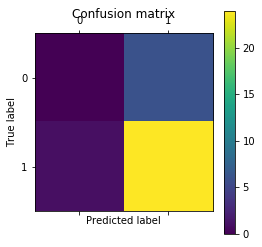

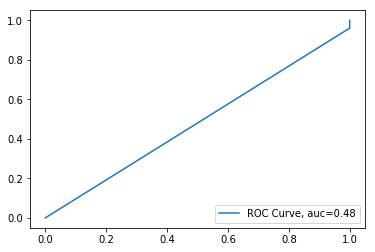

N_Neighbours:   9 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


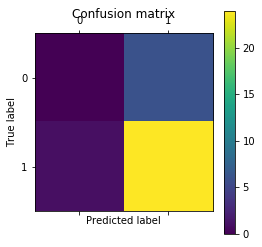

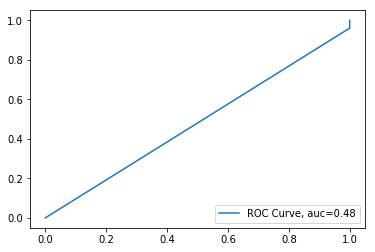

N_Neighbours:   9 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


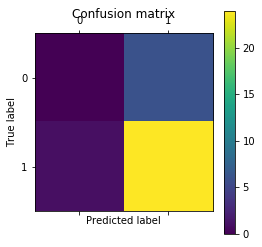

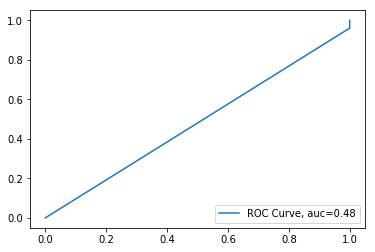

N_Neighbours:   9 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


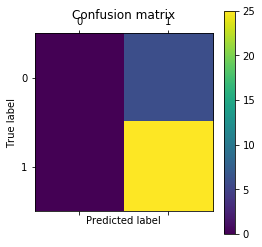

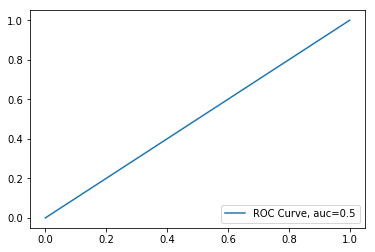

N_Neighbours:   9 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


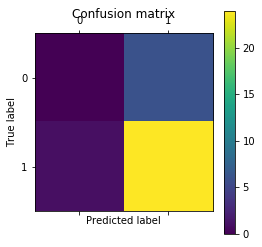

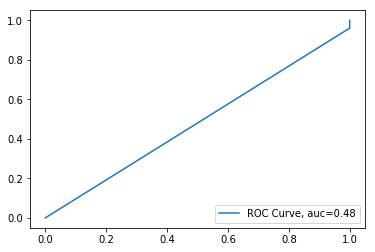

N_Neighbours:   9 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


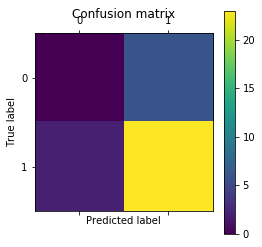

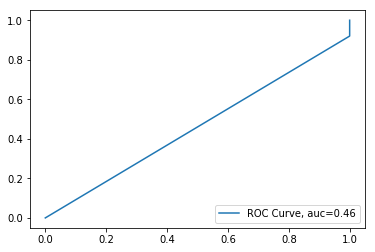

N_Neighbours:   9 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


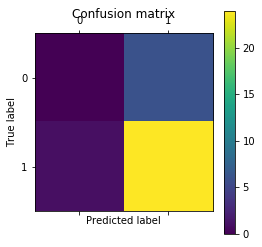

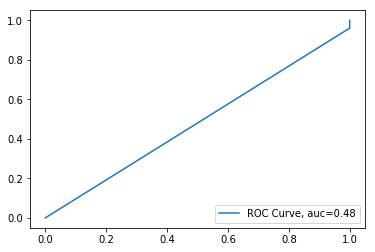

N_Neighbours:   9 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


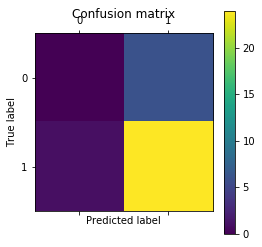

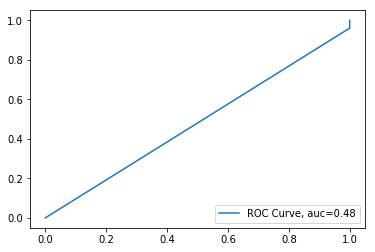

N_Neighbours:   9 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


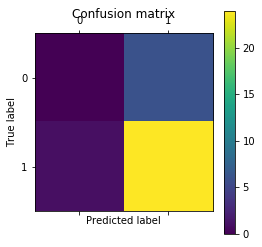

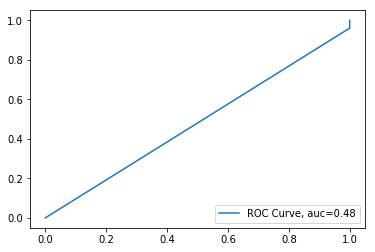

N_Neighbours:   9 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


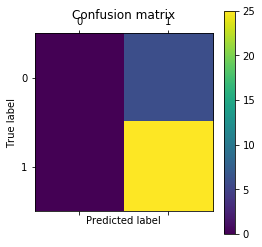

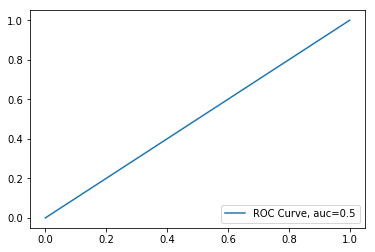

N_Neighbours:   9 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


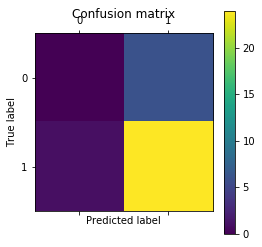

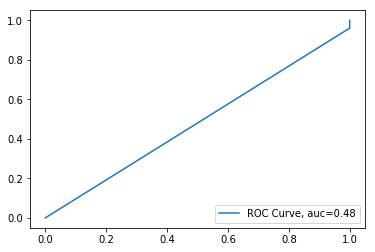

N_Neighbours:   9 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


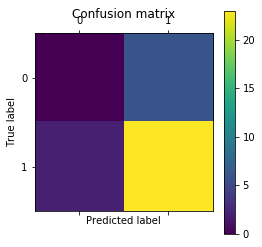

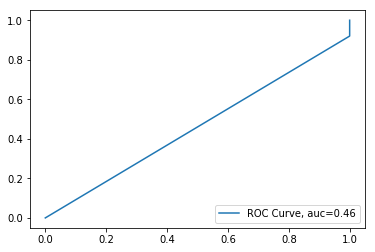

N_Neighbours:   9 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


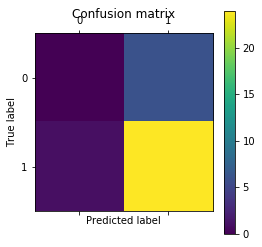

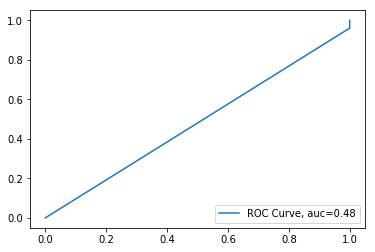

N_Neighbours:   9 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


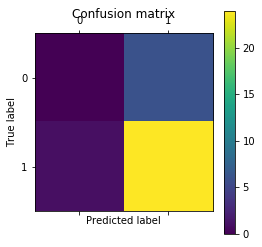

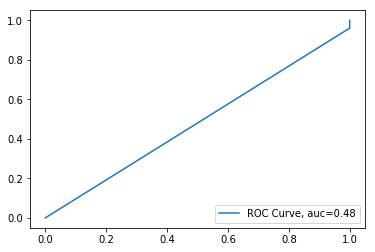

N_Neighbours:   9 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


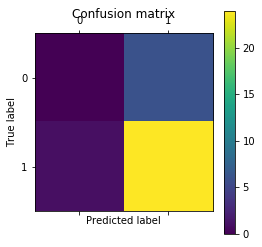

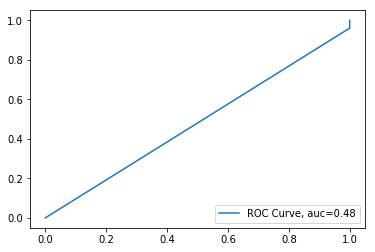

N_Neighbours:   9 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


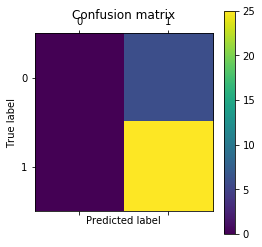

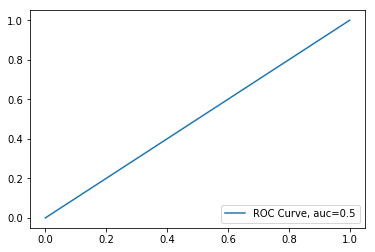

N_Neighbours:   9 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


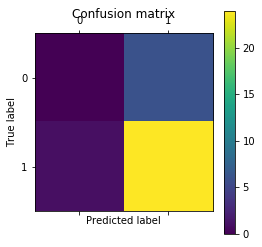

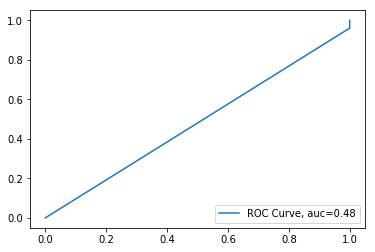

N_Neighbours:   9 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.79      0.92      0.85        25

avg / total       0.64      0.74      0.69        31

[[ 0  6]
 [ 2 23]]


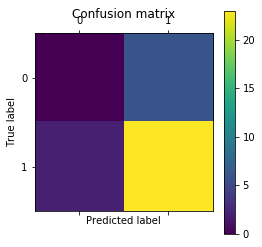

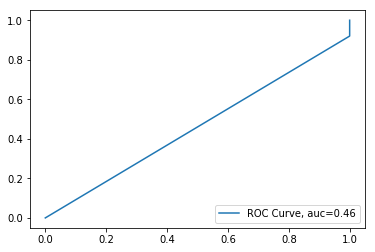

N_Neighbours:   9 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


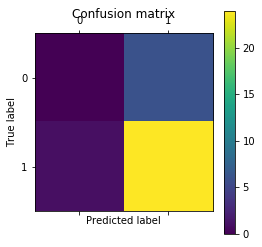

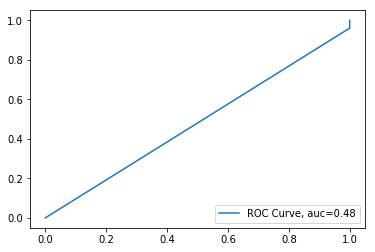

N_Neighbours:   9 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


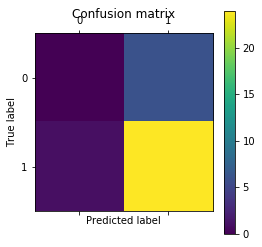

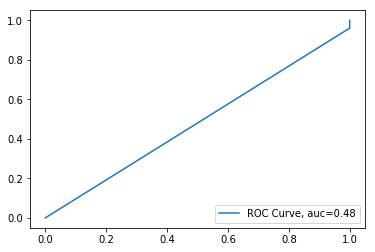

N_Neighbours:   9 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.80      0.96      0.87        25

avg / total       0.65      0.77      0.70        31

[[ 0  6]
 [ 1 24]]


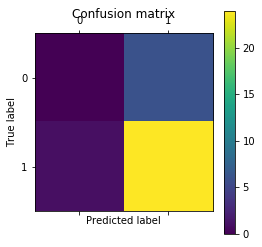

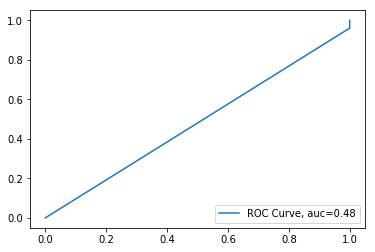

N_Neighbours:   9 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

[[ 0  6]
 [ 0 25]]


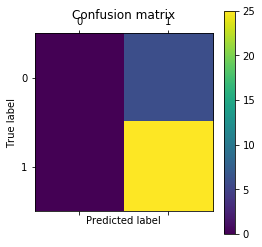

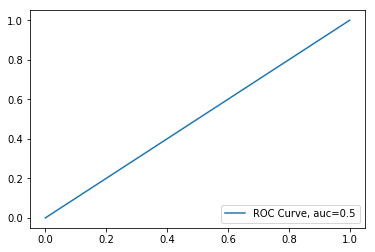

In [88]:
pp = [1,2,3] #power parameter
w= np.array(['uniform','distance']) #weight
alg = np.array(['auto','brute','ball_tree','kd_tree']) #algo
for i in range(1,10):
    for j in alg:
        for k in w:
            for power_param in pp:
                knn = KNeighborsClassifier(n_neighbors=i, algorithm=j, weights = k,p = power_param)
                knn.fit(X_train, y_train)
                y_pred = knn.predict(X_test)
                print("N_Neighbours:  ", i , ', Algo: ', j , ', weight: ', k, ', PowerParameter: ', power_param)
                print("Accuracy:",metrics.accuracy_score(y_test, y_pred))            
                print(classification_report(y_test, y_pred))   
                cm = confusion_matrix(y_test, y_pred)
                print(cm)
                plt.matshow(cm)
                plt.title('Confusion matrix')
                plt.colorbar()
                plt.ylabel('True label')
                plt.xlabel('Predicted label')
                plt.show()
                print('\n')

                #fpr, tpr, thresholds = roc_curve(hp_ytest, hp_ypred)
                #plt.plot(fpr, tpr, lw=1, alpha=0.3,label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
                fpr, tpr, thresholds = roc_curve(y_test, y_pred)
                auc = roc_auc_score(y_test, y_pred)
                plt.plot(fpr,tpr,label="ROC Curve, auc="+str(auc))
                plt.legend(loc=4)
                plt.show()

# StandardScaler and KNN:

In [78]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
x_trn_n=scaler.transform(X_train)
x_tst_n=scaler.transform(X_test)

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


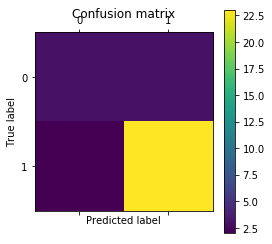

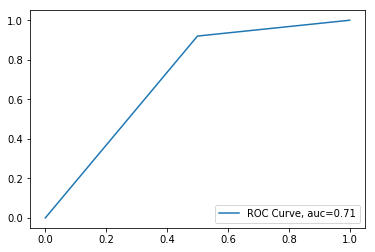

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


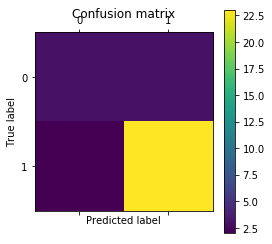

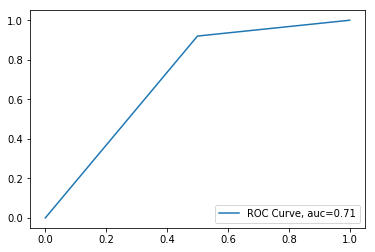

N_Neighbours:   1 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


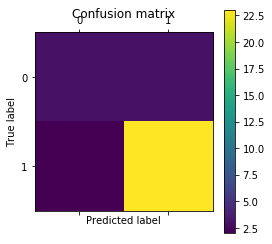

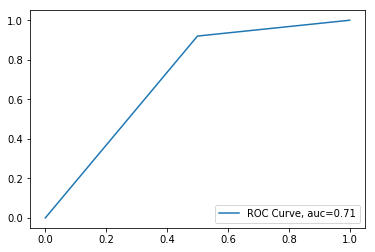

N_Neighbours:   1 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


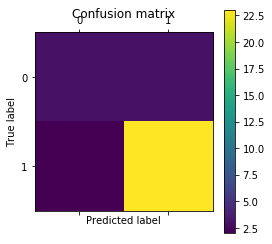

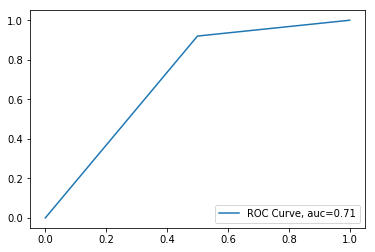

N_Neighbours:   1 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


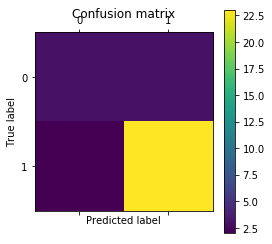

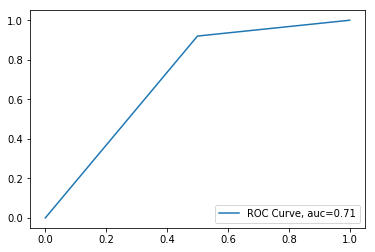

N_Neighbours:   1 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


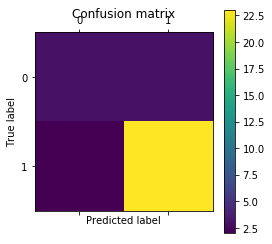

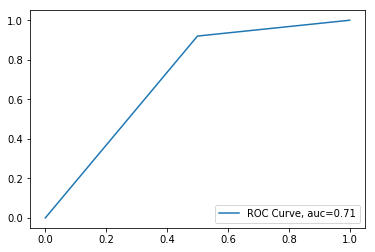

N_Neighbours:   1 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


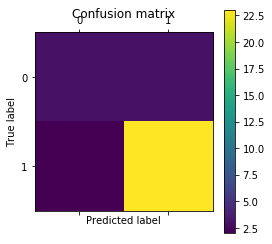

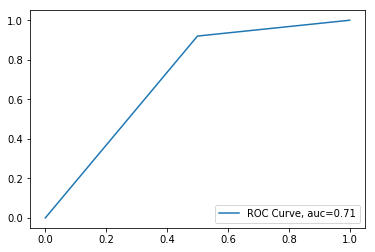

N_Neighbours:   1 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


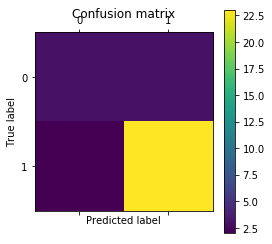

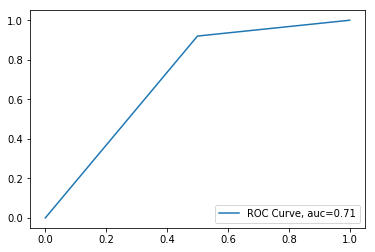

N_Neighbours:   1 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


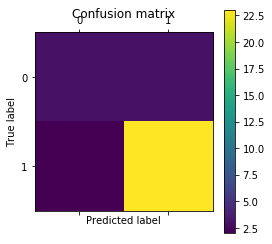

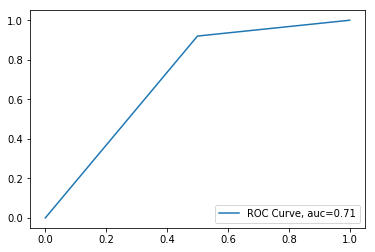

N_Neighbours:   1 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


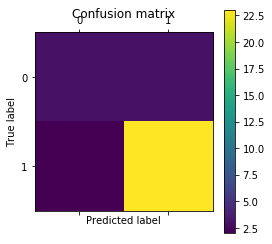

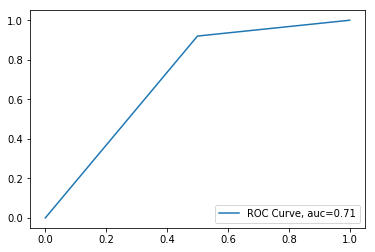

N_Neighbours:   1 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


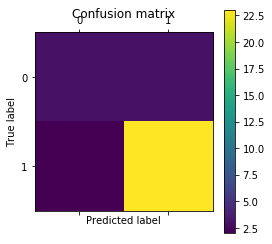

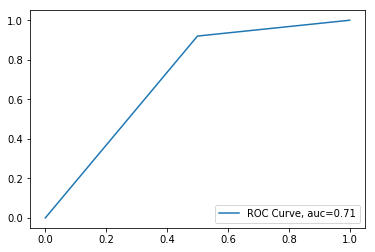

N_Neighbours:   1 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


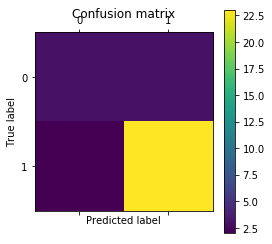

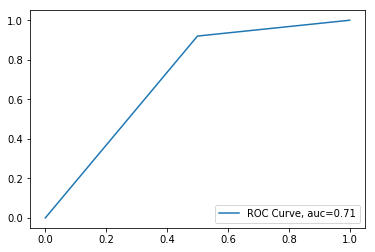

N_Neighbours:   1 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


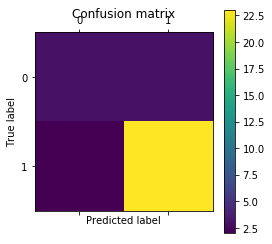

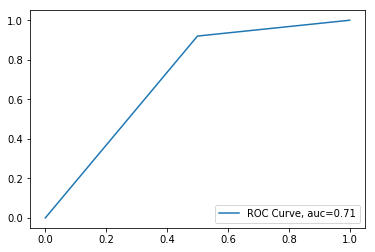

N_Neighbours:   1 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


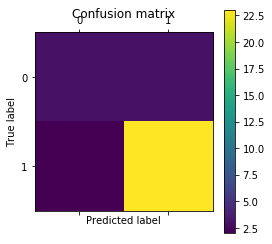

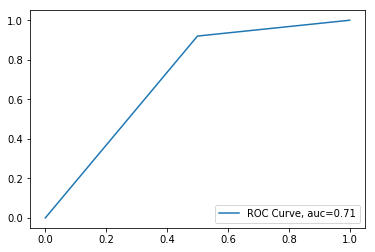

N_Neighbours:   1 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


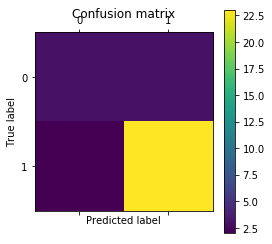

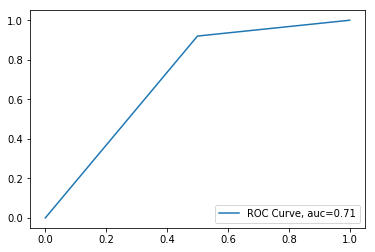

N_Neighbours:   1 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


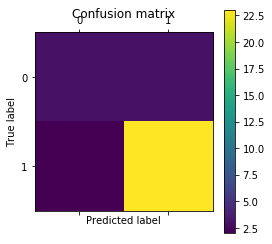

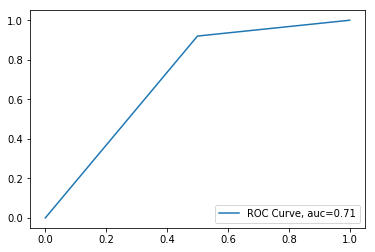

N_Neighbours:   1 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


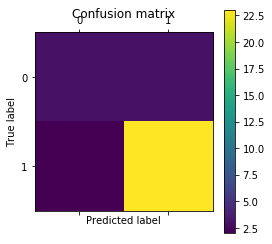

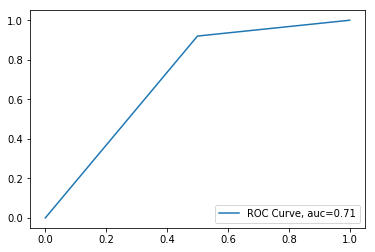

N_Neighbours:   1 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


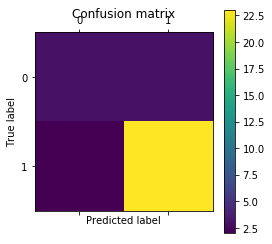

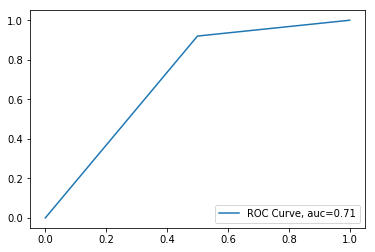

N_Neighbours:   1 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


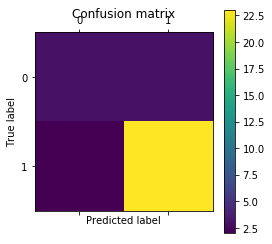

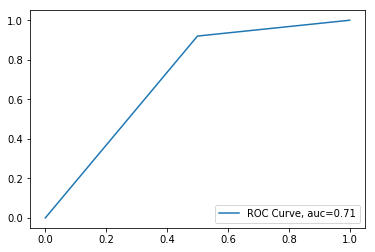

N_Neighbours:   1 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


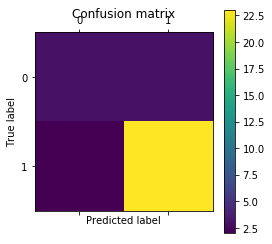

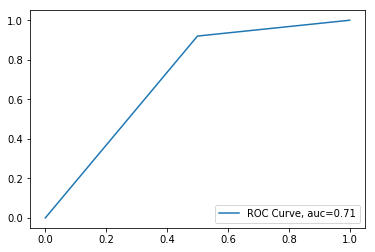

N_Neighbours:   1 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


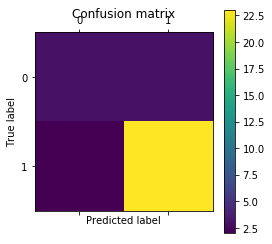

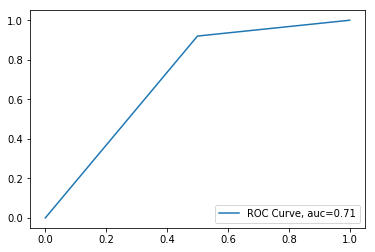

N_Neighbours:   1 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


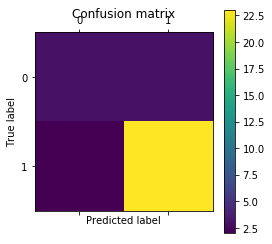

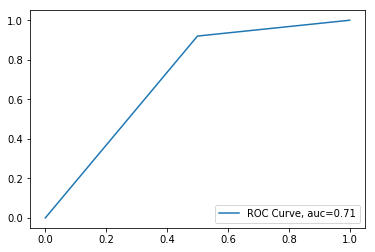

N_Neighbours:   1 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


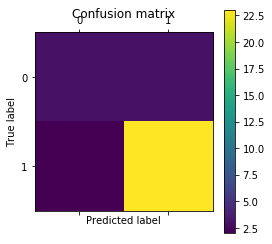

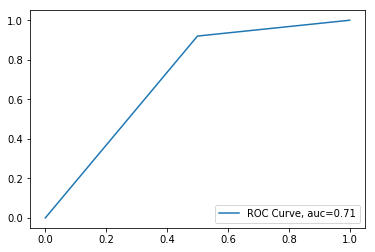

N_Neighbours:   1 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


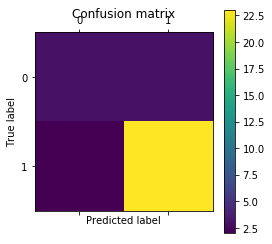

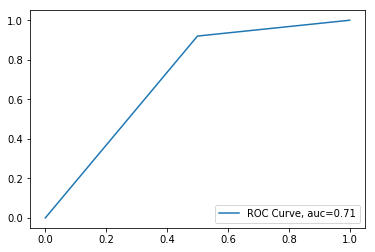

N_Neighbours:   2 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.40      0.67      0.50         6
          1       0.90      0.76      0.83        25

avg / total       0.81      0.74      0.76        31

[[ 4  2]
 [ 6 19]]


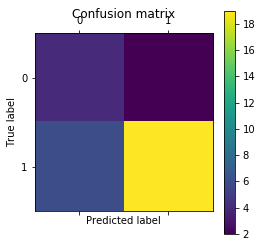

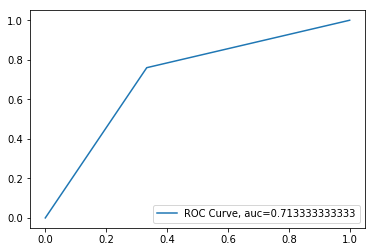

N_Neighbours:   2 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.44      0.67      0.53         6
          1       0.91      0.80      0.85        25

avg / total       0.82      0.77      0.79        31

[[ 4  2]
 [ 5 20]]


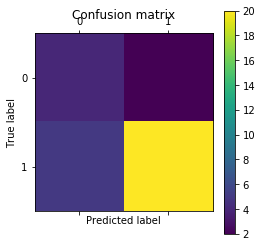

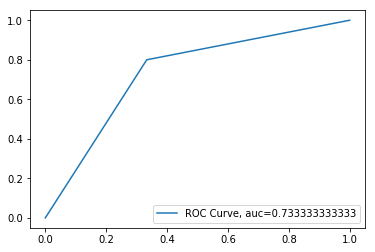

N_Neighbours:   2 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.57      0.67      0.62         6
          1       0.92      0.88      0.90        25

avg / total       0.85      0.84      0.84        31

[[ 4  2]
 [ 3 22]]


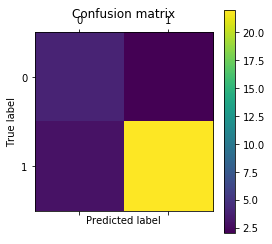

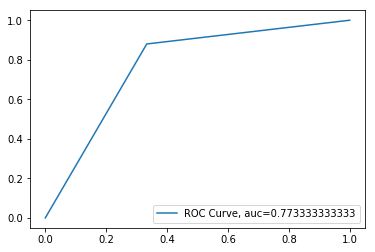

N_Neighbours:   2 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


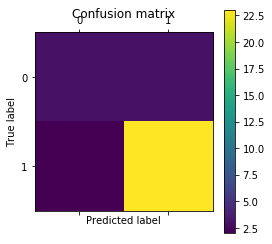

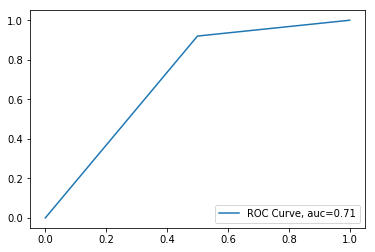

N_Neighbours:   2 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


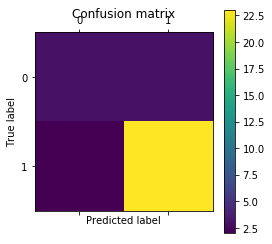

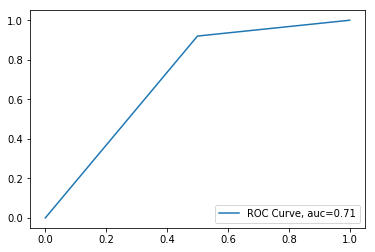

N_Neighbours:   2 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


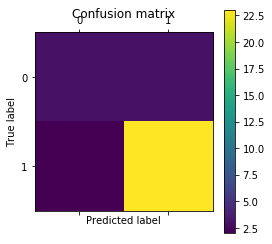

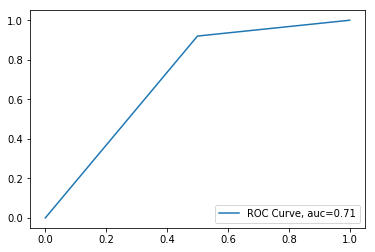

N_Neighbours:   2 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.40      0.67      0.50         6
          1       0.90      0.76      0.83        25

avg / total       0.81      0.74      0.76        31

[[ 4  2]
 [ 6 19]]


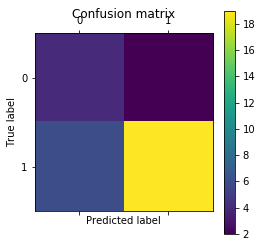

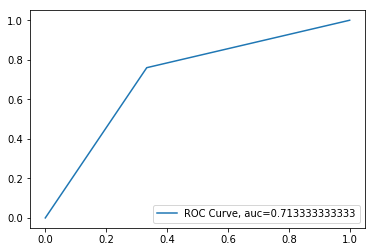

N_Neighbours:   2 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.44      0.67      0.53         6
          1       0.91      0.80      0.85        25

avg / total       0.82      0.77      0.79        31

[[ 4  2]
 [ 5 20]]


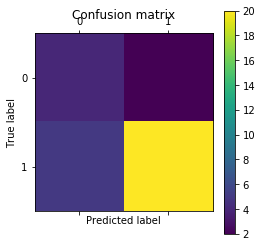

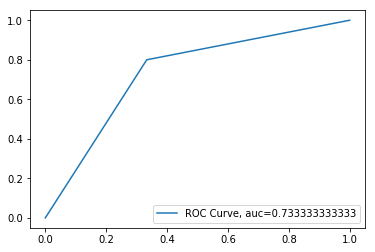

N_Neighbours:   2 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.57      0.67      0.62         6
          1       0.92      0.88      0.90        25

avg / total       0.85      0.84      0.84        31

[[ 4  2]
 [ 3 22]]


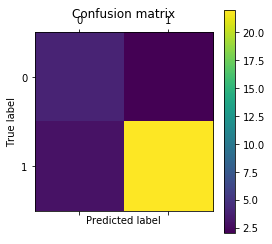

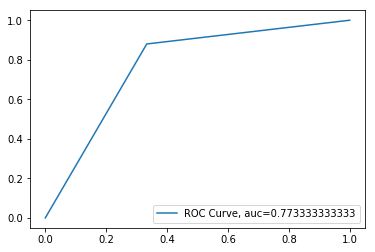

N_Neighbours:   2 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


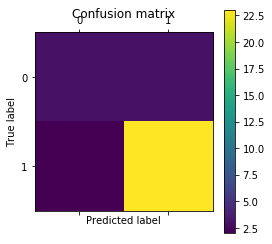

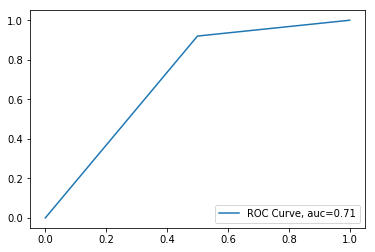

N_Neighbours:   2 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


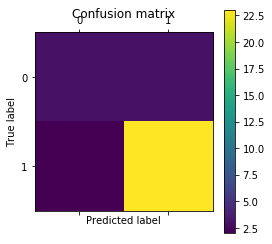

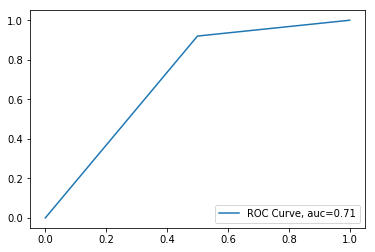

N_Neighbours:   2 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


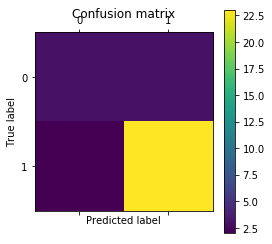

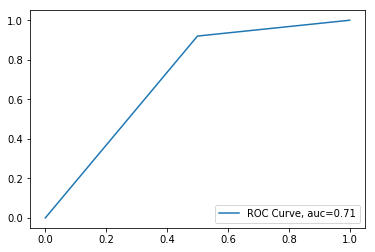

N_Neighbours:   2 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.40      0.67      0.50         6
          1       0.90      0.76      0.83        25

avg / total       0.81      0.74      0.76        31

[[ 4  2]
 [ 6 19]]


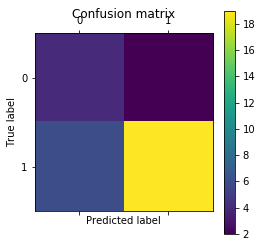

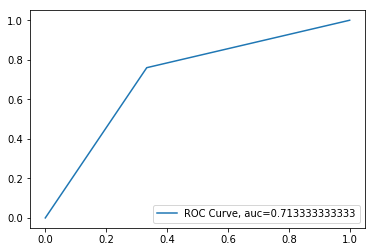

N_Neighbours:   2 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.44      0.67      0.53         6
          1       0.91      0.80      0.85        25

avg / total       0.82      0.77      0.79        31

[[ 4  2]
 [ 5 20]]


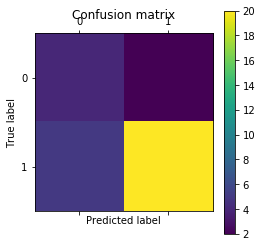

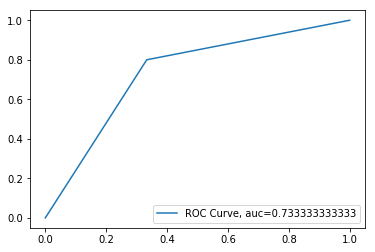

N_Neighbours:   2 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.57      0.67      0.62         6
          1       0.92      0.88      0.90        25

avg / total       0.85      0.84      0.84        31

[[ 4  2]
 [ 3 22]]


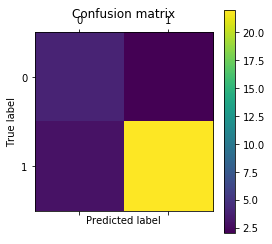

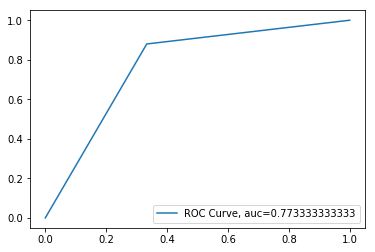

N_Neighbours:   2 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


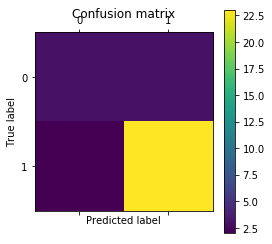

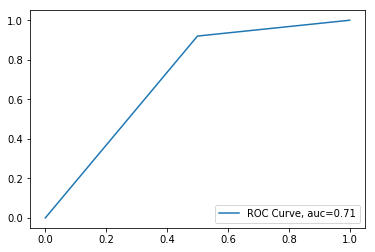

N_Neighbours:   2 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


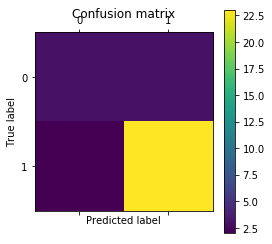

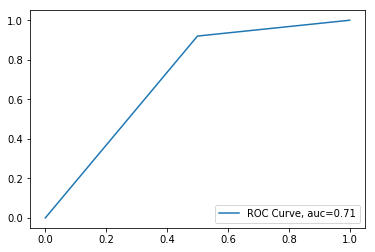

N_Neighbours:   2 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


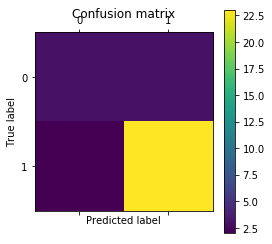

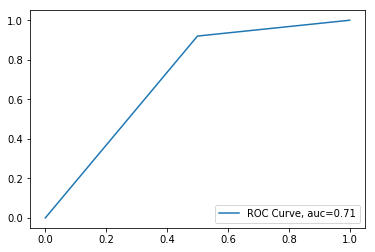

N_Neighbours:   2 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.741935483871
             precision    recall  f1-score   support

          0       0.40      0.67      0.50         6
          1       0.90      0.76      0.83        25

avg / total       0.81      0.74      0.76        31

[[ 4  2]
 [ 6 19]]


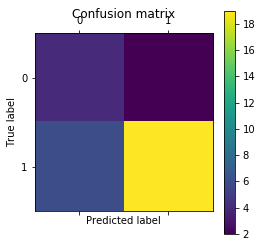

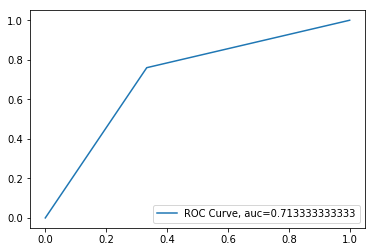

N_Neighbours:   2 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.774193548387
             precision    recall  f1-score   support

          0       0.44      0.67      0.53         6
          1       0.91      0.80      0.85        25

avg / total       0.82      0.77      0.79        31

[[ 4  2]
 [ 5 20]]


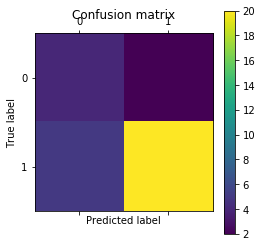

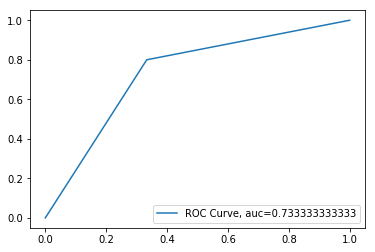

N_Neighbours:   2 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.57      0.67      0.62         6
          1       0.92      0.88      0.90        25

avg / total       0.85      0.84      0.84        31

[[ 4  2]
 [ 3 22]]


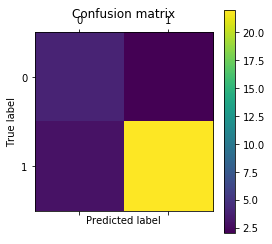

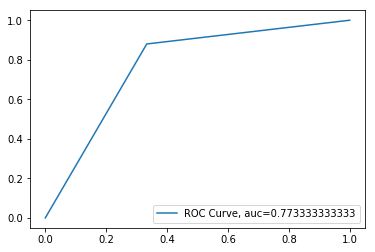

N_Neighbours:   2 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


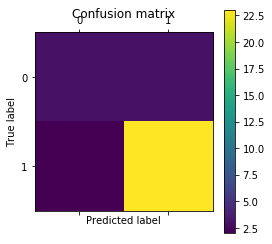

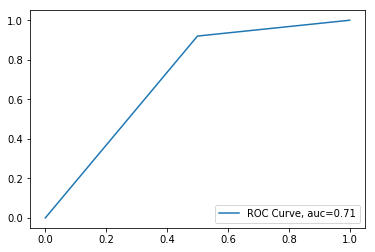

N_Neighbours:   2 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


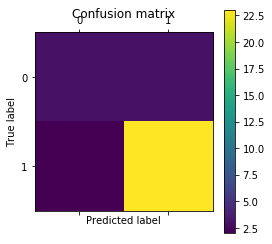

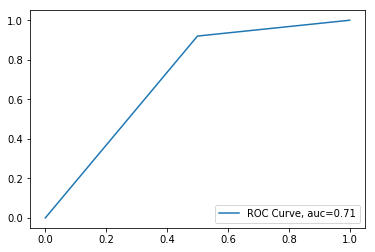

N_Neighbours:   2 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


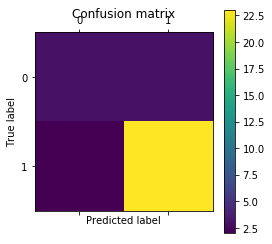

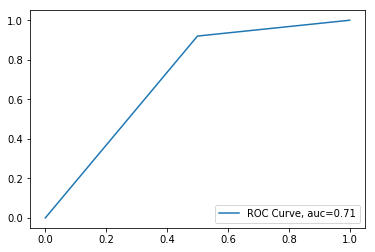

N_Neighbours:   3 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


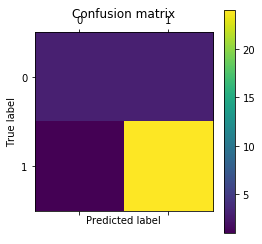

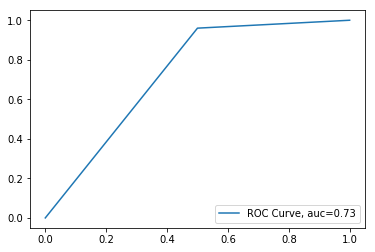

N_Neighbours:   3 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


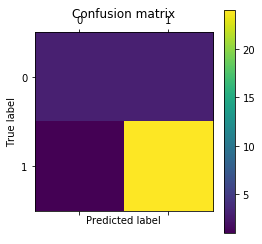

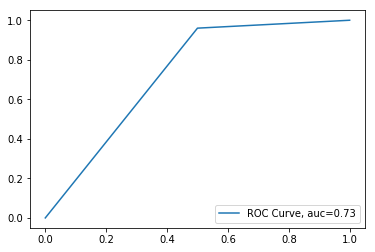

N_Neighbours:   3 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


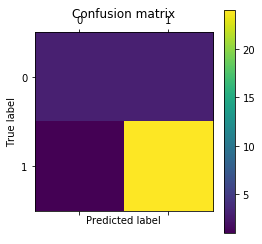

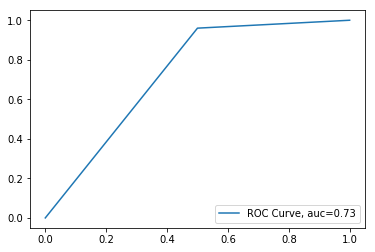

N_Neighbours:   3 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


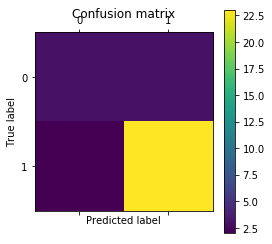

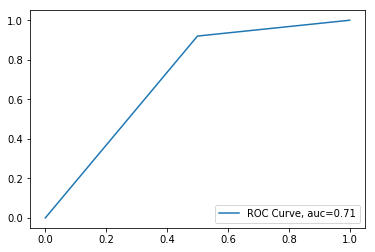

N_Neighbours:   3 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


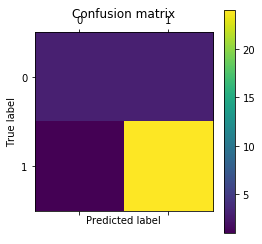

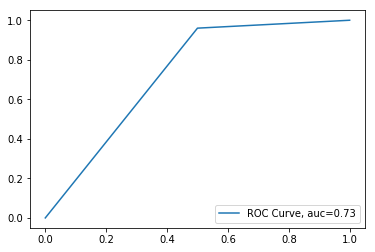

N_Neighbours:   3 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


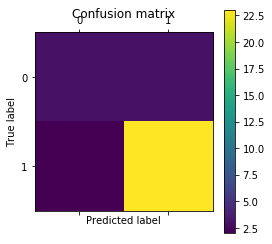

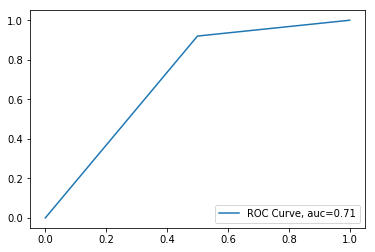

N_Neighbours:   3 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


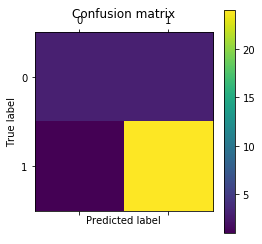

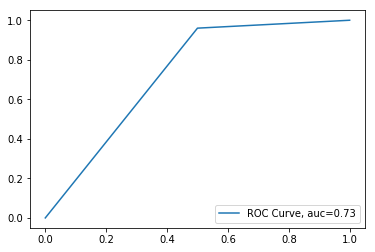

N_Neighbours:   3 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


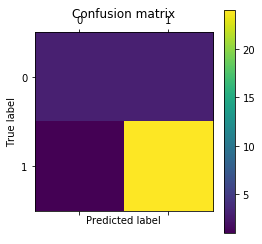

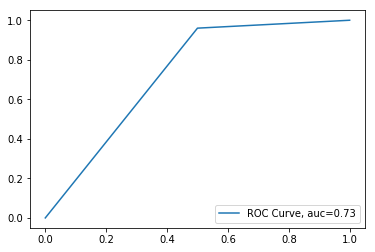

N_Neighbours:   3 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


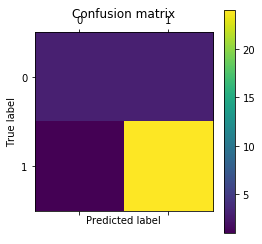

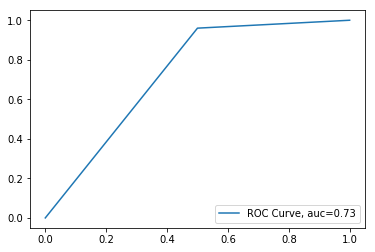

N_Neighbours:   3 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


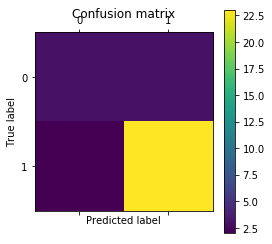

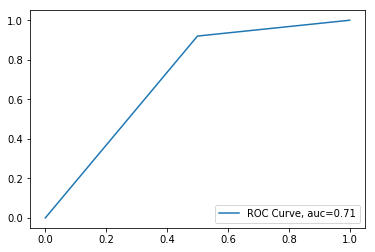

N_Neighbours:   3 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


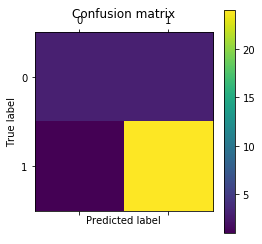

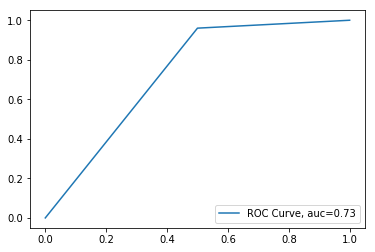

N_Neighbours:   3 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


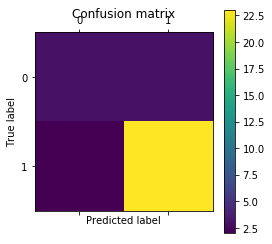

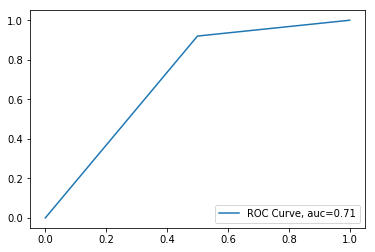

N_Neighbours:   3 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


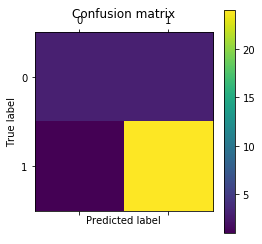

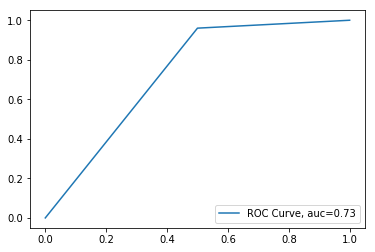

N_Neighbours:   3 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


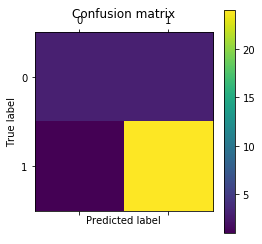

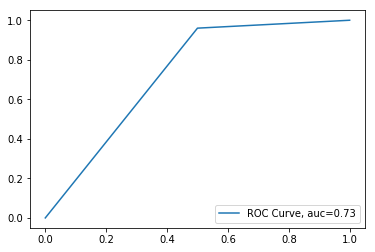

N_Neighbours:   3 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


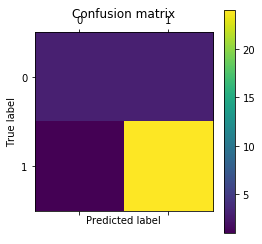

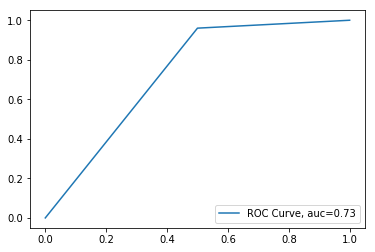

N_Neighbours:   3 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


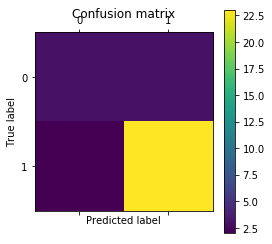

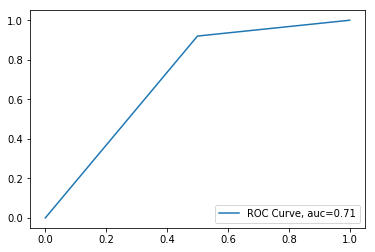

N_Neighbours:   3 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


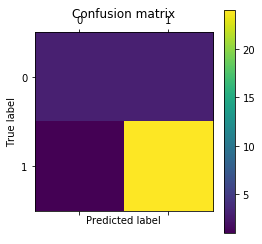

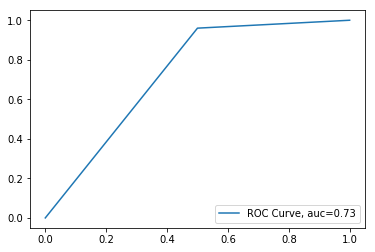

N_Neighbours:   3 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


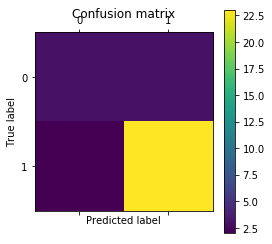

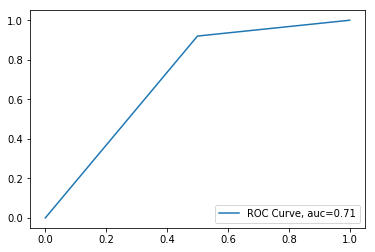

N_Neighbours:   3 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


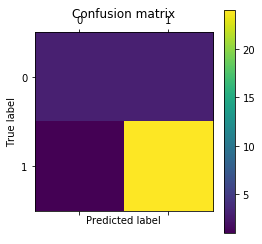

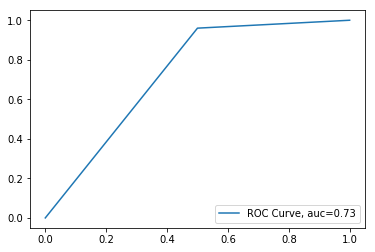

N_Neighbours:   3 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


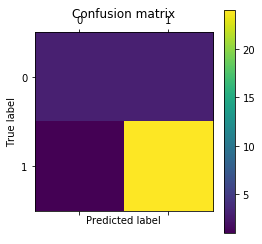

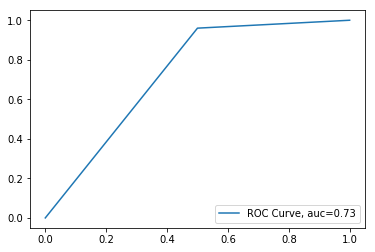

N_Neighbours:   3 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


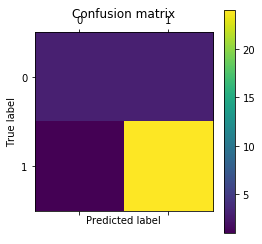

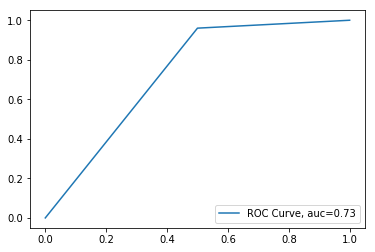

N_Neighbours:   3 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


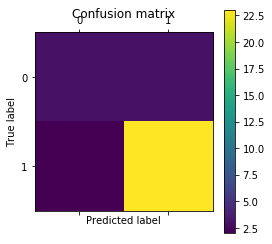

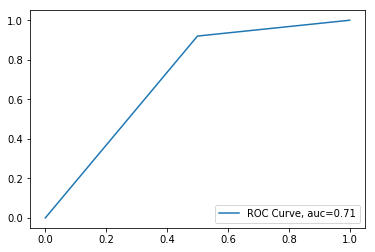

N_Neighbours:   3 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


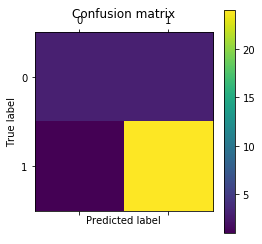

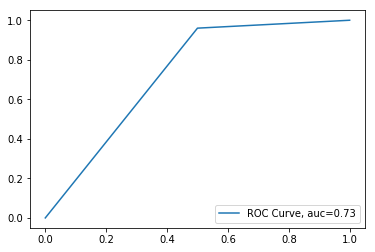

N_Neighbours:   3 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


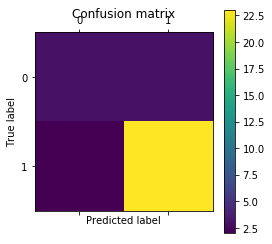

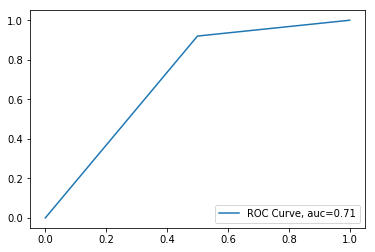

N_Neighbours:   4 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


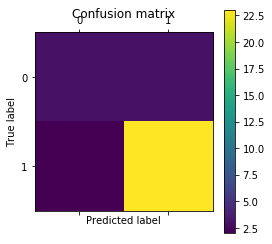

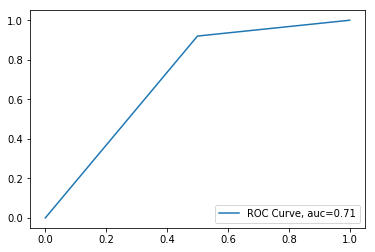

N_Neighbours:   4 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


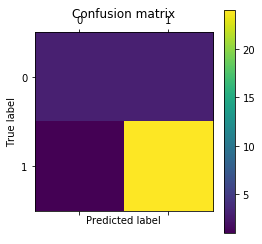

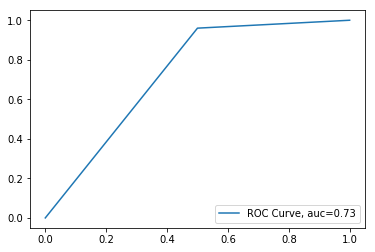

N_Neighbours:   4 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


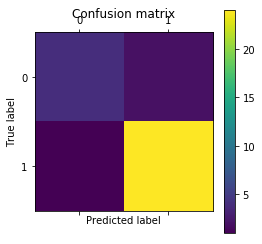

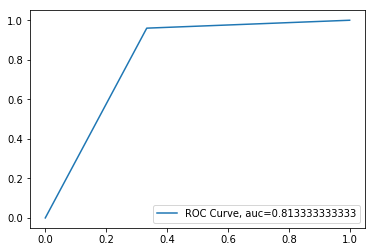

N_Neighbours:   4 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


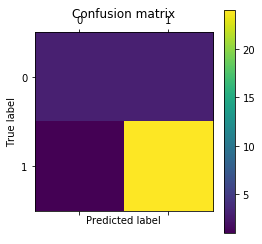

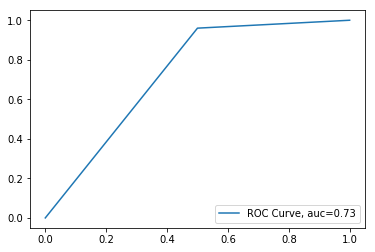

N_Neighbours:   4 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


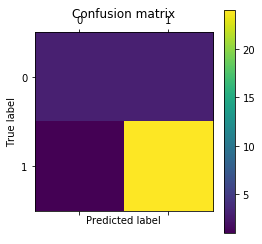

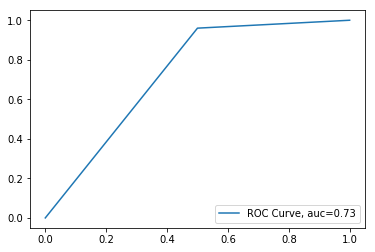

N_Neighbours:   4 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


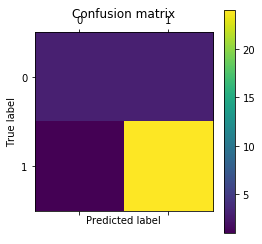

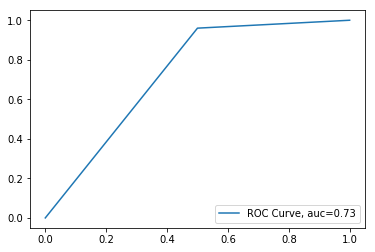

N_Neighbours:   4 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


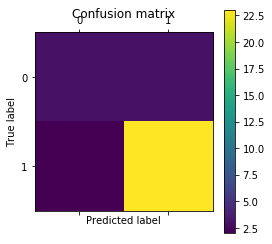

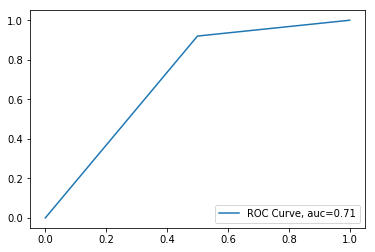

N_Neighbours:   4 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


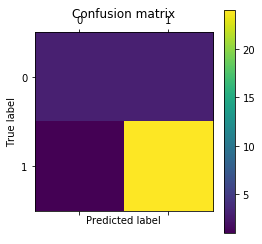

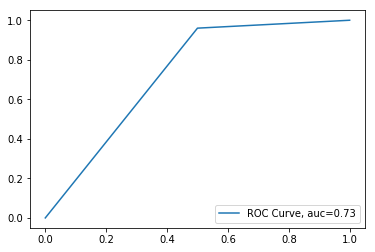

N_Neighbours:   4 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


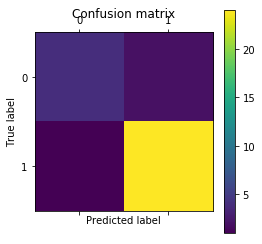

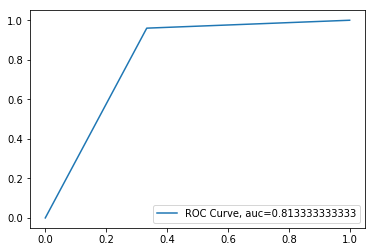

N_Neighbours:   4 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


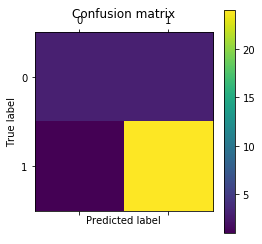

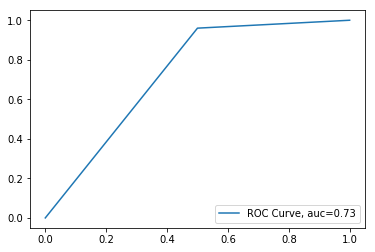

N_Neighbours:   4 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


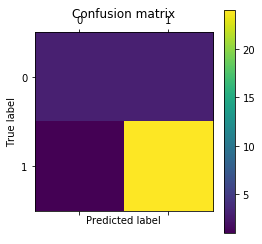

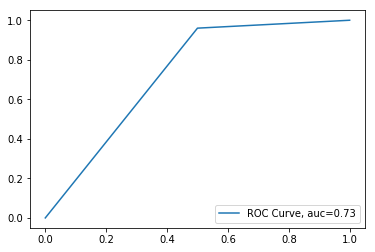

N_Neighbours:   4 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


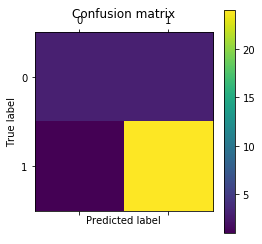

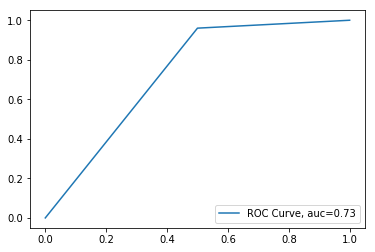

N_Neighbours:   4 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


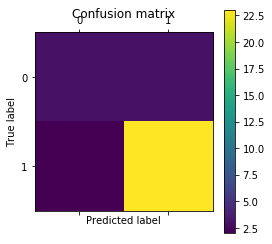

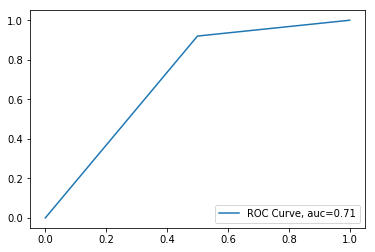

N_Neighbours:   4 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


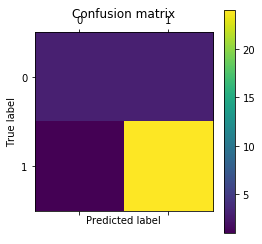

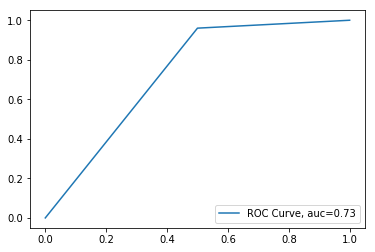

N_Neighbours:   4 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


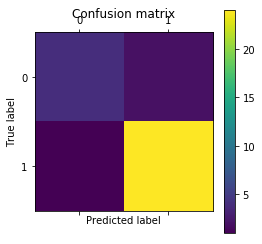

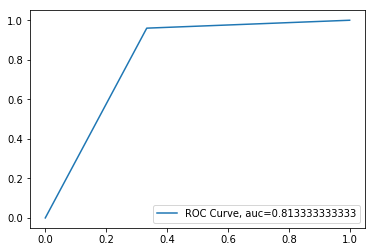

N_Neighbours:   4 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


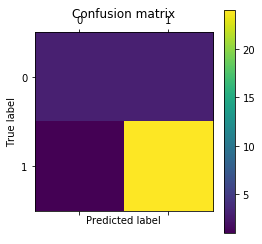

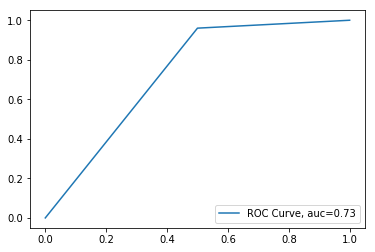

N_Neighbours:   4 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


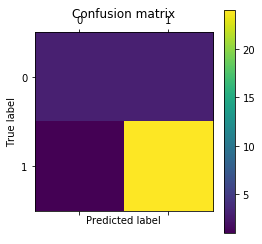

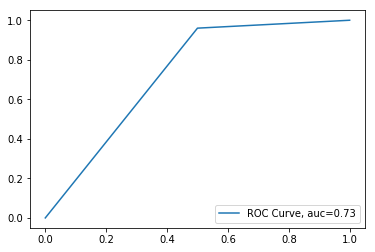

N_Neighbours:   4 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


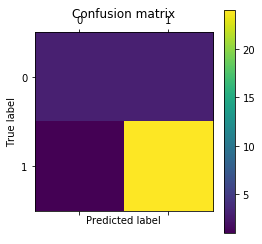

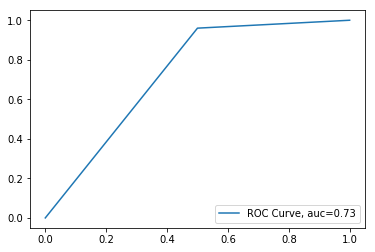

N_Neighbours:   4 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


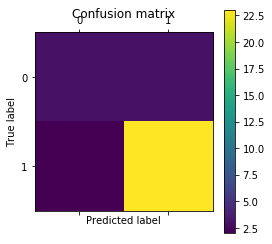

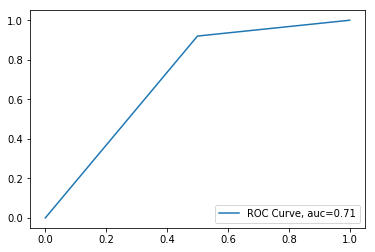

N_Neighbours:   4 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


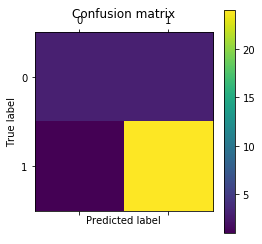

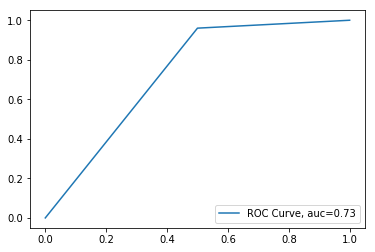

N_Neighbours:   4 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


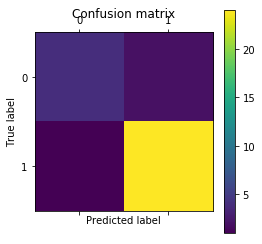

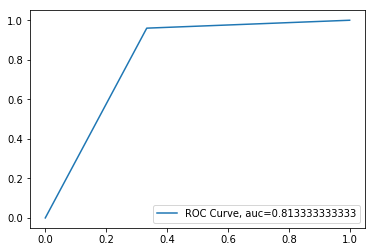

N_Neighbours:   4 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


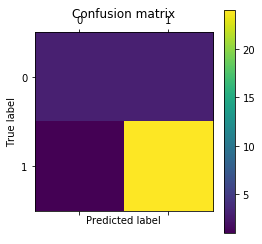

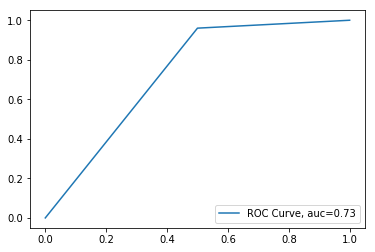

N_Neighbours:   4 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


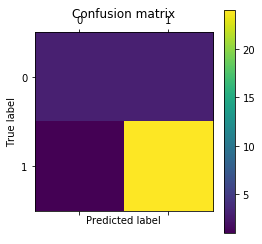

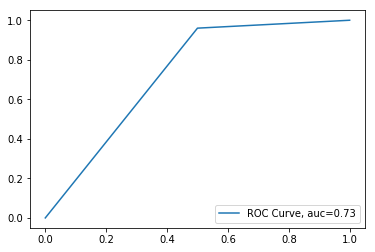

N_Neighbours:   4 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


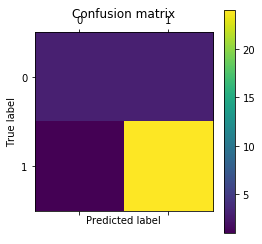

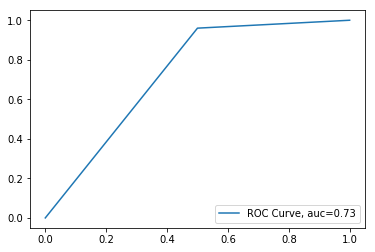

N_Neighbours:   5 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


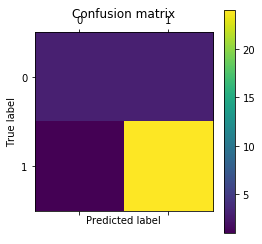

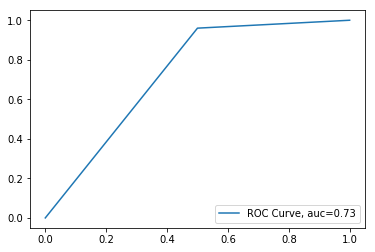

N_Neighbours:   5 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


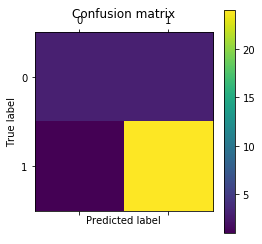

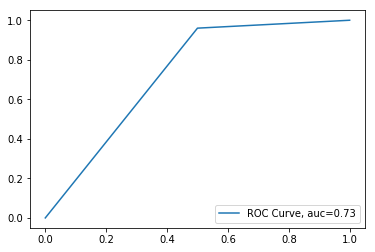

N_Neighbours:   5 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


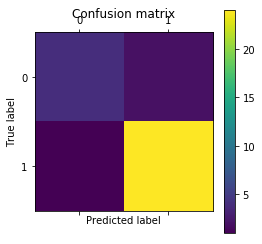

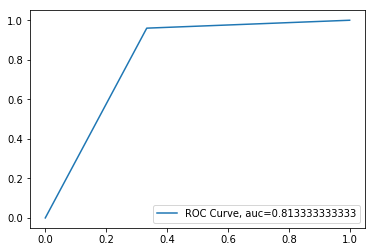

N_Neighbours:   5 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


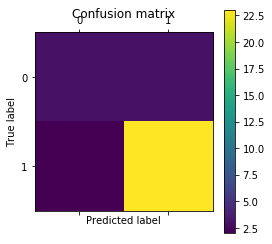

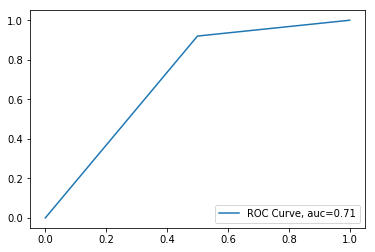

N_Neighbours:   5 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


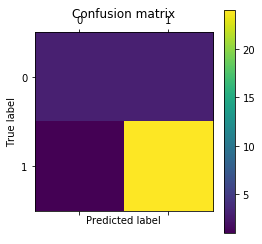

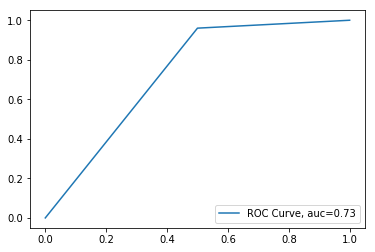

N_Neighbours:   5 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


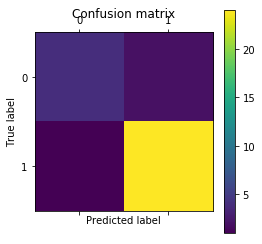

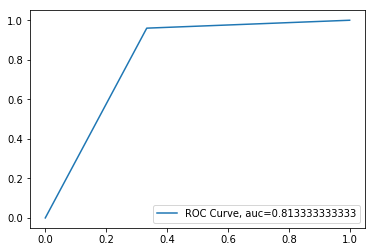

N_Neighbours:   5 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


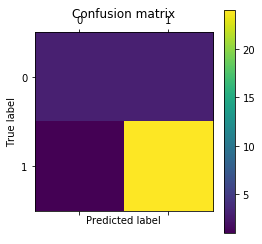

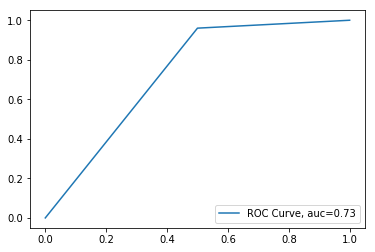

N_Neighbours:   5 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


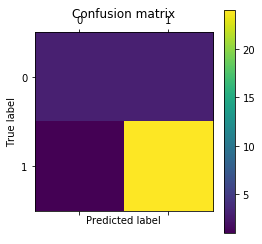

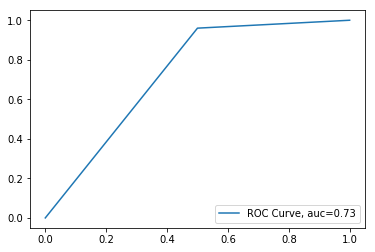

N_Neighbours:   5 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


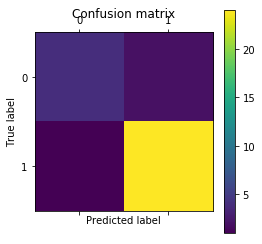

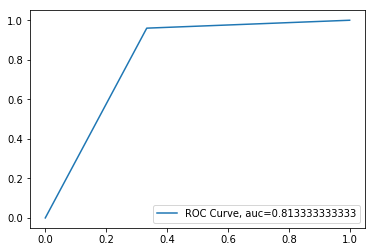

N_Neighbours:   5 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


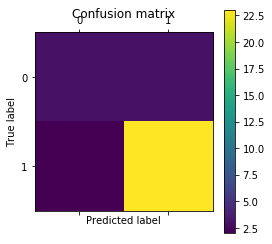

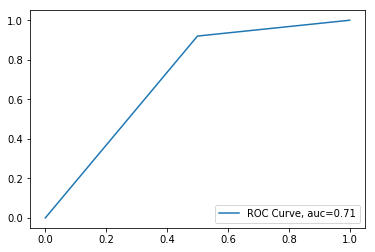

N_Neighbours:   5 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


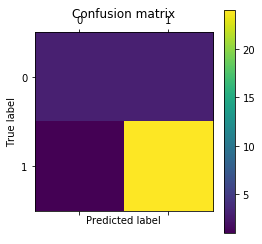

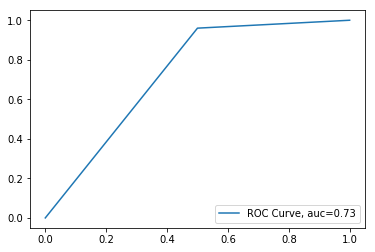

N_Neighbours:   5 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


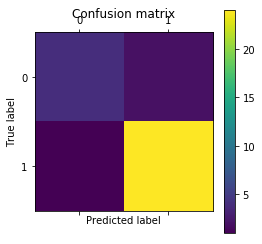

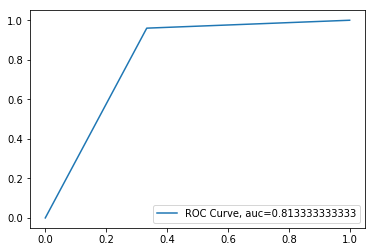

N_Neighbours:   5 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


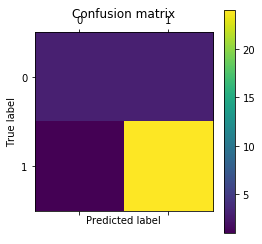

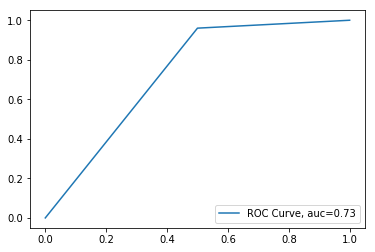

N_Neighbours:   5 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


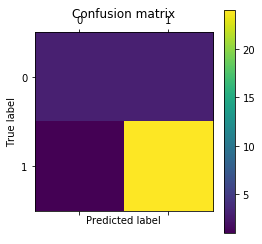

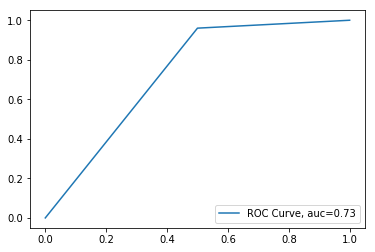

N_Neighbours:   5 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


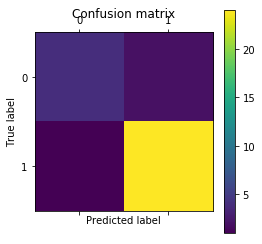

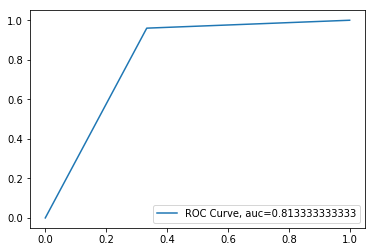

N_Neighbours:   5 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


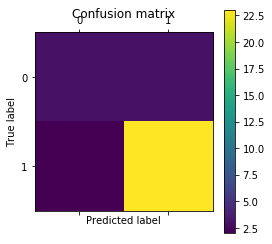

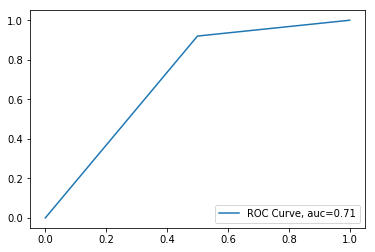

N_Neighbours:   5 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


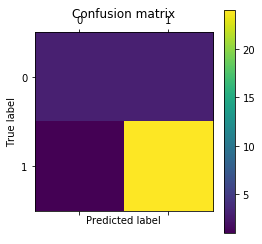

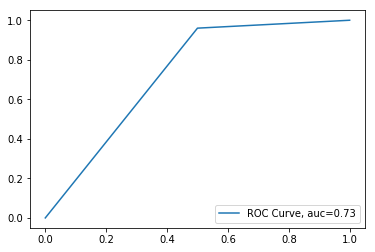

N_Neighbours:   5 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


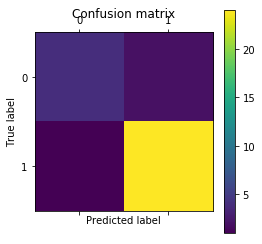

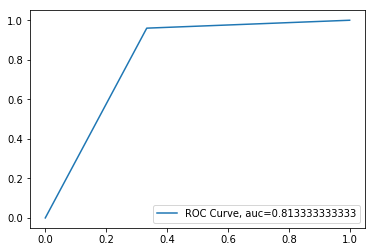

N_Neighbours:   5 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


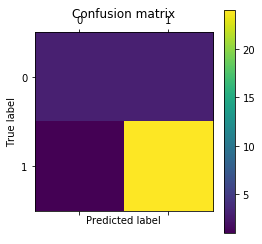

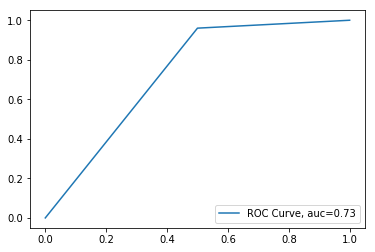

N_Neighbours:   5 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


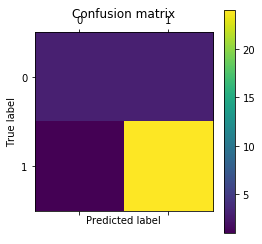

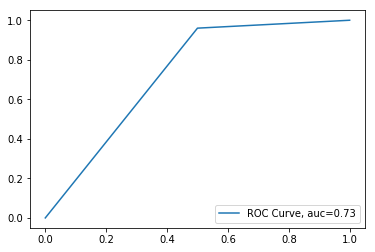

N_Neighbours:   5 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


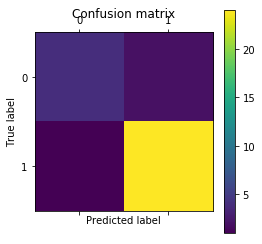

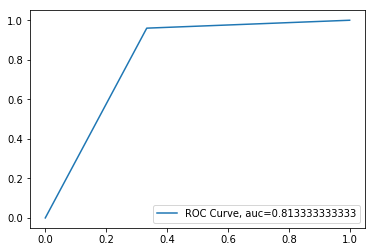

N_Neighbours:   5 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.60      0.50      0.55         6
          1       0.88      0.92      0.90        25

avg / total       0.83      0.84      0.83        31

[[ 3  3]
 [ 2 23]]


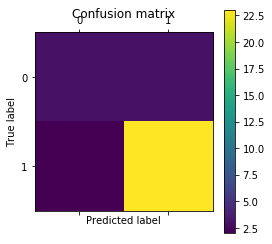

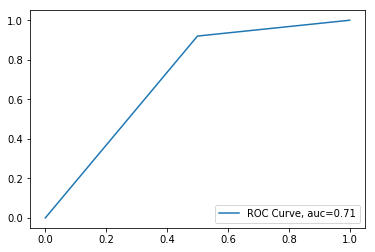

N_Neighbours:   5 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


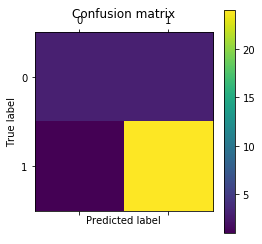

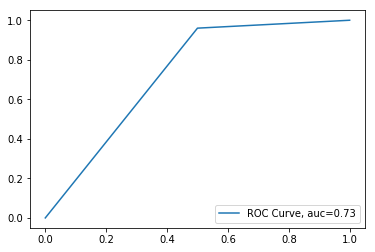

N_Neighbours:   5 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


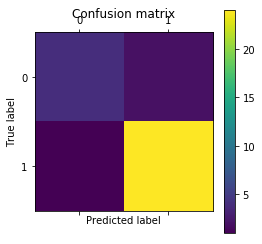

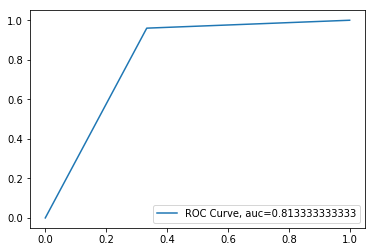

N_Neighbours:   6 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


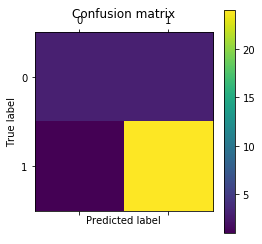

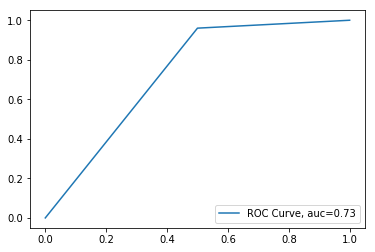

N_Neighbours:   6 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


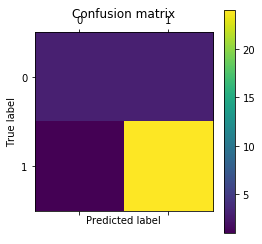

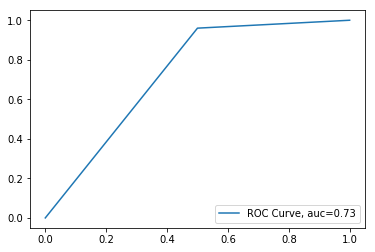

N_Neighbours:   6 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


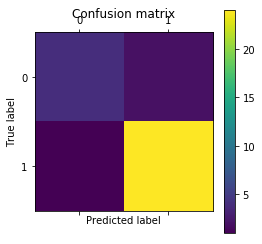

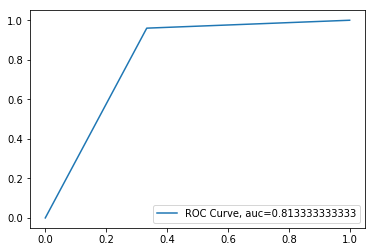

N_Neighbours:   6 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


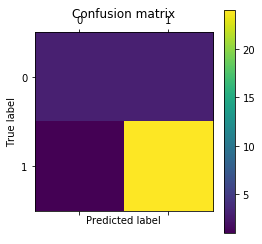

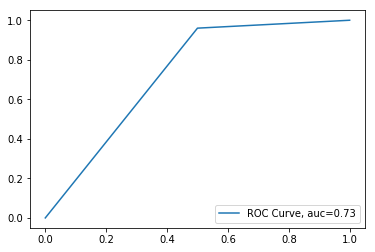

N_Neighbours:   6 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


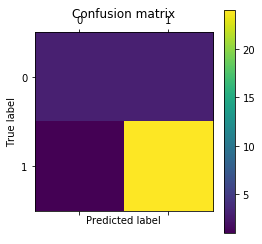

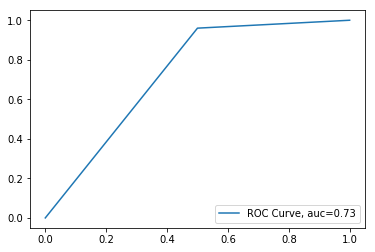

N_Neighbours:   6 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


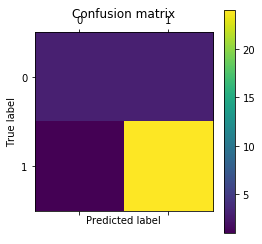

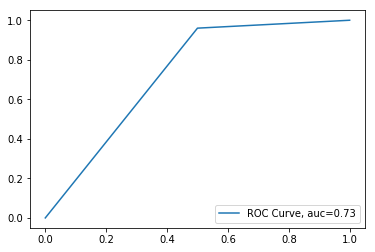

N_Neighbours:   6 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


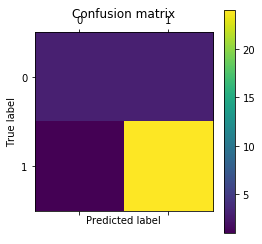

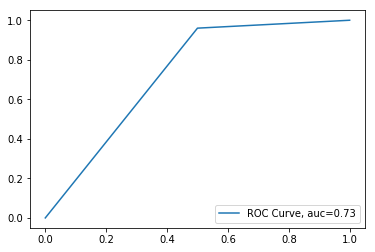

N_Neighbours:   6 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


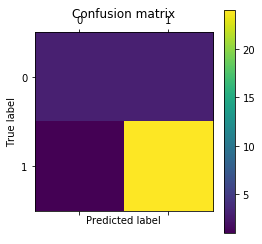

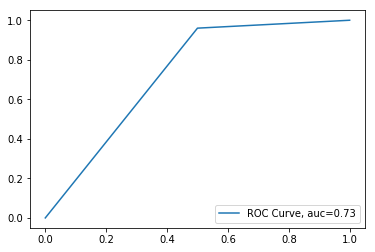

N_Neighbours:   6 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


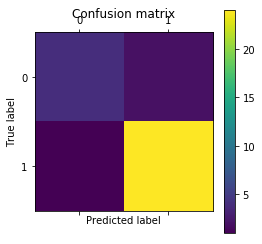

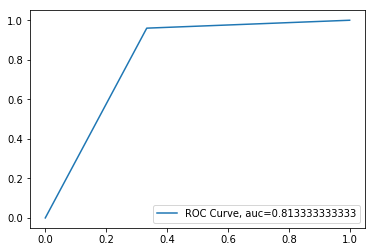

N_Neighbours:   6 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


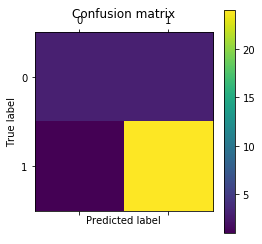

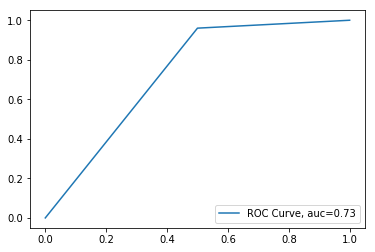

N_Neighbours:   6 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


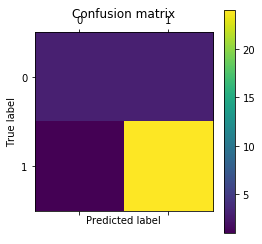

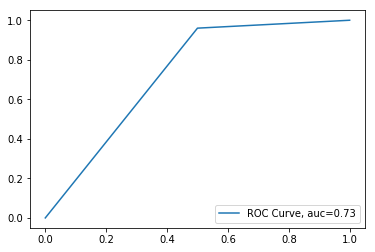

N_Neighbours:   6 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


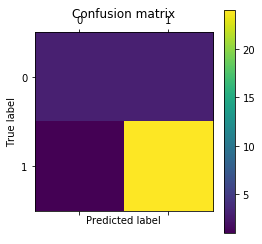

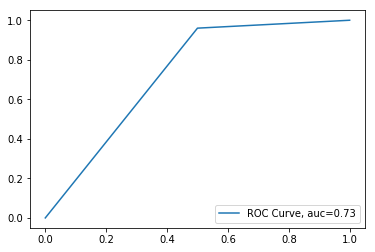

N_Neighbours:   6 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


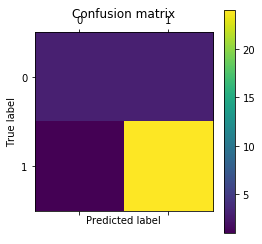

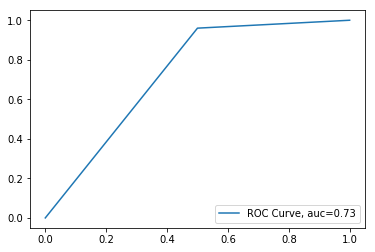

N_Neighbours:   6 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


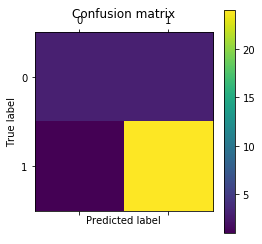

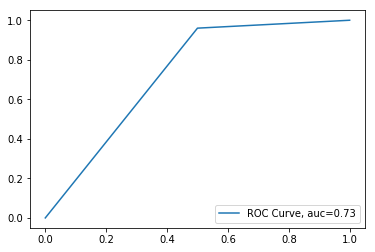

N_Neighbours:   6 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


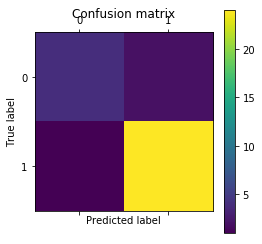

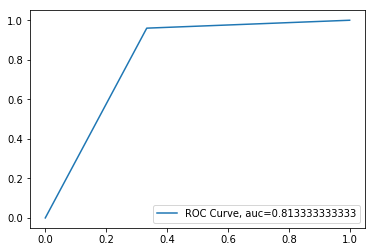

N_Neighbours:   6 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


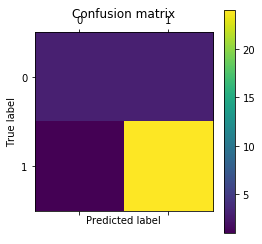

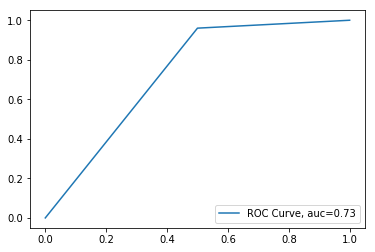

N_Neighbours:   6 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


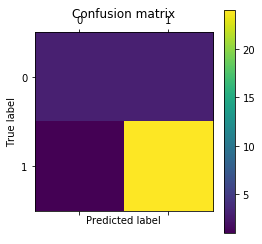

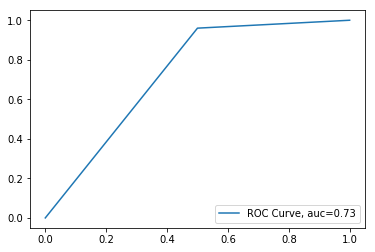

N_Neighbours:   6 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


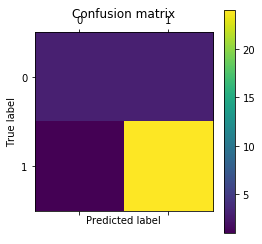

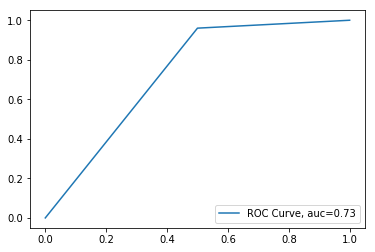

N_Neighbours:   6 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


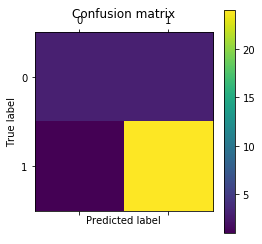

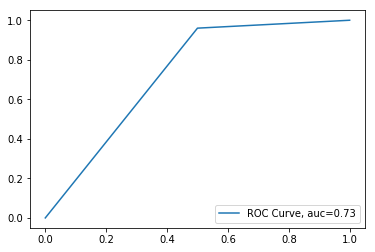

N_Neighbours:   6 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


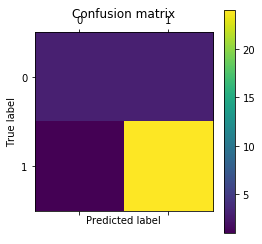

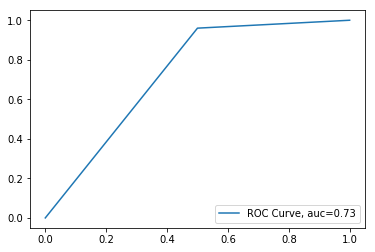

N_Neighbours:   6 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


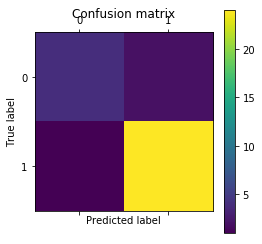

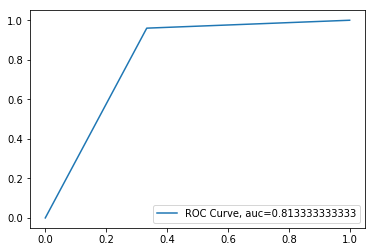

N_Neighbours:   6 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


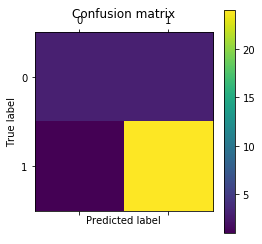

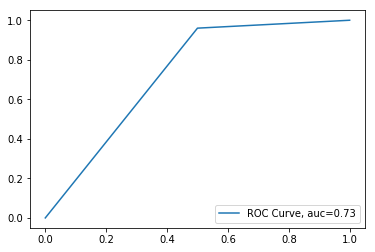

N_Neighbours:   6 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


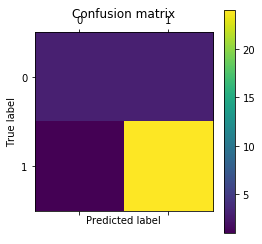

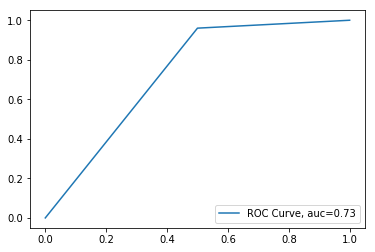

N_Neighbours:   6 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


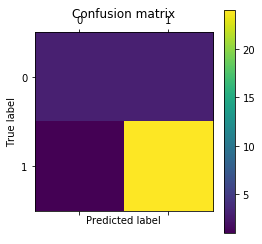

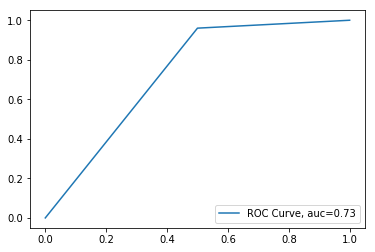

N_Neighbours:   7 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


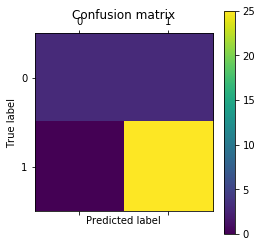

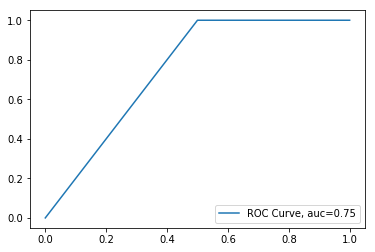

N_Neighbours:   7 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


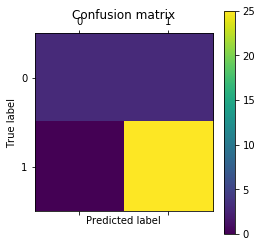

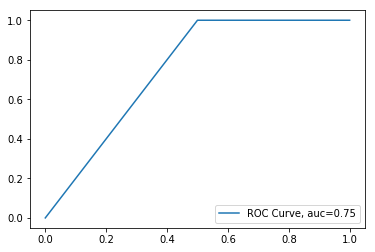

N_Neighbours:   7 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.67      0.33      0.44         6
          1       0.86      0.96      0.91        25

avg / total       0.82      0.84      0.82        31

[[ 2  4]
 [ 1 24]]


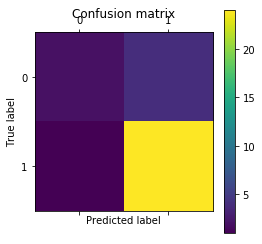

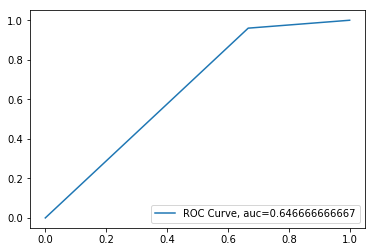

N_Neighbours:   7 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


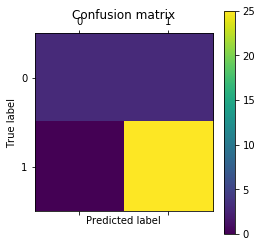

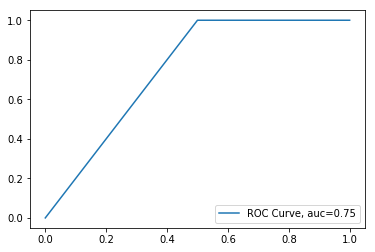

N_Neighbours:   7 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


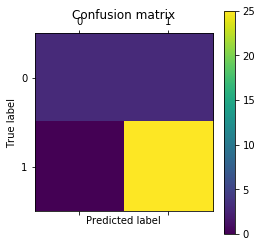

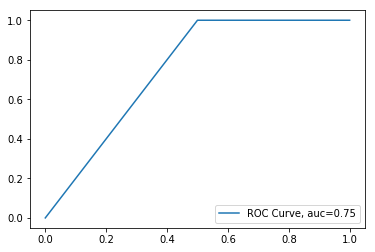

N_Neighbours:   7 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.67      0.33      0.44         6
          1       0.86      0.96      0.91        25

avg / total       0.82      0.84      0.82        31

[[ 2  4]
 [ 1 24]]


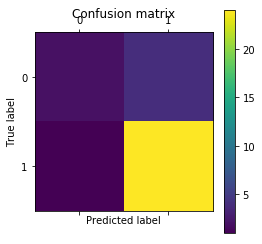

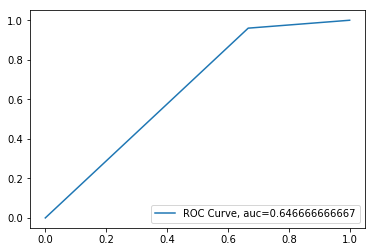

N_Neighbours:   7 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


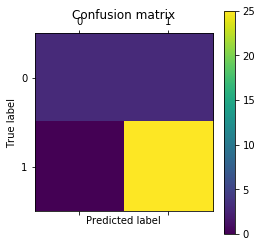

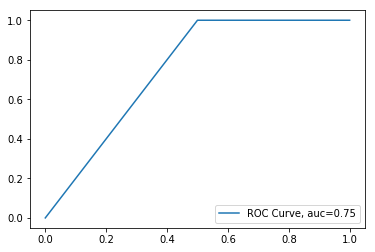

N_Neighbours:   7 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


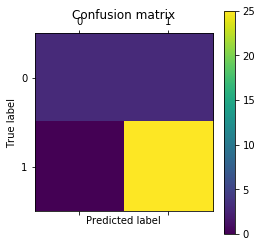

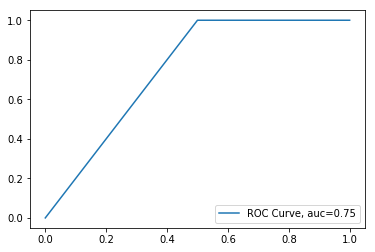

N_Neighbours:   7 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.67      0.33      0.44         6
          1       0.86      0.96      0.91        25

avg / total       0.82      0.84      0.82        31

[[ 2  4]
 [ 1 24]]


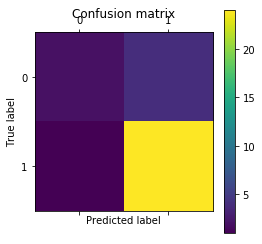

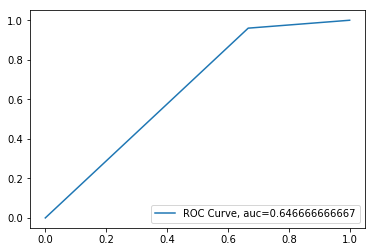

N_Neighbours:   7 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


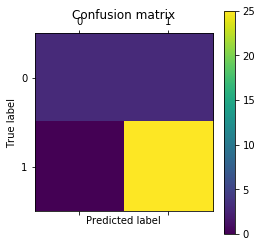

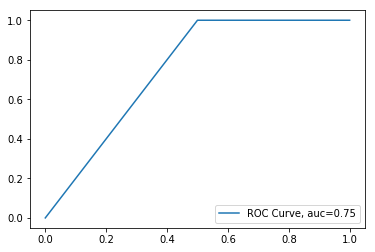

N_Neighbours:   7 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


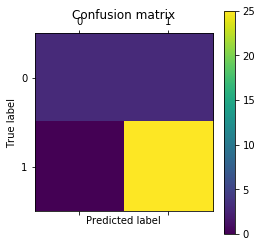

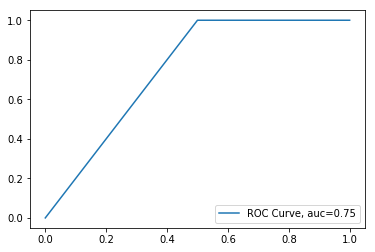

N_Neighbours:   7 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.67      0.33      0.44         6
          1       0.86      0.96      0.91        25

avg / total       0.82      0.84      0.82        31

[[ 2  4]
 [ 1 24]]


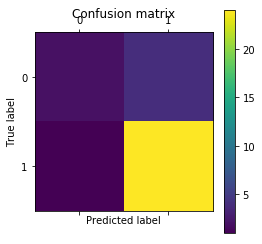

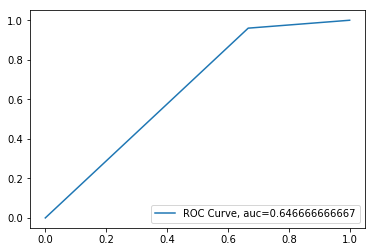

N_Neighbours:   7 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


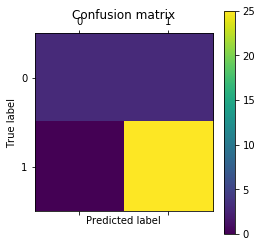

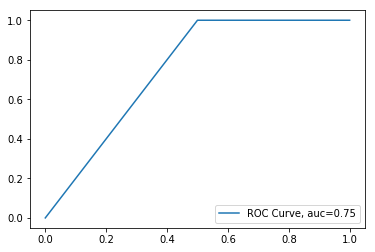

N_Neighbours:   7 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


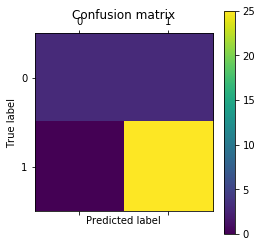

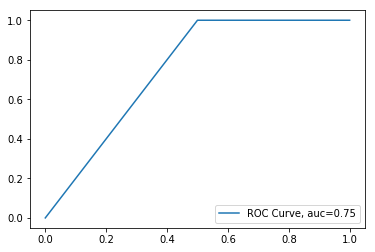

N_Neighbours:   7 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.67      0.33      0.44         6
          1       0.86      0.96      0.91        25

avg / total       0.82      0.84      0.82        31

[[ 2  4]
 [ 1 24]]


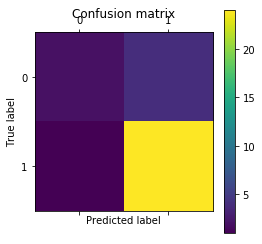

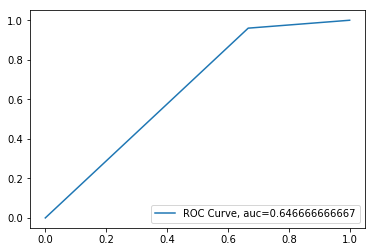

N_Neighbours:   7 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


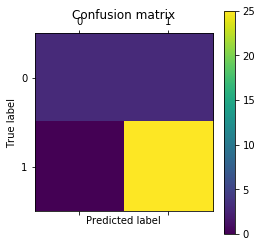

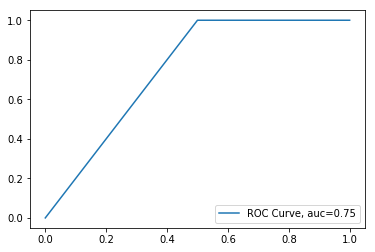

N_Neighbours:   7 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


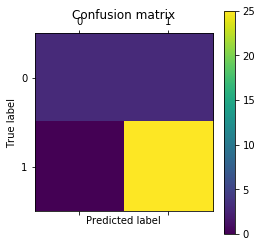

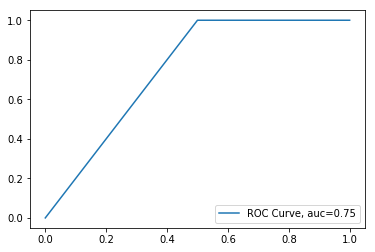

N_Neighbours:   7 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.67      0.33      0.44         6
          1       0.86      0.96      0.91        25

avg / total       0.82      0.84      0.82        31

[[ 2  4]
 [ 1 24]]


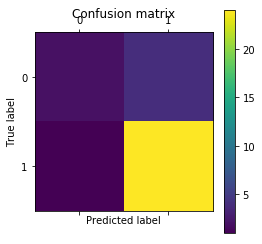

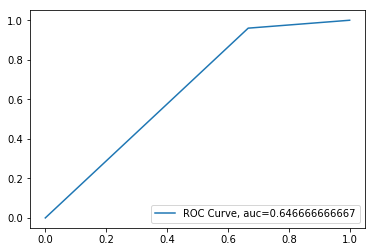

N_Neighbours:   7 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


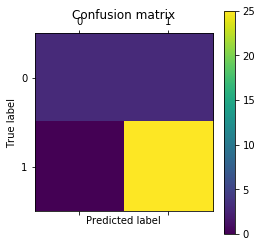

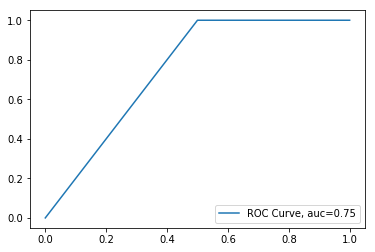

N_Neighbours:   7 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


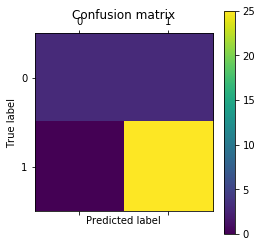

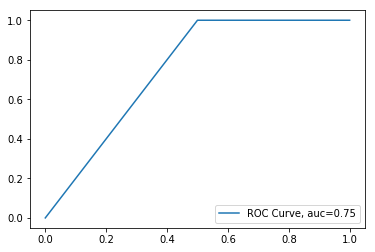

N_Neighbours:   7 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.67      0.33      0.44         6
          1       0.86      0.96      0.91        25

avg / total       0.82      0.84      0.82        31

[[ 2  4]
 [ 1 24]]


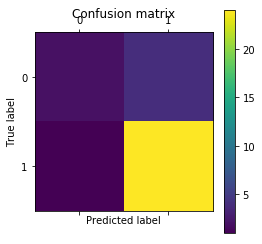

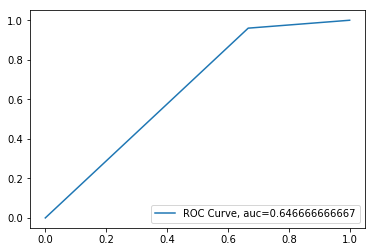

N_Neighbours:   7 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


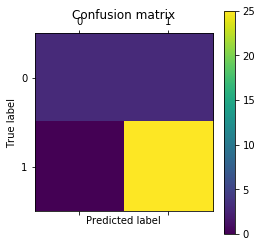

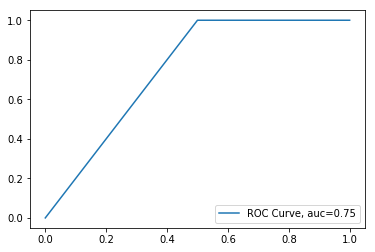

N_Neighbours:   7 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


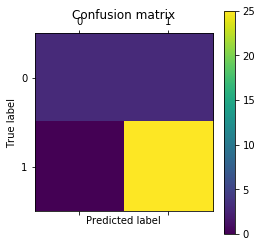

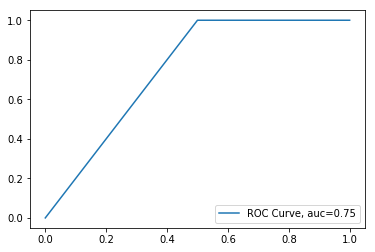

N_Neighbours:   7 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.838709677419
             precision    recall  f1-score   support

          0       0.67      0.33      0.44         6
          1       0.86      0.96      0.91        25

avg / total       0.82      0.84      0.82        31

[[ 2  4]
 [ 1 24]]


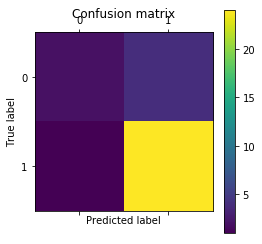

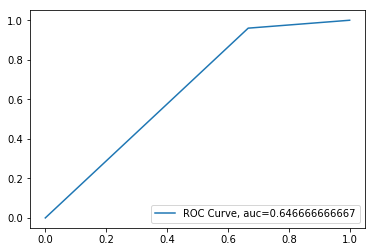

N_Neighbours:   8 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


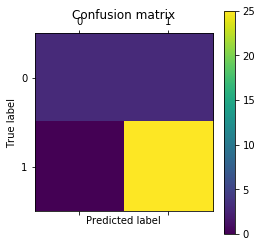

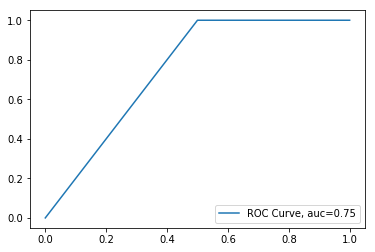

N_Neighbours:   8 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.935483870968
             precision    recall  f1-score   support

          0       1.00      0.67      0.80         6
          1       0.93      1.00      0.96        25

avg / total       0.94      0.94      0.93        31

[[ 4  2]
 [ 0 25]]


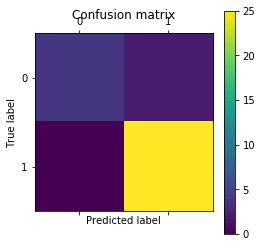

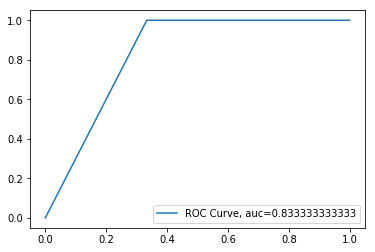

N_Neighbours:   8 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


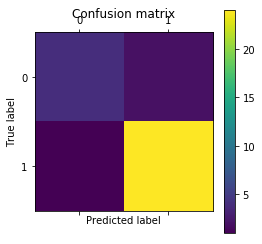

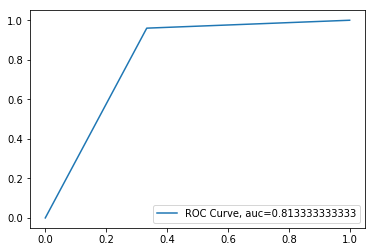

N_Neighbours:   8 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


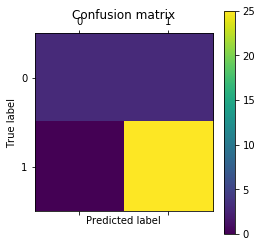

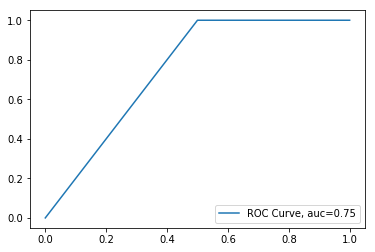

N_Neighbours:   8 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


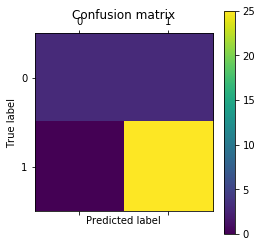

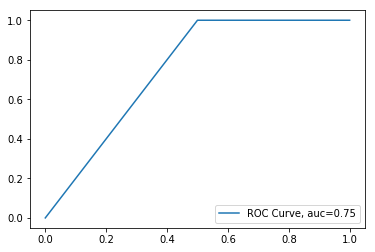

N_Neighbours:   8 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


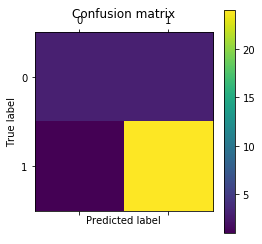

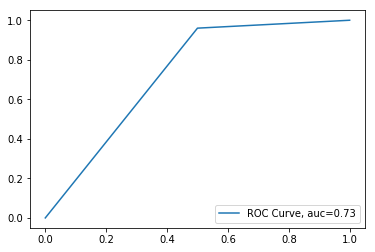

N_Neighbours:   8 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


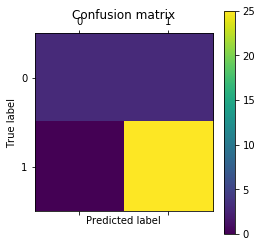

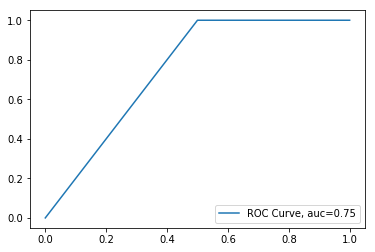

N_Neighbours:   8 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.935483870968
             precision    recall  f1-score   support

          0       1.00      0.67      0.80         6
          1       0.93      1.00      0.96        25

avg / total       0.94      0.94      0.93        31

[[ 4  2]
 [ 0 25]]


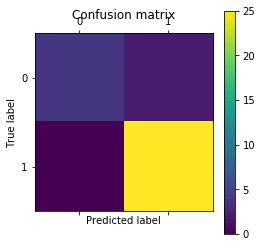

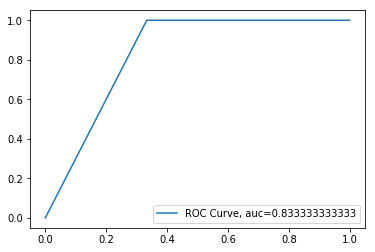

N_Neighbours:   8 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


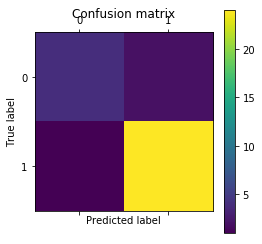

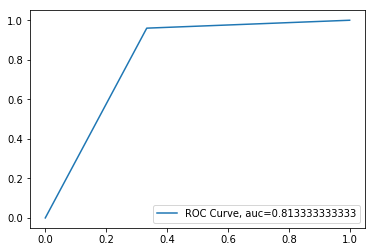

N_Neighbours:   8 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


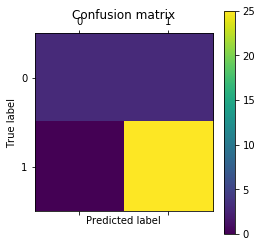

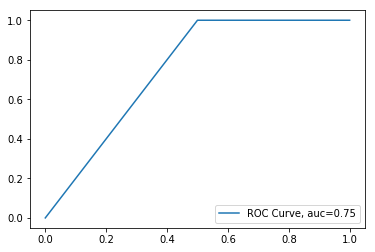

N_Neighbours:   8 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


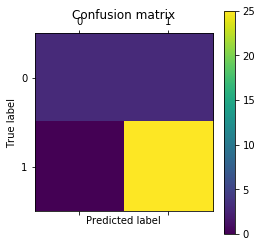

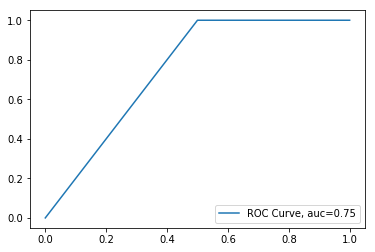

N_Neighbours:   8 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


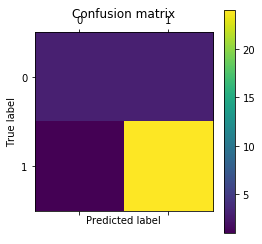

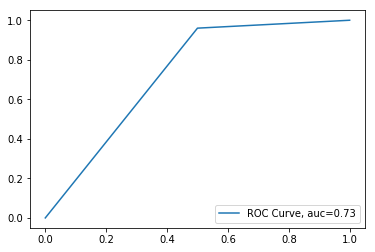

N_Neighbours:   8 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


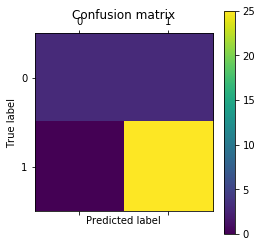

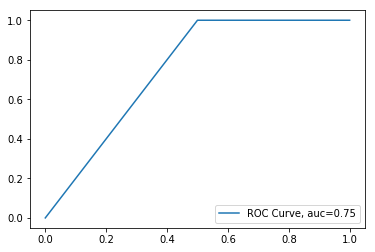

N_Neighbours:   8 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.935483870968
             precision    recall  f1-score   support

          0       1.00      0.67      0.80         6
          1       0.93      1.00      0.96        25

avg / total       0.94      0.94      0.93        31

[[ 4  2]
 [ 0 25]]


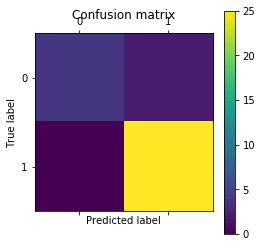

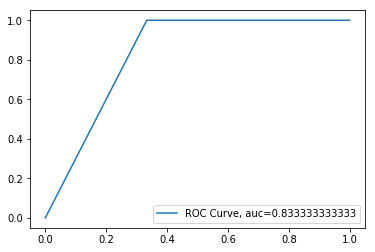

N_Neighbours:   8 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


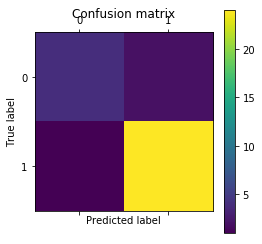

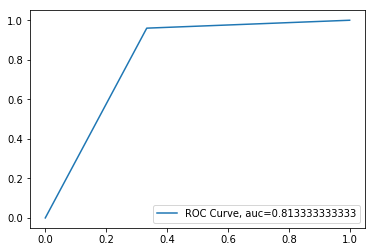

N_Neighbours:   8 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


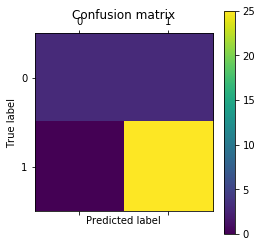

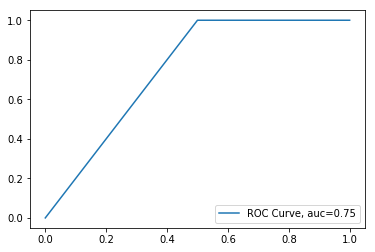

N_Neighbours:   8 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


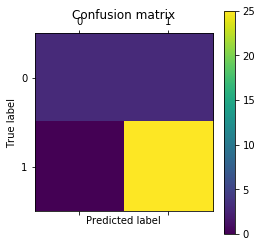

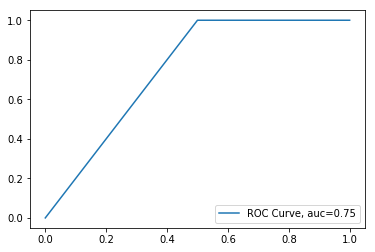

N_Neighbours:   8 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


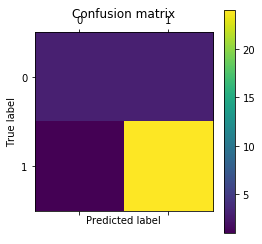

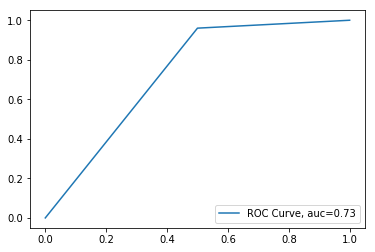

N_Neighbours:   8 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


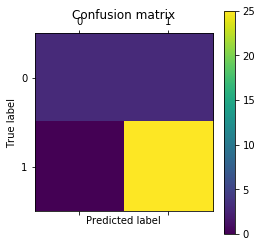

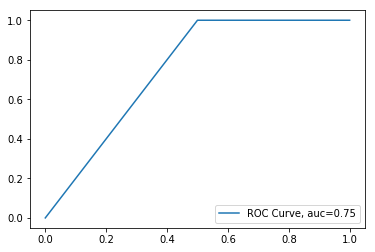

N_Neighbours:   8 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.935483870968
             precision    recall  f1-score   support

          0       1.00      0.67      0.80         6
          1       0.93      1.00      0.96        25

avg / total       0.94      0.94      0.93        31

[[ 4  2]
 [ 0 25]]


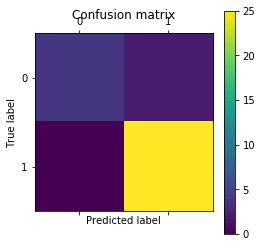

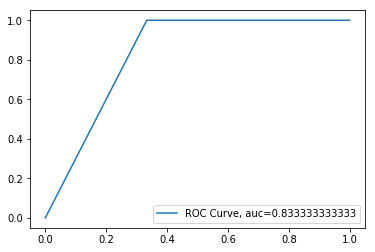

N_Neighbours:   8 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


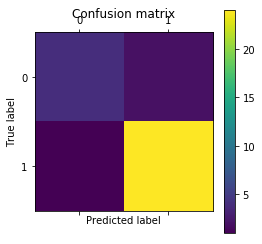

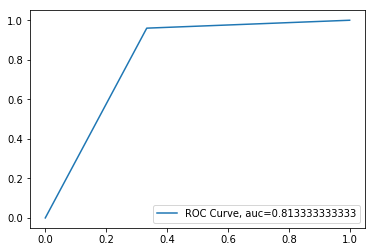

N_Neighbours:   8 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


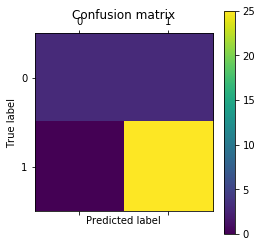

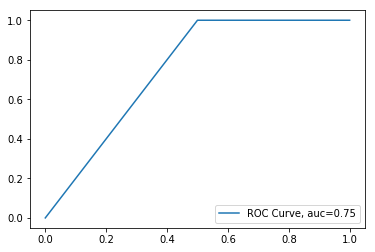

N_Neighbours:   8 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


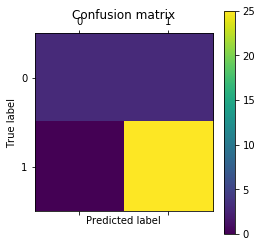

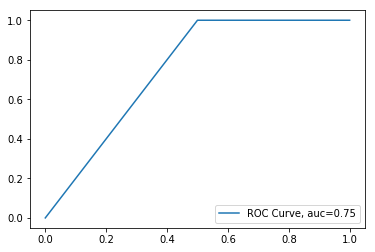

N_Neighbours:   8 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.870967741935
             precision    recall  f1-score   support

          0       0.75      0.50      0.60         6
          1       0.89      0.96      0.92        25

avg / total       0.86      0.87      0.86        31

[[ 3  3]
 [ 1 24]]


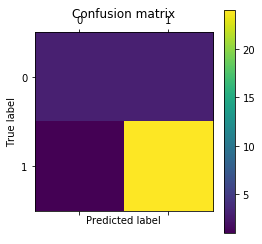

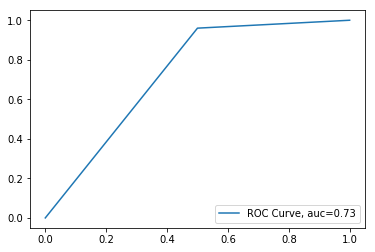

N_Neighbours:   9 , Algo:  auto , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


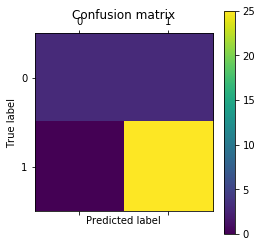

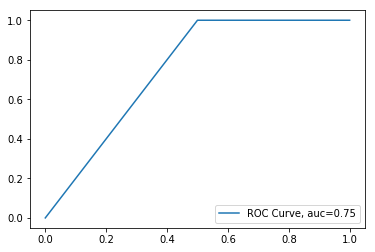

N_Neighbours:   9 , Algo:  auto , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


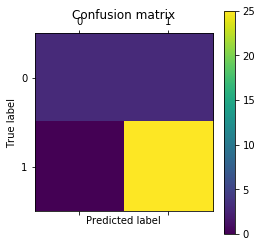

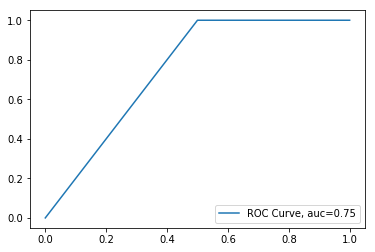

N_Neighbours:   9 , Algo:  auto , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


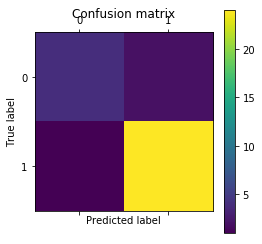

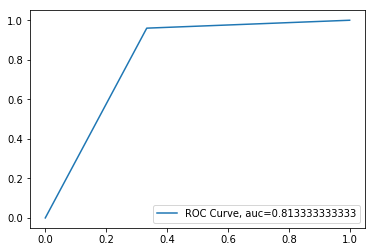

N_Neighbours:   9 , Algo:  auto , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


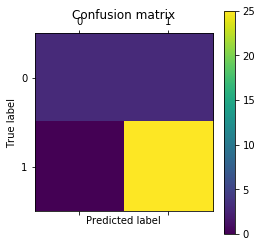

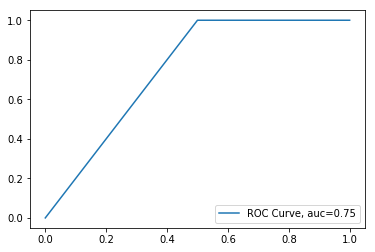

N_Neighbours:   9 , Algo:  auto , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


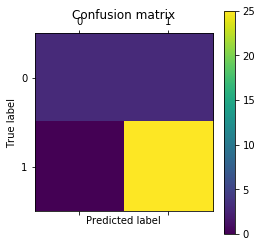

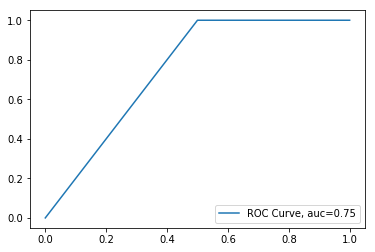

N_Neighbours:   9 , Algo:  auto , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


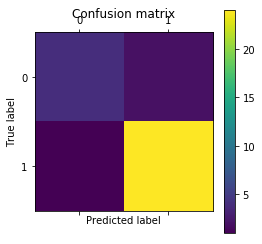

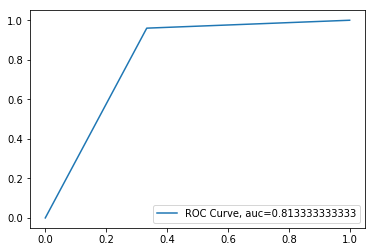

N_Neighbours:   9 , Algo:  brute , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


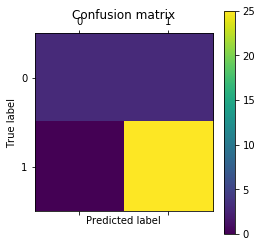

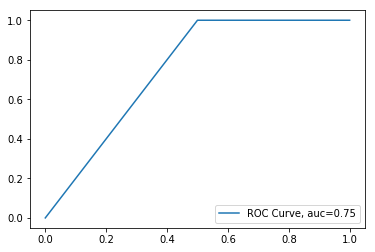

N_Neighbours:   9 , Algo:  brute , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


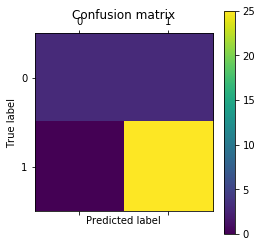

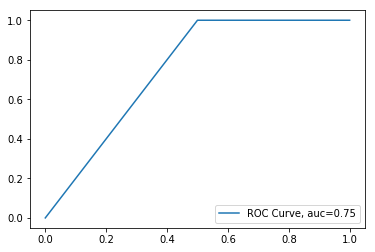

N_Neighbours:   9 , Algo:  brute , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


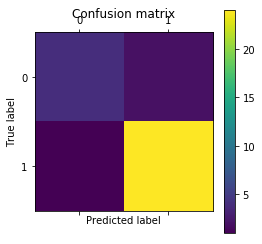

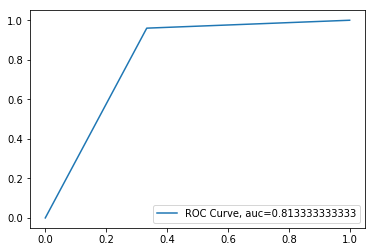

N_Neighbours:   9 , Algo:  brute , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


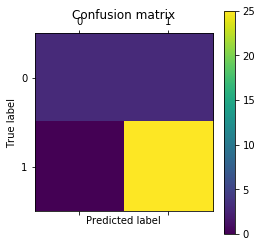

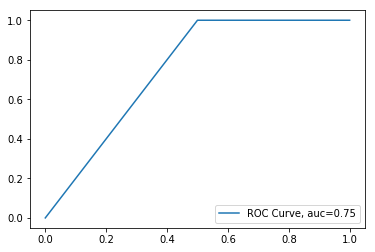

N_Neighbours:   9 , Algo:  brute , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


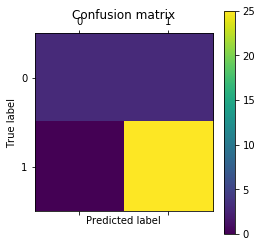

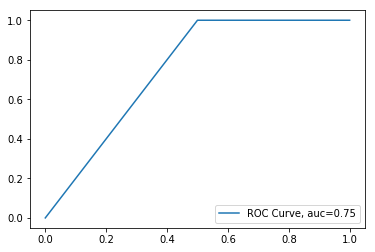

N_Neighbours:   9 , Algo:  brute , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


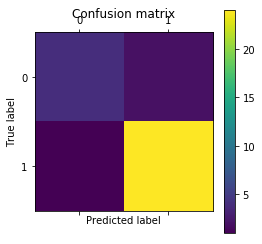

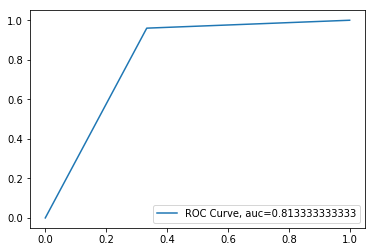

N_Neighbours:   9 , Algo:  ball_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


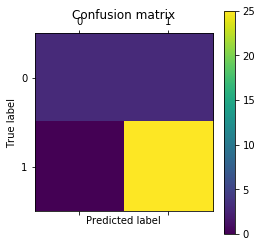

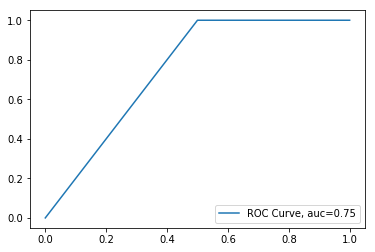

N_Neighbours:   9 , Algo:  ball_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


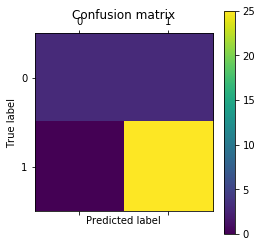

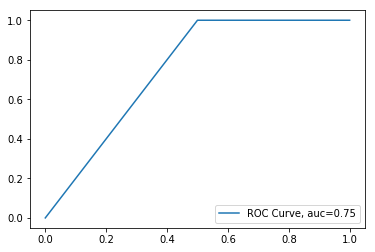

N_Neighbours:   9 , Algo:  ball_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


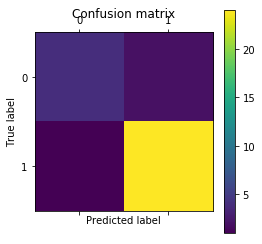

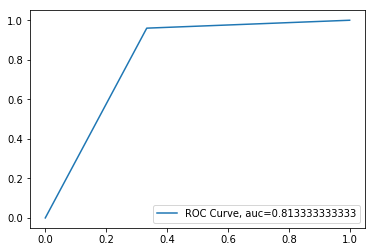

N_Neighbours:   9 , Algo:  ball_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


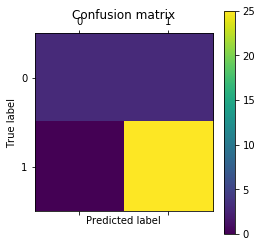

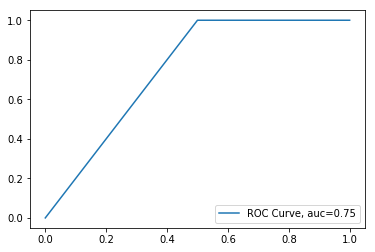

N_Neighbours:   9 , Algo:  ball_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


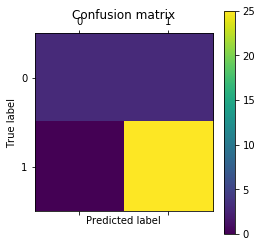

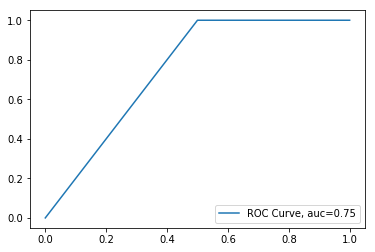

N_Neighbours:   9 , Algo:  ball_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


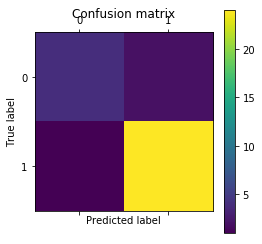

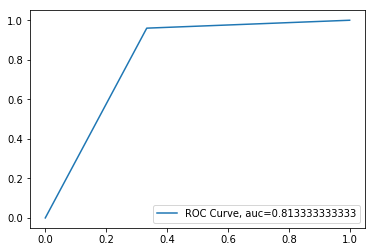

N_Neighbours:   9 , Algo:  kd_tree , weight:  uniform , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


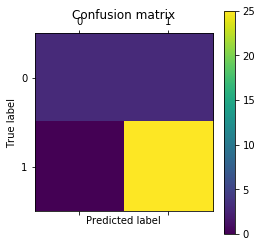

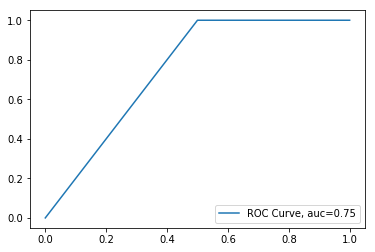

N_Neighbours:   9 , Algo:  kd_tree , weight:  uniform , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


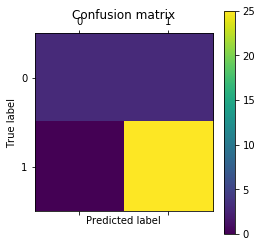

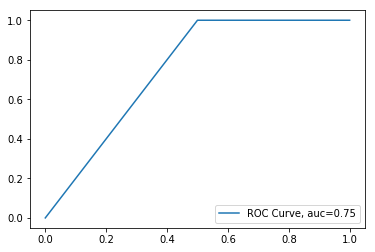

N_Neighbours:   9 , Algo:  kd_tree , weight:  uniform , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


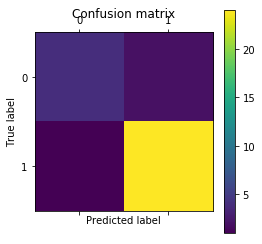

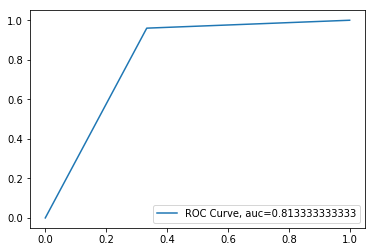

N_Neighbours:   9 , Algo:  kd_tree , weight:  distance , PowerParameter:  1
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


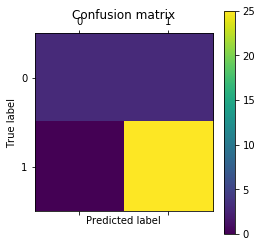

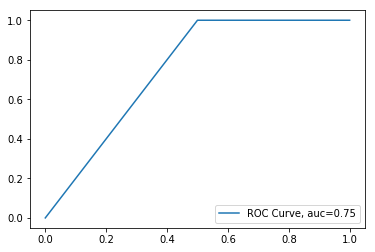

N_Neighbours:   9 , Algo:  kd_tree , weight:  distance , PowerParameter:  2
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       1.00      0.50      0.67         6
          1       0.89      1.00      0.94        25

avg / total       0.91      0.90      0.89        31

[[ 3  3]
 [ 0 25]]


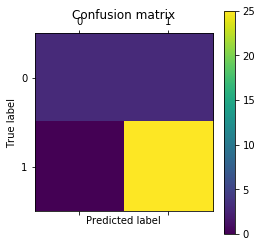

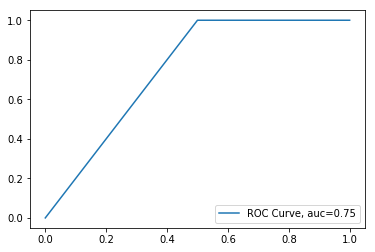

N_Neighbours:   9 , Algo:  kd_tree , weight:  distance , PowerParameter:  3
Accuracy: 0.903225806452
             precision    recall  f1-score   support

          0       0.80      0.67      0.73         6
          1       0.92      0.96      0.94        25

avg / total       0.90      0.90      0.90        31

[[ 4  2]
 [ 1 24]]


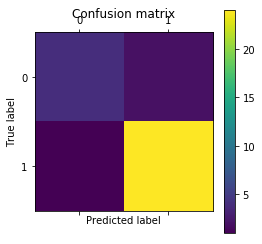

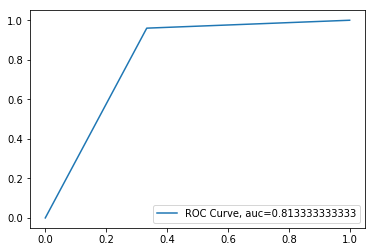

In [87]:
pp = [1,2,3] #power parameter
w= np.array(['uniform','distance']) #weight
alg = np.array(['auto','brute','ball_tree','kd_tree']) #algo
for i in range(1,10):
    for j in alg:
        for k in w:
            for power_param in pp:
                knn = KNeighborsClassifier(n_neighbors=i, algorithm=j, weights = k,p = power_param)
                knn.fit(x_trn_n, y_train)
                y_pred = knn.predict(x_tst_n)
                print("N_Neighbours:  ", i , ', Algo: ', j , ', weight: ', k, ', PowerParameter: ', power_param)
                print("Accuracy:",metrics.accuracy_score(y_test, y_pred))            
                print(classification_report(y_test, y_pred))   
                cm = confusion_matrix(y_test, y_pred)
                print(cm)
                plt.matshow(cm)
                plt.title('Confusion matrix')
                plt.colorbar()
                plt.ylabel('True label')
                plt.xlabel('Predicted label')
                plt.show()
                print('\n')

                #fpr, tpr, thresholds = roc_curve(hp_ytest, hp_ypred)
                #plt.plot(fpr, tpr, lw=1, alpha=0.3,label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
                fpr, tpr, thresholds = roc_curve(y_test, y_pred)
                auc = roc_auc_score(y_test, y_pred)
                plt.plot(fpr,tpr,label="ROC Curve, auc="+str(auc))
                plt.legend(loc=4)
                plt.show()

#  RadiusNeightbors Classifier

In [103]:
from sklearn.neighbors import RadiusNeighborsClassifier

rn_model = RadiusNeighborsClassifier(radius=11)
rn_model.fit(x_trn_n, y_train)
y_pred = rn_model.predict(x_tst_n)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))


Accuracy: 0.806451612903
             precision    recall  f1-score   support

          0       0.00      0.00      0.00         6
          1       0.81      1.00      0.89        25

avg / total       0.65      0.81      0.72        31

